In [1]:
import luminaire
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from cloudpickle import dump, load
from itertools import product
from json import dumps, loads
from pathlib import Path
from pprint import pprint

from luminaire.exploration.data_exploration import DataExploration
from luminaire.model.lad_filtering import LADFilteringModel
from luminaire.model.lad_structural import LADStructuralModel
from luminaire.optimization.hyperparameter_optimization import HyperparameterOptimization
from tqdm.autonotebook import tqdm
from tqdm.contrib.logging import logging_redirect_tqdm

In [ ]:
datasets_selection = [
    "silver.activity_powercurve",
    "silver.activity_saved",
    "silver.campaign_progress",
    "silver.groupride_signup",
    "silver.meetup",
    "silver.new_user_sport_select",
    # "silver.race_result",
    # "silver.route_result",
    "silver.segment_log_out",
    "silver.segment_result",
    "silver.subscription",
    "silver.training_plans",
    "silver.workout_analytics",
]

def datasets_filter(path: Path):
    return any(str(path).endswith(x) for x in datasets_selection)

In [ ]:
INPUT_PATH = Path("data/v2_distincts/ts_data")
OUTPUT_PATH = Path("data/v2_distincts/output")

In [4]:
ALL_DATASETS = sorted(INPUT_PATH.iterdir())

selected_datasets = sorted(filter(datasets_filter, ALL_DATASETS))

PARAMS_DAY_RANGE = list(range(1, 8))
PARAMS_IS_LOG = [False, True]
PARAMS_WEEKLY_MODEL = [False, True]

PARAM_NAMES = [
    "dataset_path",
    "param_days_range",
    "param_is_log",
    "param_weekly_model",
]

PARAM_LIST = list(
    map(
        lambda x: dict(zip(PARAM_NAMES, x)),
        product(
            selected_datasets,
            PARAMS_DAY_RANGE,
            PARAMS_IS_LOG,
            PARAMS_WEEKLY_MODEL,
        )
    )
)
print(len(PARAM_LIST))
pprint(PARAM_LIST[:4])

308
[{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
  'param_days_range': 1,
  'param_is_log': False,
  'param_weekly_model': False},
 {'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
  'param_days_range': 1,
  'param_is_log': False,
  'param_weekly_model': True},
 {'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
  'param_days_range': 1,
  'param_is_log': True,
  'param_weekly_model': False},
 {'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
  'param_days_range': 1,
  'param_is_log': True,
  'param_weekly_model': True}]


In [5]:
def load_dataset(dataset_path, param_days_range, param_is_log, param_weekly_model):
    ts = (
        pd
        .read_parquet(dataset_path)
        .rename(columns={
            "numeric_value": "raw",
            "record_date": "index",
        })
        .set_index(["full_name", "index"])
        .sort_index()
        .loc[str(dataset_path).split("=")[-1], ["raw"]]
    )

    ts_final = ts
    if param_is_log:
        ts_final = np.log10(ts + 1)

    if param_weekly_model:
        param_days_range = 8

    past = ts.head(len(ts) - param_days_range)
    today = ts.tail(param_days_range)
    if not param_weekly_model:
        today = today.head(1)
    
    past.plot.line()
    plt.show()
    
    return past, today

def train(past):
    hopt_obj = HyperparameterOptimization(freq='D')
    opt_config = hopt_obj.run(data=past)

    de_obj = DataExploration(freq='D', **opt_config)
    training_data, pre_prc = de_obj.profile(past)

    model_class_name = opt_config['LuminaireModel']
    model_module = __import__('luminaire.model', fromlist=[''])
    model_class = getattr(model_module, model_class_name)

    model_object = model_class(hyper_params=opt_config, freq='D')
    success, model_date, trained_model = model_object.train(data=training_data, **pre_prc)

    if success:
        return trained_model

    
def infer(data_dict, model=None):
    if model is None:
        return "NO MODEL"
    
    observed_value = data_dict["raw"]
    pred_date = data_dict["index"].isoformat()
    print(observed_value, pred_date)
    
    returned_model = None
    if isinstance(model, LADFilteringModel):
        print("caso1")
        result, returned_model = model.score(observed_value, pred_date)
    else: 
        print("caso2")
        result = model.score(observed_value, pred_date)
    print(result)
    
    if result and result["Success"]:
        if result["IsAnomaly"]:
            return "DATA ANOMALY"
        else:
            return "DATA OK"
    else:
        return "PREDICTION FAILED"

In [6]:
def dump_results(result):
    def get_folder_name_for_param(dataset_path=None, param_days_range=None, param_is_log=None, param_weekly_model=None):      
        parts = [
            str(dataset_path).split('=')[-1].replace(".", "_"),
            "_".join(['param_days_range', str(param_days_range)]),
            "_".join(['param_is_log', str(param_is_log)]),
            "_".join(['param_weekly_model', str(param_weekly_model)]),
        ]
        
        return "__".join(parts)
    
    output_path_str = get_folder_name_for_param(**result["params"])
    output_path: Path = OUTPUT_PATH / output_path_str
    output_path.mkdir(exist_ok=True)
    
    result["past"].to_parquet(output_path / "past_df.parquet")
    result["today"].to_parquet(output_path / "today_df.parquet")
    result["prediction"].to_csv(output_path / "prediction.csv.gz")
    
    with (output_path / "model.pkl").open("wb+") as f:
        dump(result["model_obj"], f)
        
    (output_path / "params.json").write_text(dumps(result["params"], default=str))    

In [7]:
def run(**kwargs):
    print("="*100)
    pprint(kwargs)
    assert all([kwargs[x] is not None for x in PARAM_NAMES]), "some run argument is None"
    
    dataset_path = kwargs["dataset_path"]
    param_days_range = kwargs["param_days_range"]
    param_is_log = kwargs["param_is_log"]
    param_weekly_model = kwargs["param_weekly_model"]
    
    print("Loading...")
    past, today = load_dataset(dataset_path, param_days_range, param_is_log, param_weekly_model)
    print("Training...")
    model_obj = train(past)
    print("Prediction...")
    prediction = today.reset_index().apply(infer, axis=1, model=model_obj)
    
    results = {
        "params": kwargs,
        "past": past,
        "today": today,
        "model_obj": model_obj,
        "prediction": prediction,
    }
    
    dump_results(results)

  0%|          | 0/308 [00:00<?, ?it/s]

{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 1,
 'param_is_log': False,
 'param_weekly_model': False}
Loading...


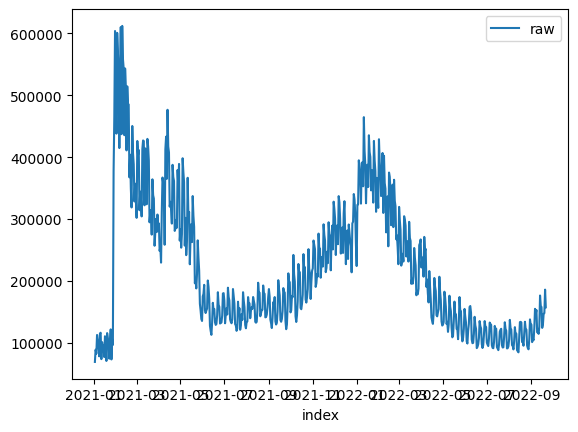

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:34<00:00,  5.50s/trial, best loss: 0.13316184851365362]
Prediction...
36351.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.501004502080823, 'LogTransformedPrediction': 11.932940353089917, 'LogTransformedStdErr': 0.12924905848626678, 'LogTransformedCILower': 11.720344570458717, 'LogTransformedCIUpper': 12.145536135721116, 'AdjustedActual': 36351.0, 'Prediction': 153474.00711418237, 'StdErr': 19919.632979942213, 'CILower': 120709.12655958226, 'CIUpper': 186238.8876687825, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 0.9999999958918133, 'DownAnomalyProbability': 0.9999999979459067, 'UpAnomalyProbability': 2.0540933209004384e-09, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2

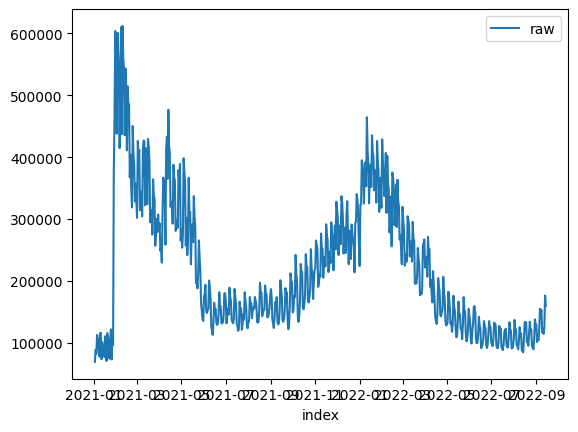

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:46<00:00,  5.72s/trial, best loss: 0.15880181712416364]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157686.0, 'Prediction': 149614.04502937105, 'StdErr': 30514.07708183322, 'CILower': 99422.85466824088, 'CIUpper': 199805.2353905012, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.20863011928716446, 'DownAnomalyProbability': 0.39568494035641777, 'UpAnomalyProbability': 0.6043150596435822, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 109605.63371906211, 'StdErr': 31367.27191894649, 'CILower': 58011.062735609914, 'CIUpper': 161200.2047025143, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnoma

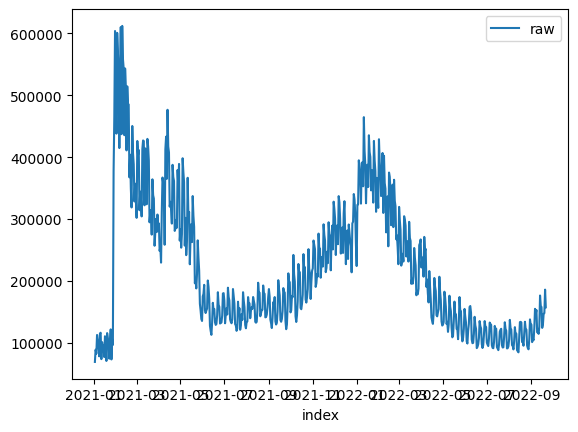

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:25<00:00,  5.32s/trial, best loss: 0.11430436044943697]
Prediction...
36351.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.501004502080823, 'LogTransformedPrediction': 11.98265079230042, 'LogTransformedStdErr': 0.10681947667319552, 'LogTransformedCILower': 11.806948388665457, 'LogTransformedCIUpper': 12.158353195935383, 'AdjustedActual': 36351.0, 'Prediction': 160869.66410722677, 'StdErr': 17233.256302752237, 'CILower': 132523.47997346043, 'CIUpper': 189215.8482409931, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 0.9999999999995006, 'DownAnomalyProbability': 0.9999999999997503, 'UpAnomalyProbability': 2.4965518131449526e-13, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_

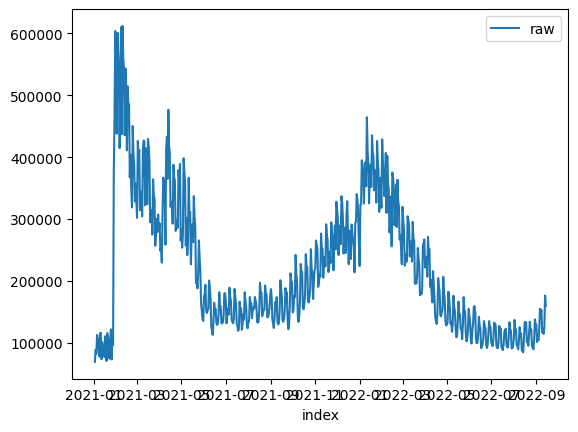

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [02:10<00:00,  2.61s/trial, best loss: 0.16719806929266118]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.968367334550008, 'LogTransformedPrediction': 11.897799805704665, 'LogTransformedStdErr': 0.1009263613446265, 'LogTransformedCILower': 11.731790714191941, 'LogTransformedCIUpper': 12.063808897217388, 'AdjustedActual': 157686.00000000006, 'Prediction': 147692.26538688887, 'StdErr': 14944.183528334424, 'CILower': 123111.27090847955, 'CIUpper': 172273.2598652982, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4963370019484392, 'DownAnomalyProbability': 0.2518314990257804, 'UpAnomalyProbability': 0.7481685009742196, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2


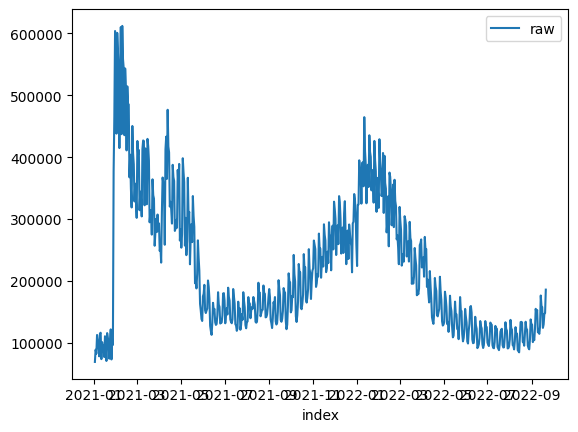

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:32<00:00,  5.44s/trial, best loss: 0.14317356494571826]
Prediction...
157353.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.96625332320535, 'LogTransformedPrediction': 11.916383690905837, 'LogTransformedStdErr': 0.13790648687927276, 'LogTransformedCILower': 11.68954770578233, 'LogTransformedCIUpper': 12.143219676029345, 'AdjustedActual': 157352.9999999999, 'Prediction': 151128.56442936286, 'StdErr': 20941.234160785287, 'CILower': 116683.2994671551, 'CIUpper': 185573.82939157062, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2337117248970073, 'DownAnomalyProbability': 0.38314413755149634, 'UpAnomalyProbability': 0.6168558624485037, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath(

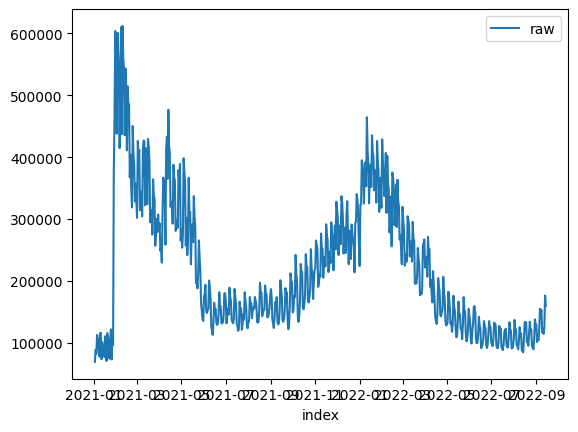

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [02:06<00:00,  2.54s/trial, best loss: 0.17366906214062716]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.968367334550008, 'LogTransformedPrediction': 11.98548961043484, 'LogTransformedStdErr': 0.09973961446072084, 'LogTransformedCILower': 11.821432543838382, 'LogTransformedCIUpper': 12.149546677031298, 'AdjustedActual': 157686.00000000006, 'Prediction': 161209.074787139, 'StdErr': 16119.102218323602, 'CILower': 134695.5110401279, 'CIUpper': 187722.6385341501, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.17301123564306886, 'DownAnomalyProbability': 0.5865056178215344, 'UpAnomalyProbability': 0.41349438217846557, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{

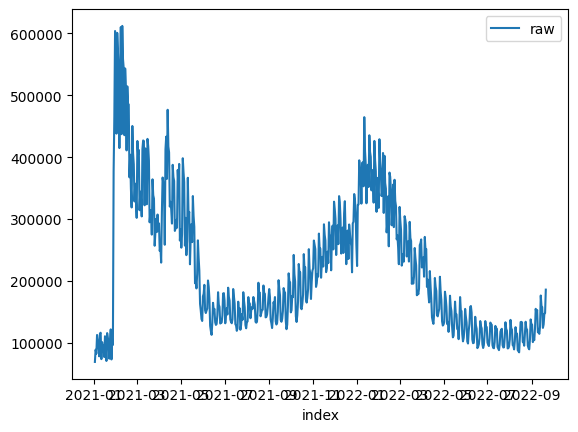

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:21<00:00,  5.24s/trial, best loss: 0.1438355142969121]
Prediction...
157353.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.96625332320535, 'LogTransformedPrediction': 11.965582893530387, 'LogTransformedStdErr': 0.14261353621607875, 'LogTransformedCILower': 11.731004501232995, 'LogTransformedCIUpper': 12.200161285827779, 'AdjustedActual': 157352.9999999999, 'Prediction': 158854.80832757088, 'StdErr': 22770.670967839556, 'CILower': 121400.3875980014, 'CIUpper': 196309.22905714036, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.05258525426665672, 'DownAnomalyProbability': 0.5262926271333284, 'UpAnomalyProbability': 0.47370737286667164, 'ModelFreshness': 0.2}
{'dataset_path': PosixPat

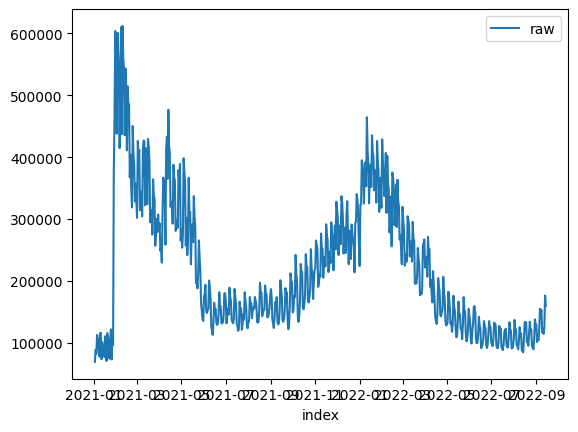

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:15<00:00,  5.10s/trial, best loss: 0.17866702487730934]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157686.0, 'Prediction': 149614.04502937105, 'StdErr': 30514.07708183322, 'CILower': 99422.85466824088, 'CIUpper': 199805.2353905012, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.20863011928716446, 'DownAnomalyProbability': 0.39568494035641777, 'UpAnomalyProbability': 0.6043150596435822, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 109605.63371906211, 'StdErr': 31367.27191894649, 'CILower': 58011.062735609914, 'CIUpper': 161200.2047025143, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnoma

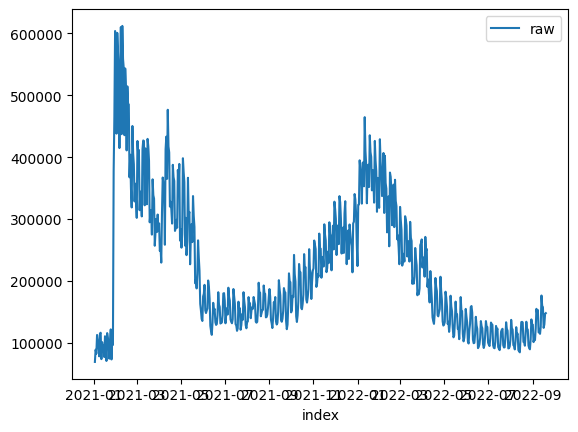

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:00<00:00,  4.80s/trial, best loss: 1e+100]
Prediction...
185906.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 185906.0, 'Prediction': 192118.63255187386, 'StdErr': 26765.243476681346, 'CILower': 148093.7247430153, 'CIUpper': 236143.5403607324, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.18355182943925774, 'DownAnomalyProbability': 0.5917759147196289, 'UpAnomalyProbability': 0.40822408528037113, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


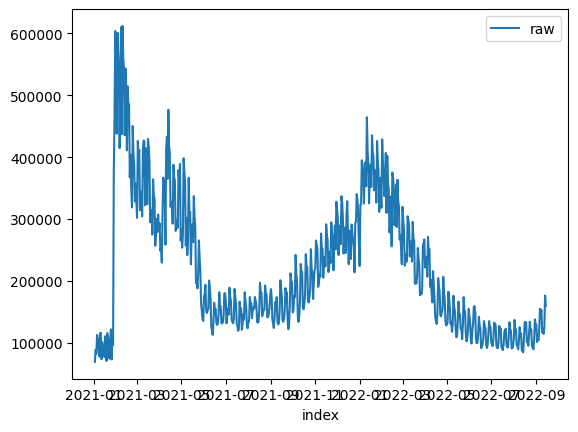

Training...

100%|██████████████████████████████████████| 50/50 [04:08<00:00,  4.97s/trial, best loss: 0.2131998053414031]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157686.0, 'Prediction': 151436.13576807466, 'StdErr': 29118.73484066574, 'CILower': 103540.07915316742, 'CIUpper': 199332.19238298188, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1699471477683725, 'DownAnomalyProbability': 0.41502642611581375, 'UpAnomalyProbability': 0.5849735738841862, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 109582.49382757102, 'StdErr': 29265.293630314645, 'CILower': 61445.36945594815, 'CIUpper': 157719.61819919388, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.380899023551426, 'DownAnomalyProbability': 0.309550488224287, '

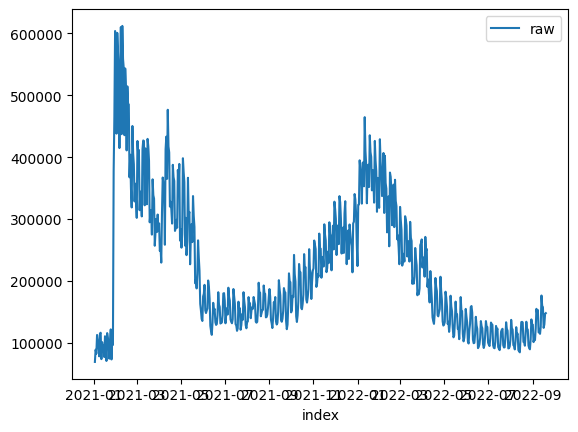

Training...

100%|██████████████████████████████████████████████████| 50/50 [03:12<00:00,  3.85s/trial, best loss: 1e+100]
Prediction...
185906.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 185906.0, 'Prediction': 177763.5224663707, 'StdErr': 6353.531385132211, 'CILower': 167312.89332358597, 'CIUpper': 188214.1516091554, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8000054934575915, 'DownAnomalyProbability': 0.09999725327120423, 'UpAnomalyProbability': 0.9000027467287958, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 3,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


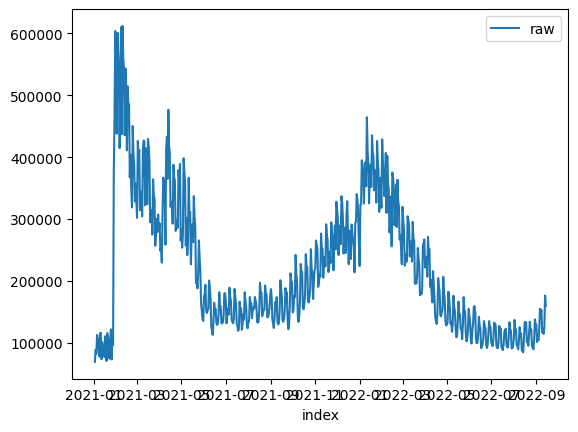

Training...

100%|█████████████████████████████████████| 50/50 [04:32<00:00,  5.46s/trial, best loss: 0.16228955933757086]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157686.0, 'Prediction': 153299.20190348243, 'StdErr': 26792.07506632441, 'CILower': 109230.16005708263, 'CIUpper': 197368.24374988224, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.13006016864438052, 'DownAnomalyProbability': 0.43496991567780974, 'UpAnomalyProbability': 0.5650300843221903, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 114559.62186751902, 'StdErr': 26792.623766650482, 'CILower': 70489.67748939776, 'CIUpper': 158629.56624564028, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2790873320385956, 'DownAnomalyProbability': 0.3604563339807022

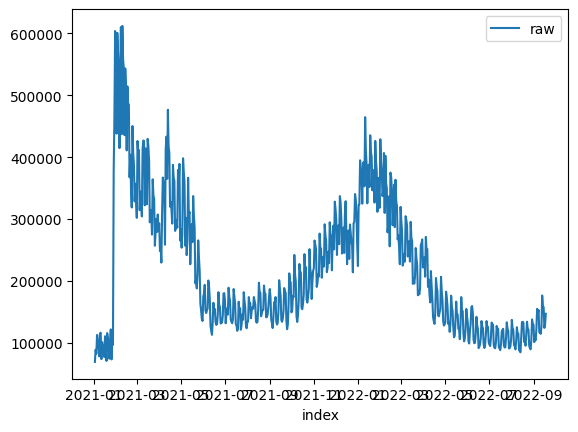

Training...

100%|█████████████████████████████████████| 50/50 [03:20<00:00,  4.00s/trial, best loss: 0.13273284388896778]
Prediction...
147913.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.90438630277213, 'LogTransformedPrediction': 11.950196828327897, 'LogTransformedStdErr': 0.08981702282358825, 'LogTransformedCILower': 11.802460972574535, 'LogTransformedCIUpper': 12.09793268408126, 'AdjustedActual': 147913.00000000003, 'Prediction': 155472.46875762608, 'StdErr': 13992.374049099284, 'CILower': 132457.06155330347, 'CIUpper': 178487.87596194868, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.41097973494681916, 'DownAnomalyProbability': 0.7054898674734096, 'UpAnomalyProbability': 0.29451013252659036, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 4,
 'param_is_log': False,
 'param_we

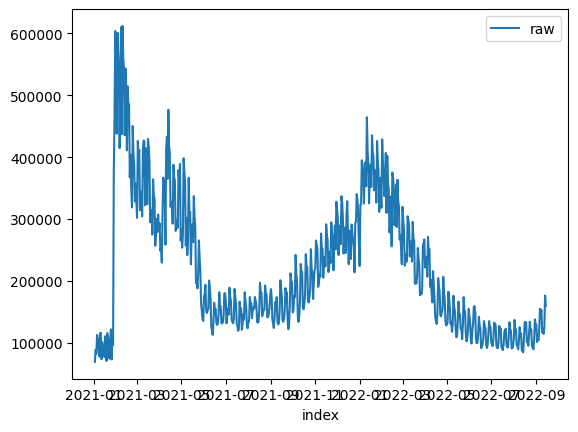

Training...

100%|█████████████████████████████████████| 50/50 [04:36<00:00,  5.52s/trial, best loss: 0.16572683549621342]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.968367334550008, 'LogTransformedPrediction': 11.96637394836416, 'LogTransformedStdErr': 0.10518543502116795, 'LogTransformedCILower': 11.793359304067122, 'LogTransformedCIUpper': 12.139388592661197, 'AdjustedActual': 157686.00000000006, 'Prediction': 158244.9799041491, 'StdErr': 16691.31898135423, 'CILower': 130790.20333906464, 'CIUpper': 185699.75646923357, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.02671556888190474, 'DownAnomalyProbability': 0.5133577844409524, 'UpAnomalyProbability': 0.48664221555904763, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.729100794520692, 'LogTransformedPrediction': 11.752

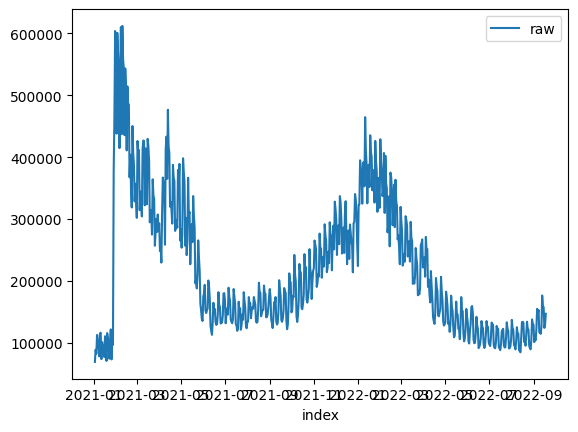

Training...

100%|█████████████████████████████████████| 50/50 [04:24<00:00,  5.29s/trial, best loss: 0.10288463190677812]
Prediction...
147913.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.90438630277213, 'LogTransformedPrediction': 12.009971765792312, 'LogTransformedStdErr': 0.09837368196894461, 'LogTransformedCILower': 11.848161458209121, 'LogTransformedCIUpper': 12.171782073375502, 'AdjustedActual': 147913.00000000003, 'Prediction': 165182.2027192281, 'StdErr': 16289.07281404031, 'CILower': 138389.06222137727, 'CIUpper': 191975.34321707895, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7109331911650711, 'DownAnomalyProbability': 0.8554665955825356, 'UpAnomalyProbability': 0.14453340441746437, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 4,
 'param_is_log': True,
 'param_weekl

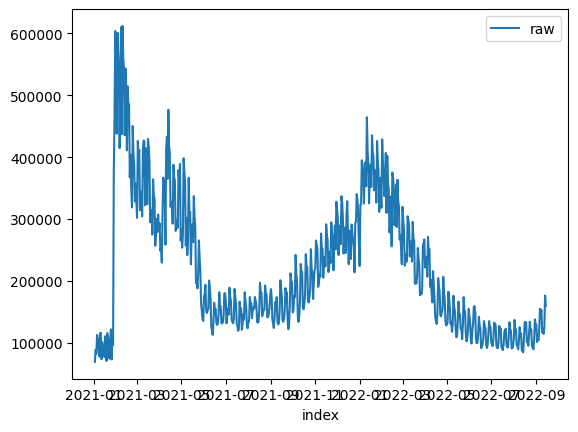

Training...

100%|█████████████████████████████████████| 50/50 [03:32<00:00,  4.24s/trial, best loss: 0.18400576368525298]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157686.0, 'Prediction': 151183.0222897641, 'StdErr': 32237.707958559677, 'CILower': 98156.71142952488, 'CIUpper': 204209.33315000334, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1598640647919325, 'DownAnomalyProbability': 0.42006796760403375, 'UpAnomalyProbability': 0.5799320323959662, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 112295.91249556984, 'StdErr': 33586.913559803965, 'CILower': 57050.3559086207, 'CIUpper': 167541.46908251898, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2754406932162907, 'DownAnomalyProbability': 0.36227965339185464, 

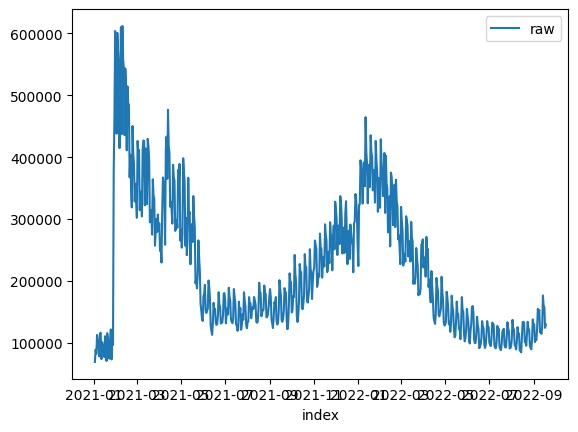

Training...

100%|█████████████████████████████████████| 50/50 [04:46<00:00,  5.73s/trial, best loss: 0.09929012476807234]
Prediction...
146887.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.897425670602022, 'LogTransformedPrediction': 11.750058037185402, 'LogTransformedStdErr': 0.10168407317383495, 'LogTransformedCILower': 11.582802620622221, 'LogTransformedCIUpper': 11.917313453748584, 'AdjustedActual': 146886.99999999988, 'Prediction': 127416.94433488215, 'StdErr': 12989.938929965745, 'CILower': 106050.39617204986, 'CIUpper': 148783.49249771444, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.866089161881648, 'DownAnomalyProbability': 0.06695541905917601, 'UpAnomalyProbability': 0.933044580940824, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 5,
 'param_is_log': False,
 'param_wee

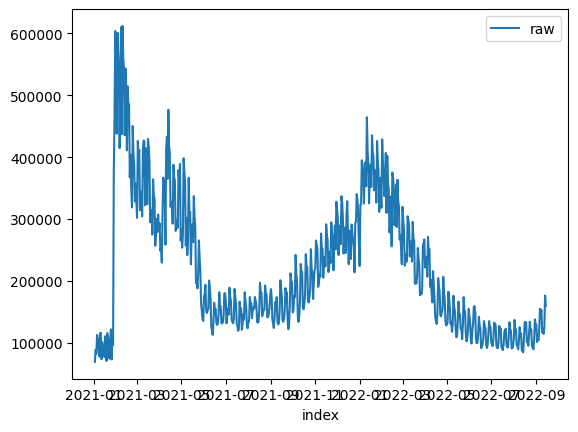

Training...

100%|█████████████████████████████████████| 50/50 [04:05<00:00,  4.92s/trial, best loss: 0.15559670013118929]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157686.0, 'Prediction': 153209.54641331692, 'StdErr': 21869.77064943311, 'CILower': 117236.97484000001, 'CIUpper': 189182.11798663382, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1621831735720105, 'DownAnomalyProbability': 0.41890841321399475, 'UpAnomalyProbability': 0.5810915867860053, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 114095.07642448382, 'StdErr': 21875.494802567795, 'CILower': 78113.08945712211, 'CIUpper': 150077.06339184553, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3536040355989858, 'DownAnomalyProbability': 0.3231979822005071,

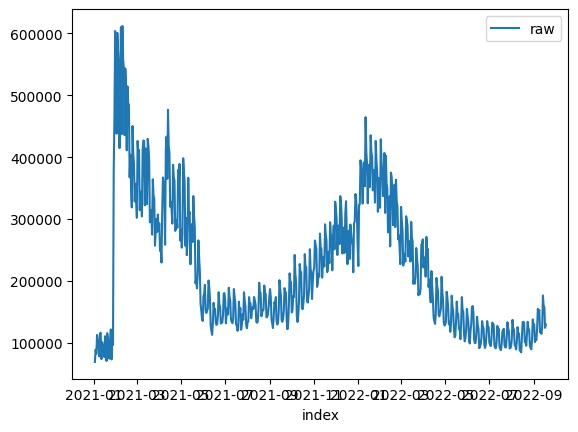

Training...

100%|█████████████████████████████████████| 50/50 [02:38<00:00,  3.16s/trial, best loss: 0.12375179056309453]
Prediction...
146887.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.897425670602022, 'LogTransformedPrediction': 11.663154330589784, 'LogTransformedStdErr': 0.0903000692740251, 'LogTransformedCILower': 11.514623934130434, 'LogTransformedCIUpper': 11.811684727049133, 'AdjustedActual': 146886.99999999988, 'Prediction': 116683.77906139105, 'StdErr': 10558.159383492715, 'CILower': 99317.15230552133, 'CIUpper': 134050.40581726076, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9957722931336785, 'DownAnomalyProbability': 0.0021138534331607284, 'UpAnomalyProbability': 0.9978861465668393, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 5,
 'param_is_log': True,
 'param_wee

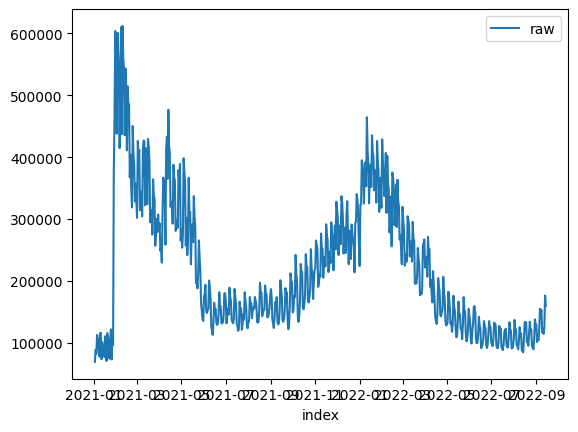

Training...

100%|█████████████████████████████████████| 50/50 [04:09<00:00,  4.99s/trial, best loss: 0.14620192784562033]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157686.0, 'Prediction': 152565.39141027094, 'StdErr': 26038.0119531334, 'CILower': 109736.67301055368, 'CIUpper': 195394.10980998818, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.15590557914640857, 'DownAnomalyProbability': 0.4220472104267957, 'UpAnomalyProbability': 0.5779527895732043, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 115012.87090580184, 'StdErr': 26038.05666013146, 'CILower': 72184.07896961668, 'CIUpper': 157841.662841987, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.27379991263676184, 'DownAnomalyProbability': 0.3631000436816191, 'U

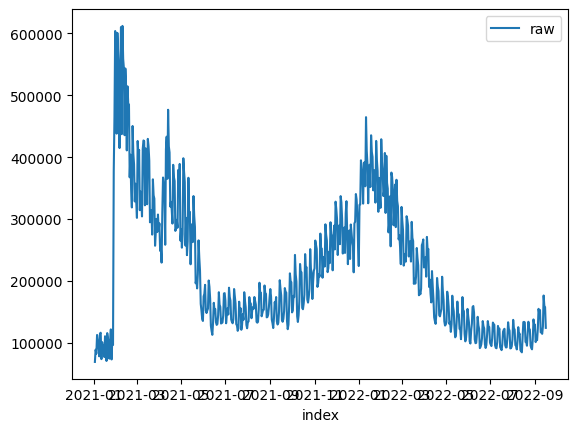

Training...

100%|██████████████████████████████████████████████████| 50/50 [02:27<00:00,  2.94s/trial, best loss: 1e+100]
Prediction...
129714.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129714.0, 'Prediction': 122382.24124921378, 'StdErr': 6659.067832079141, 'CILower': 111429.04937350252, 'CIUpper': 133335.43312492504, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7291115169605002, 'DownAnomalyProbability': 0.13544424151974988, 'UpAnomalyProbability': 0.8645557584802501, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 6,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


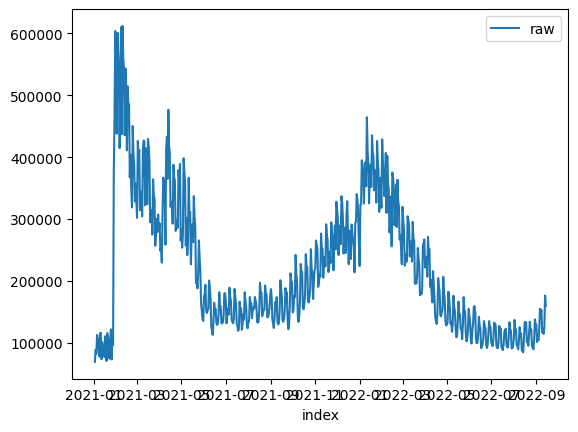

Training...

100%|█████████████████████████████████████| 50/50 [02:39<00:00,  3.19s/trial, best loss: 0.25026129667458147]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157686.0, 'Prediction': 158982.06574761478, 'StdErr': 6033.119419393655, 'CILower': 149058.46738879377, 'CIUpper': 168905.66410643578, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.17009635148078672, 'DownAnomalyProbability': 0.5850481757403934, 'UpAnomalyProbability': 0.41495182425960664, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 130304.50070159211, 'StdErr': 6646.80740245692, 'CILower': 119371.47543801296, 'CIUpper': 141237.52596517128, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6470030433427327, 'DownAnomalyProbability': 0.8235015216713664,

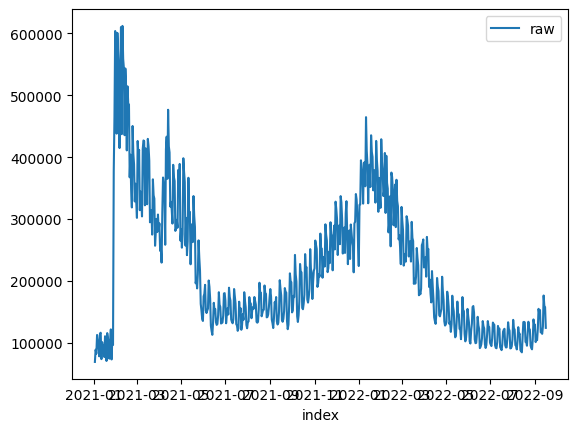

Training...

100%|██████████████████████████████████████████████████| 50/50 [03:04<00:00,  3.70s/trial, best loss: 1e+100]
Prediction...
129714.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.773095015120886, 'LogTransformedPrediction': 11.789676217872548, 'LogTransformedStdErr': 0.1478772588646294, 'LogTransformedCILower': 11.54643977228542, 'LogTransformedCIUpper': 12.032912663459676, 'AdjustedActual': 129714.00000000003, 'Prediction': 133332.6696397837, 'StdErr': 19825.301643736006, 'CILower': 100722.95032567755, 'CIUpper': 165942.38895388987, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.14483149791000027, 'DownAnomalyProbability': 0.5724157489550001, 'UpAnomalyProbability': 0.4275842510449999, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 6,
 'param_is_log': True,
 'param_weekl

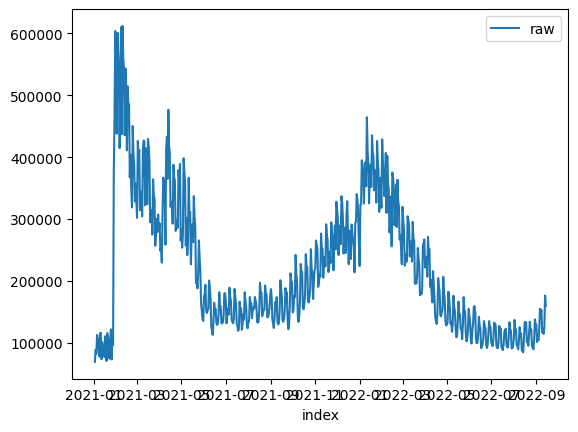

Training...

100%|█████████████████████████████████████| 50/50 [04:32<00:00,  5.44s/trial, best loss: 0.14760686921206426]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.968367334550008, 'LogTransformedPrediction': 11.976497638627386, 'LogTransformedStdErr': 0.10588699893409158, 'LogTransformedCILower': 11.802329024383639, 'LogTransformedCIUpper': 12.150666252871133, 'AdjustedActual': 157686.00000000006, 'Prediction': 159866.98612071548, 'StdErr': 16975.50155539661, 'CILower': 131944.770818001, 'CIUpper': 187789.20142342994, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.10222964838364823, 'DownAnomalyProbability': 0.5511148241918241, 'UpAnomalyProbability': 0.4488851758081759, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.729100794520692, 'LogTransformedPrediction': 11.7670

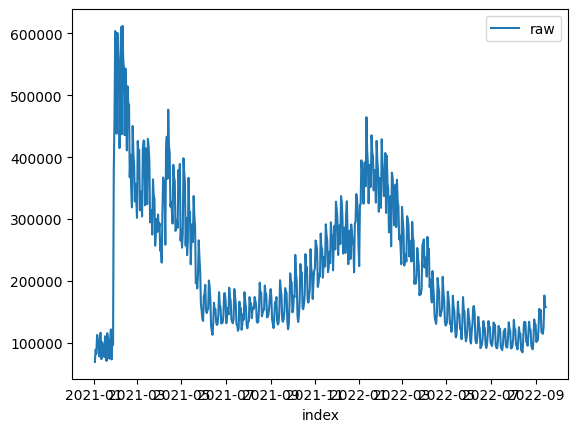

Training...

100%|█████████████████████████████████████| 50/50 [04:32<00:00,  5.45s/trial, best loss: 0.15010782386337457]
Prediction...
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.729100794520692, 'LogTransformedPrediction': 11.708416925554765, 'LogTransformedStdErr': 0.104451658987189, 'LogTransformedCILower': 11.536609235428589, 'LogTransformedCIUpper': 11.880224615680941, 'AdjustedActual': 124130.99999999994, 'Prediction': 122254.9406080502, 'StdErr': 12804.745317571836, 'CILower': 101193.00883025228, 'CIUpper': 143316.8723858481, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.11648343261282235, 'DownAnomalyProbability': 0.4417582836935888, 'UpAnomalyProbability': 0.5582417163064112, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 7,
 'param_is_log': False,
 'param_weekl

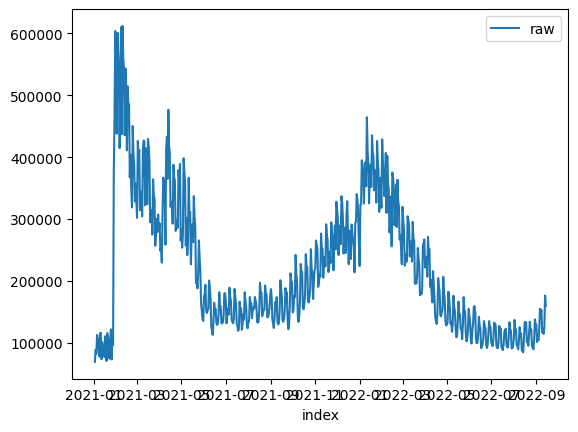

Training...

100%|█████████████████████████████████████| 50/50 [04:12<00:00,  5.05s/trial, best loss: 0.14947965386762635]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157686.0, 'Prediction': 154532.58602657216, 'StdErr': 25188.668531484178, 'CILower': 113100.913234482, 'CIUpper': 195964.25881866232, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.09962826667269153, 'DownAnomalyProbability': 0.45018586666365423, 'UpAnomalyProbability': 0.5498141333363458, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 116699.47782926055, 'StdErr': 25189.627568337582, 'CILower': 75266.22756192368, 'CIUpper': 158132.72809659742, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2320237713612343, 'DownAnomalyProbability': 0.38398811431938284

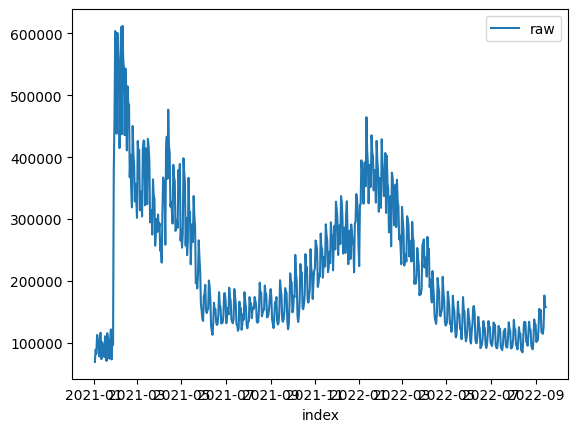

Training...

100%|██████████████████████████████████████| 50/50 [04:15<00:00,  5.12s/trial, best loss: 0.1425975472142419]
Prediction...
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 120219.3885596683, 'StdErr': 29158.537054660577, 'CILower': 72257.86312871095, 'CIUpper': 168180.91399062565, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.10671586635705266, 'DownAnomalyProbability': 0.44664206682147367, 'UpAnomalyProbability': 0.5533579331785263, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_powercurve'),
 'param_days_range': 7,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


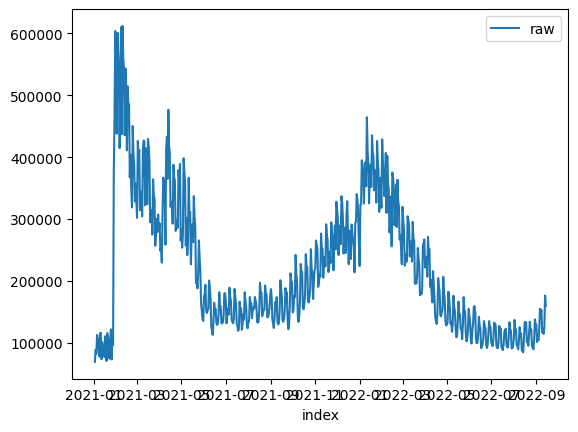

Training...

100%|█████████████████████████████████████| 50/50 [04:17<00:00,  5.15s/trial, best loss: 0.13137988611362975]
Prediction...
157686.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157686.0, 'Prediction': 154166.39673700894, 'StdErr': 29186.27357508617, 'CILower': 106159.24878983054, 'CIUpper': 202173.54468418733, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.09598503876145248, 'DownAnomalyProbability': 0.45200748061927376, 'UpAnomalyProbability': 0.5479925193807262, 'ModelFreshness': 0.1}
124131.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 124131.0, 'Prediction': 116585.48327157844, 'StdErr': 29186.342989410747, 'CILower': 68578.2211479965, 'CIUpper': 164592.7453951604, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2040013468231574, 'DownAnomalyProbability': 0.3979993265884213, 

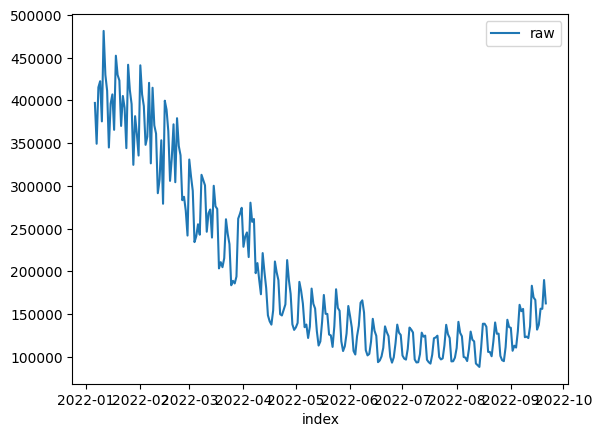

Training...

100%|██████████████████████████████████████| 50/50 [01:27<00:00,  1.74s/trial, best loss: 0.2674267986829065]
Prediction...
148808.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.91041888342302, 'LogTransformedPrediction': 12.032478029738185, 'LogTransformedStdErr': 0.08621227120634826, 'LogTransformedCILower': 11.890671462756698, 'LogTransformedCIUpper': 12.174284596719671, 'AdjustedActual': 148807.99999999988, 'Prediction': 168752.49296821607, 'StdErr': 14575.697169971016, 'CILower': 144777.60461284293, 'CIUpper': 192727.38132358922, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8287939702122031, 'DownAnomalyProbability': 0.9143969851061016, 'UpAnomalyProbability': 0.08560301489389838, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 1,
 'param_is_log': False,
 'param_weekly_

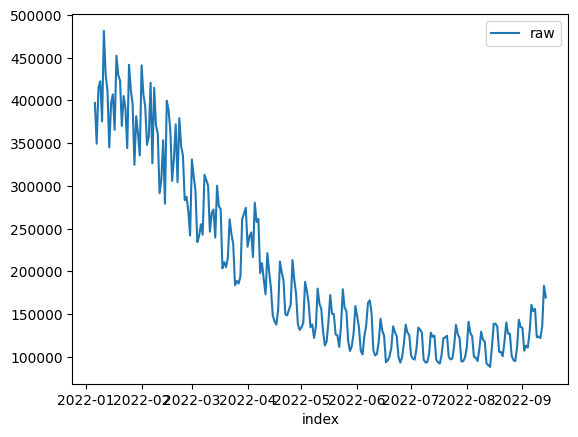

Training...

100%|█████████████████████████████████████| 50/50 [01:23<00:00,  1.68s/trial, best loss: 0.12292032300221947]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 164716.33129747596, 'StdErr': 10220.324771057145, 'CILower': 147905.39302918065, 'CIUpper': 181527.26956577128, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.13746797312830905, 'DownAnomalyProbability': 0.4312660134358455, 'UpAnomalyProbability': 0.5687339865641545, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 132091.06613118478, 'StdErr': 10468.337864217823, 'CILower': 114872.18262707267, 'CIUpper': 149309.94963529689, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.030408991912735273, 'DownAnomalyProbability': 0.5152044959563

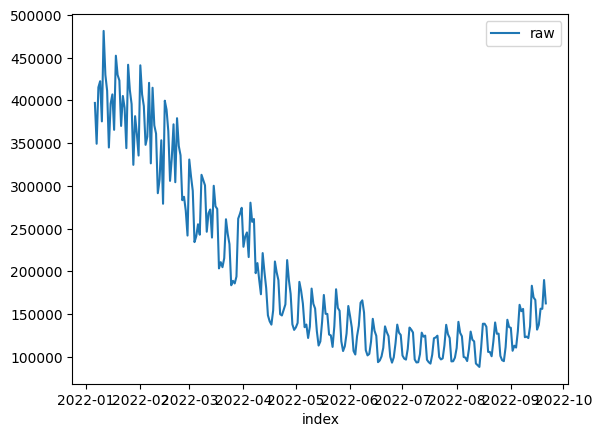

Training...

100%|█████████████████████████████████████| 50/50 [01:30<00:00,  1.80s/trial, best loss: 0.17508419933748323]
Prediction...
148808.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 148808.0, 'Prediction': 193005.18128389074, 'StdErr': 26894.538724828715, 'CILower': 140292.85400240865, 'CIUpper': 245717.50856537282, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8996897769732857, 'DownAnomalyProbability': 0.9498448884866428, 'UpAnomalyProbability': 0.05015511151335714, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 1,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


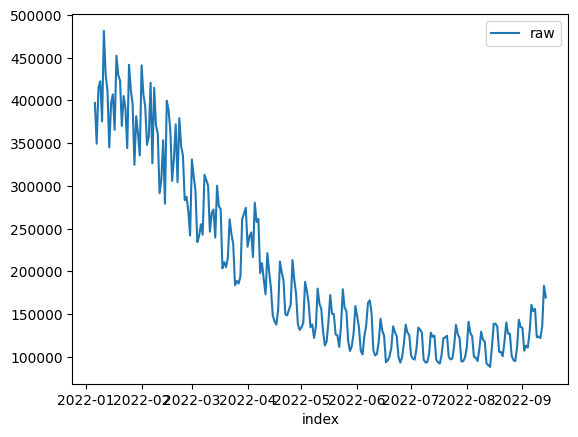

Training...

100%|█████████████████████████████████████| 50/50 [01:20<00:00,  1.61s/trial, best loss: 0.12078266566607368]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 158248.20945864296, 'StdErr': 12667.649499277664, 'CILower': 137411.7802348061, 'CIUpper': 179084.63868247982, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4845024642488043, 'DownAnomalyProbability': 0.25774876787559786, 'UpAnomalyProbability': 0.7422512321244021, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 132489.90022627424, 'StdErr': 14607.56705619977, 'CILower': 108462.59057294721, 'CIUpper': 156517.2098796013, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.04356069934141504, 'DownAnomalyProbability': 0.5217803496707076,

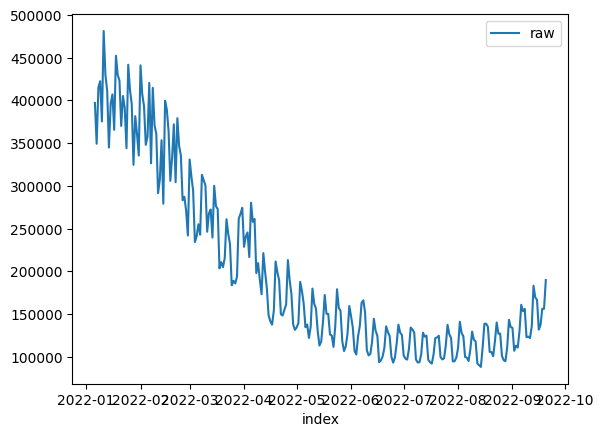

Training...

100%|█████████████████████████████████████| 50/50 [01:29<00:00,  1.78s/trial, best loss: 0.13058226681300078]
Prediction...
162416.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 162416.0, 'Prediction': 185792.3410939347, 'StdErr': 13757.519541293064, 'CILower': 158828.09827639427, 'CIUpper': 212756.5839114751, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9107125226556707, 'DownAnomalyProbability': 0.9553562613278354, 'UpAnomalyProbability': 0.04464373867216466, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 2,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


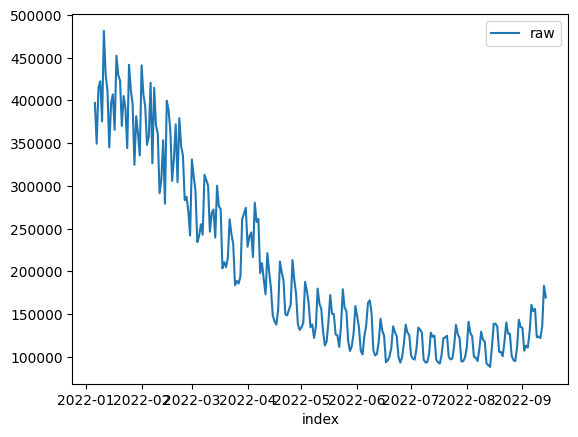

Training...

100%|█████████████████████████████████████| 50/50 [01:23<00:00,  1.66s/trial, best loss: 0.10985436317389154]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 161947.60858443382, 'StdErr': 10891.345405982032, 'CILower': 144032.93959102302, 'CIUpper': 179862.27757784462, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.32309998185339905, 'DownAnomalyProbability': 0.3384500090733005, 'UpAnomalyProbability': 0.6615499909266995, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 125085.47574185523, 'StdErr': 11265.401515663574, 'CILower': 106555.5391997514, 'CIUpper': 143615.41228395907, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4424226455428999, 'DownAnomalyProbability': 0.2787886772285500

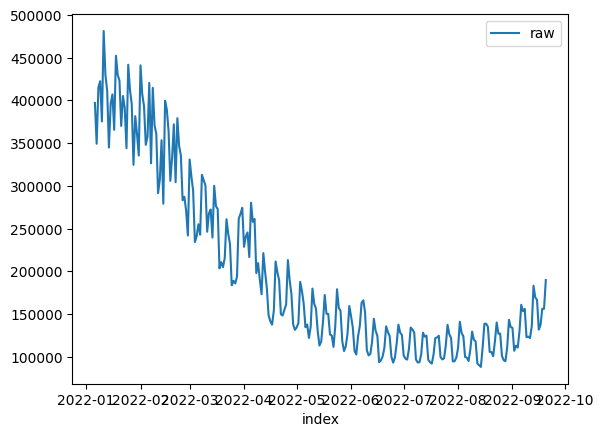

Training...

100%|█████████████████████████████████████| 50/50 [01:19<00:00,  1.58s/trial, best loss: 0.15753666337438588]
Prediction...
162416.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 162416.0, 'Prediction': 181062.18047152492, 'StdErr': 14625.37114097757, 'CILower': 157005.58570477657, 'CIUpper': 205118.77523827326, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.797662496267098, 'DownAnomalyProbability': 0.898831248133549, 'UpAnomalyProbability': 0.10116875186645102, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 2,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


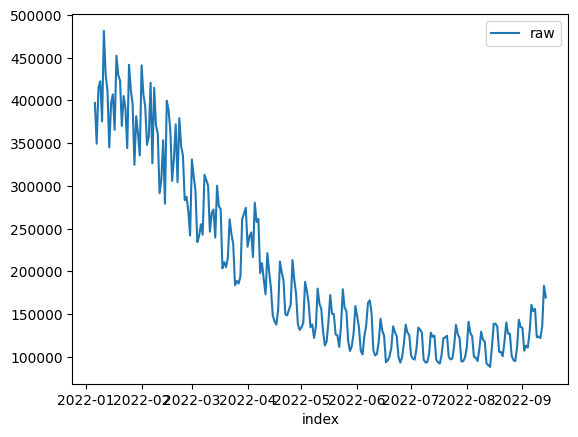

Training...

100%|█████████████████████████████████████| 50/50 [01:24<00:00,  1.69s/trial, best loss: 0.11671122100689661]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 161551.78895593275, 'StdErr': 11997.044721599852, 'CILower': 141818.4064329102, 'CIUpper': 181285.17147895528, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3191368303861044, 'DownAnomalyProbability': 0.3404315848069478, 'UpAnomalyProbability': 0.6595684151930522, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 131790.99657847598, 'StdErr': 12967.082186321903, 'CILower': 110462.04441332657, 'CIUpper': 153119.9487436254, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.006091352943606632, 'DownAnomalyProbability': 0.5030456764718033

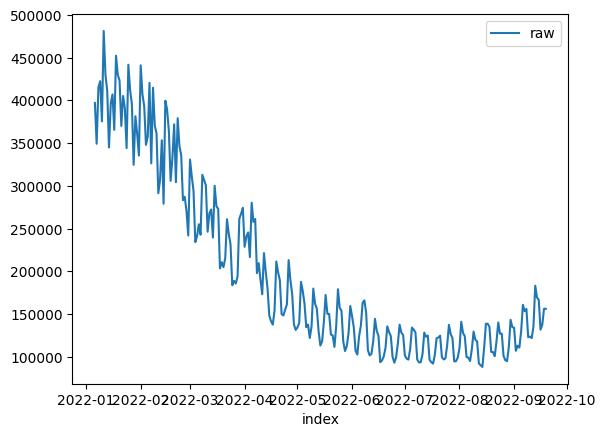

Training...

100%|██████████████████████████████████████████████████| 50/50 [01:15<00:00,  1.51s/trial, best loss: 1e+100]
Prediction...
189766.0 2022-09-20
caso1
{'Success': True, 'AdjustedActual': 33807.0, 'ConfLevel': 90.0, 'Prediction': 165338.0026316715, 'PredStdErr': 18324.449682544167, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3574198116467815, 'DownAnomalyProbability': 0.32129009417660925, 'UpAnomalyProbability': 0.6787099058233907, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


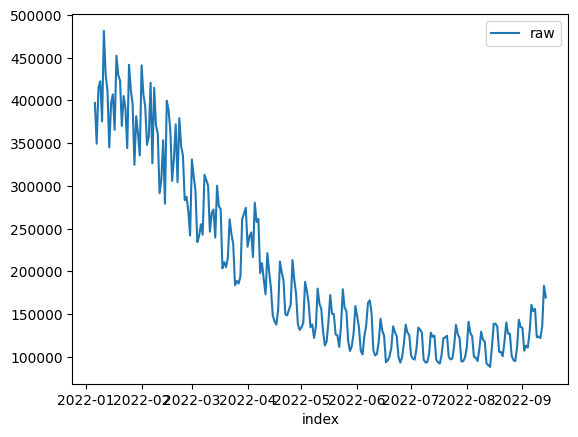

Training...

100%|█████████████████████████████████████| 50/50 [01:22<00:00,  1.65s/trial, best loss: 0.12713428587338707]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 162333.1689926455, 'StdErr': 10142.391848453968, 'CILower': 145650.41897475295, 'CIUpper': 179015.91901053803, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.31779262085797266, 'DownAnomalyProbability': 0.34110368957101367, 'UpAnomalyProbability': 0.6588963104289863, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 128083.59169294432, 'StdErr': 10364.973668190545, 'CILower': 111034.7271615646, 'CIUpper': 145132.45622432404, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2722610692786296, 'DownAnomalyProbability': 0.3638694653606852

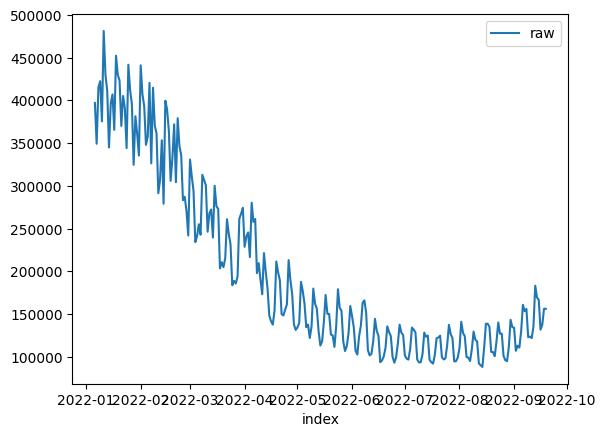

Training...

100%|██████████████████████████████████████████████████| 50/50 [01:11<00:00,  1.43s/trial, best loss: 1e+100]
Prediction...
189766.0 2022-09-20
caso1
{'Success': True, 'AdjustedActual': 33807.0, 'ConfLevel': 90.0, 'Prediction': 166876.60721869237, 'PredStdErr': 14729.931556730864, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5188203101422342, 'DownAnomalyProbability': 0.2405898449288829, 'UpAnomalyProbability': 0.7594101550711171, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 3,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


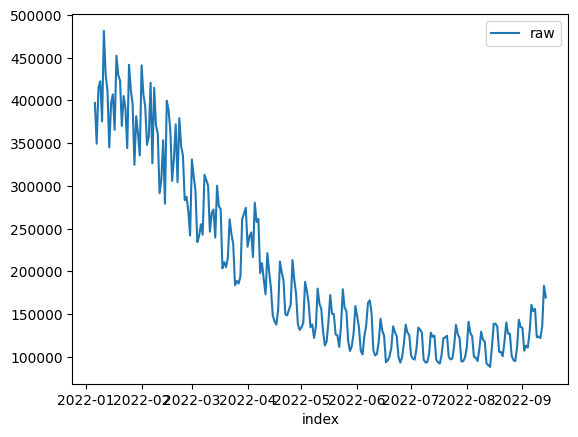

Training...

100%|█████████████████████████████████████| 50/50 [01:23<00:00,  1.66s/trial, best loss: 0.11905561422793028]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 163231.11223308442, 'StdErr': 10317.249082785693, 'CILower': 146260.74765910264, 'CIUpper': 180201.4768070662, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.24760291507145138, 'DownAnomalyProbability': 0.3761985424642743, 'UpAnomalyProbability': 0.6238014575357257, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 129547.88230224088, 'StdErr': 10464.733001187404, 'CILower': 112334.92827015901, 'CIUpper': 146760.83633432275, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.16234182364991767, 'DownAnomalyProbability': 0.418829088175041

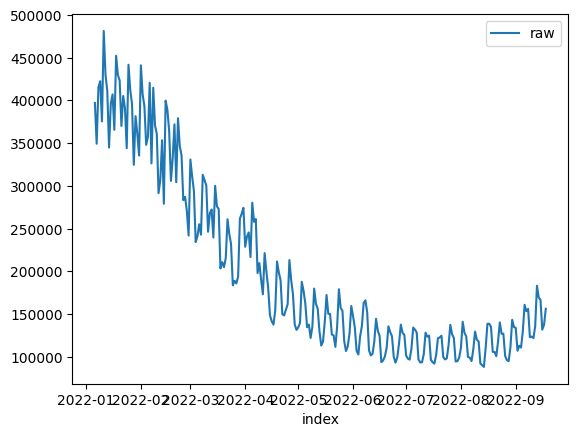

Training...

100%|█████████████████████████████████████| 50/50 [01:27<00:00,  1.74s/trial, best loss: 0.16850514477168224]
Prediction...
156070.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 156070.0, 'Prediction': 193724.04135251202, 'StdErr': 26206.390385215414, 'CILower': 142360.46003269305, 'CIUpper': 245087.622672331, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8492327575617273, 'DownAnomalyProbability': 0.9246163787808637, 'UpAnomalyProbability': 0.07538362121913637, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 4,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


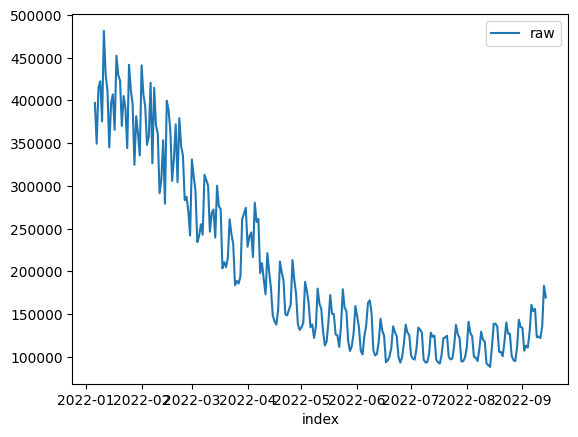

Training...

100%|█████████████████████████████████████| 50/50 [01:20<00:00,  1.62s/trial, best loss: 0.11039355109238765]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 161551.78895593275, 'StdErr': 11997.044721599852, 'CILower': 141818.4064329102, 'CIUpper': 181285.17147895528, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3191368303861044, 'DownAnomalyProbability': 0.3404315848069478, 'UpAnomalyProbability': 0.6595684151930522, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 131790.99657847598, 'StdErr': 12967.082186321903, 'CILower': 110462.04441332657, 'CIUpper': 153119.9487436254, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.006091352943606632, 'DownAnomalyProbability': 0.5030456764718033

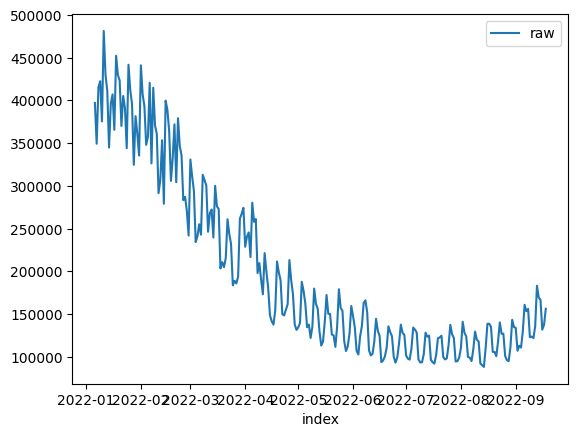

Training...

100%|██████████████████████████████████████| 50/50 [01:26<00:00,  1.74s/trial, best loss: 0.2248678774466311]
Prediction...
156070.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 156070.0, 'Prediction': 159751.86408381668, 'StdErr': 11085.896717998472, 'CILower': 141517.18665920745, 'CIUpper': 177986.5415084259, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2602024456047427, 'DownAnomalyProbability': 0.6301012228023714, 'UpAnomalyProbability': 0.36989877719762865, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 4,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


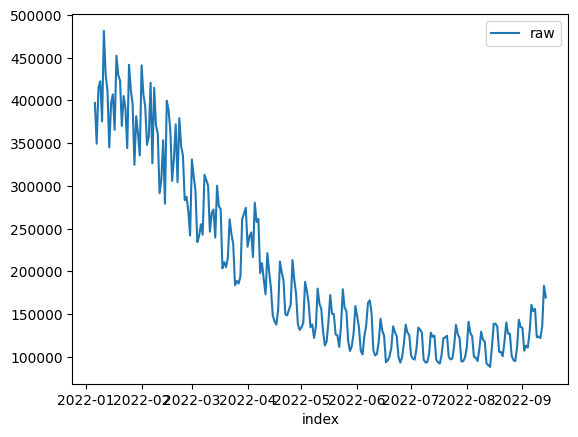

Training...

100%|█████████████████████████████████████| 50/50 [01:20<00:00,  1.60s/trial, best loss: 0.11565958585366086]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 173849.60414672137, 'StdErr': 24209.325960182152, 'CILower': 126400.19717477378, 'CIUpper': 221299.01111866895, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.23899700979778848, 'DownAnomalyProbability': 0.6194985048988942, 'UpAnomalyProbability': 0.38050149510110576, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 150105.79621287153, 'StdErr': 26484.042185694696, 'CILower': 98198.02736387047, 'CIUpper': 202013.5650618726, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5131194769379606, 'DownAnomalyProbability': 0.7565597384689803

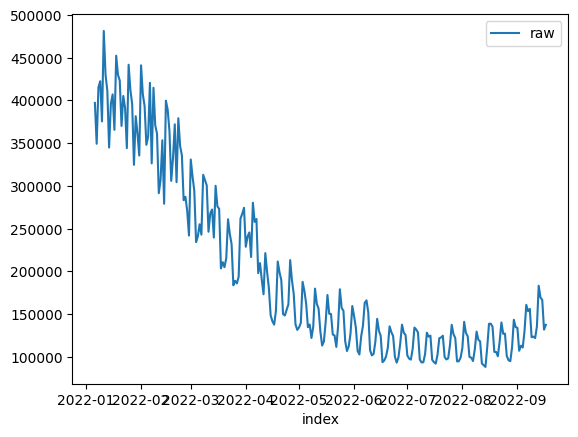

Training...

100%|█████████████████████████████████████| 50/50 [01:20<00:00,  1.62s/trial, best loss: 0.16984929843680752]
Prediction...
156181.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 156181.0, 'Prediction': 136786.49577905162, 'StdErr': 9537.362314571514, 'CILower': 121098.93078437838, 'CIUpper': 152474.06077372486, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9580009077444303, 'DownAnomalyProbability': 0.020999546127784874, 'UpAnomalyProbability': 0.9790004538722151, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 5,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


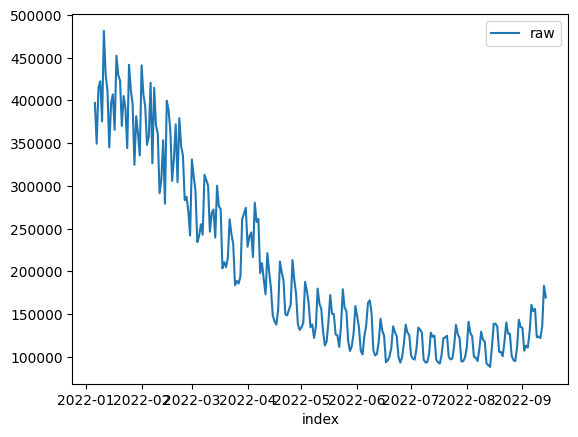

Training...

100%|█████████████████████████████████████| 50/50 [01:23<00:00,  1.67s/trial, best loss: 0.10976059497673905]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 167054.55200824307, 'StdErr': 10867.697625185185, 'CILower': 149178.7801528453, 'CIUpper': 184930.32386364084, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.0417229149676166, 'DownAnomalyProbability': 0.5208614574838084, 'UpAnomalyProbability': 0.47913854251619165, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 133265.56106486887, 'StdErr': 10955.804295923876, 'CILower': 115244.86663254797, 'CIUpper': 151286.2554971898, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.11420582896276987, 'DownAnomalyProbability': 0.5571029144813849

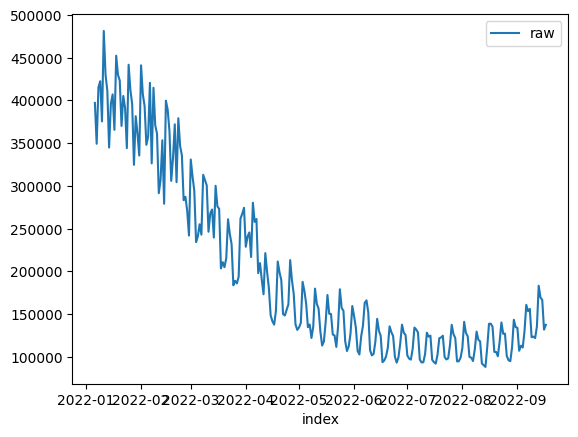

Training...

100%|██████████████████████████████████████| 50/50 [01:20<00:00,  1.62s/trial, best loss: 0.1710620299652964]
Prediction...
156181.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 156181.0, 'Prediction': 143015.70354295956, 'StdErr': 12336.796942085046, 'CILower': 122723.47834780713, 'CIUpper': 163307.92873811198, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7140989529243775, 'DownAnomalyProbability': 0.14295052353781124, 'UpAnomalyProbability': 0.8570494764621888, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 5,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


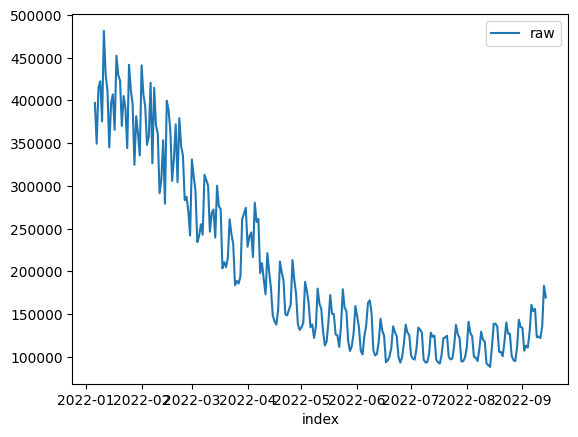

Training...

100%|█████████████████████████████████████| 50/50 [01:20<00:00,  1.61s/trial, best loss: 0.12004231961629992]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 162330.84783336826, 'StdErr': 12334.886298666132, 'CILower': 142041.76536697324, 'CIUpper': 182619.93029976328, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.26377892695865524, 'DownAnomalyProbability': 0.3681105365206724, 'UpAnomalyProbability': 0.6318894634793276, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 132967.6490363403, 'StdErr': 13473.237628617399, 'CILower': 110806.14525612992, 'CIUpper': 155129.1528165507, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.07543116654147375, 'DownAnomalyProbability': 0.537715583270737,

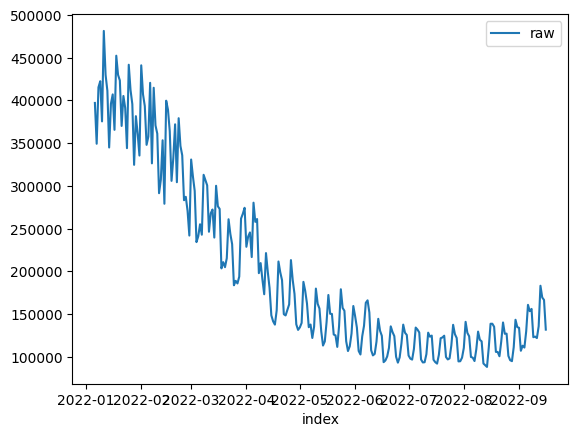

Training...

100%|██████████████████████████████████████████████████| 50/50 [01:14<00:00,  1.48s/trial, best loss: 1e+100]
Prediction...
137340.0 2022-09-17
caso1
{'Success': True, 'AdjustedActual': -0.16098769795155565, 'ConfLevel': 90.0, 'Prediction': 152730.71315374938, 'PredStdErr': 21671.433049660816, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7333826887700963, 'DownAnomalyProbability': 0.8666913443850481, 'UpAnomalyProbability': 0.13330865561495192, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 6,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


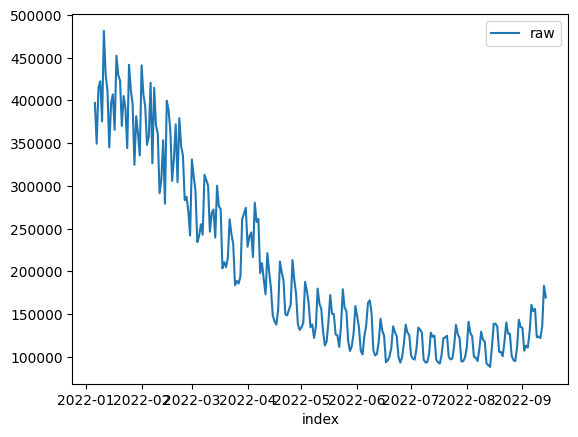

Training...

100%|█████████████████████████████████████| 50/50 [01:23<00:00,  1.67s/trial, best loss: 0.11795383475680987]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 166413.99742860618, 'StdErr': 10078.763638048413, 'CILower': 149835.90650337562, 'CIUpper': 182992.08835383673, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.005700029631326986, 'DownAnomalyProbability': 0.4971499851843365, 'UpAnomalyProbability': 0.5028500148156635, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 132640.2756207927, 'StdErr': 10166.098406603804, 'CILower': 115918.53178474485, 'CIUpper': 149362.01945684056, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.07431746990504573, 'DownAnomalyProbability': 0.53715873495252

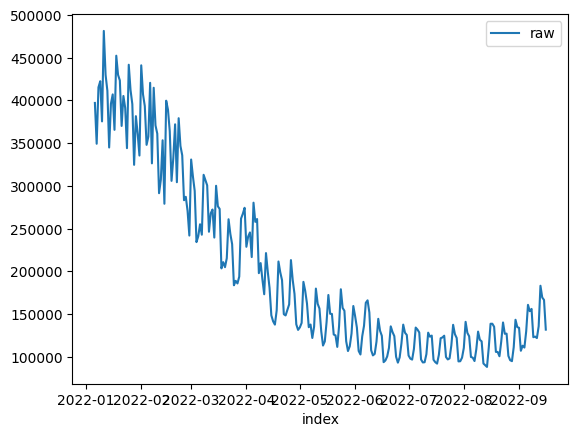

Training...

100%|███████████████████████████████████████████████████| 50/50 [01:13<00:00,  1.46s/trial, best loss: 1e+100]
Prediction...
137340.0 2022-09-17
caso1
{'Success': True, 'AdjustedActual': -26305.0, 'ConfLevel': 90.0, 'Prediction': 162022.6330742553, 'PredStdErr': 14757.910849173706, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4950599145954211, 'DownAnomalyProbability': 0.7475299572977105, 'UpAnomalyProbability': 0.2524700427022894, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 6,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


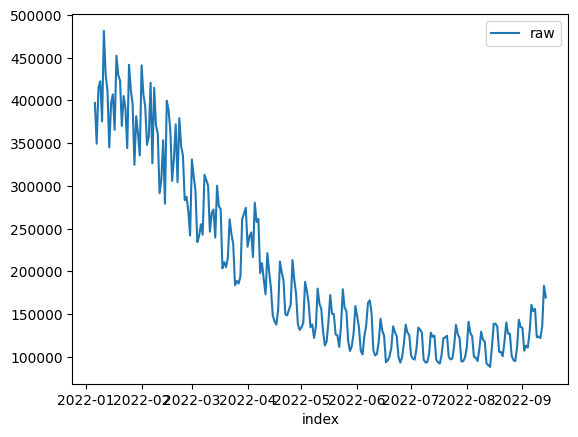

Training...

100%|██████████████████████████████████████| 50/50 [01:17<00:00,  1.56s/trial, best loss: 0.10779727853551575]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 161551.78895593275, 'StdErr': 11997.044721599852, 'CILower': 141818.4064329102, 'CIUpper': 181285.17147895528, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3191368303861044, 'DownAnomalyProbability': 0.3404315848069478, 'UpAnomalyProbability': 0.6595684151930522, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 131790.99657847598, 'StdErr': 12967.082186321903, 'CILower': 110462.04441332657, 'CIUpper': 153119.9487436254, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.006091352943606632, 'DownAnomalyProbability': 0.503045676471803

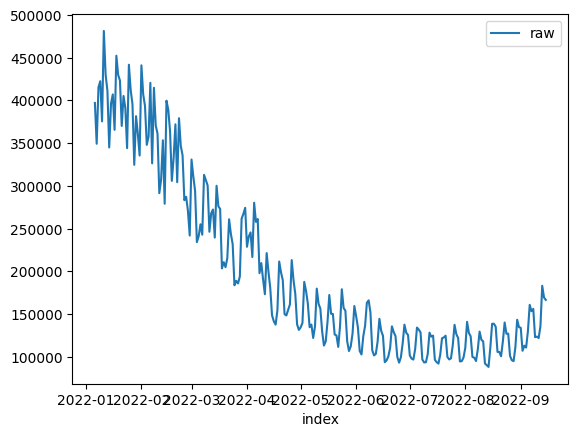

Training...

100%|██████████████████████████████████████| 50/50 [01:18<00:00,  1.57s/trial, best loss: 0.10233332418900855]
Prediction...
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 146620.2972912281, 'StdErr': 16493.7256979621, 'CILower': 114293.18895233962, 'CIUpper': 178947.40563011658, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6345820047040931, 'DownAnomalyProbability': 0.8172910023520465, 'UpAnomalyProbability': 0.1827089976479534, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 7,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


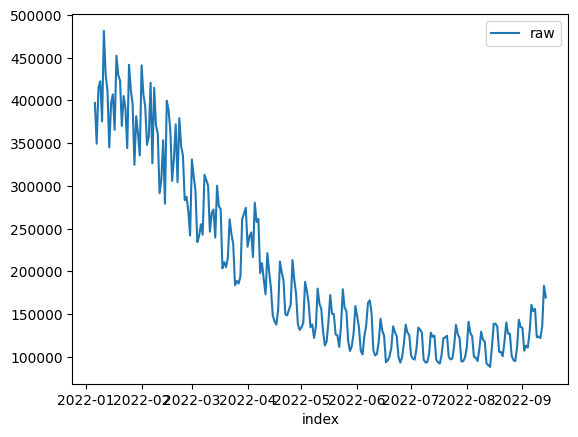

Training...

100%|███████████████████████████████████████| 50/50 [01:24<00:00,  1.68s/trial, best loss: 0.1070265160910736]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 175899.11048922426, 'StdErr': 23565.667259060756, 'CILower': 129711.25138981044, 'CIUpper': 222086.96958863808, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.31043223618864046, 'DownAnomalyProbability': 0.6552161180943202, 'UpAnomalyProbability': 0.34478388190567977, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 149776.18996012615, 'StdErr': 29217.991369609113, 'CILower': 92509.97917509016, 'CIUpper': 207042.40074516216, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.46404425772139435, 'DownAnomalyProbability': 0.7320221288606

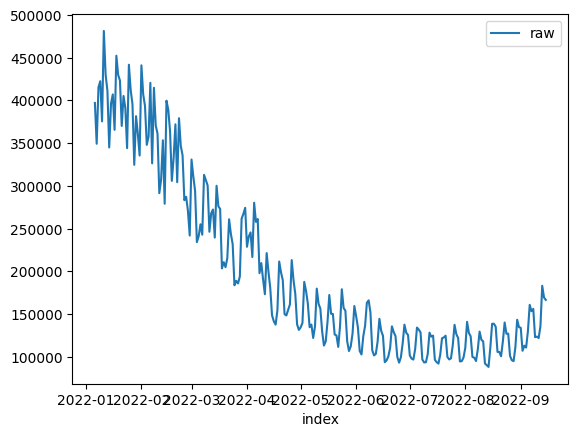

Training...

100%|███████████████████████████████████████| 50/50 [01:20<00:00,  1.61s/trial, best loss: 0.1303063775479894]
Prediction...
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 142739.64020489866, 'StdErr': 11435.805209098973, 'CILower': 123929.41452960168, 'CIUpper': 161549.86588019563, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6659843636338627, 'DownAnomalyProbability': 0.8329921818169314, 'UpAnomalyProbability': 0.16700781818306865, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.activity_saved'),
 'param_days_range': 7,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


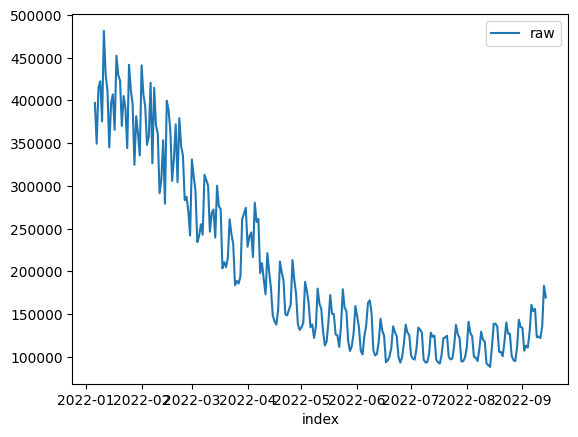

Training...

100%|███████████████████████████████████████| 50/50 [01:29<00:00,  1.79s/trial, best loss: 0.1249700991962659]
Prediction...
166486.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 166486.0, 'Prediction': 177401.76451491995, 'StdErr': 23638.19380530012, 'CILower': 131071.7559969539, 'CIUpper': 223731.773032886, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.35576452735053166, 'DownAnomalyProbability': 0.6778822636752658, 'UpAnomalyProbability': 0.32211773632473417, 'ModelFreshness': 0.1}
131692.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 131692.0, 'Prediction': 147252.16339489448, 'StdErr': 25575.50446747089, 'CILower': 97125.09575220828, 'CIUpper': 197379.2310375807, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4570784749612793, 'DownAnomalyProbability': 0.7285392374806396, 'U

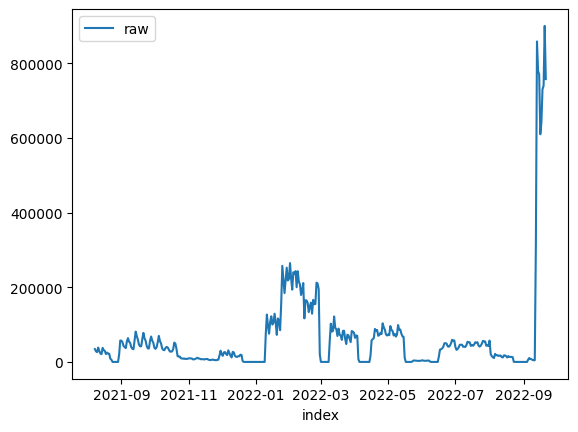

Training...

100%|███████████████████████████████████████| 50/50 [02:53<00:00,  3.46s/trial, best loss: 1.0081853942037056]
Prediction...
696604.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.453973814608634, 'LogTransformedPrediction': 12.995827318753776, 'LogTransformedStdErr': 1.5021577002090742, 'LogTransformedCILower': 10.051652327244474, 'LogTransformedCIUpper': 15.940002310263077, 'AdjustedActual': 696604.0000000001, 'Prediction': 1361456.2574765296, 'StdErr': 3980812.2193398913, 'CILower': -5186397.159717429, 'CIUpper': 7909309.6746704895, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.13264114178191133, 'DownAnomalyProbability': 0.5663205708909558, 'UpAnomalyProbability': 0.4336794291090443, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 1,
 'param_is_log': False,
 'param_week

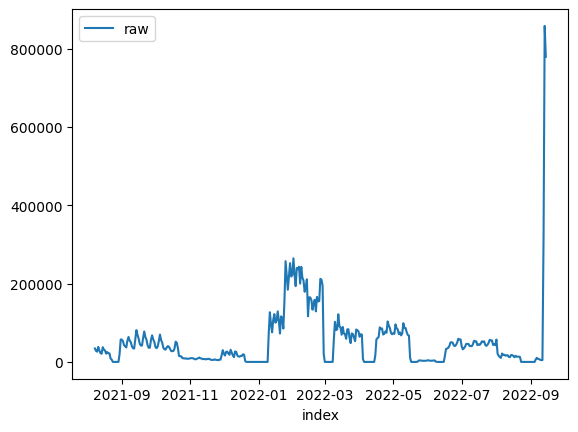

Training...

100%|███████████████████████████████████████| 50/50 [01:58<00:00,  2.37s/trial, best loss: 1.4746377832451636]
Prediction...
769516.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': 0.08732836928153587, 'ConfLevel': 90.0, 'Prediction': 2518100.2632693215, 'PredStdErr': 4053173.3483466227, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2639187079599514, 'DownAnomalyProbability': 0.6319593539799757, 'UpAnomalyProbability': 0.36804064602002423, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.13831095075145905, 'ConfLevel': 90.0, 'Prediction': 2296082.0464152023, 'PredStdErr': 3695809.515316246, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.34162709143855374, 'DownAnomalyProbability': 0.6708135457192769, 'UpAnomalyProbability': 0.32918645428072313, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso1
{'Success': True, 'Adjusted

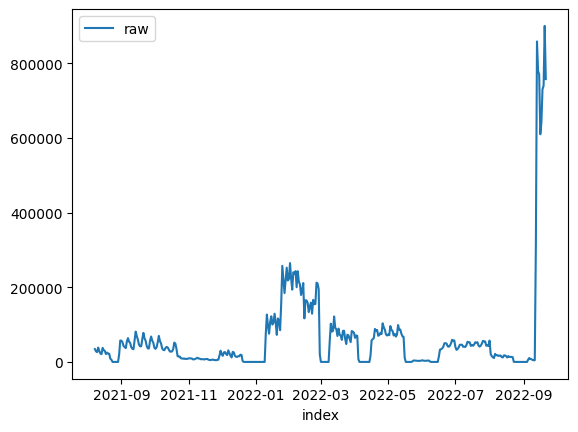

Training...

100%|████████████████████████████████████████| 50/50 [03:01<00:00,  3.63s/trial, best loss: 1.045265380328328]
Prediction...
696604.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.453973814608634, 'LogTransformedPrediction': 12.57350716000233, 'LogTransformedStdErr': 1.459761782967516, 'LogTransformedCILower': 9.712426639378025, 'LogTransformedCIUpper': 15.434587680626636, 'AdjustedActual': 696604.0000000001, 'Prediction': 838154.8925916755, 'StdErr': 2283491.269387299, 'CILower': -2917854.003972045, 'CIUpper': 4594163.789155396, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.04942825198179346, 'DownAnomalyProbability': 0.5247141259908967, 'UpAnomalyProbability': 0.47528587400910327, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 1,
 'param_is_log': True,
 'param_weekly_mod

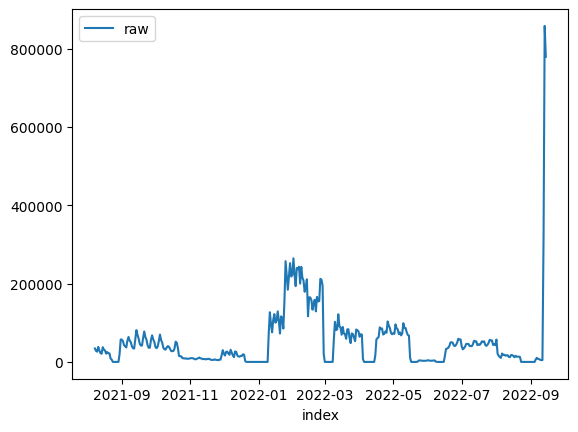

Training...

100%|████████████████████████████████████████| 50/50 [02:31<00:00,  3.03s/trial, best loss: 2.128206690988254]
Prediction...
769516.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': 0.08732836928153587, 'ConfLevel': 90.0, 'Prediction': 2518100.2632693215, 'PredStdErr': 4053173.3483466227, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2639187079599514, 'DownAnomalyProbability': 0.6319593539799757, 'UpAnomalyProbability': 0.36804064602002423, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.13831095075145905, 'ConfLevel': 90.0, 'Prediction': 2296082.0464152023, 'PredStdErr': 3695809.515316246, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.34162709143855374, 'DownAnomalyProbability': 0.6708135457192769, 'UpAnomalyProbability': 0.32918645428072313, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso1
{'Success': True, 'Adjusted

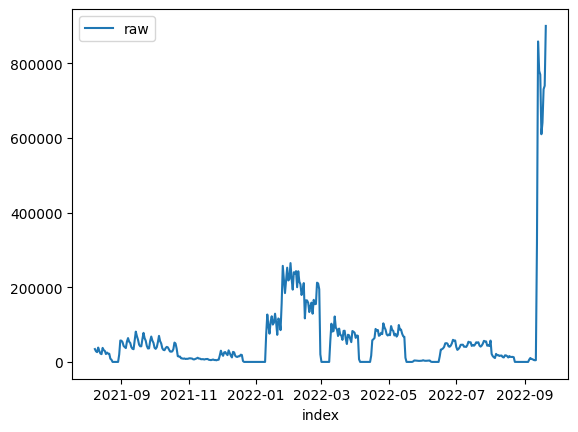

Training...

100%|███████████████████████████████████████| 50/50 [03:13<00:00,  3.87s/trial, best loss: 0.8249889100630997]
Prediction...
757467.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.537736571248926, 'LogTransformedPrediction': 12.133165381333464, 'LogTransformedStdErr': 1.4666238278910315, 'LogTransformedCILower': 9.258635499798771, 'LogTransformedCIUpper': 15.007695262868157, 'AdjustedActual': 757466.9999999998, 'Prediction': 545062.7872391039, 'StdErr': 1501976.89955989, 'CILower': -1925469.3635993078, 'CIUpper': 3015594.938077516, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.11245902544302733, 'DownAnomalyProbability': 0.44377048727848634, 'UpAnomalyProbability': 0.5562295127215137, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 2,
 'param_is_log': False,
 'param_weekly_

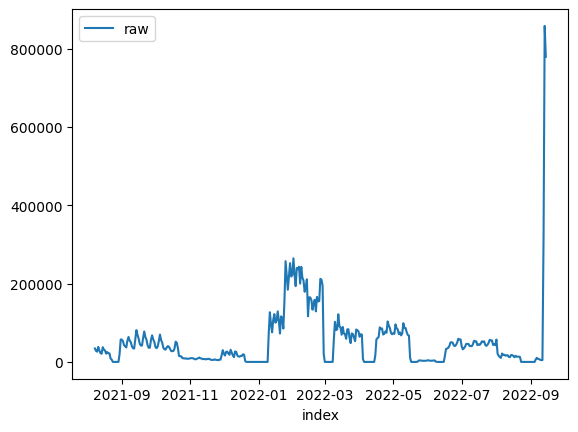

Training...

100%|███████████████████████████████████████| 50/50 [02:59<00:00,  3.60s/trial, best loss: 1.7140579467591992]
Prediction...
769516.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 769516.0, 'Prediction': 392558.6050999518, 'StdErr': 32492.46663600588, 'CILower': 339113.25350511784, 'CIUpper': 446003.95669478574, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 1.0, 'DownAnomalyProbability': 0.0, 'UpAnomalyProbability': 1.0, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 609828.0, 'Prediction': 257762.79486485713, 'StdErr': 36483.78459859681, 'CILower': 197752.30944293892, 'CIUpper': 317773.2802867754, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 1.0, 'DownAnomalyProbability': 0.0, 'UpAnomalyProbability': 1.0, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso2
{'

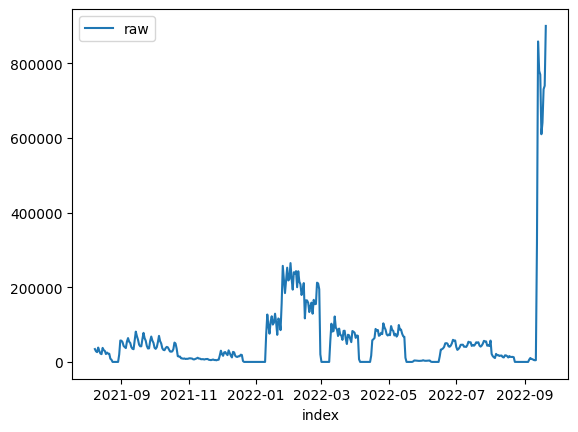

Training...

100%|███████████████████████████████████████| 50/50 [02:51<00:00,  3.42s/trial, best loss: 0.8611949714082268]
Prediction...
757467.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.537736571248926, 'LogTransformedPrediction': 12.025597619623372, 'LogTransformedStdErr': 1.524937802356876, 'LogTransformedCILower': 9.036774448340235, 'LogTransformedCIUpper': 15.01442079090651, 'AdjustedActual': 757466.9999999998, 'Prediction': 534086.6644748618, 'StdErr': 1622706.7601056246, 'CILower': -2135028.4353635474, 'CIUpper': 3203201.764313271, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1094901468524827, 'DownAnomalyProbability': 0.44525492657375865, 'UpAnomalyProbability': 0.5547450734262414, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 2,
 'param_is_log': True,
 'param_weekly_mo

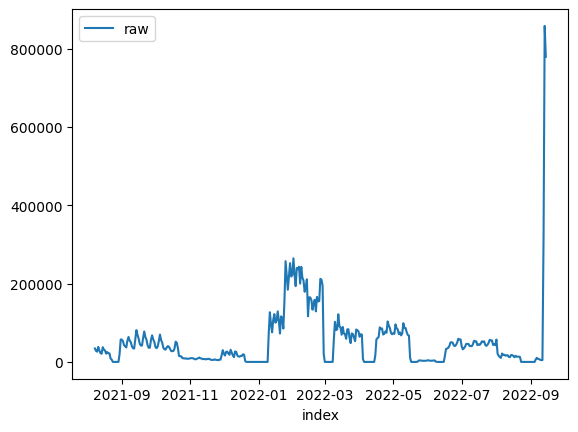

Training...

100%|███████████████████████████████████████| 50/50 [02:25<00:00,  2.92s/trial, best loss: 1.7572100974815517]
Prediction...
769516.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 769516.0, 'Prediction': 378767.037825037, 'StdErr': 32346.028059083877, 'CILower': 325562.5562545788, 'CIUpper': 431971.51939549524, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 1.0, 'DownAnomalyProbability': 0.0, 'UpAnomalyProbability': 1.0, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 609828.0, 'Prediction': 223349.39388528912, 'StdErr': 36375.76226221211, 'CILower': 163516.58939516504, 'CIUpper': 283182.1983754132, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 1.0, 'DownAnomalyProbability': 0.0, 'UpAnomalyProbability': 1.0, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso2
{'S

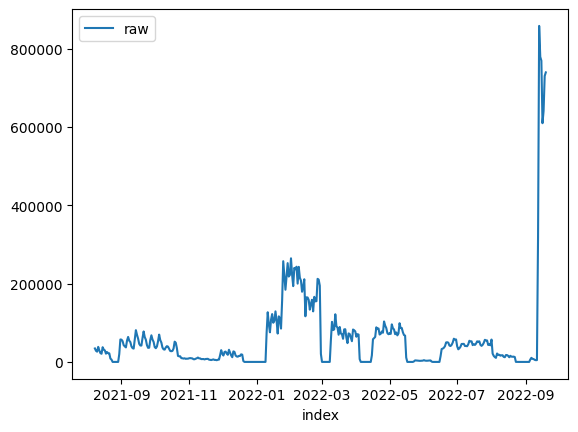

Training...

100%|███████████████████████████████████████| 50/50 [01:58<00:00,  2.36s/trial, best loss: 0.7373003589283684]
Prediction...
899908.0 2022-09-20
caso1
{'Success': True, 'AdjustedActual': 0.20155796490001898, 'ConfLevel': 90.0, 'Prediction': 1582037.9811647488, 'PredStdErr': 2528963.9700449295, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.03475695512500998, 'DownAnomalyProbability': 0.482621522437495, 'UpAnomalyProbability': 0.517378477562505, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


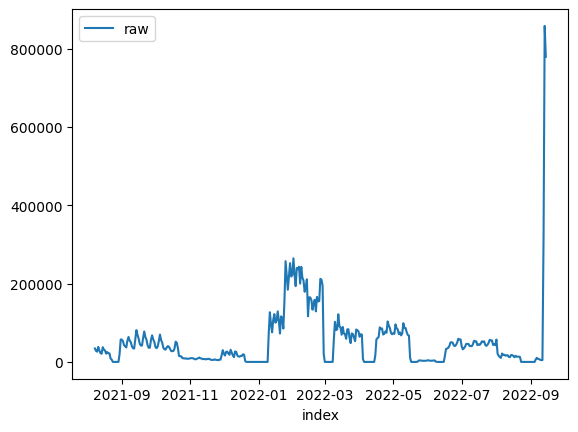

Training...

100%|███████████████████████████████████████| 50/50 [02:59<00:00,  3.59s/trial, best loss: 1.9815738602913813]
Prediction...
769516.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 769516.0, 'Prediction': 394022.4121576379, 'StdErr': 32345.174279832525, 'CILower': 340819.3349290779, 'CIUpper': 447225.4893861979, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 1.0, 'DownAnomalyProbability': 0.0, 'UpAnomalyProbability': 1.0, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 609828.0, 'Prediction': 260482.1252036379, 'StdErr': 36312.88250651831, 'CILower': 200752.74870772858, 'CIUpper': 320211.5016995472, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 1.0, 'DownAnomalyProbability': 0.0, 'UpAnomalyProbability': 1.0, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso2
{'Su

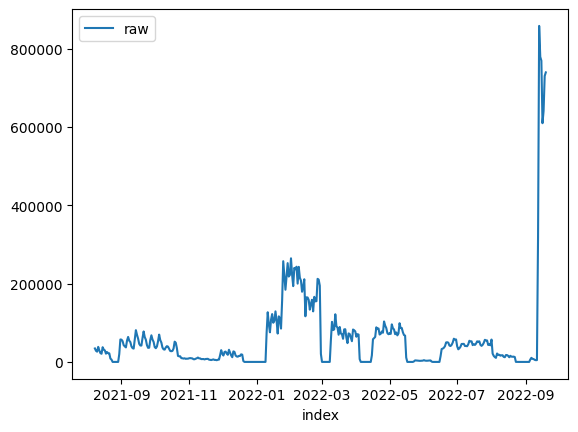

Training...

100%|████████████████████████████████████████| 50/50 [01:52<00:00,  2.24s/trial, best loss: 0.868063384085194]
Prediction...
899908.0 2022-09-20
caso1
{'Success': True, 'AdjustedActual': 0.20155796490001898, 'ConfLevel': 90.0, 'Prediction': 1582037.9811647488, 'PredStdErr': 2528963.9700449295, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.03475695512500998, 'DownAnomalyProbability': 0.482621522437495, 'UpAnomalyProbability': 0.517378477562505, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 3,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


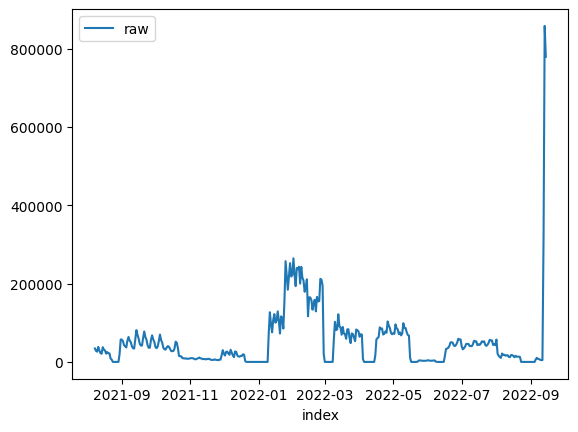

Training...

100%|███████████████████████████████████████| 50/50 [01:57<00:00,  2.36s/trial, best loss: 1.9814659883063006]
Prediction...
769516.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': 0.08732836928153587, 'ConfLevel': 90.0, 'Prediction': 2518100.2632693215, 'PredStdErr': 4053173.3483466227, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2639187079599514, 'DownAnomalyProbability': 0.6319593539799757, 'UpAnomalyProbability': 0.36804064602002423, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.13831095075145905, 'ConfLevel': 90.0, 'Prediction': 2296082.0464152023, 'PredStdErr': 3695809.515316246, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.34162709143855374, 'DownAnomalyProbability': 0.6708135457192769, 'UpAnomalyProbability': 0.32918645428072313, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso1
{'Success': True, 'Adjusted

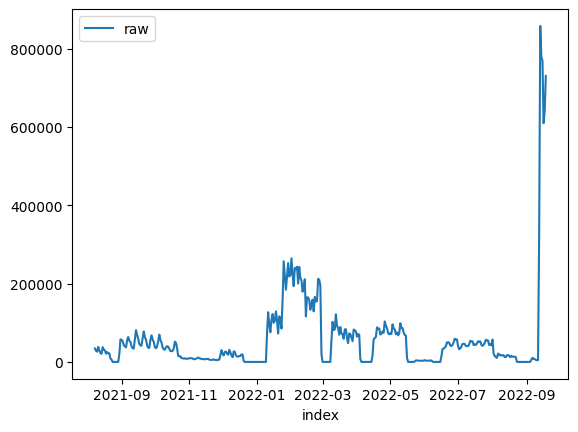

Training...

100%|███████████████████████████████████████| 50/50 [02:00<00:00,  2.40s/trial, best loss: 0.9783674242254364]
Prediction...
739638.0 2022-09-19
caso1
{'Success': True, 'AdjustedActual': -0.11130008714530426, 'ConfLevel': 90.0, 'Prediction': 1429878.2458411157, 'PredStdErr': 2290047.509013997, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.092759500301139, 'DownAnomalyProbability': 0.5463797501505695, 'UpAnomalyProbability': 0.4536202498494305, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 4,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


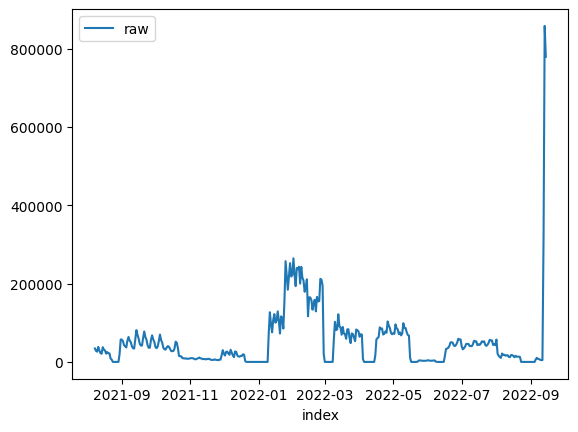

Training...

100%|███████████████████████████████████████| 50/50 [01:55<00:00,  2.30s/trial, best loss: 1.9158992955371081]
Prediction...
769516.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': 0.08732836928153587, 'ConfLevel': 90.0, 'Prediction': 2518100.2632693215, 'PredStdErr': 4053173.3483466227, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2639187079599514, 'DownAnomalyProbability': 0.6319593539799757, 'UpAnomalyProbability': 0.36804064602002423, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.13831095075145905, 'ConfLevel': 90.0, 'Prediction': 2296082.0464152023, 'PredStdErr': 3695809.515316246, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.34162709143855374, 'DownAnomalyProbability': 0.6708135457192769, 'UpAnomalyProbability': 0.32918645428072313, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso1
{'Success': True, 'Adjusted

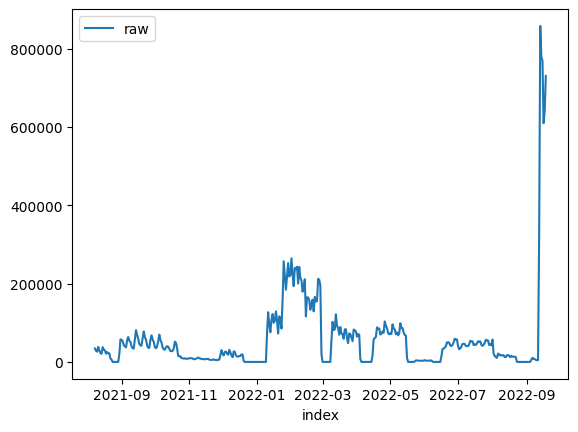

Training...

100%|████████████████████████████████████████| 50/50 [01:47<00:00,  2.15s/trial, best loss: 0.781716591725003]
Prediction...
739638.0 2022-09-19
caso1
{'Success': True, 'AdjustedActual': -0.11130008714530426, 'ConfLevel': 90.0, 'Prediction': 1429878.2458411157, 'PredStdErr': 2290047.509013997, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.092759500301139, 'DownAnomalyProbability': 0.5463797501505695, 'UpAnomalyProbability': 0.4536202498494305, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 4,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


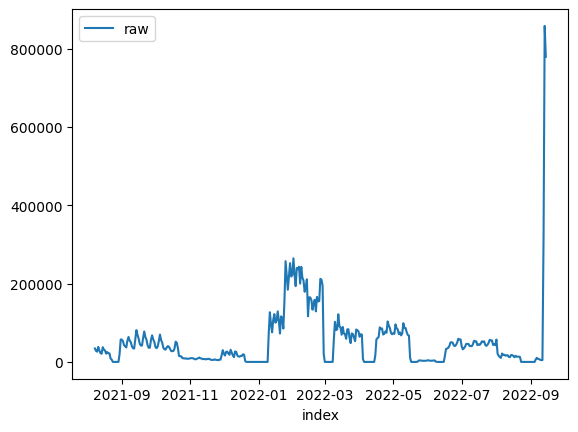

Training...

100%|████████████████████████████████████████| 50/50 [01:32<00:00,  1.85s/trial, best loss: 1.458676224665272]
Prediction...
769516.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': 0.08732836928153587, 'ConfLevel': 90.0, 'Prediction': 2518100.2632693215, 'PredStdErr': 4053173.3483466227, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2639187079599514, 'DownAnomalyProbability': 0.6319593539799757, 'UpAnomalyProbability': 0.36804064602002423, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.13831095075145905, 'ConfLevel': 90.0, 'Prediction': 2296082.0464152023, 'PredStdErr': 3695809.515316246, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.34162709143855374, 'DownAnomalyProbability': 0.6708135457192769, 'UpAnomalyProbability': 0.32918645428072313, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso1
{'Success': True, 'Adjusted

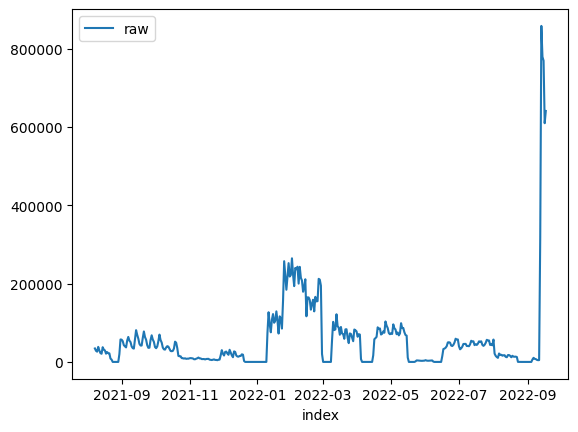

Training...

100%|███████████████████████████████████████| 50/50 [01:49<00:00,  2.19s/trial, best loss: 0.8683434895738125]
Prediction...
730441.0 2022-09-18
caso1
{'Success': True, 'AdjustedActual': 0.08387747930016287, 'ConfLevel': 90.0, 'Prediction': 1364224.1840498317, 'PredStdErr': 2189203.513980443, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.022678413037367617, 'DownAnomalyProbability': 0.5113392065186838, 'UpAnomalyProbability': 0.4886607934813162, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 5,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


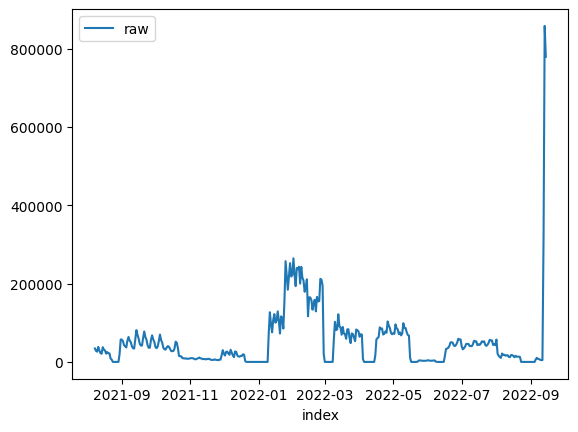

Training...

100%|████████████████████████████████████████| 50/50 [02:18<00:00,  2.76s/trial, best loss: 2.061834063782232]
Prediction...
769516.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 769516.0, 'Prediction': 411524.0659309331, 'StdErr': 32485.042502997192, 'CILower': 358090.92594820546, 'CIUpper': 464957.20591366076, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 1.0, 'DownAnomalyProbability': 0.0, 'UpAnomalyProbability': 1.0, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 609828.0, 'Prediction': 327743.40119139204, 'StdErr': 36138.1833059824, 'CILower': 268301.37930910976, 'CIUpper': 387185.4230736743, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 0.999999999999994, 'DownAnomalyProbability': 2.9976021664879227e-15, 'UpAnomalyProbability': 0.999999999999997, 'Mod

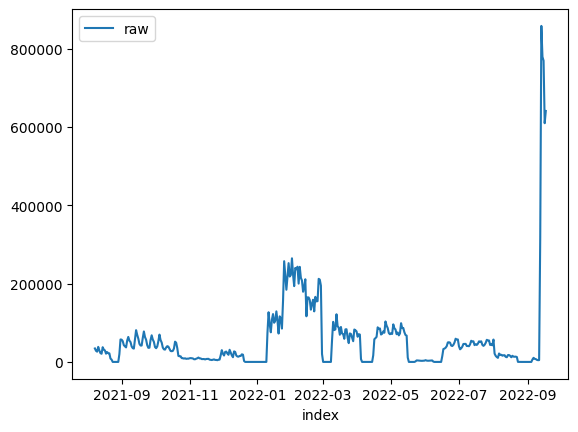

Training...

100%|███████████████████████████████████████| 50/50 [01:56<00:00,  2.34s/trial, best loss: 0.8613708681902452]
Prediction...
730441.0 2022-09-18
caso1
{'Success': True, 'AdjustedActual': 0.08387747930016287, 'ConfLevel': 90.0, 'Prediction': 1364224.1840498317, 'PredStdErr': 2189203.513980443, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.022678413037367617, 'DownAnomalyProbability': 0.5113392065186838, 'UpAnomalyProbability': 0.4886607934813162, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 5,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


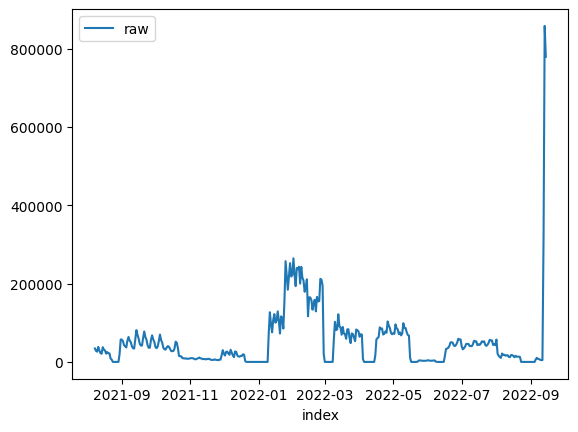

Training...

100%|███████████████████████████████████████| 50/50 [02:23<00:00,  2.87s/trial, best loss: 2.1053712649728356]
Prediction...
769516.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': 0.08732836928153587, 'ConfLevel': 90.0, 'Prediction': 2518100.2632693215, 'PredStdErr': 4053173.3483466227, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2639187079599514, 'DownAnomalyProbability': 0.6319593539799757, 'UpAnomalyProbability': 0.36804064602002423, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.13831095075145905, 'ConfLevel': 90.0, 'Prediction': 2296082.0464152023, 'PredStdErr': 3695809.515316246, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.34162709143855374, 'DownAnomalyProbability': 0.6708135457192769, 'UpAnomalyProbability': 0.32918645428072313, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso1
{'Success': True, 'Adjusted

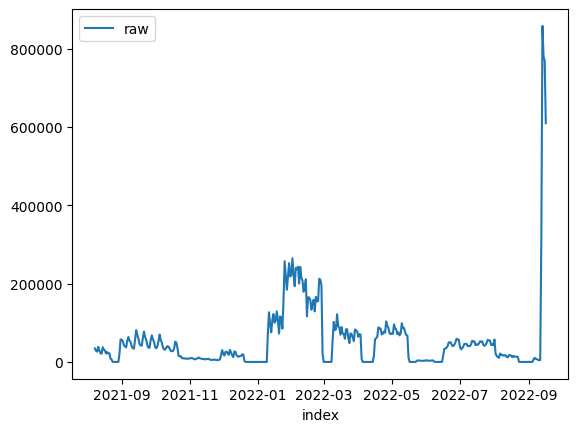

Training...

100%|███████████████████████████████████████| 50/50 [01:47<00:00,  2.15s/trial, best loss: 0.8635829356386294]
Prediction...
641071.0 2022-09-17
caso1
{'Success': True, 'AdjustedActual': 0.32650496883167324, 'ConfLevel': 90.0, 'Prediction': 1461629.6437893857, 'PredStdErr': 2349955.0345344297, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.028128148876594983, 'DownAnomalyProbability': 0.4859359255617025, 'UpAnomalyProbability': 0.5140640744382975, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 6,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


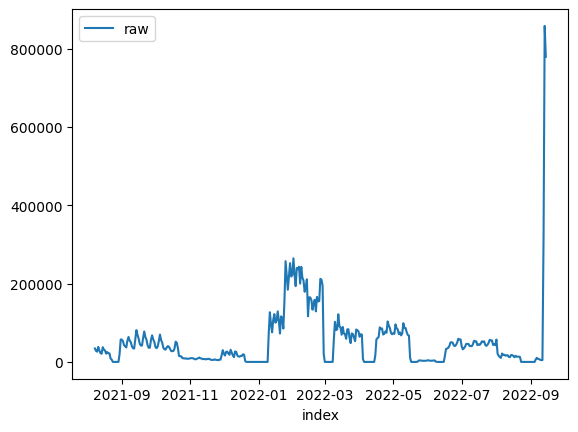

Training...

100%|███████████████████████████████████████| 50/50 [02:41<00:00,  3.23s/trial, best loss: 1.8873728481802905]
Prediction...
769516.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 769516.0, 'Prediction': 410325.4880942547, 'StdErr': 32584.541597860924, 'CILower': 356728.68666446203, 'CIUpper': 463922.28952404734, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 1.0, 'DownAnomalyProbability': 0.0, 'UpAnomalyProbability': 1.0, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 609828.0, 'Prediction': 337483.68338923884, 'StdErr': 36346.48585285239, 'CILower': 277699.0343072342, 'CIUpper': 397268.33247124346, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 0.9999999999999327, 'DownAnomalyProbability': 3.3639757646142243e-14, 'UpAnomalyProbability': 0.9999999999999664, '

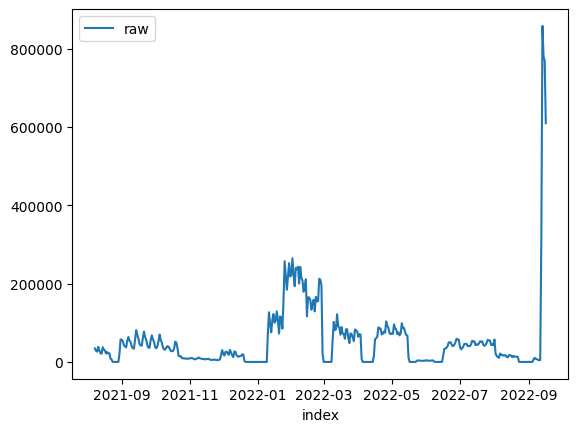

Training...

100%|███████████████████████████████████████| 50/50 [01:50<00:00,  2.20s/trial, best loss: 0.9331900076399081]
Prediction...
641071.0 2022-09-17
caso1
{'Success': True, 'AdjustedActual': 0.32650496883167324, 'ConfLevel': 90.0, 'Prediction': 1461629.6437893857, 'PredStdErr': 2349955.0345344297, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.028128148876594983, 'DownAnomalyProbability': 0.4859359255617025, 'UpAnomalyProbability': 0.5140640744382975, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 6,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


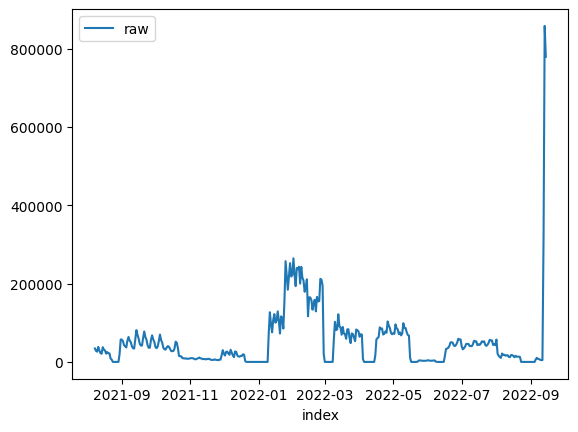

Training...

100%|████████████████████████████████████████| 50/50 [02:27<00:00,  2.95s/trial, best loss: 2.106413135198522]
Prediction...
769516.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': 0.08732836928153587, 'ConfLevel': 90.0, 'Prediction': 2518100.2632693215, 'PredStdErr': 4053173.3483466227, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2639187079599514, 'DownAnomalyProbability': 0.6319593539799757, 'UpAnomalyProbability': 0.36804064602002423, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.13831095075145905, 'ConfLevel': 90.0, 'Prediction': 2296082.0464152023, 'PredStdErr': 3695809.515316246, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.34162709143855374, 'DownAnomalyProbability': 0.6708135457192769, 'UpAnomalyProbability': 0.32918645428072313, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso1
{'Success': True, 'Adjusted

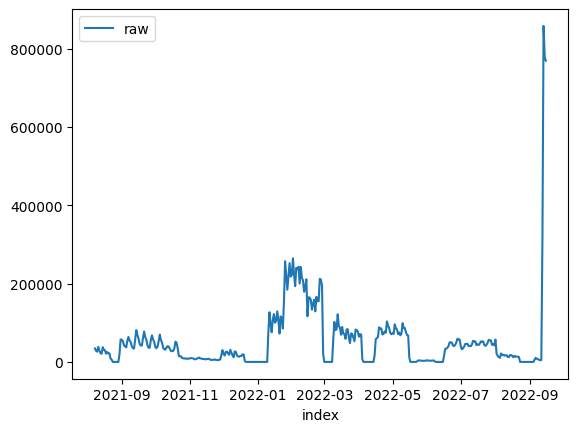

Training...

100%|███████████████████████████████████████| 50/50 [02:16<00:00,  2.72s/trial, best loss: 1.7374866358652679]
Prediction...
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.19734334946393328, 'ConfLevel': 90.0, 'Prediction': 1799586.4633667958, 'PredStdErr': 2895349.7455451265, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2537010133085307, 'DownAnomalyProbability': 0.6268505066542653, 'UpAnomalyProbability': 0.37314949334573466, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 7,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


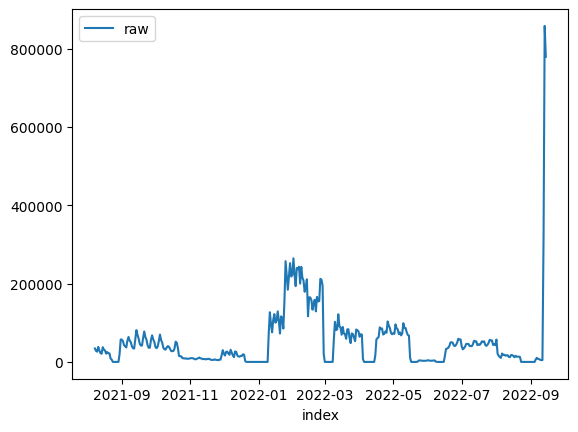

Training...

100%|███████████████████████████████████████| 50/50 [01:55<00:00,  2.32s/trial, best loss: 1.5693538171633183]
Prediction...
769516.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': 0.08732836928153587, 'ConfLevel': 90.0, 'Prediction': 2518100.2632693215, 'PredStdErr': 4053173.3483466227, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2639187079599514, 'DownAnomalyProbability': 0.6319593539799757, 'UpAnomalyProbability': 0.36804064602002423, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.13831095075145905, 'ConfLevel': 90.0, 'Prediction': 2296082.0464152023, 'PredStdErr': 3695809.515316246, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.34162709143855374, 'DownAnomalyProbability': 0.6708135457192769, 'UpAnomalyProbability': 0.32918645428072313, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso1
{'Success': True, 'Adjusted

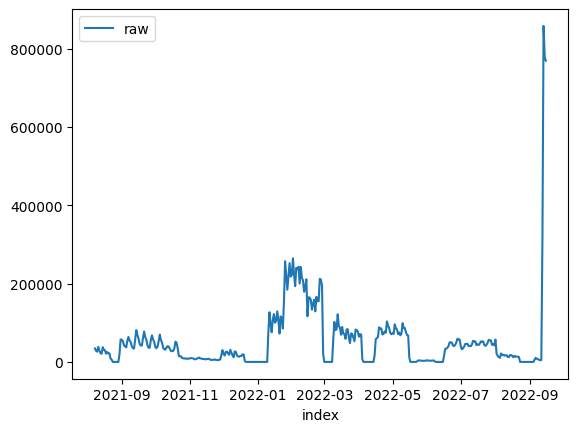

Training...

100%|████████████████████████████████████████| 50/50 [02:41<00:00,  3.24s/trial, best loss: 1.930636741484437]
Prediction...
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.19734334946393328, 'ConfLevel': 90.0, 'Prediction': 1799586.4633667958, 'PredStdErr': 2895349.7455451265, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2537010133085307, 'DownAnomalyProbability': 0.6268505066542653, 'UpAnomalyProbability': 0.37314949334573466, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.campaign_progress'),
 'param_days_range': 7,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


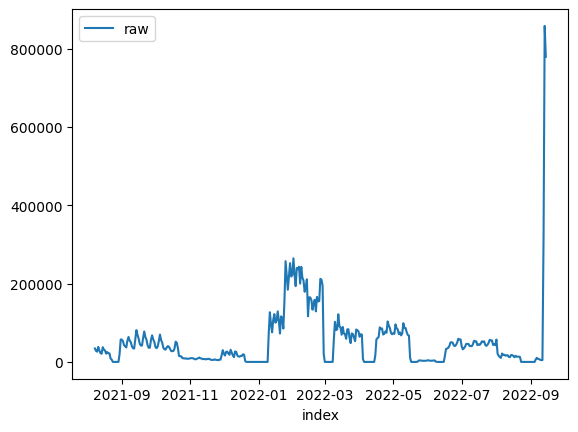

Training...

100%|███████████████████████████████████████| 50/50 [01:59<00:00,  2.38s/trial, best loss: 1.9757695531590072]
Prediction...
769516.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': 0.08732836928153587, 'ConfLevel': 90.0, 'Prediction': 2518100.2632693215, 'PredStdErr': 4053173.3483466227, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2639187079599514, 'DownAnomalyProbability': 0.6319593539799757, 'UpAnomalyProbability': 0.36804064602002423, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
609828.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.13831095075145905, 'ConfLevel': 90.0, 'Prediction': 2296082.0464152023, 'PredStdErr': 3695809.515316246, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.34162709143855374, 'DownAnomalyProbability': 0.6708135457192769, 'UpAnomalyProbability': 0.32918645428072313, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
641071.0 2022-09-17
caso1
{'Success': True, 'Adjusted

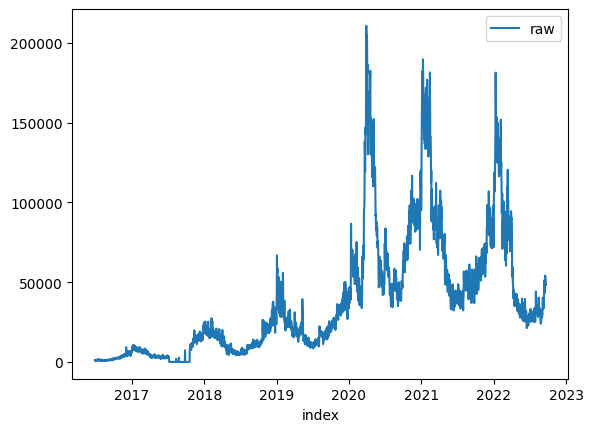

Training...

100%|██████████████████████████████████████| 50/50 [03:01<00:00,  3.63s/trial, best loss: 0.18602851821169183]
Prediction...
42818.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 42818.0, 'Prediction': 48881.48952766516, 'StdErr': 3930.515616151565, 'CILower': 42416.366660648855, 'CIUpper': 55346.61239468146, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8770891975428243, 'DownAnomalyProbability': 0.9385445987714122, 'UpAnomalyProbability': 0.06145540122858782, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 1,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


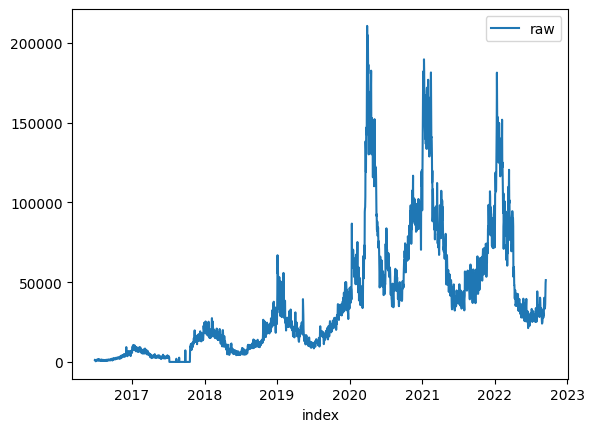

Training...

100%|██████████████████████████████████████| 50/50 [02:58<00:00,  3.56s/trial, best loss: 0.22919927883201133]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 47359.84492013419, 'StdErr': 1905.5665627106157, 'CILower': 44225.46684806218, 'CIUpper': 50494.222992206196, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.14538166911447448, 'DownAnomalyProbability': 0.42730916544276276, 'UpAnomalyProbability': 0.5726908345572372, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 44857.7580343802, 'StdErr': 1919.2821225212351, 'CILower': 41700.819874008026, 'CIUpper': 48014.69619475237, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5502823102808754, 'DownAnomalyProbability': 0.7751411551404377, 'UpA

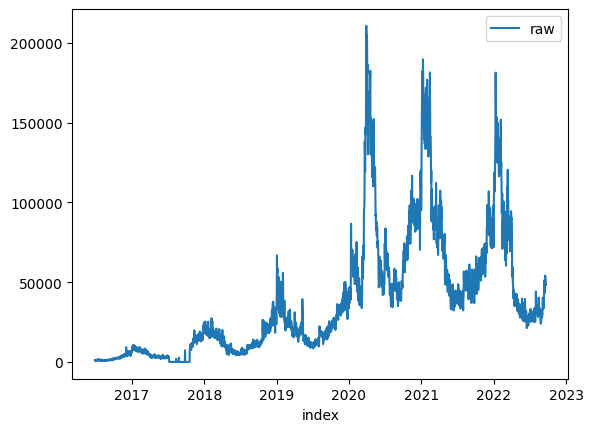

Training...

100%|███████████████████████████████████████| 50/50 [03:00<00:00,  3.61s/trial, best loss: 0.1610986600114804]
Prediction...
42818.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 42818.0, 'Prediction': 49097.164774243414, 'StdErr': 4279.888672669354, 'CILower': 42057.374368054705, 'CIUpper': 56136.95518043212, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8576600493208375, 'DownAnomalyProbability': 0.9288300246604188, 'UpAnomalyProbability': 0.07116997533958126, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 1,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


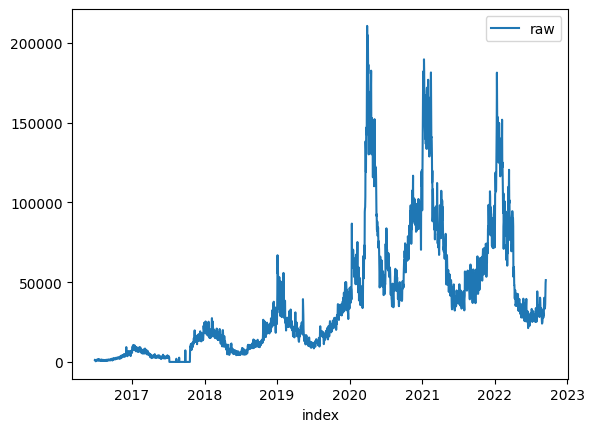

Training...

100%|██████████████████████████████████████| 50/50 [06:56<00:00,  8.33s/trial, best loss: 0.20009842150752077]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 48916.70686595069, 'StdErr': 7418.397460975295, 'CILower': 36714.52889609789, 'CIUpper': 61118.884835803496, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.12932321707306538, 'DownAnomalyProbability': 0.5646616085365327, 'UpAnomalyProbability': 0.4353383914634673, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 47586.00363284396, 'StdErr': 7420.186238026821, 'CILower': 35380.883386570145, 'CIUpper': 59791.123879117775, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4266971444256029, 'DownAnomalyProbability': 0.7133485722128015, 'UpAn

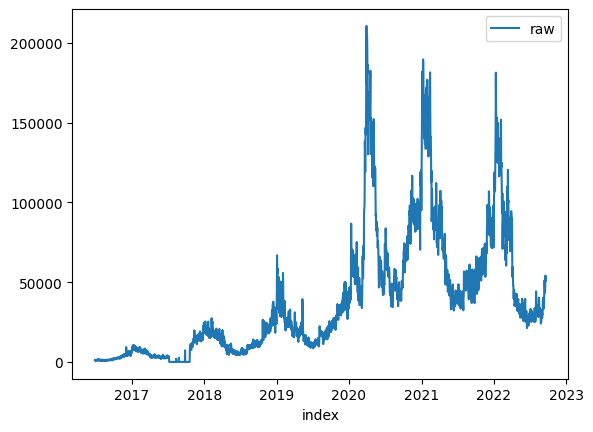

Training...

100%|███████████████████████████████████████| 50/50 [06:43<00:00,  8.07s/trial, best loss: 0.3715547999473557]
Prediction...
48231.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 48231.0, 'Prediction': 47813.84458599255, 'StdErr': 6980.901743174909, 'CILower': 36331.283034339445, 'CIUpper': 59296.40613764565, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.047650560632142014, 'DownAnomalyProbability': 0.476174719683929, 'UpAnomalyProbability': 0.523825280316071, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 2,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


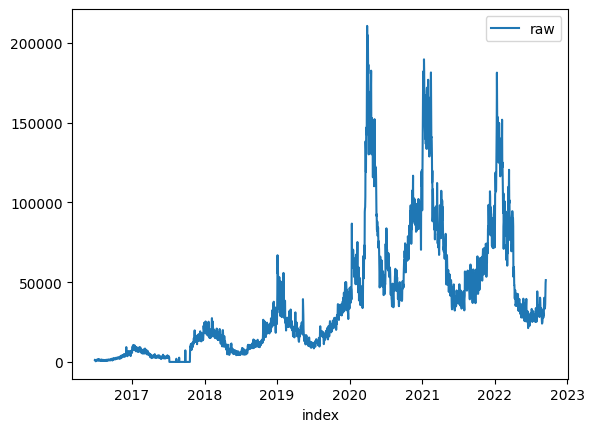

Training...

100%|██████████████████████████████████████| 50/50 [06:58<00:00,  8.36s/trial, best loss: 0.22817772563957578]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 48916.70686595069, 'StdErr': 7418.397460975295, 'CILower': 36714.52889609789, 'CIUpper': 61118.884835803496, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.12932321707306538, 'DownAnomalyProbability': 0.5646616085365327, 'UpAnomalyProbability': 0.4353383914634673, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 47586.00363284396, 'StdErr': 7420.186238026821, 'CILower': 35380.883386570145, 'CIUpper': 59791.123879117775, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4266971444256029, 'DownAnomalyProbability': 0.7133485722128015, 'UpAn

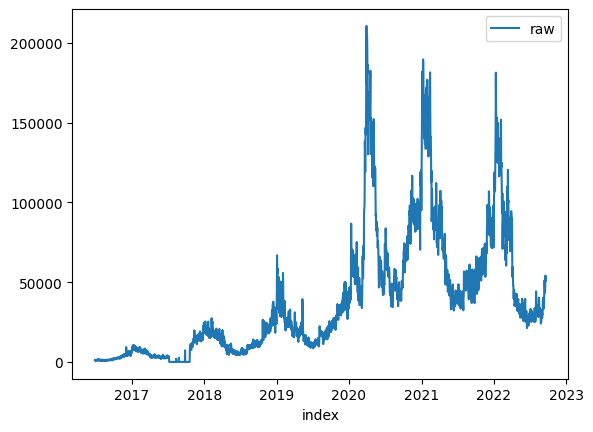

Training...

100%|██████████████████████████████████████| 50/50 [07:06<00:00,  8.53s/trial, best loss: 0.32391966216582035]
Prediction...
48231.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 48231.0, 'Prediction': 51486.96798399004, 'StdErr': 7154.367885372714, 'CILower': 39719.0800191896, 'CIUpper': 63254.855948790486, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3509642262806685, 'DownAnomalyProbability': 0.6754821131403342, 'UpAnomalyProbability': 0.32451788685966576, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 2,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


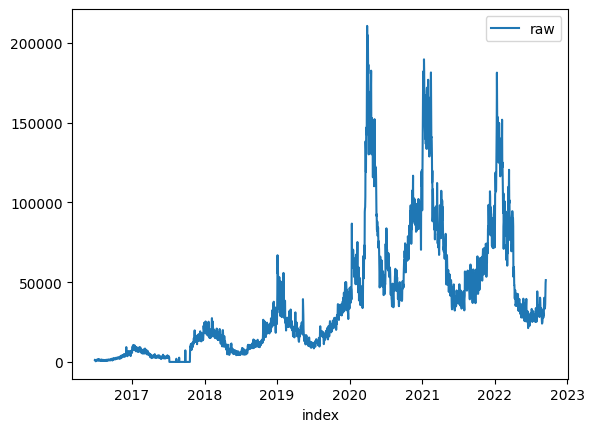

Training...

100%|███████████████████████████████████████| 50/50 [04:25<00:00,  5.31s/trial, best loss: 0.2333960741934933]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 47265.87292691015, 'StdErr': 1897.8384334171321, 'CILower': 44144.20649633608, 'CIUpper': 50387.539357484224, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.18461938415701828, 'DownAnomalyProbability': 0.40769030792149086, 'UpAnomalyProbability': 0.5923096920785091, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 45258.37235202819, 'StdErr': 1905.1487530142447, 'CILower': 42124.681515750635, 'CIUpper': 48392.06318830575, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6688365699720953, 'DownAnomalyProbability': 0.8344182849860476, 'Up

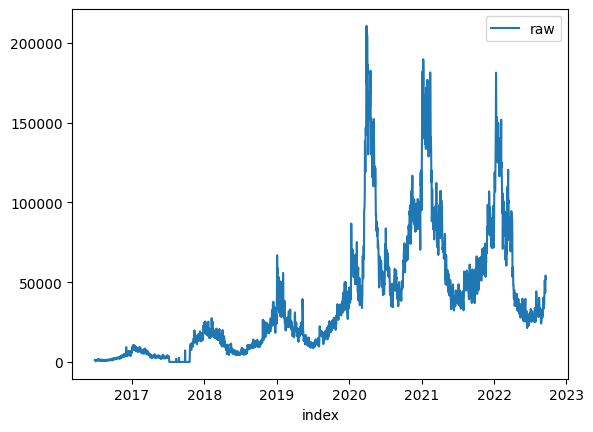

Training...

100%|███████████████████████████████████████| 50/50 [07:00<00:00,  8.41s/trial, best loss: 0.2800084128931037]
Prediction...
50844.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 50844.0, 'Prediction': 54845.52671715832, 'StdErr': 6865.900098829107, 'CILower': 43552.12603731279, 'CIUpper': 66138.92739700385, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.43997991340374165, 'DownAnomalyProbability': 0.7199899567018708, 'UpAnomalyProbability': 0.2800100432981292, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


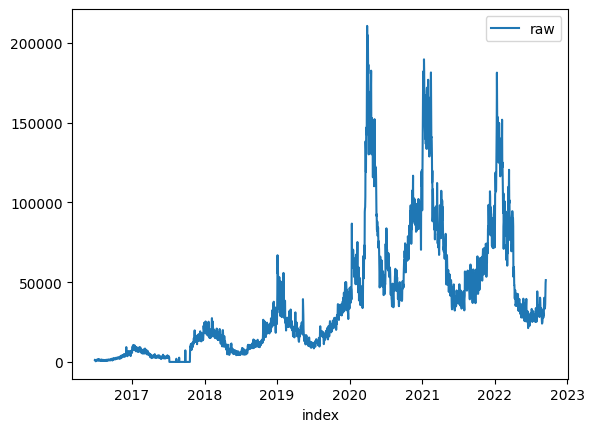

Training...

100%|███████████████████████████████████████| 50/50 [03:30<00:00,  4.21s/trial, best loss: 0.2598179448979369]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 47773.532552060155, 'StdErr': 1775.0522022751522, 'CILower': 44853.831499119675, 'CIUpper': 50693.233605000634, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.029000942501643534, 'DownAnomalyProbability': 0.5145004712508218, 'UpAnomalyProbability': 0.48549952874917823, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 45843.85603440771, 'StdErr': 1796.606056394835, 'CILower': 42888.702046343686, 'CIUpper': 48799.01002247174, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8250173720046101, 'DownAnomalyProbability': 0.9125086860023051, '

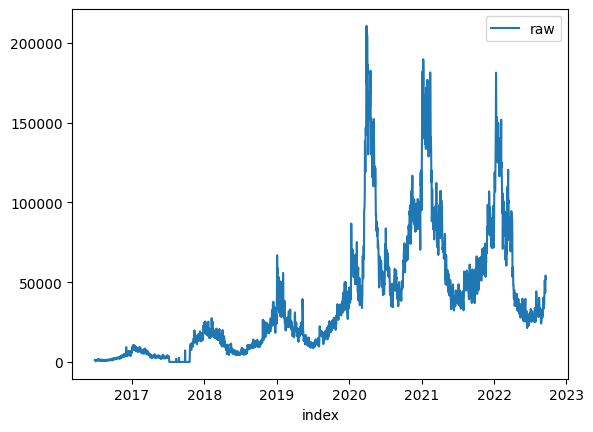

Training...

100%|██████████████████████████████████████| 50/50 [06:27<00:00,  7.75s/trial, best loss: 0.26936941489269045]
Prediction...
50844.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 50844.0, 'Prediction': 56119.89999328243, 'StdErr': 6859.082436066703, 'CILower': 44837.713370758975, 'CIUpper': 67402.08661580589, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5582162179983126, 'DownAnomalyProbability': 0.7791081089991563, 'UpAnomalyProbability': 0.22089189100084372, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 3,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


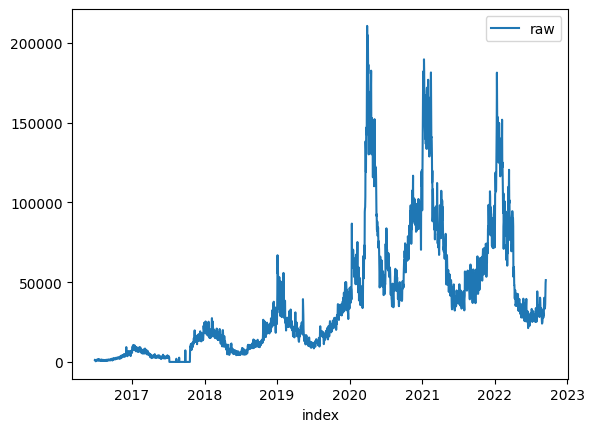

Training...

100%|██████████████████████████████████████| 50/50 [03:44<00:00,  4.50s/trial, best loss: 0.21308600005337502]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 47650.50404615906, 'StdErr': 1896.0679118555936, 'CILower': 44531.74986439708, 'CIUpper': 50769.25822792104, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.024611784914904344, 'DownAnomalyProbability': 0.48769410754254783, 'UpAnomalyProbability': 0.5123058924574522, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 44813.492397943715, 'StdErr': 1909.5073263438762, 'CILower': 41672.632346516584, 'CIUpper': 47954.35244937085, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5386182140234683, 'DownAnomalyProbability': 0.7693091070117342, 'U

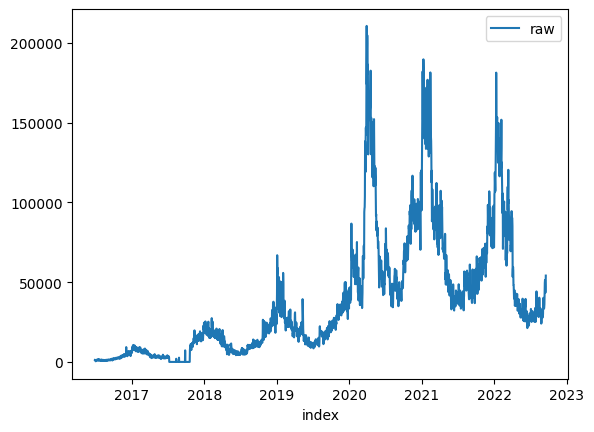

Training...

100%|██████████████████████████████████████| 50/50 [07:03<00:00,  8.48s/trial, best loss: 0.26990906554606753]
Prediction...
52267.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.864139608109037, 'LogTransformedPrediction': 10.948049265445206, 'LogTransformedStdErr': 0.08840103389325156, 'LogTransformedCILower': 10.802642504219632, 'LogTransformedCIUpper': 11.093456026670781, 'AdjustedActual': 52266.99999999999, 'Prediction': 57064.59284304464, 'StdErr': 5054.5291466536655, 'CILower': 48750.632243639426, 'CIUpper': 65378.55344244985, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6574643755255292, 'DownAnomalyProbability': 0.8287321877627646, 'UpAnomalyProbability': 0.17126781223723542, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 4,
 'param_is_log': False,
 'param_weekly_

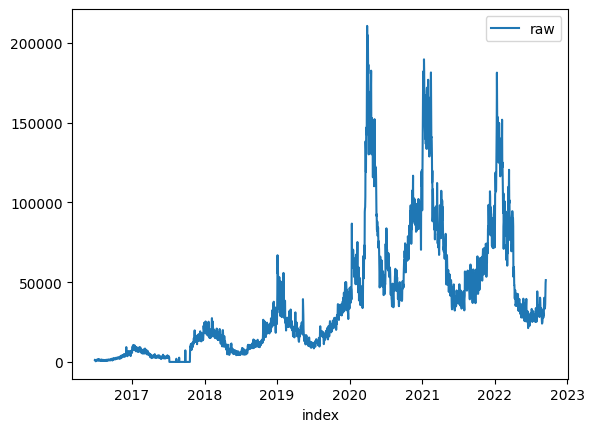

Training...

100%|██████████████████████████████████████| 50/50 [03:11<00:00,  3.83s/trial, best loss: 0.23459570078073091]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 47736.22356110671, 'StdErr': 1922.842080865637, 'CILower': 44573.42979033995, 'CIUpper': 50899.01733187347, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.011296056847174052, 'DownAnomalyProbability': 0.505648028423587, 'UpAnomalyProbability': 0.494351971576413, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 45883.3443003672, 'StdErr': 1928.1558301904538, 'CILower': 42711.8101897508, 'CIUpper': 49054.8784109836, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8009654905555381, 'DownAnomalyProbability': 0.9004827452777691, 'UpAnomalyP

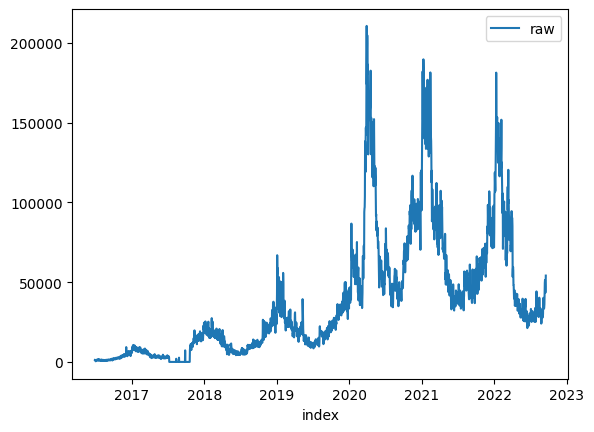

Training...

100%|██████████████████████████████████████| 50/50 [06:33<00:00,  7.86s/trial, best loss: 0.29803555603096094]
Prediction...
52267.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 52267.0, 'Prediction': 57907.51184352194, 'StdErr': 7483.376972487305, 'CILower': 45598.45208848107, 'CIUpper': 70216.57159856282, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5489939423213395, 'DownAnomalyProbability': 0.7744969711606697, 'UpAnomalyProbability': 0.2255030288393302, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 4,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


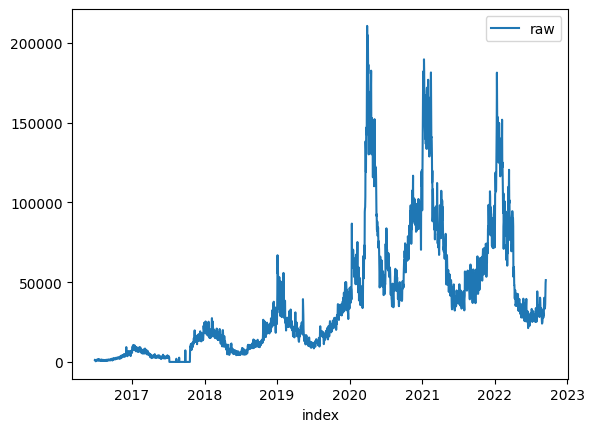

Training...

100%|███████████████████████████████████████| 50/50 [03:14<00:00,  3.90s/trial, best loss: 0.2323798495168799]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 47736.22356110671, 'StdErr': 1922.842080865637, 'CILower': 44573.42979033995, 'CIUpper': 50899.01733187347, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.011296056847174052, 'DownAnomalyProbability': 0.505648028423587, 'UpAnomalyProbability': 0.494351971576413, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 45883.3443003672, 'StdErr': 1928.1558301904538, 'CILower': 42711.8101897508, 'CIUpper': 49054.8784109836, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8009654905555381, 'DownAnomalyProbability': 0.9004827452777691, 'UpAnomalyP

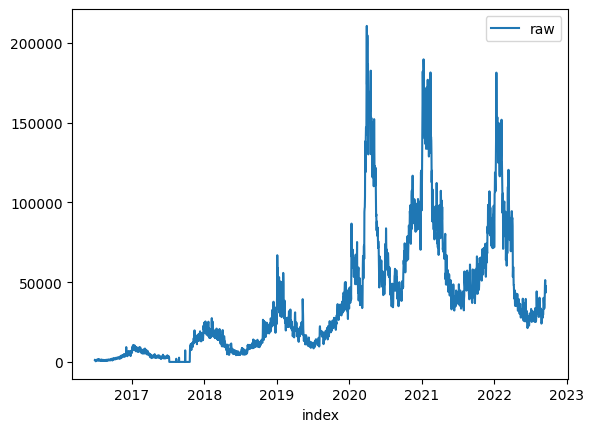

Training...

100%|██████████████████████████████████████| 50/50 [06:52<00:00,  8.24s/trial, best loss: 0.23340738169261172]
Prediction...
54153.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.899587118583698, 'LogTransformedPrediction': 10.845608379822306, 'LogTransformedStdErr': 0.08762911618259284, 'LogTransformedCILower': 10.701471310242816, 'LogTransformedCIUpper': 10.989745449401795, 'AdjustedActual': 54152.99999999998, 'Prediction': 51504.702610558015, 'StdErr': 4522.077517561009, 'CILower': 44066.54700444208, 'CIUpper': 58942.85821667395, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.44188074109427866, 'DownAnomalyProbability': 0.27905962945286067, 'UpAnomalyProbability': 0.7209403705471393, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 5,
 'param_is_log': False,
 'param_weekly_

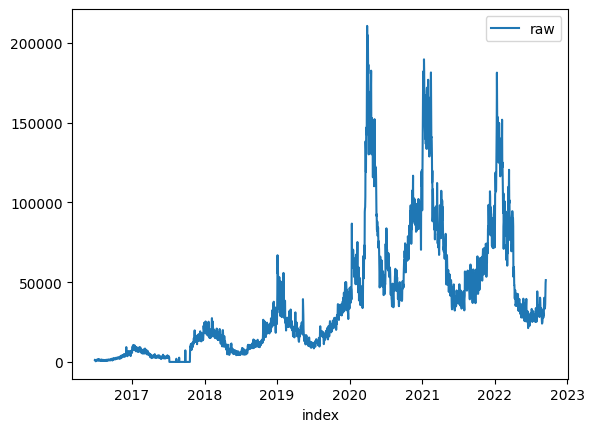

Training...

100%|██████████████████████████████████████| 50/50 [06:22<00:00,  7.65s/trial, best loss: 0.34552818371189237]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 46205.508776840645, 'StdErr': 7275.5668986922565, 'CILower': 34238.26617539861, 'CIUpper': 58172.75137828268, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.16371628935438332, 'DownAnomalyProbability': 0.41814185532280834, 'UpAnomalyProbability': 0.5818581446771917, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 44766.84738805994, 'StdErr': 7340.424397406319, 'CILower': 32692.92369462308, 'CIUpper': 56840.7710814968, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.14697065471421622, 'DownAnomalyProbability': 0.5734853273571081, 'UpAn

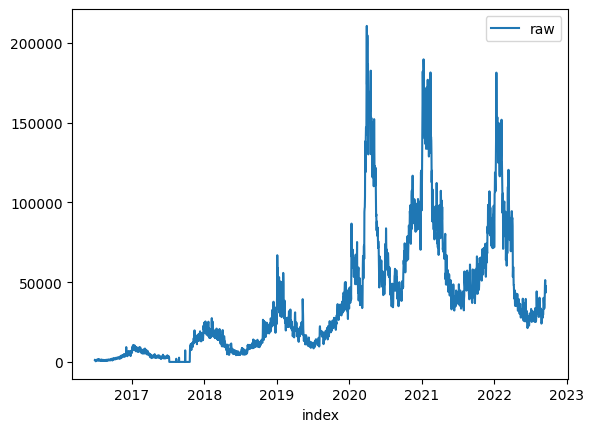

Training...

100%|███████████████████████████████████████| 50/50 [06:52<00:00,  8.24s/trial, best loss: 0.3164643146279181]
Prediction...
54153.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54153.0, 'Prediction': 50097.023871452475, 'StdErr': 6908.726062655719, 'CILower': 38733.18074967905, 'CIUpper': 61460.8669932259, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4428501406381131, 'DownAnomalyProbability': 0.27857492968094344, 'UpAnomalyProbability': 0.7214250703190566, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 5,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


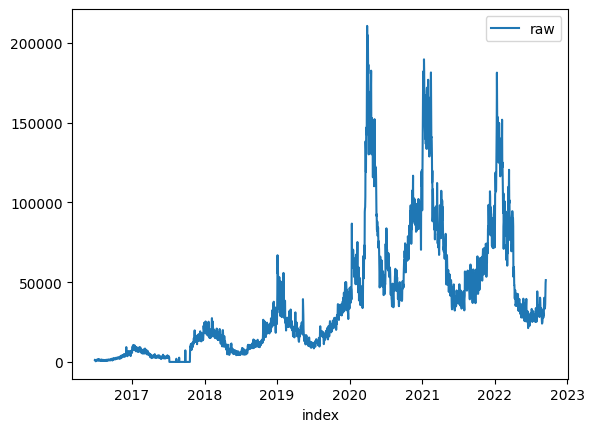

Training...

100%|██████████████████████████████████████| 50/50 [03:35<00:00,  4.32s/trial, best loss: 0.23489184298696655]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 48337.50544202585, 'StdErr': 1903.483533450808, 'CILower': 45206.55364818689, 'CIUpper': 51468.457235864815, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2587413010317785, 'DownAnomalyProbability': 0.6293706505158893, 'UpAnomalyProbability': 0.37062934948411075, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 45878.02035189287, 'StdErr': 1912.9039044813626, 'CILower': 42731.57342659707, 'CIUpper': 49024.46727718867, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.803561105405068, 'DownAnomalyProbability': 0.901780552702534, 'UpAnoma

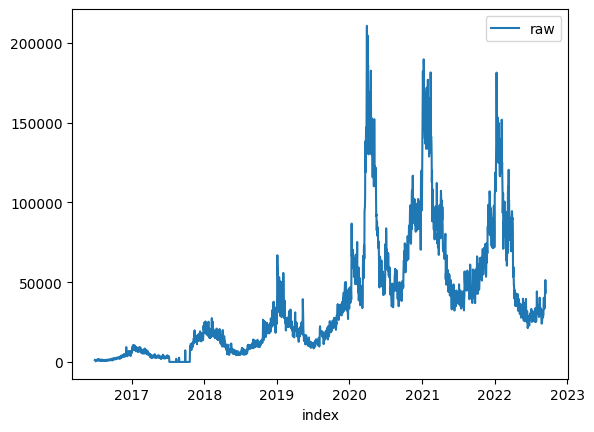

Training...

100%|███████████████████████████████████████████████████| 50/50 [06:26<00:00,  7.73s/trial, best loss: 1e+100]
Prediction...
47425.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47425.0, 'Prediction': 44667.62386039527, 'StdErr': 6997.173022594501, 'CILower': 33158.298435773715, 'CIUpper': 56176.94928501683, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.30647065840620824, 'DownAnomalyProbability': 0.3467646707968959, 'UpAnomalyProbability': 0.6532353292031041, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 6,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


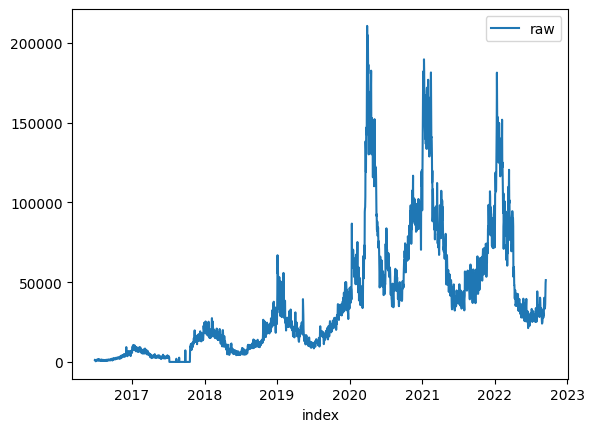

Training...

100%|██████████████████████████████████████| 50/50 [03:10<00:00,  3.80s/trial, best loss: 0.24967218006651756]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 47547.004027002076, 'StdErr': 1912.7180800239955, 'CILower': 44400.86275573895, 'CIUpper': 50693.145298265204, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.06749542860324231, 'DownAnomalyProbability': 0.46625228569837884, 'UpAnomalyProbability': 0.5337477143016212, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 45356.558722351, 'StdErr': 1924.276174337406, 'CILower': 42191.40607773582, 'CIUpper': 48521.711366966185, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6890060996005394, 'DownAnomalyProbability': 0.8445030498002697, 'UpAn

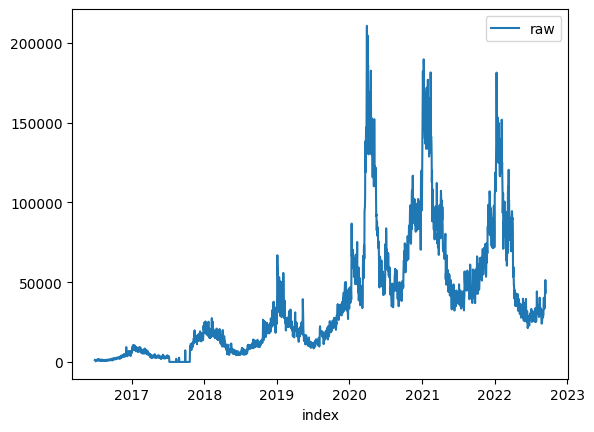

Training...

100%|███████████████████████████████████████████████████| 50/50 [04:59<00:00,  5.98s/trial, best loss: 1e+100]
Prediction...
47425.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.766925880506054, 'LogTransformedPrediction': 10.725693365514628, 'LogTransformedStdErr': 0.09462071015559192, 'LogTransformedCILower': 10.57005614723048, 'LogTransformedCIUpper': 10.881330583798777, 'AdjustedActual': 47424.99999999997, 'Prediction': 45713.45847754731, 'StdErr': 4335.23432122443, 'CILower': 38582.63258059681, 'CIUpper': 52844.284374497816, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.30700797496231624, 'DownAnomalyProbability': 0.3464960125188419, 'UpAnomalyProbability': 0.6535039874811581, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 6,
 'param_is_log': True,
 'param_weekly_mode

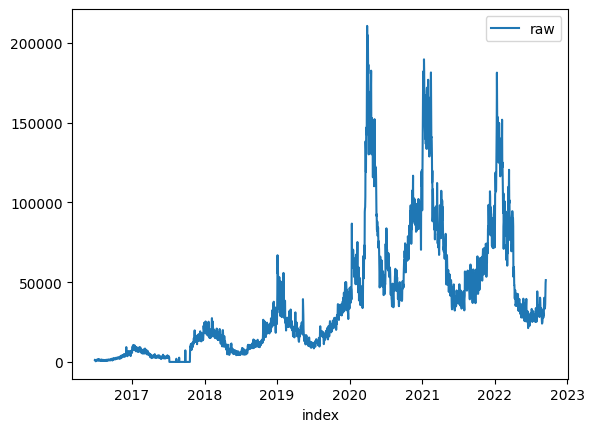

Training...

100%|██████████████████████████████████████| 50/50 [03:30<00:00,  4.22s/trial, best loss: 0.24556056072446203]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 47423.87203027714, 'StdErr': 1909.9094319912626, 'CILower': 44282.35057391749, 'CIUpper': 50565.39348663679, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.11867419891913289, 'DownAnomalyProbability': 0.44066290054043356, 'UpAnomalyProbability': 0.5593370994595664, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 44892.14025562596, 'StdErr': 1924.4538622863759, 'CILower': 41726.69534034345, 'CIUpper': 48057.585170908475, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5597199393859777, 'DownAnomalyProbability': 0.7798599696929889, 'UpA

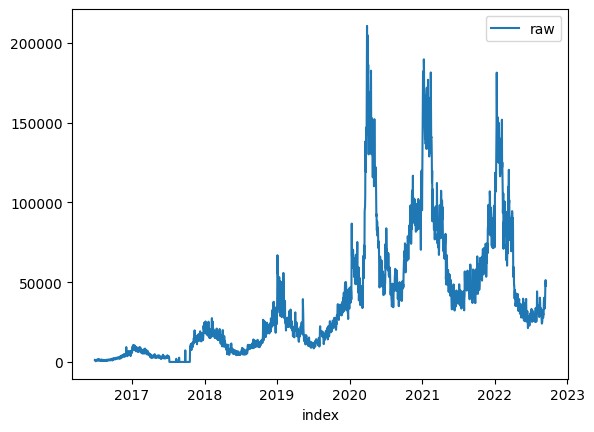

Training...

100%|███████████████████████████████████████████████████| 50/50 [03:04<00:00,  3.69s/trial, best loss: 1e+100]
Prediction...
43407.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -687.0, 'ConfLevel': 90.0, 'Prediction': 42701.192874406355, 'PredStdErr': 2305.951337924176, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.0961507679564444, 'DownAnomalyProbability': 0.4519246160217778, 'UpAnomalyProbability': 0.5480753839782222, 'NonStationarityDiffOrder': 2, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 7,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


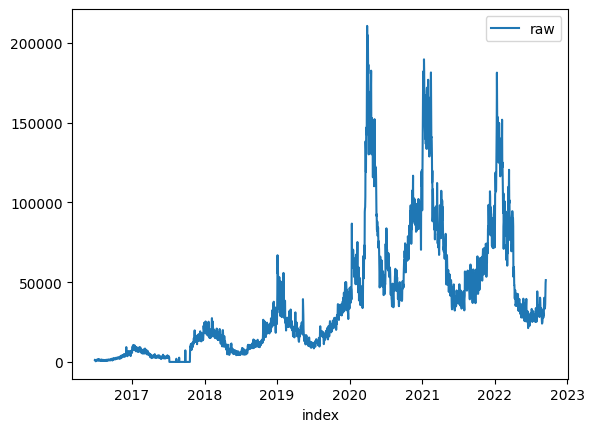

Training...

100%|███████████████████████████████████████| 50/50 [03:04<00:00,  3.70s/trial, best loss: 0.2602285024163669]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 48337.50544202585, 'StdErr': 1903.483533450808, 'CILower': 45206.55364818689, 'CIUpper': 51468.457235864815, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2587413010317785, 'DownAnomalyProbability': 0.6293706505158893, 'UpAnomalyProbability': 0.37062934948411075, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 45878.02035189287, 'StdErr': 1912.9039044813626, 'CILower': 42731.57342659707, 'CIUpper': 49024.46727718867, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.803561105405068, 'DownAnomalyProbability': 0.901780552702534, 'UpAnoma

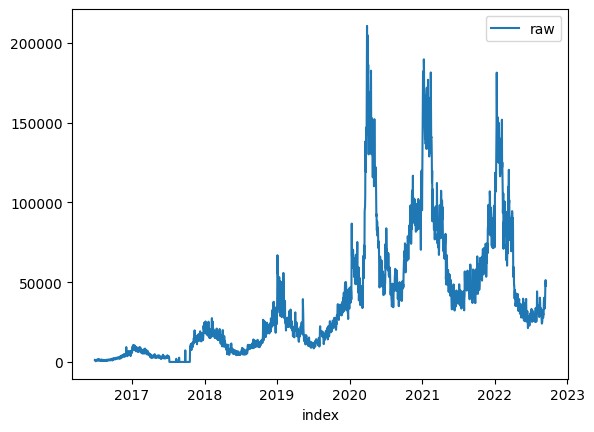

Training...

100%|███████████████████████████████████████████████████| 50/50 [05:54<00:00,  7.10s/trial, best loss: 1e+100]
Prediction...
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.678399034898712, 'LogTransformedPrediction': 10.686985787808698, 'LogTransformedStdErr': 0.09284442350900529, 'LogTransformedCILower': 10.534270301057692, 'LogTransformedCIUpper': 10.839701274559705, 'AdjustedActual': 43406.99999999996, 'Prediction': 43970.44967620038, 'StdErr': 4091.317600851253, 'CILower': 37240.831081429795, 'CIUpper': 50700.06827097096, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.10953701584987874, 'DownAnomalyProbability': 0.5547685079249394, 'UpAnomalyProbability': 0.44523149207506063, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.groupride_signup'),
 'param_days_range': 7,
 'param_is_log': True,
 'param_weekly_m

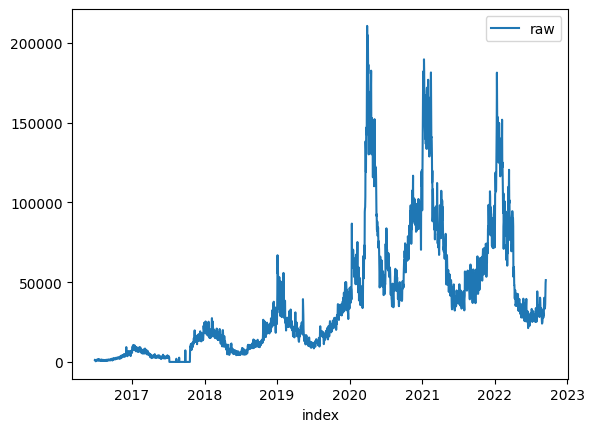

Training...

100%|██████████████████████████████████████| 50/50 [03:40<00:00,  4.40s/trial, best loss: 0.25309733313685256]
Prediction...
47709.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 47709.0, 'Prediction': 47772.977819146756, 'StdErr': 1898.6367099767615, 'CILower': 44649.99834047827, 'CIUpper': 50895.95729781524, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.02688100106086777, 'DownAnomalyProbability': 0.5134405005304339, 'UpAnomalyProbability': 0.48655949946956617, 'ModelFreshness': 0.1}
43407.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 43407.0, 'Prediction': 45382.01446902945, 'StdErr': 1910.2212657538776, 'CILower': 42239.98009177435, 'CIUpper': 48524.048846284546, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6988260680881839, 'DownAnomalyProbability': 0.849413034044092, 'UpA

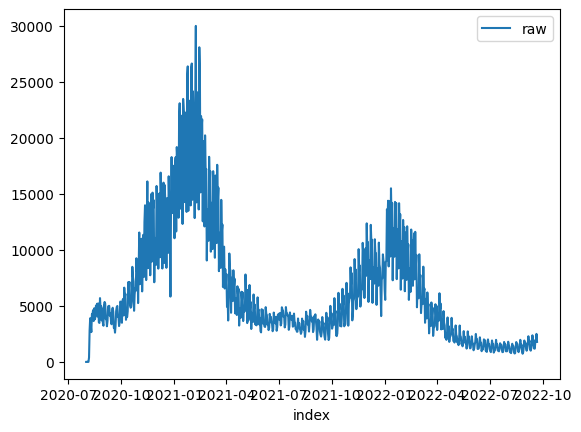

Training...

100%|███████████████████████████████████████| 50/50 [05:14<00:00,  6.29s/trial, best loss: 0.1688120518484037]
Prediction...
1838.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.516977224604321, 'LogTransformedPrediction': 7.652426895025896, 'LogTransformedStdErr': 0.24027610066883365, 'LogTransformedCILower': 7.257207879371008, 'LogTransformedCIUpper': 8.047645910680785, 'AdjustedActual': 1837.9999999999993, 'Prediction': 2166.420863088182, 'StdErr': 528.3871151594557, 'CILower': 1297.3014002837263, 'CIUpper': 3035.540325892638, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4657644976926647, 'DownAnomalyProbability': 0.7328822488463324, 'UpAnomalyProbability': 0.26711775115366765, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 1,
 'param_is_log': False,
 'param_weekly_model': True}
L

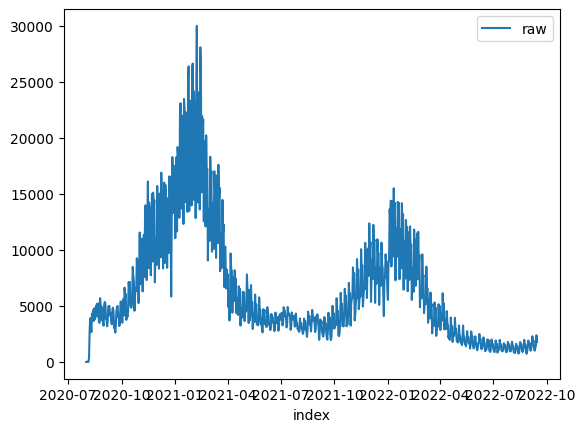

Training...

100%|██████████████████████████████████████| 50/50 [03:10<00:00,  3.81s/trial, best loss: 0.21763906451960538]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.533781534081633, 'LogTransformedStdErr': 0.12250174190148774, 'LogTransformedCILower': 7.332284099607098, 'LogTransformedCIUpper': 7.735278968556169, 'AdjustedActual': 1963.0, 'Prediction': 1883.2494907673806, 'StdErr': 231.69253298322695, 'CILower': 1502.1491875523461, 'CIUpper': 2264.349793982415, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2693104122383858, 'DownAnomalyProbability': 0.3653447938808071, 'UpAnomalyProbability': 0.6346552061191929, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.027435191199251, 'LogTra

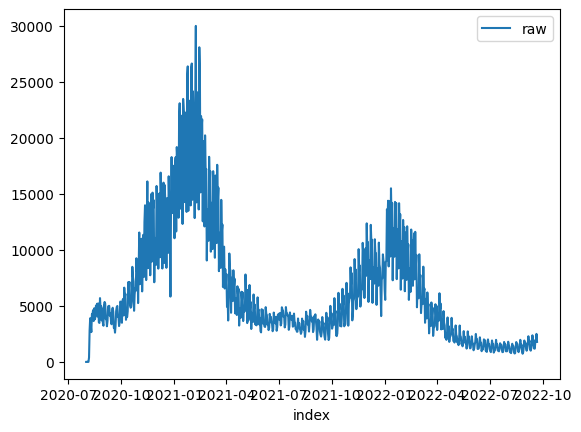

Training...

100%|██████████████████████████████████████| 50/50 [05:53<00:00,  7.06s/trial, best loss: 0.21857965729370465]
Prediction...
1838.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.516977224604321, 'LogTransformedPrediction': 7.648663918007876, 'LogTransformedStdErr': 0.21186942965900046, 'LogTransformedCILower': 7.300169718193129, 'LogTransformedCIUpper': 7.9971581178226225, 'AdjustedActual': 1837.9999999999993, 'Prediction': 2144.457822434104, 'StdErr': 459.70606486562923, 'CILower': 1388.308634308285, 'CIUpper': 2900.607010559923, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4949970138217008, 'DownAnomalyProbability': 0.7474985069108504, 'UpAnomalyProbability': 0.25250149308914965, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 1,
 'param_is_log': True,
 'param_weekly_model': True}
L

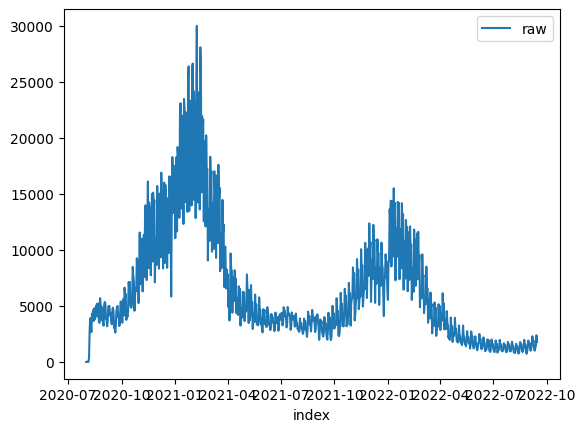

Training...

100%|██████████████████████████████████████| 50/50 [02:31<00:00,  3.03s/trial, best loss: 0.20281464794384355]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.335607933092631, 'LogTransformedStdErr': 0.21650004111180005, 'LogTransformedCILower': 6.979497055234744, 'LogTransformedCIUpper': 7.691718810950518, 'AdjustedActual': 1963.0, 'Prediction': 1569.3347104556644, 'StdErr': 344.0005865606018, 'CILower': 1003.5040979780247, 'CIUpper': 2135.165322933304, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7475313884804549, 'DownAnomalyProbability': 0.12623430575977257, 'UpAnomalyProbability': 0.8737656942402274, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.197558675729036, 'LogTra

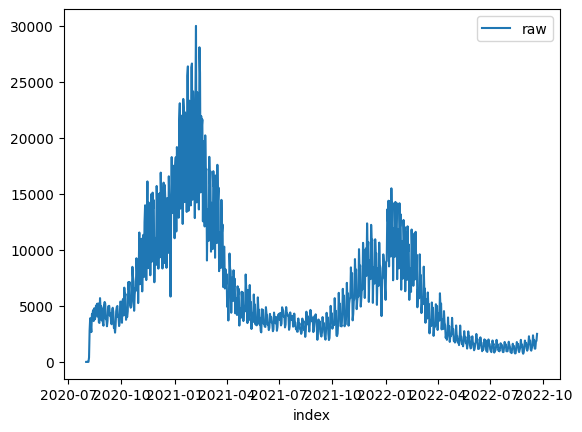

Training...

100%|███████████████████████████████████████| 50/50 [05:34<00:00,  6.69s/trial, best loss: 0.1996795235007368]
Prediction...
1787.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.488852955733459, 'LogTransformedPrediction': 7.489457894825103, 'LogTransformedStdErr': 0.22941615996439566, 'LogTransformedCILower': 7.112101892026387, 'LogTransformedCIUpper': 7.866813897623818, 'AdjustedActual': 1786.9999999999993, 'Prediction': 1835.7882002992555, 'StdErr': 426.99478606820037, 'CILower': 1133.4442777456084, 'CIUpper': 2538.1321228529027, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.0909678940805283, 'DownAnomalyProbability': 0.5454839470402641, 'UpAnomalyProbability': 0.4545160529597359, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 2,
 'param_is_log': False,
 'param_weekly_model': True}

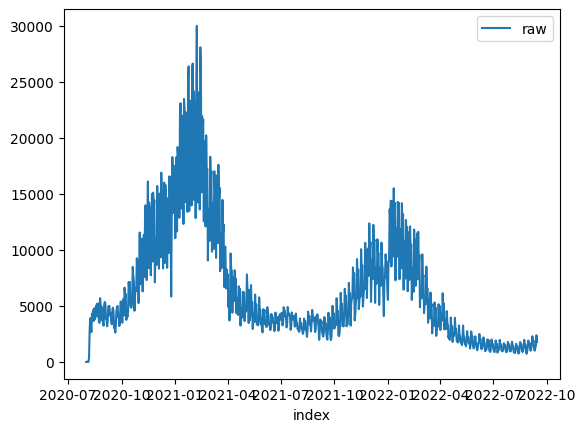

Training...

100%|██████████████████████████████████████| 50/50 [02:59<00:00,  3.60s/trial, best loss: 0.20933248982483368]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.341788573734867, 'LogTransformedStdErr': 0.21645577253987908, 'LogTransformedCILower': 6.985750511198064, 'LogTransformedCIUpper': 7.69782663627167, 'AdjustedActual': 1963.0, 'Prediction': 1579.0552985135753, 'StdErr': 346.0575519410778, 'CILower': 1009.841279069346, 'CIUpper': 2148.2693179578046, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7327777901774688, 'DownAnomalyProbability': 0.1336111049112656, 'UpAnomalyProbability': 0.8663888950887344, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.203402349531352, 'LogTrans

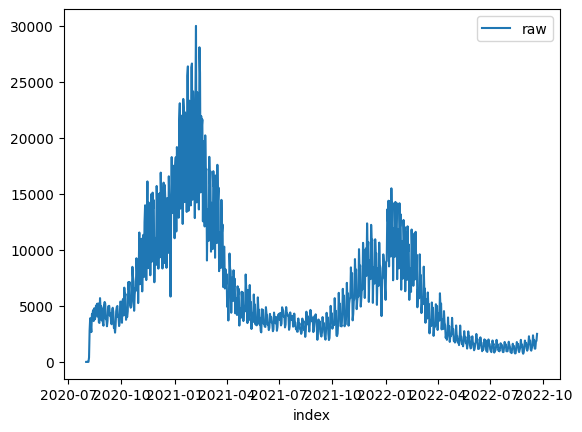

Training...

100%|███████████████████████████████████████| 50/50 [02:52<00:00,  3.45s/trial, best loss: 0.3051169535774945]
Prediction...
1787.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.488852955733459, 'LogTransformedPrediction': 7.5540270377917444, 'LogTransformedStdErr': 0.28328372849448746, 'LogTransformedCILower': 7.088066769521251, 'LogTransformedCIUpper': 8.019987306062239, 'AdjustedActual': 1786.9999999999993, 'Prediction': 1985.544295375415, 'StdErr': 574.2369644536493, 'CILower': 1041.0085416642264, 'CIUpper': 2930.0800490866036, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2704718365124572, 'DownAnomalyProbability': 0.6352359182562286, 'UpAnomalyProbability': 0.3647640817437714, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 2,
 'param_is_log': True,
 'param_weekly_model': True}
L

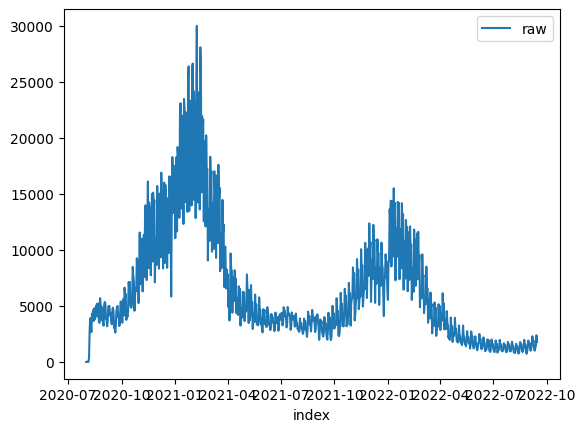

Training...

100%|██████████████████████████████████████| 50/50 [03:02<00:00,  3.65s/trial, best loss: 0.23250680296382673]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.295154051364015, 'LogTransformedStdErr': 0.20025033460525601, 'LogTransformedCILower': 6.965771562190314, 'LogTransformedCIUpper': 7.624536540537717, 'AdjustedActual': 1963.0, 'Prediction': 1501.9785972306859, 'StdErr': 304.01458485024676, 'CILower': 1001.9191046936114, 'CIUpper': 2002.0380897677603, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8705931370307913, 'DownAnomalyProbability': 0.06470343148460433, 'UpAnomalyProbability': 0.9352965685153957, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.112144702841081, 'LogT

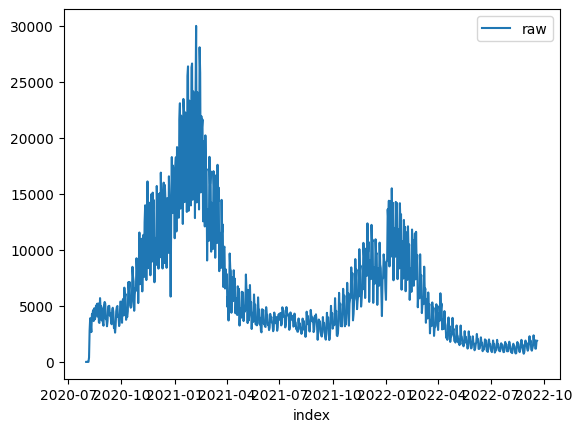

Training...

100%|███████████████████████████████████████████████████| 50/50 [03:59<00:00,  4.80s/trial, best loss: 1e+100]
Prediction...
2504.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.826044013518965, 'LogTransformedPrediction': 7.66735535273859, 'LogTransformedStdErr': 0.3099422836500119, 'LogTransformedCILower': 7.157545663331246, 'LogTransformedCIUpper': 8.177165042145933, 'AdjustedActual': 2503.9999999999995, 'Prediction': 2241.5916492658916, 'StdErr': 712.1058589798376, 'CILower': 1070.281744349512, 'CIUpper': 3412.901554182271, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2874967718606105, 'DownAnomalyProbability': 0.35625161406969474, 'UpAnomalyProbability': 0.6437483859303053, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': True}
Loa

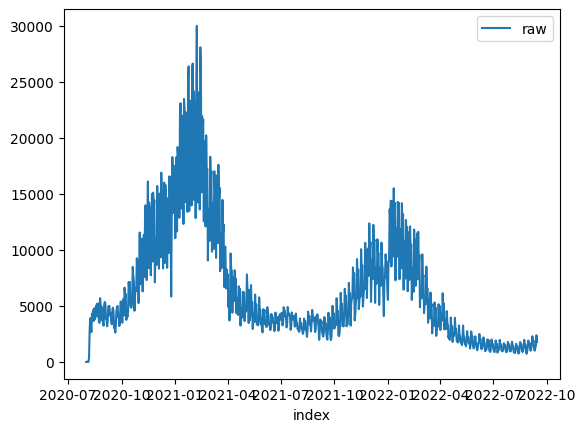

Training...

100%|██████████████████████████████████████| 50/50 [02:46<00:00,  3.33s/trial, best loss: 0.21025908619091188]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.433213861537596, 'LogTransformedStdErr': 0.15875579739001053, 'LogTransformedCILower': 7.172083812401064, 'LogTransformedCIUpper': 7.694343910674128, 'AdjustedActual': 1963.0, 'Prediction': 1711.6815226387046, 'StdErr': 273.62033985511476, 'CILower': 1261.6161142203246, 'CIUpper': 2161.7469310570846, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6416393894026906, 'DownAnomalyProbability': 0.1791803052986547, 'UpAnomalyProbability': 0.8208196947013453, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.020596511240661, 'LogTr

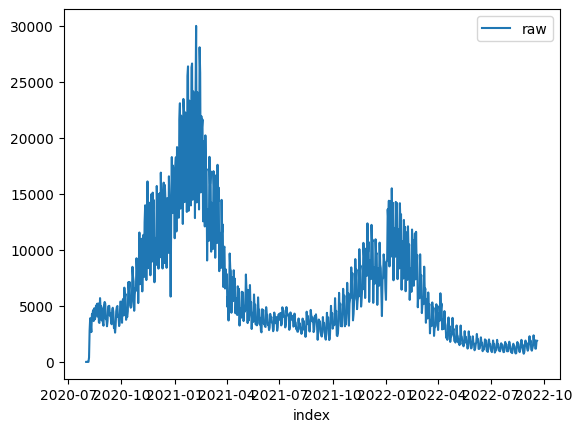

Training...

100%|███████████████████████████████████████████████████| 50/50 [03:25<00:00,  4.11s/trial, best loss: 1e+100]
Prediction...
2504.0 2022-09-20
caso1
{'Success': True, 'AdjustedActual': 519.0, 'ConfLevel': 90.0, 'Prediction': 2049.789318454811, 'PredStdErr': 1570.2555710512531, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.05386287735310735, 'DownAnomalyProbability': 0.4730685613234463, 'UpAnomalyProbability': 0.5269314386765537, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 3,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


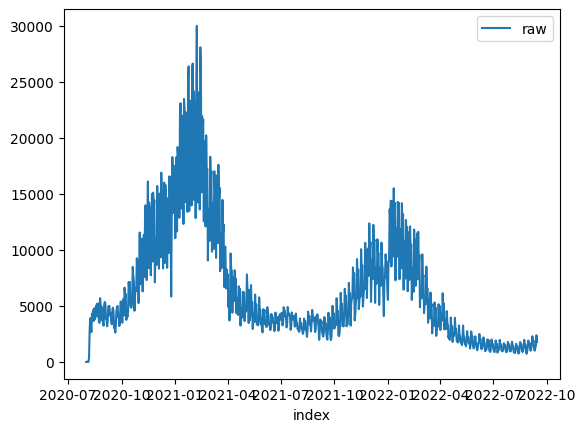

Training...

100%|███████████████████████████████████████| 50/50 [02:52<00:00,  3.45s/trial, best loss: 0.2254987295262907]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.411805598973585, 'LogTransformedStdErr': 0.19119595378787593, 'LogTransformedCILower': 7.097316240927151, 'LogTransformedCIUpper': 7.726294957020018, 'AdjustedActual': 1963.0, 'Prediction': 1684.9484206271745, 'StdErr': 325.3149915466899, 'CILower': 1149.8528768799142, 'CIUpper': 2220.043964374435, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6072910153877455, 'DownAnomalyProbability': 0.19635449230612723, 'UpAnomalyProbability': 0.8036455076938728, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.135574105953126, 'LogTra

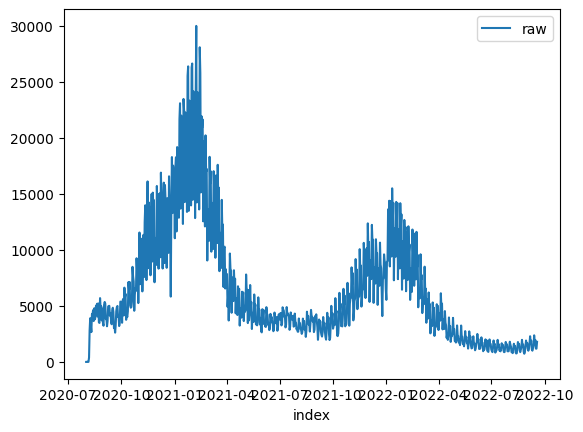

Training...

100%|███████████████████████████████████████| 50/50 [02:42<00:00,  3.25s/trial, best loss: 0.2764088225442289]
Prediction...
1889.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.5443321080536885, 'LogTransformedPrediction': 7.5561791648246475, 'LogTransformedStdErr': 0.19635772306156393, 'LogTransformedCILower': 7.233199451866901, 'LogTransformedCIUpper': 7.879158877782394, 'AdjustedActual': 1889.0000000000007, 'Prediction': 1948.7517631928695, 'StdErr': 386.56894540068356, 'CILower': 1312.9024312837496, 'CIUpper': 2584.6010951019894, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.12283927251912163, 'DownAnomalyProbability': 0.5614196362595609, 'UpAnomalyProbability': 0.4385803637404391, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 4,
 'param_is_log': False,
 'param_weekly_model': Tr

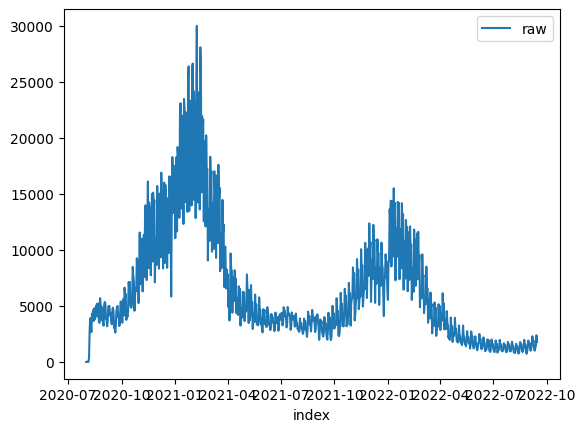

Training...

100%|███████████████████████████████████████| 50/50 [02:43<00:00,  3.26s/trial, best loss: 0.2160145814993517]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.3521607699611735, 'LogTransformedStdErr': 0.20901521192267705, 'LogTransformedCILower': 7.008361340542128, 'LogTransformedCIUpper': 7.695960199380219, 'AdjustedActual': 1963.0, 'Prediction': 1593.004128494921, 'StdErr': 336.8432893009416, 'CILower': 1038.9462223740031, 'CIUpper': 2147.0620346158385, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7279794703259068, 'DownAnomalyProbability': 0.1360102648370466, 'UpAnomalyProbability': 0.8639897351629534, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.1568152503516425, 'LogTr

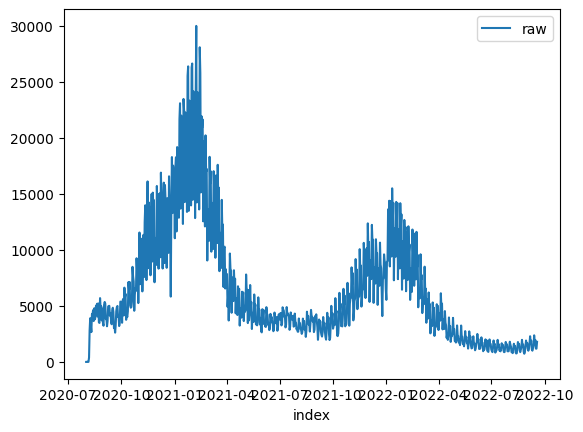

Training...

100%|██████████████████████████████████████| 50/50 [03:15<00:00,  3.91s/trial, best loss: 0.22003353648254872]
Prediction...
1889.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.5443321080536885, 'LogTransformedPrediction': 7.519038020553545, 'LogTransformedStdErr': 0.20133256322211004, 'LogTransformedCILower': 7.18787542371422, 'LogTransformedCIUpper': 7.850200617392869, 'AdjustedActual': 1889.0000000000007, 'Prediction': 1879.5233994890555, 'StdErr': 382.4799205878481, 'CILower': 1250.3999148740224, 'CIUpper': 2508.6468841040887, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.01976694534293899, 'DownAnomalyProbability': 0.4901165273285305, 'UpAnomalyProbability': 0.5098834726714695, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 4,
 'param_is_log': True,
 'param_weekly_model': True}


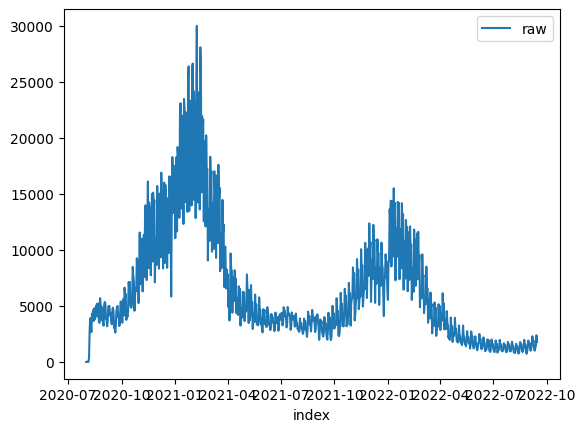

Training...

100%|██████████████████████████████████████| 50/50 [02:43<00:00,  3.27s/trial, best loss: 0.22915672400344117]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.330937702303747, 'LogTransformedStdErr': 0.21034959850943807, 'LogTransformedCILower': 6.984943402267712, 'LogTransformedCIUpper': 7.6769320023397825, 'AdjustedActual': 1963.0, 'Prediction': 1559.9676229867334, 'StdErr': 332.01472706398994, 'CILower': 1013.8519949742265, 'CIUpper': 2106.0832509992406, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7752137417925316, 'DownAnomalyProbability': 0.11239312910373422, 'UpAnomalyProbability': 0.8876068708962658, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.16067738704435, 'LogT

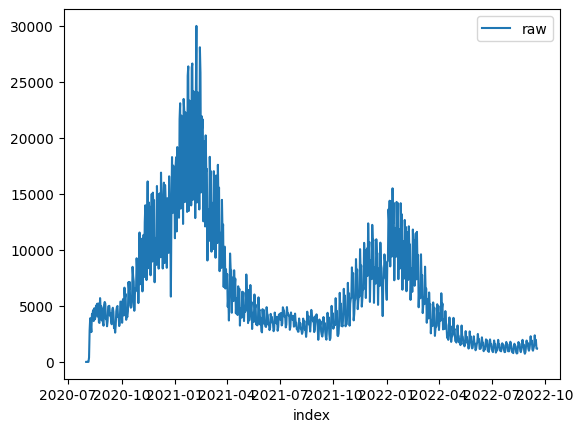

Training...

100%|███████████████████████████████████████| 50/50 [02:39<00:00,  3.20s/trial, best loss: 0.2483840397179583]
Prediction...
1793.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.492203042618741, 'LogTransformedPrediction': 7.183608319181962, 'LogTransformedStdErr': 0.21190240890199563, 'LogTransformedCILower': 6.835059873339761, 'LogTransformedCIUpper': 7.532156765024164, 'AdjustedActual': 1793.0, 'Prediction': 1346.5718665816112, 'StdErr': 288.78944284815464, 'CILower': 871.5555040875291, 'CIUpper': 1821.588229075693, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8778616886347976, 'DownAnomalyProbability': 0.061069155682601184, 'UpAnomalyProbability': 0.9389308443173988, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 5,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


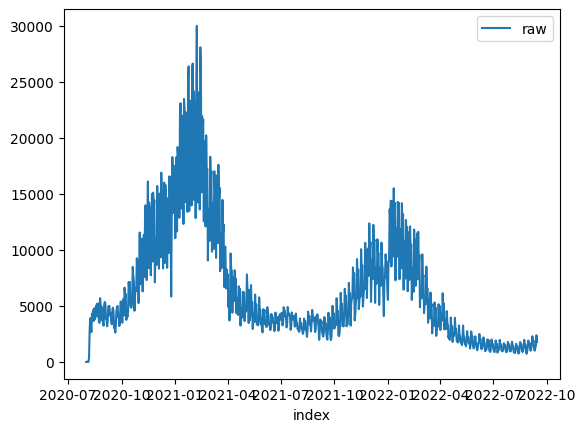

Training...

100%|███████████████████████████████████████| 50/50 [03:16<00:00,  3.93s/trial, best loss: 0.2243838715915599]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.337492443856615, 'LogTransformedStdErr': 0.21646930701494033, 'LogTransformedCILower': 6.981432119089418, 'LogTransformedCIUpper': 7.693552768623811, 'AdjustedActual': 1963.0, 'Prediction': 1572.2863454672213, 'StdErr': 344.5970964325107, 'CILower': 1005.4745615632598, 'CIUpper': 2139.098129371183, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7431330748212546, 'DownAnomalyProbability': 0.12843346258937272, 'UpAnomalyProbability': 0.8715665374106273, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.201338921195963, 'LogTra

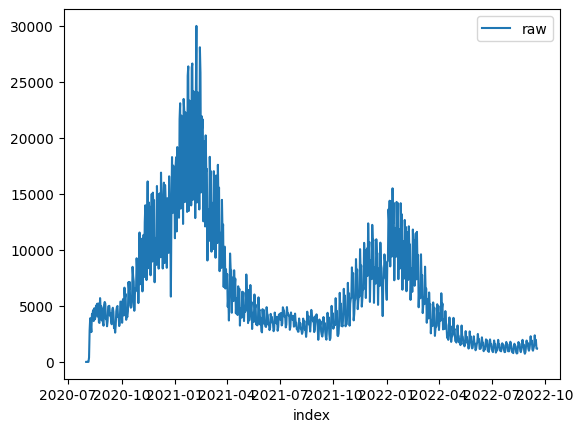

Training...

100%|██████████████████████████████████████| 50/50 [03:02<00:00,  3.64s/trial, best loss: 0.24730708252457007]
Prediction...
1793.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.492203042618741, 'LogTransformedPrediction': 7.2428618538560645, 'LogTransformedStdErr': 0.20378405957107348, 'LogTransformedCILower': 6.90766690435569, 'LogTransformedCIUpper': 7.578056803356439, 'AdjustedActual': 1793.0, 'Prediction': 1426.4227512054922, 'StdErr': 293.9322685722344, 'CILower': 942.9471931663782, 'CIUpper': 1909.8983092446063, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7876570237384937, 'DownAnomalyProbability': 0.10617148813075317, 'UpAnomalyProbability': 0.8938285118692468, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 5,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


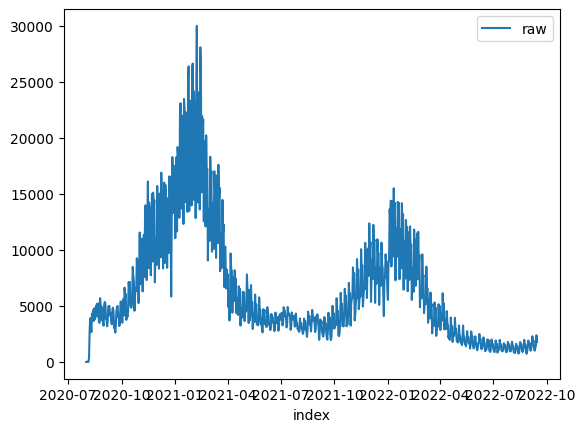

Training...

100%|██████████████████████████████████████| 50/50 [02:51<00:00,  3.43s/trial, best loss: 0.20607373976244137]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.337478367934052, 'LogTransformedStdErr': 0.2165105261146691, 'LogTransformedCILower': 6.981350243781167, 'LogTransformedCIUpper': 7.693606492086937, 'AdjustedActual': 1963.0, 'Prediction': 1572.2782392826584, 'StdErr': 344.66248701533067, 'CILower': 1005.358897441377, 'CIUpper': 2139.19758112394, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.743052682688389, 'DownAnomalyProbability': 0.1284736586558055, 'UpAnomalyProbability': 0.8715263413441945, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.196842845215355, 'LogTransfo

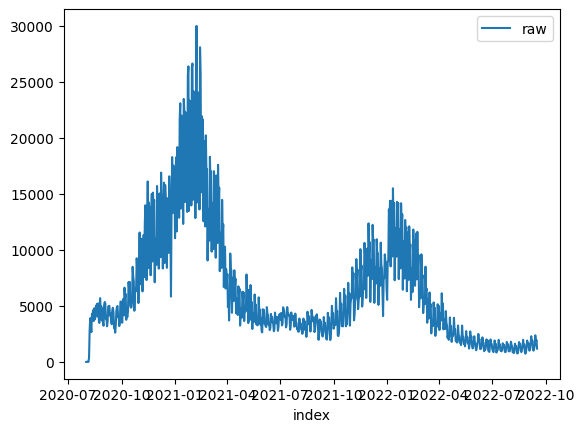

Training...

100%|███████████████████████████████████████████████████| 50/50 [04:08<00:00,  4.97s/trial, best loss: 1e+100]
Prediction...
1183.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.076653815443951, 'LogTransformedPrediction': 7.320959265437943, 'LogTransformedStdErr': 0.22892779363984983, 'LogTransformedCILower': 6.944406553759438, 'LogTransformedCIUpper': 7.697511977116448, 'AdjustedActual': 1182.9999999999998, 'Prediction': 1550.7882161853058, 'StdErr': 359.95311938770215, 'CILower': 958.7180222279477, 'CIUpper': 2142.858410142664, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.693108804769031, 'DownAnomalyProbability': 0.8465544023845155, 'UpAnomalyProbability': 0.15344559761548443, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 6,
 'param_is_log': False,
 'param_weekly_model': True}
L

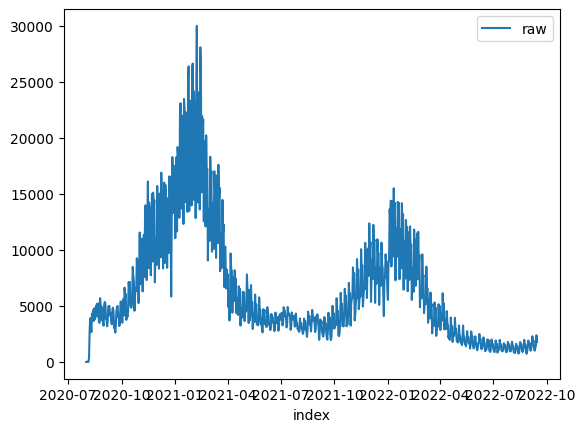

Training...

100%|██████████████████████████████████████| 50/50 [03:05<00:00,  3.71s/trial, best loss: 0.23008148040125495]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.396396322745207, 'LogTransformedStdErr': 0.2049411428972249, 'LogTransformedCILower': 7.059298140539126, 'LogTransformedCIUpper': 7.733494504951287, 'AdjustedActual': 1963.0, 'Prediction': 1663.6942614081947, 'StdErr': 344.7781886746726, 'CILower': 1096.5846072729005, 'CIUpper': 2230.803915543489, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6146664309155654, 'DownAnomalyProbability': 0.1926667845422173, 'UpAnomalyProbability': 0.8073332154577827, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.196616814623452, 'LogTrans

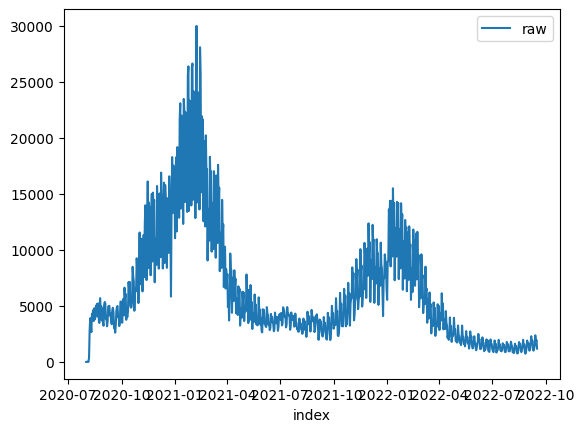

Training...

100%|███████████████████████████████████████████████████| 50/50 [02:47<00:00,  3.34s/trial, best loss: 1e+100]
Prediction...
1183.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1183.0, 'Prediction': 2139.9421199053154, 'StdErr': 264.20989792183525, 'CILower': 1622.1002356195143, 'CIUpper': 2657.7840041911168, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 0.9997075540674227, 'DownAnomalyProbability': 0.9998537770337114, 'UpAnomalyProbability': 0.00014622296628862225, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 6,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


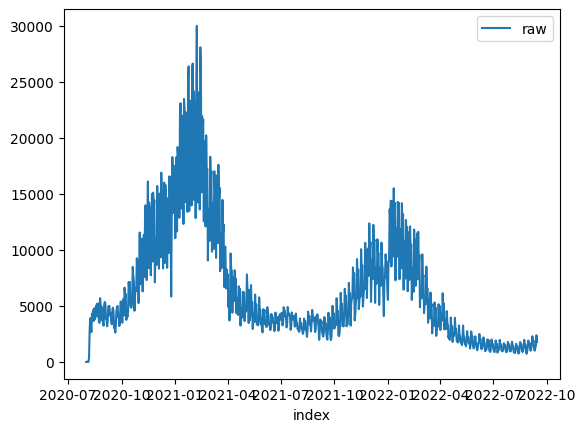

Training...

100%|██████████████████████████████████████| 50/50 [02:49<00:00,  3.39s/trial, best loss: 0.21153669148888823]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.396396322745207, 'LogTransformedStdErr': 0.2049411428972249, 'LogTransformedCILower': 7.059298140539126, 'LogTransformedCIUpper': 7.733494504951287, 'AdjustedActual': 1963.0, 'Prediction': 1663.6942614081947, 'StdErr': 344.7781886746726, 'CILower': 1096.5846072729005, 'CIUpper': 2230.803915543489, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6146664309155654, 'DownAnomalyProbability': 0.1926667845422173, 'UpAnomalyProbability': 0.8073332154577827, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.196616814623452, 'LogTrans

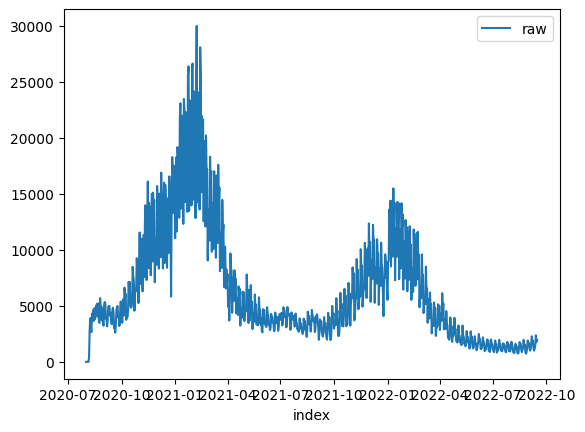

Training...

100%|███████████████████████████████████████████████████| 50/50 [02:28<00:00,  2.97s/trial, best loss: 1e+100]
Prediction...
1191.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.45209908702884083, 'ConfLevel': 90.0, 'Prediction': 1635.7169684667463, 'PredStdErr': 459.79777462085303, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.807953764037938, 'DownAnomalyProbability': 0.903976882018969, 'UpAnomalyProbability': 0.09602311798103103, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 7,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


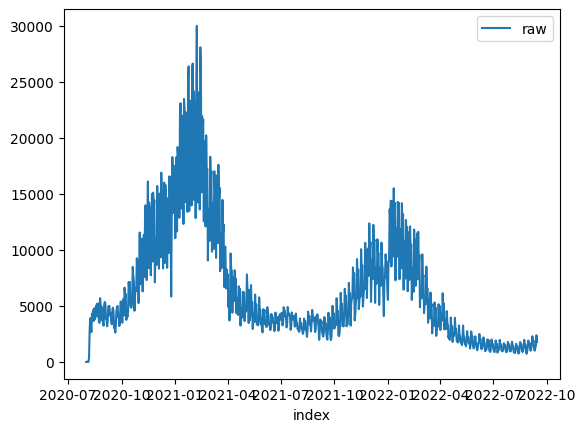

Training...

100%|███████████████████████████████████████| 50/50 [03:04<00:00,  3.68s/trial, best loss: 0.2242943152931589]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.466846560909858, 'LogTransformedStdErr': 0.20224949760178845, 'LogTransformedCILower': 7.134175741230443, 'LogTransformedCIUpper': 7.799517380589274, 'AdjustedActual': 1963.0, 'Prediction': 1784.223667972225, 'StdErr': 364.7845321080538, 'CILower': 1184.2065072784972, 'CIUpper': 2384.240828665953, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3759280027420542, 'DownAnomalyProbability': 0.3120359986289729, 'UpAnomalyProbability': 0.6879640013710271, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.258299874830696, 'LogTrans

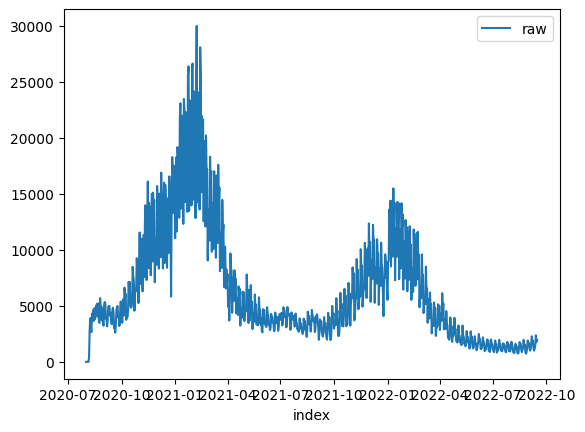

Training...

100%|███████████████████████████████████████████████████| 50/50 [02:30<00:00,  3.00s/trial, best loss: 1e+100]
Prediction...
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1191.0, 'Prediction': 1763.9764646174565, 'StdErr': 261.4856788692011, 'CILower': 1251.4739515608162, 'CIUpper': 2276.4789776740968, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9715651793835187, 'DownAnomalyProbability': 0.9857825896917594, 'UpAnomalyProbability': 0.014217410308240626, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.meetup'),
 'param_days_range': 7,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


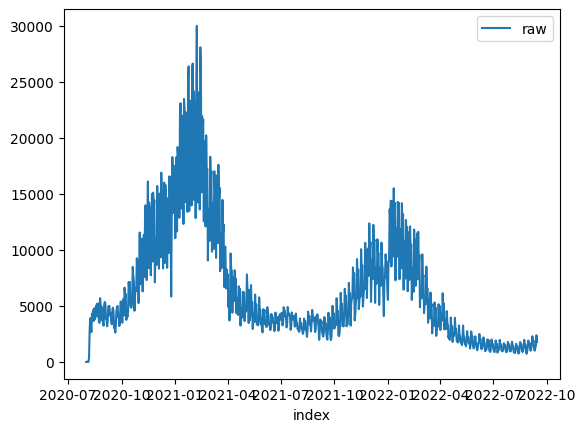

Training...

100%|██████████████████████████████████████| 50/50 [02:57<00:00,  3.54s/trial, best loss: 0.22322548664435565]
Prediction...
1963.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.582738488914411, 'LogTransformedPrediction': 7.343384836303736, 'LogTransformedStdErr': 0.20967075637886337, 'LogTransformedCILower': 6.998507132208304, 'LogTransformedCIUpper': 7.688262540399168, 'AdjustedActual': 1963.0, 'Prediction': 1579.293312072225, 'StdErr': 335.0164594267751, 'CILower': 1028.2402736956533, 'CIUpper': 2130.346350448797, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.747930342889298, 'DownAnomalyProbability': 0.12603482855535098, 'UpAnomalyProbability': 0.873965171444649, 'ModelFreshness': 0.1}
1191.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.083387847625295, 'LogTransformedPrediction': 7.163537852854797, 'LogTransf

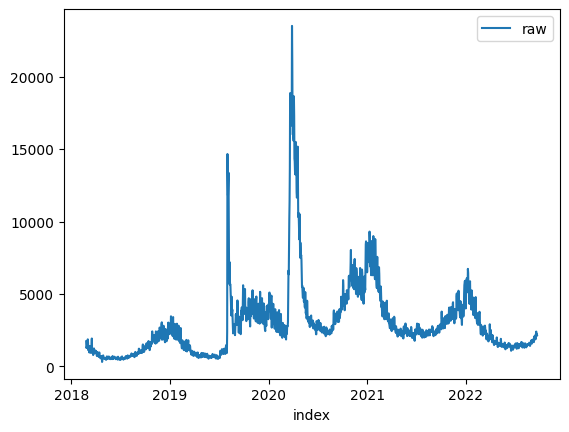

Training...

100%|██████████████████████████████████████| 50/50 [03:27<00:00,  4.16s/trial, best loss: 0.08667140447767858]
Prediction...
1878.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1878.0, 'Prediction': 2178.185608716568, 'StdErr': 145.17980855863345, 'CILower': 1939.3860740487794, 'CIUpper': 2416.9851433843564, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9613300201856294, 'DownAnomalyProbability': 0.9806650100928147, 'UpAnomalyProbability': 0.019334989907185286, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 1,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


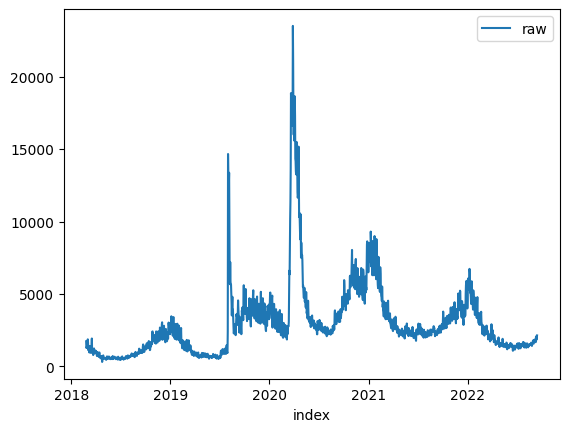

Training...

100%|████████████████████████████████████████| 50/50 [04:02<00:00,  4.86s/trial, best loss: 0.166699522448622]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2034.9304354638875, 'StdErr': 142.26393061440555, 'CILower': 1800.92709320841, 'CIUpper': 2268.933777719365, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.11696583625627066, 'DownAnomalyProbability': 0.5584829181281353, 'UpAnomalyProbability': 0.44151708187186467, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 1975.169319496431, 'StdErr': 155.40856585423592, 'CILower': 1719.5449762917642, 'CIUpper': 2230.7936627010977, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4295160238853659, 'DownAnomalyProbability': 0.714758011942683, 'UpAnoma

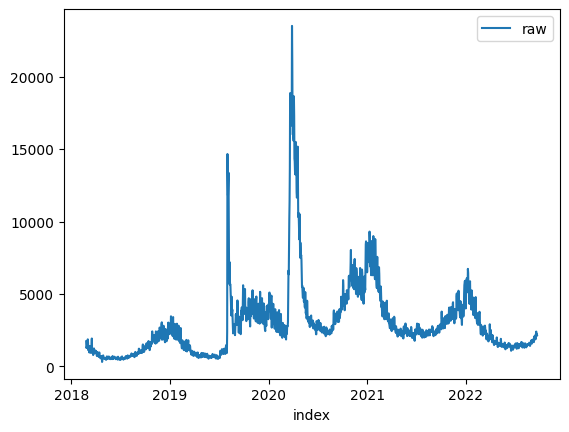

Training...

100%|██████████████████████████████████████| 50/50 [03:47<00:00,  4.55s/trial, best loss: 0.10018021384184768]
Prediction...
1878.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1878.0, 'Prediction': 2216.2952122795764, 'StdErr': 151.93478955775944, 'CILower': 1966.384722615387, 'CIUpper': 2466.2057019437657, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9740247525821439, 'DownAnomalyProbability': 0.987012376291072, 'UpAnomalyProbability': 0.012987623708928078, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 1,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


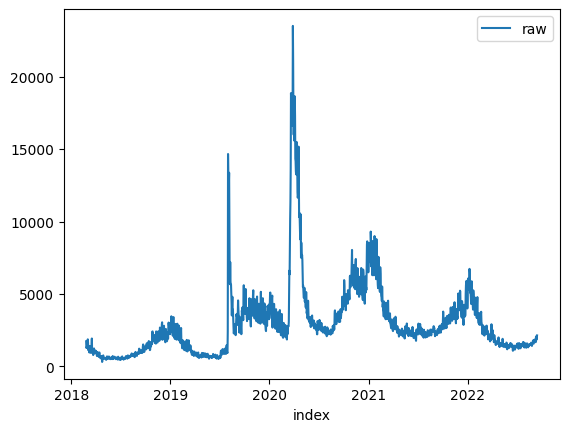

Training...

100%|██████████████████████████████████████| 50/50 [03:35<00:00,  4.32s/trial, best loss: 0.18016425048590645]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2071.6819827422005, 'StdErr': 135.3535344696163, 'CILower': 1849.045230649151, 'CIUpper': 2294.31873483525, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.33000723317475034, 'DownAnomalyProbability': 0.6650036165873752, 'UpAnomalyProbability': 0.33499638341262483, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 2051.091864154738, 'StdErr': 148.73497655903367, 'CILower': 1806.444598507069, 'CIUpper': 2295.7391298024063, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7300813903107608, 'DownAnomalyProbability': 0.8650406951553804, 'UpAnomal

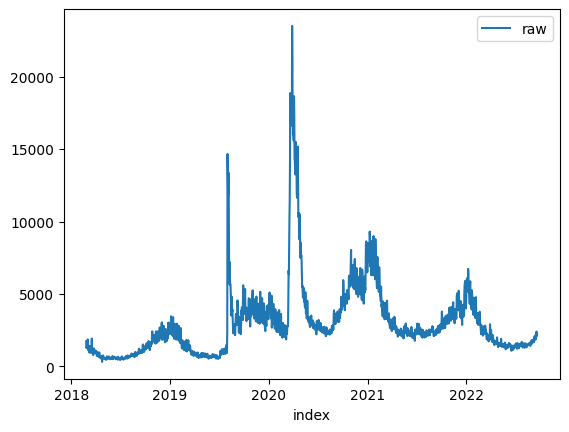

Training...

100%|███████████████████████████████████████████████████| 50/50 [04:28<00:00,  5.37s/trial, best loss: 1e+100]
Prediction...
2158.0 2022-09-21
caso1
{'Success': True, 'AdjustedActual': -215.0, 'ConfLevel': 90.0, 'Prediction': 2205.2581061078145, 'PredStdErr': 378.6378733949847, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.14920566911783162, 'DownAnomalyProbability': 0.5746028345589158, 'UpAnomalyProbability': 0.4253971654410842, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 2,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


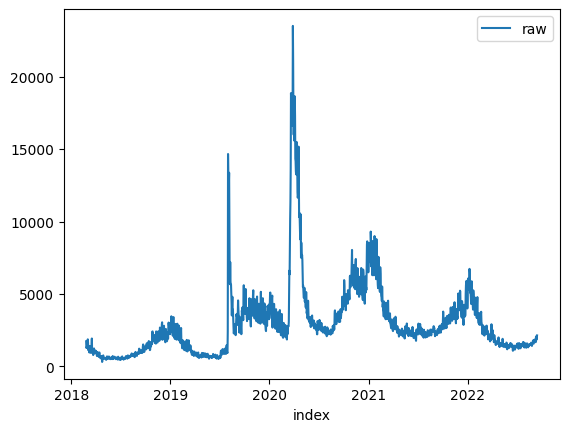

Training...

100%|██████████████████████████████████████| 50/50 [03:36<00:00,  4.34s/trial, best loss: 0.16586637276726962]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2059.8687025309027, 'StdErr': 141.38998234947425, 'CILower': 1827.3028772487653, 'CIUpper': 2292.43452781304, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.25437437579221167, 'DownAnomalyProbability': 0.6271871878961058, 'UpAnomalyProbability': 0.37281281210389416, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 2039.2293429090405, 'StdErr': 153.87134477052524, 'CILower': 1786.1335033793416, 'CIUpper': 2292.3251824387394, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6774976706903248, 'DownAnomalyProbability': 0.8387488353451624, 'UpAn

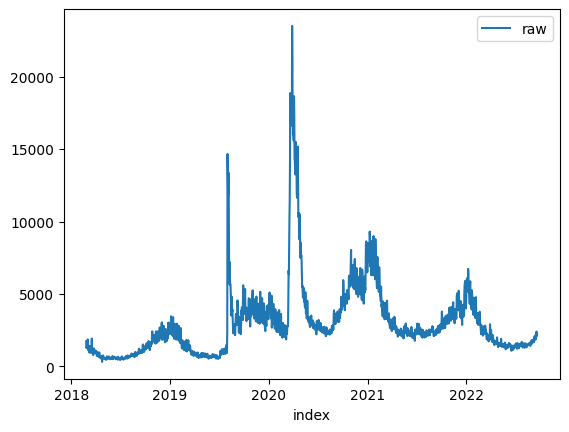

Training...

100%|███████████████████████████████████████████████████| 50/50 [02:50<00:00,  3.41s/trial, best loss: 1e+100]
Prediction...
2158.0 2022-09-21
caso1
{'Success': True, 'AdjustedActual': -215.0, 'ConfLevel': 90.0, 'Prediction': 2210.810639357098, 'PredStdErr': 109.86675109420112, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.44119573026021053, 'DownAnomalyProbability': 0.7205978651301053, 'UpAnomalyProbability': 0.27940213486989474, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 2,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


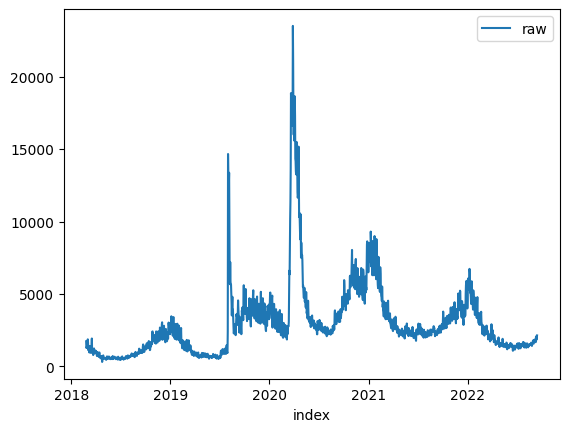

Training...

100%|██████████████████████████████████████| 50/50 [02:56<00:00,  3.52s/trial, best loss: 0.17214473944158037]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2086.6458434841634, 'StdErr': 148.46380967511024, 'CILower': 1842.4446076690251, 'CIUpper': 2330.8470792993016, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3753826054644569, 'DownAnomalyProbability': 0.6876913027322284, 'UpAnomalyProbability': 0.31230869726777155, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 2063.713776929319, 'StdErr': 159.02901695041797, 'CILower': 1802.134321607897, 'CIUpper': 2325.2932322507413, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7335197130774538, 'DownAnomalyProbability': 0.8667598565387269, 'UpAno

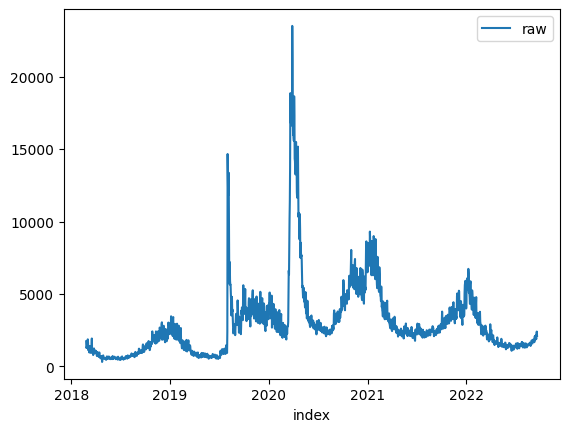

Training...

100%|███████████████████████████████████████████████████| 50/50 [03:10<00:00,  3.80s/trial, best loss: 1e+100]
Prediction...
2238.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2238.0, 'Prediction': 2279.5071677212895, 'StdErr': 145.5680111584147, 'CILower': 2040.0690965992587, 'CIUpper': 2518.94523884332, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2244626142220323, 'DownAnomalyProbability': 0.6122313071110161, 'UpAnomalyProbability': 0.38776869288898386, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


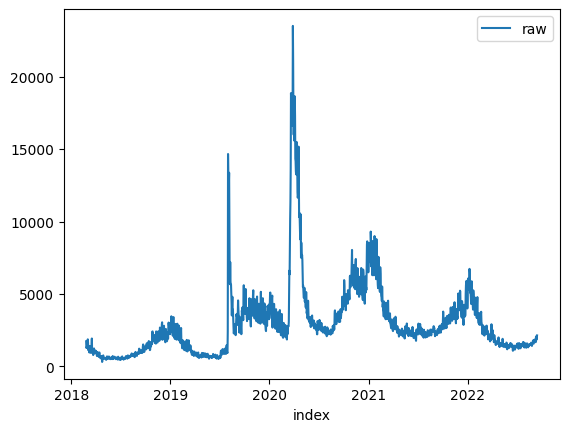

Training...

100%|███████████████████████████████████████| 50/50 [06:03<00:00,  7.27s/trial, best loss: 0.2289577699245855]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2072.341181419892, 'StdErr': 134.70428925591432, 'CILower': 1850.7723426713812, 'CIUpper': 2293.910020168403, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.33506194211804075, 'DownAnomalyProbability': 0.6675309710590204, 'UpAnomalyProbability': 0.3324690289409796, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 2037.7134396520044, 'StdErr': 147.52114809090972, 'CILower': 1795.0627441626261, 'CIUpper': 2280.3641351413826, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6930484694296335, 'DownAnomalyProbability': 0.8465242347148167, 'UpAno

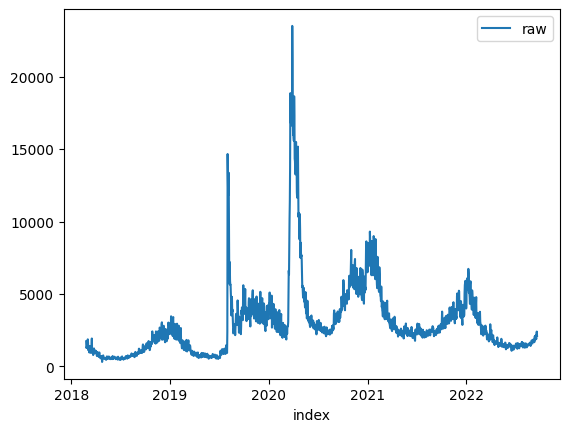

Training...

100%|███████████████████████████████████████████████████| 50/50 [03:52<00:00,  4.65s/trial, best loss: 1e+100]
Prediction...
2238.0 2022-09-20
caso1
{'Success': True, 'AdjustedActual': -0.12762228611766346, 'ConfLevel': 90.0, 'Prediction': 2326.848063292785, 'PredStdErr': 277.6506313757374, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8365443079464336, 'DownAnomalyProbability': 0.9182721539732168, 'UpAnomalyProbability': 0.08172784602678318, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 3,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


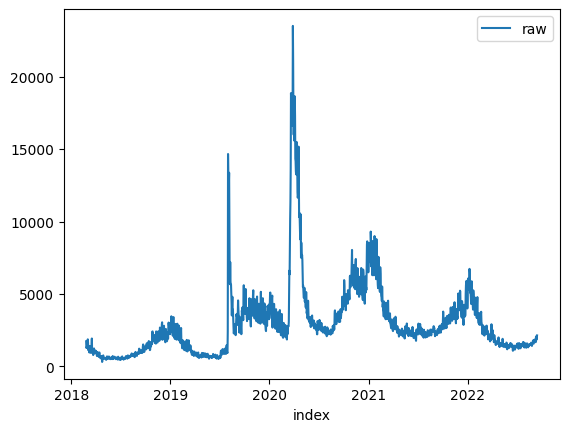

Training...

100%|██████████████████████████████████████| 50/50 [03:28<00:00,  4.17s/trial, best loss: 0.16844331962970163]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2123.718586652615, 'StdErr': 155.46405659780842, 'CILower': 1868.0029692971211, 'CIUpper': 2379.434204008109, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5196556937072787, 'DownAnomalyProbability': 0.7598278468536394, 'UpAnomalyProbability': 0.24017215314636065, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 2000.6380235865167, 'StdErr': 167.9261158472213, 'CILower': 1724.4241428753417, 'CIUpper': 2276.851904297692, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5014128325726603, 'DownAnomalyProbability': 0.7507064162863302, 'UpAnoma

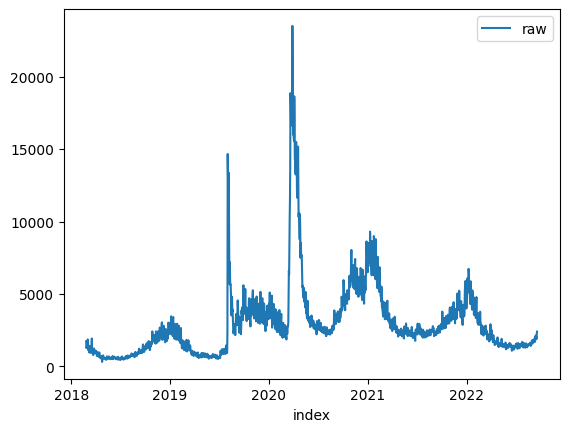

Training...

100%|██████████████████████████████████████| 50/50 [03:45<00:00,  4.50s/trial, best loss: 0.14359367866934383]
Prediction...
2103.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2103.0, 'Prediction': 2124.3975784823156, 'StdErr': 158.58907195956942, 'CILower': 1863.5417682747498, 'CIUpper': 2385.2533886898814, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.10732856734640461, 'DownAnomalyProbability': 0.5536642836732024, 'UpAnomalyProbability': 0.44633571632679764, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 4,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


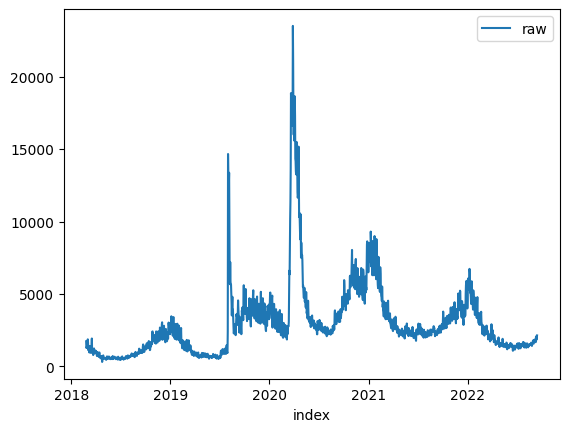

Training...

100%|███████████████████████████████████████| 50/50 [03:27<00:00,  4.16s/trial, best loss: 0.2085985278724251]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2093.304574323121, 'StdErr': 157.84466838004127, 'CILower': 1833.6731990432577, 'CIUpper': 2352.9359496029842, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3846290273324029, 'DownAnomalyProbability': 0.6923145136662014, 'UpAnomalyProbability': 0.3076854863337986, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 2103.5795171859663, 'StdErr': 174.16477645037833, 'CILower': 1817.103952954369, 'CIUpper': 2390.0550814175635, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7863282373414682, 'DownAnomalyProbability': 0.8931641186707341, 'UpAnom

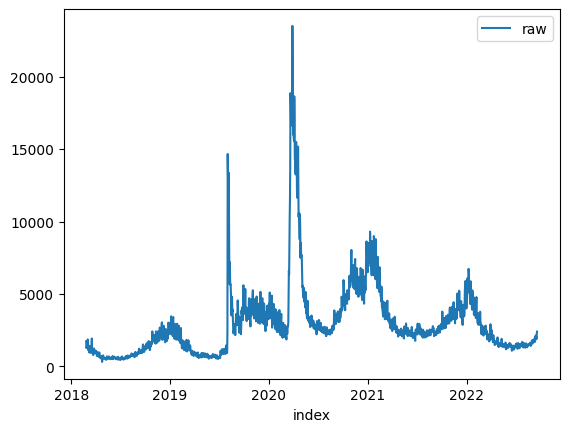

Training...

100%|██████████████████████████████████████| 50/50 [06:32<00:00,  7.84s/trial, best loss: 0.16075937143107913]
Prediction...
2103.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2103.0, 'Prediction': 2232.7137887840267, 'StdErr': 885.2926954431185, 'CILower': 497.57198993912766, 'CIUpper': 3967.8555876289256, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.11648972428927284, 'DownAnomalyProbability': 0.5582448621446364, 'UpAnomalyProbability': 0.4417551378553636, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 4,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


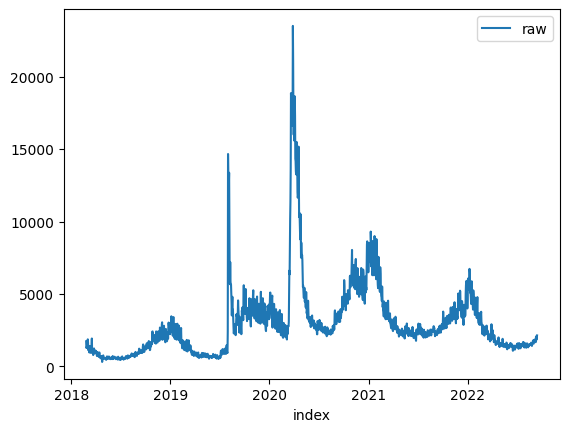

Training...

100%|██████████████████████████████████████| 50/50 [03:49<00:00,  4.60s/trial, best loss: 0.17096597256127552]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2043.8884086708406, 'StdErr': 153.36948568358383, 'CILower': 1791.6180538805158, 'CIUpper': 2296.158763461165, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.15451190007634175, 'DownAnomalyProbability': 0.5772559500381709, 'UpAnomalyProbability': 0.4227440499618292, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 2066.6305909794237, 'StdErr': 155.54874945200575, 'CILower': 1810.7756662755262, 'CIUpper': 2322.485515683321, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7518352863898081, 'DownAnomalyProbability': 0.8759176431949041, 'UpAno

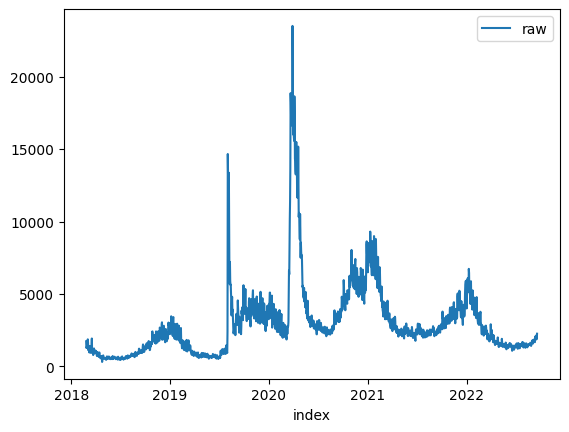

Training...

100%|██████████████████████████████████████| 50/50 [07:03<00:00,  8.48s/trial, best loss: 0.11672604962308435]
Prediction...
2409.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2409.0, 'Prediction': 2211.665040674755, 'StdErr': 156.7652286045176, 'CILower': 1953.8091858247374, 'CIUpper': 2469.520895524772, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7918948604549065, 'DownAnomalyProbability': 0.10405256977254673, 'UpAnomalyProbability': 0.8959474302274533, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 5,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


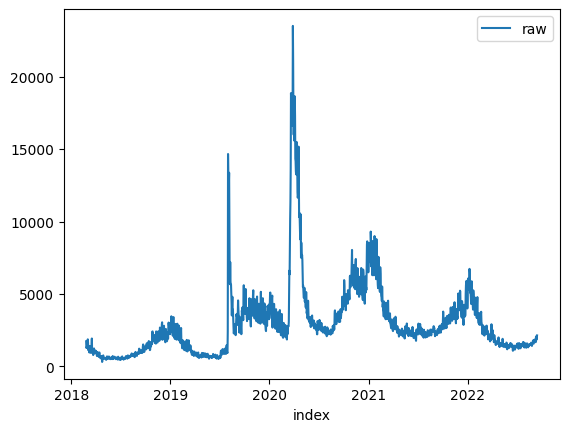

Training...

100%|██████████████████████████████████████| 50/50 [03:14<00:00,  3.89s/trial, best loss: 0.16846115281063034]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2052.8319538990495, 'StdErr': 143.03101179342, 'CILower': 1817.566875384104, 'CIUpper': 2288.0970324139953, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.21398830760717935, 'DownAnomalyProbability': 0.6069941538035897, 'UpAnomalyProbability': 0.3930058461964104, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 2027.271211168247, 'StdErr': 155.42004094862293, 'CILower': 1771.6279931129582, 'CIUpper': 2282.9144292235355, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6332244763852954, 'DownAnomalyProbability': 0.8166122381926477, 'UpAnomal

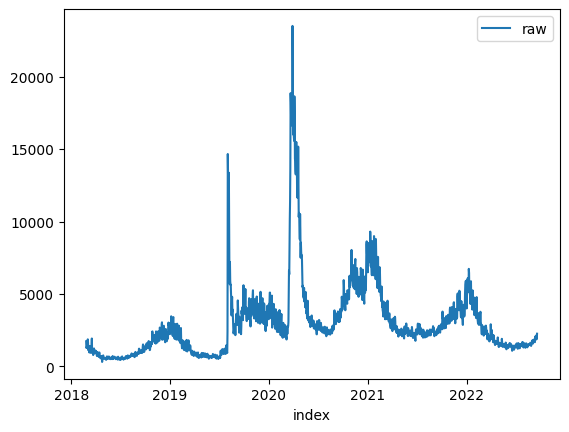

Training...

100%|███████████████████████████████████████| 50/50 [07:02<00:00,  8.44s/trial, best loss: 0.1224675258117216]
Prediction...
2409.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2409.0, 'Prediction': 2208.380436518008, 'StdErr': 153.13812238090705, 'CILower': 1956.4906404952346, 'CIUpper': 2460.2702325407813, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8098232129164784, 'DownAnomalyProbability': 0.0950883935417608, 'UpAnomalyProbability': 0.9049116064582392, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 5,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


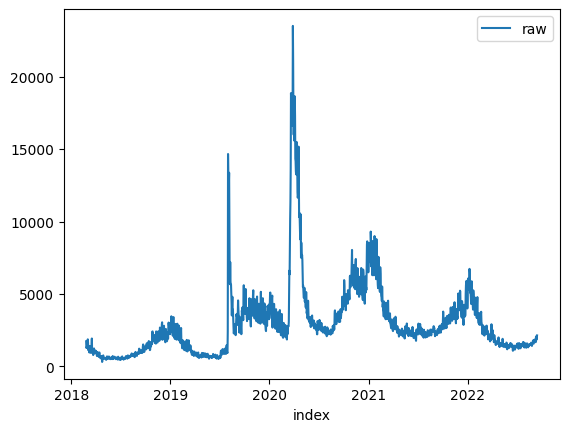

Training...

100%|███████████████████████████████████████| 50/50 [06:25<00:00,  7.72s/trial, best loss: 0.2149397350799253]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.608374474380783, 'LogTransformedPrediction': 7.555551214436, 'LogTransformedStdErr': 0.09441888874753056, 'LogTransformedCILower': 7.400245962826896, 'LogTransformedCIUpper': 7.7108564660451036, 'AdjustedActual': 2013.9999999999993, 'Prediction': 1918.8621733126, 'StdErr': 181.67600928239727, 'CILower': 1620.0317305143794, 'CIUpper': 2217.6926161108204, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.39949019537125974, 'DownAnomalyProbability': 0.30025490231437013, 'UpAnomalyProbability': 0.6997450976856299, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.543273346705446, 'LogTransformedPrediction': 7.54359064354212

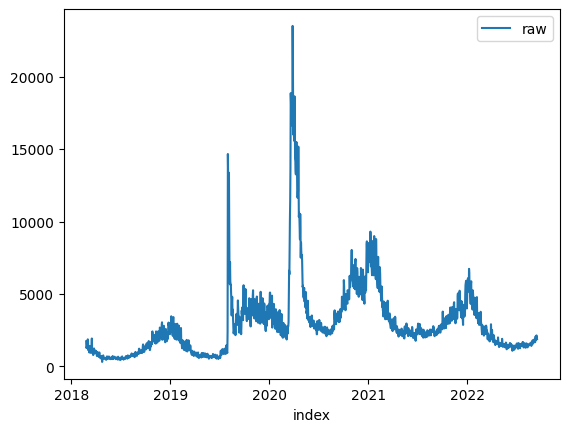

Training...

100%|██████████████████████████████████████| 50/50 [03:32<00:00,  4.24s/trial, best loss: 0.10565010841004237]
Prediction...
2262.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2262.0, 'Prediction': 2074.572214190195, 'StdErr': 149.01317538513092, 'CILower': 1829.4673521944067, 'CIUpper': 2319.6770761859834, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7915335102146579, 'DownAnomalyProbability': 0.10423324489267105, 'UpAnomalyProbability': 0.895766755107329, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 6,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


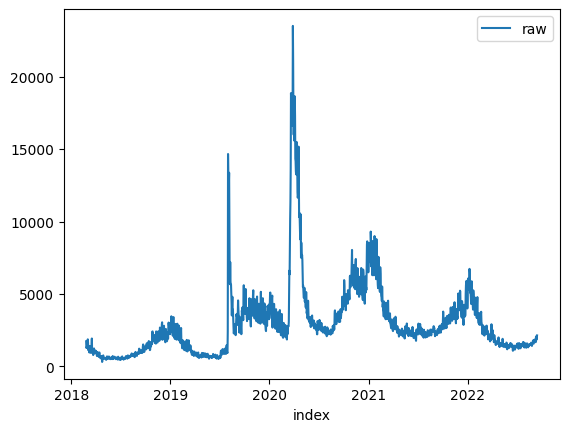

Training...

100%|██████████████████████████████████████| 50/50 [03:37<00:00,  4.35s/trial, best loss: 0.15124298248901052]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2071.755063932106, 'StdErr': 145.63704344043518, 'CILower': 1832.2034448106172, 'CIUpper': 2311.306683053595, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.30831431519546504, 'DownAnomalyProbability': 0.6541571575977325, 'UpAnomalyProbability': 0.3458428424022675, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 1991.0577161793635, 'StdErr': 160.23964530248546, 'CILower': 1727.4869544221528, 'CIUpper': 2254.628477936574, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.483912435626507, 'DownAnomalyProbability': 0.7419562178132535, 'UpAnoma

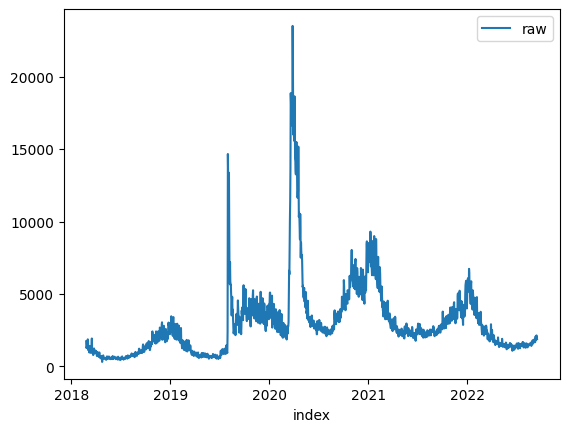

Training...

100%|██████████████████████████████████████| 50/50 [03:31<00:00,  4.24s/trial, best loss: 0.10844483847713625]
Prediction...
2262.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2262.0, 'Prediction': 2076.4987422257923, 'StdErr': 148.5126309847231, 'CILower': 1832.217202502465, 'CIUpper': 2320.78028194912, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7883570452603015, 'DownAnomalyProbability': 0.10582147736984926, 'UpAnomalyProbability': 0.8941785226301507, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 6,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


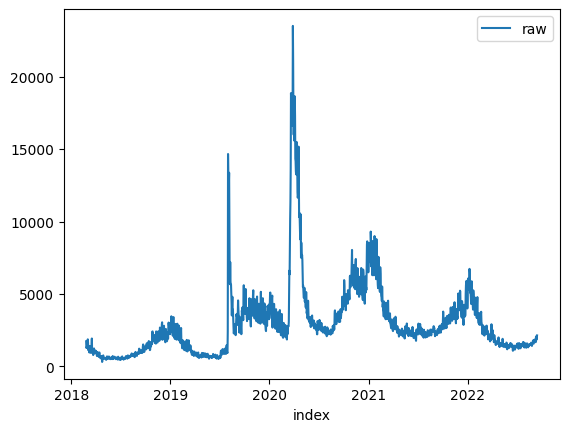

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:31<00:00,  4.23s/trial, best loss: 0.16210181249577277]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2071.755063932106, 'StdErr': 145.63704344043518, 'CILower': 1832.2034448106172, 'CIUpper': 2311.306683053595, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.30831431519546504, 'DownAnomalyProbability': 0.6541571575977325, 'UpAnomalyProbability': 0.3458428424022675, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 1991.0577161793635, 'StdErr': 160.23964530248546, 'CILower': 1727.4869544221528, 'CIUpper': 2254.628477936574, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': Fa

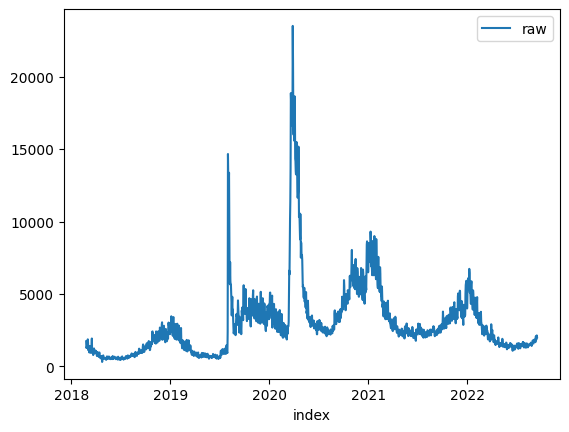

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:23<00:00, 10.08s/trial, best loss: 0.18540228051124819]
Prediction...
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.543273346705446, 'LogTransformedPrediction': 7.637142828684957, 'LogTransformedStdErr': 0.1039984891177293, 'LogTransformedCILower': 7.4660805366621865, 'LogTransformedCIUpper': 7.808205120707727, 'AdjustedActual': 1886.9999999999995, 'Prediction': 2084.0553310493683, 'StdErr': 217.430252815351, 'CILower': 1726.4143910970627, 'CIUpper': 2441.696271001674, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6352187600201442, 'DownAnomalyProbability': 0.8176093800100721, 'UpAnomalyProbability': 0.18239061998992784, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data

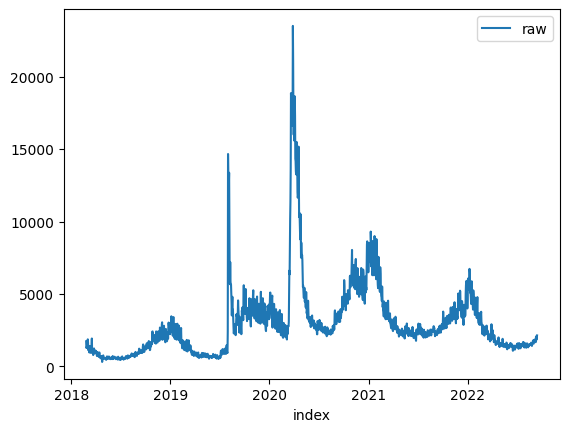

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:08<00:00,  3.77s/trial, best loss: 0.15413350564085912]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2077.212189983241, 'StdErr': 161.30661764410664, 'CILower': 1811.8864149000578, 'CIUpper': 2342.537965066424, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.30485015350338296, 'DownAnomalyProbability': 0.6524250767516915, 'UpAnomalyProbability': 0.3475749232483085, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 2089.0345760110486, 'StdErr': 179.48359996798763, 'CILower': 1793.810325625397, 'CIUpper': 2384.2588263967, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False

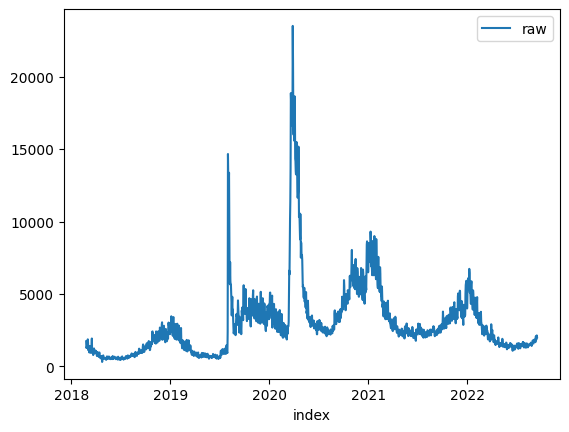

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:06<00:00,  8.52s/trial, best loss: 0.13644724272799497]
Prediction...
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 1910.9554721046948, 'StdErr': 133.86521263186197, 'CILower': 1690.7667915845466, 'CIUpper': 2131.1441526248427, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.14202475249958324, 'DownAnomalyProbability': 0.5710123762497916, 'UpAnomalyProbability': 0.4289876237502084, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.new_user_sport_select'),
 'param_days_range': 7,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


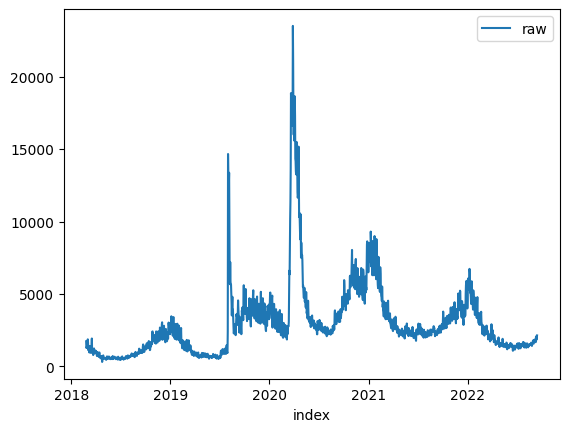

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:28<00:00,  4.17s/trial, best loss: 0.17561465370064813]
Prediction...
2014.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2014.0, 'Prediction': 2083.0394997675226, 'StdErr': 135.47761629258525, 'CILower': 1860.198651237924, 'CIUpper': 2305.880348297121, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3896688269952451, 'DownAnomalyProbability': 0.6948344134976225, 'UpAnomalyProbability': 0.30516558650237746, 'ModelFreshness': 0.1}
1887.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1887.0, 'Prediction': 2074.860358981621, 'StdErr': 144.87979451287984, 'CILower': 1836.5543035051269, 'CIUpper': 2313.1664144581155, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': Fa

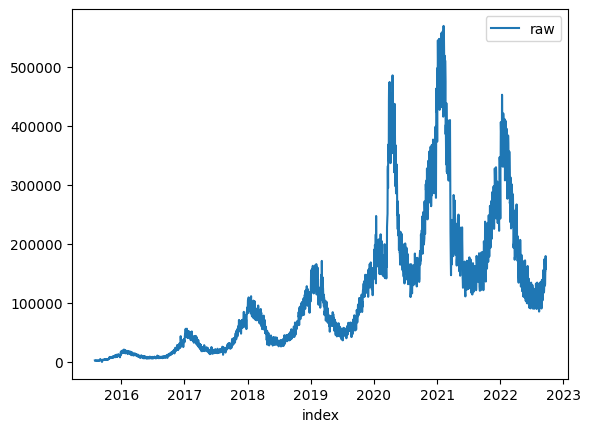

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:32<00:00,  9.05s/trial, best loss: 0.13373508127405256]
Prediction...
142415.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 142415.0, 'Prediction': 161226.07782339875, 'StdErr': 21422.495070781388, 'CILower': 125989.20910787396, 'CIUpper': 196462.94653892354, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6201101645732698, 'DownAnomalyProbability': 0.8100550822866349, 'UpAnomalyProbability': 0.18994491771336508, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_log_out'),
 'param_days_range': 1,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


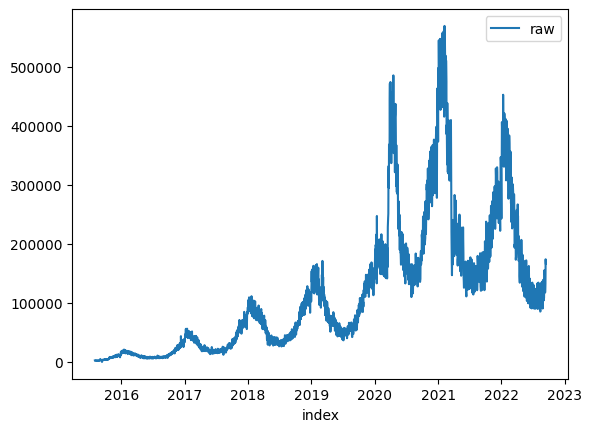

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:26<00:00,  4.13s/trial, best loss: 0.14350356509149387]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 12.006694447766225, 'LogTransformedPrediction': 11.918705255591544, 'LogTransformedStdErr': 0.08434632987806388, 'LogTransformedCILower': 11.779967888971566, 'LogTransformedCIUpper': 12.057442622211521, 'AdjustedActual': 163846.9999999999, 'Prediction': 150580.90091424962, 'StdErr': 12723.653951588212, 'CILower': 129652.35256390432, 'CIUpper': 171509.44926459494, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7028816130542794, 'DownAnomalyProbability': 0.14855919347286028, 'UpAnomalyProbability': 0.8514408065271397, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso

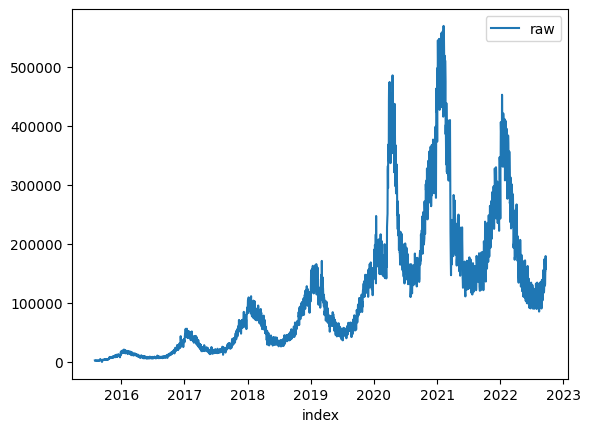

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:35<00:00,  9.11s/trial, best loss: 0.12584023988445228]
Prediction...
142415.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 142415.0, 'Prediction': 161139.66071558962, 'StdErr': 21303.977668152853, 'CILower': 126097.73577963523, 'CIUpper': 196181.585651544, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6205596391881174, 'DownAnomalyProbability': 0.8102798195940587, 'UpAnomalyProbability': 0.1897201804059413, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_log_out'),
 'param_days_range': 1,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


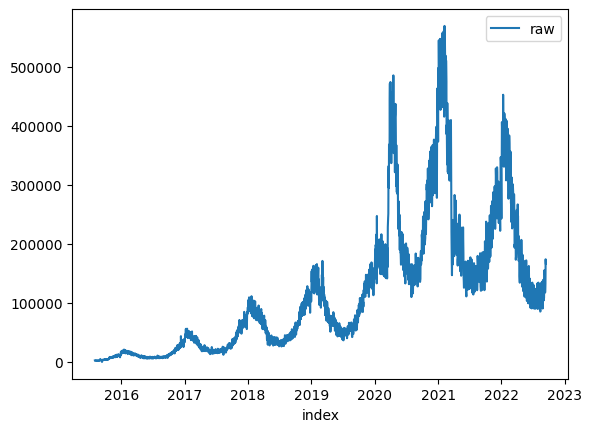

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:23<00:00, 10.06s/trial, best loss: 0.1449031329878245]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 163847.0, 'Prediction': 167351.02545743156, 'StdErr': 19946.379846177624, 'CILower': 134542.15022289456, 'CIUpper': 200159.90069196856, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1394485636794922, 'DownAnomalyProbability': 0.5697242818397461, 'UpAnomalyProbability': 0.4302757181602539, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129154.0, 'Prediction': 146360.88375646377, 'StdErr': 20075.24734700301, 'CILower': 113340.04034579796, 'CIUpper': 179381.72716712957, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAno

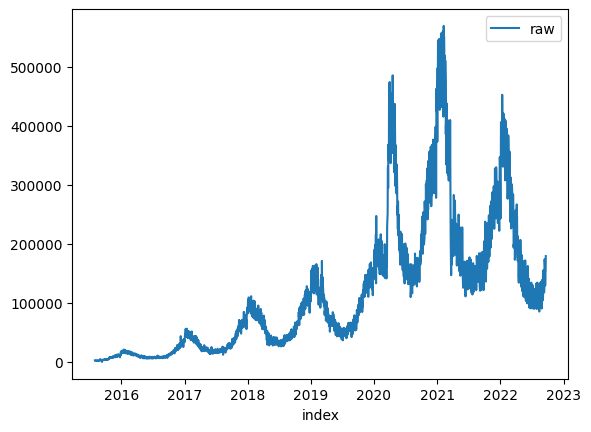

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [06:38<00:00,  7.97s/trial, best loss: 0.18455835581337485]
Prediction...
157387.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.96646937317728, 'LogTransformedPrediction': 11.991159114979014, 'LogTransformedStdErr': 0.10290852113679778, 'LogTransformedCILower': 11.82188966074294, 'LogTransformedCIUpper': 12.160428569215089, 'AdjustedActual': 157387.00000000006, 'Prediction': 162177.71689234025, 'StdErr': 16733.855882642336, 'CILower': 134652.97335089277, 'CIUpper': 189702.46043378772, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.22534312720031147, 'DownAnomalyProbability': 0.6126715636001557, 'UpAnomalyProbability': 0.38732843639984427, 'ModelFreshness': 0.2}
{'dataset_path': PosixPa

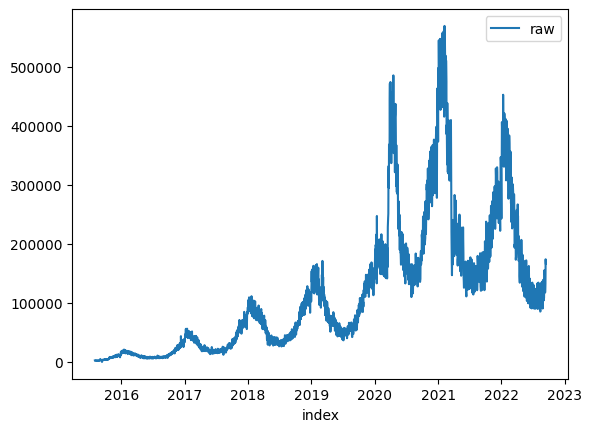

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:27<00:00,  8.95s/trial, best loss: 0.17435920290900433]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 163847.0, 'Prediction': 170002.0351722195, 'StdErr': 19510.40947292008, 'CILower': 137910.26738737855, 'CIUpper': 202093.80295706046, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2475985322389891, 'DownAnomalyProbability': 0.6237992661194944, 'UpAnomalyProbability': 0.3762007338805055, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129154.0, 'Prediction': 152049.81943751965, 'StdErr': 19743.64444178327, 'CILower': 119574.41426821216, 'CIUpper': 184525.22460682713, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnoma

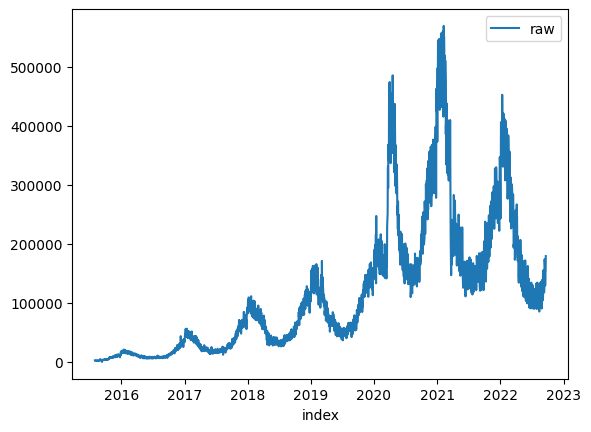

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [06:31<00:00,  7.84s/trial, best loss: 0.13794696458850597]
Prediction...
157387.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 157387.0, 'Prediction': 178148.65226793074, 'StdErr': 24430.389258752, 'CILower': 137964.23788783624, 'CIUpper': 218333.06664802524, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6045798131298667, 'DownAnomalyProbability': 0.8022899065649334, 'UpAnomalyProbability': 0.19771009343506657, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_log_out'),
 'param_days_range': 2,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


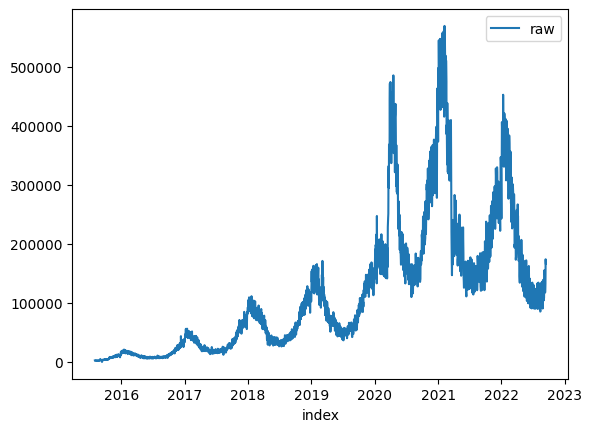

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:32<00:00, 10.24s/trial, best loss: 0.17229218231802068]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 163847.0, 'Prediction': 172900.9985981875, 'StdErr': 21195.04373846794, 'CILower': 138038.25403157342, 'CIUpper': 207763.74316480156, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3307483299825882, 'DownAnomalyProbability': 0.6653741649912941, 'UpAnomalyProbability': 0.3346258350087059, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129154.0, 'Prediction': 155597.39577064576, 'StdErr': 21382.35341879394, 'CILower': 120426.55419698433, 'CIUpper': 190768.23734430718, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnoma

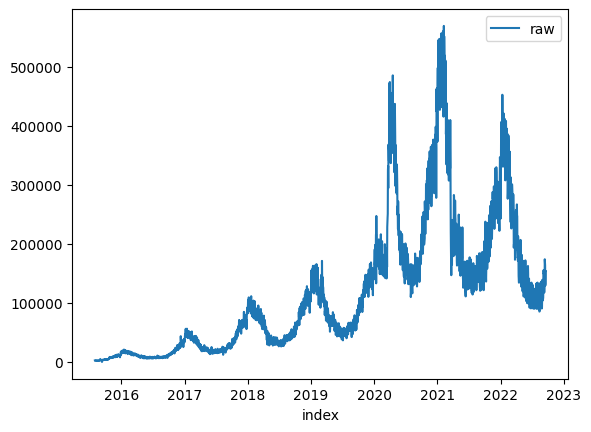

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:06<00:00,  4.93s/trial, best loss: 1e+100]
Prediction...
179215.0 2022-09-20
caso1
{'Success': True, 'AdjustedActual': 0.15603773251821496, 'ConfLevel': 90.0, 'Prediction': 169817.10038900358, 'PredStdErr': 22804.228566317346, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.494270176188798, 'DownAnomalyProbability': 0.252864911905601, 'UpAnomalyProbability': 0.747135088094399, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_log_out'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


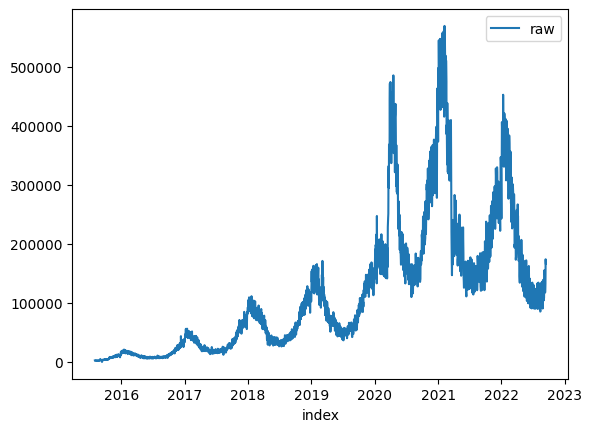

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:27<00:00, 10.14s/trial, best loss: 0.18554536396609642]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 163847.0, 'Prediction': 165875.3516449873, 'StdErr': 21886.919656938993, 'CILower': 129874.57246447573, 'CIUpper': 201876.13082549887, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.07383756497530491, 'DownAnomalyProbability': 0.5369187824876525, 'UpAnomalyProbability': 0.4630812175123476, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129154.0, 'Prediction': 149113.94407620566, 'StdErr': 23469.395204012522, 'CILower': 110510.22425252818, 'CIUpper': 187717.66389988316, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAn

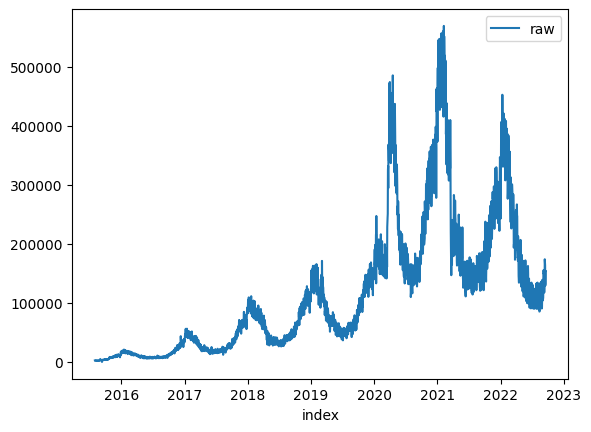

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:41<00:00,  5.63s/trial, best loss: 1e+100]
Prediction...
179215.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 12.096347061251521, 'LogTransformedPrediction': 12.16857951479429, 'LogTransformedStdErr': 0.06883107402007206, 'LogTransformedCILower': 12.05536247304541, 'LogTransformedCIUpper': 12.28179655654317, 'AdjustedActual': 179215.00000000003, 'Prediction': 193096.0851298168, 'StdErr': 13306.837651556985, 'CILower': 171208.2849553989, 'CIUpper': 214983.88530423472, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7031231721632583, 'DownAnomalyProbability': 0.8515615860816291, 'UpAnomalyProbability': 0.14843841391837087, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('

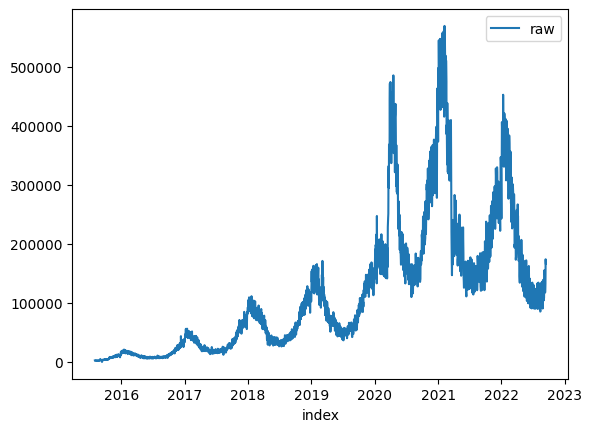

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:42<00:00,  5.66s/trial, best loss: 0.14477572537850608]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 12.006694447766225, 'LogTransformedPrediction': 11.957831037471168, 'LogTransformedStdErr': 0.07522900055123177, 'LogTransformedCILower': 11.83409034306254, 'LogTransformedCIUpper': 12.081571731879796, 'AdjustedActual': 163846.9999999999, 'Prediction': 156475.4406626051, 'StdErr': 11788.24090242289, 'CILower': 137085.5098588771, 'CIUpper': 175865.3714663331, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.46824654416255207, 'DownAnomalyProbability': 0.26587672791872397, 'UpAnomalyProbability': 0.734123272081276, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso2
{'S

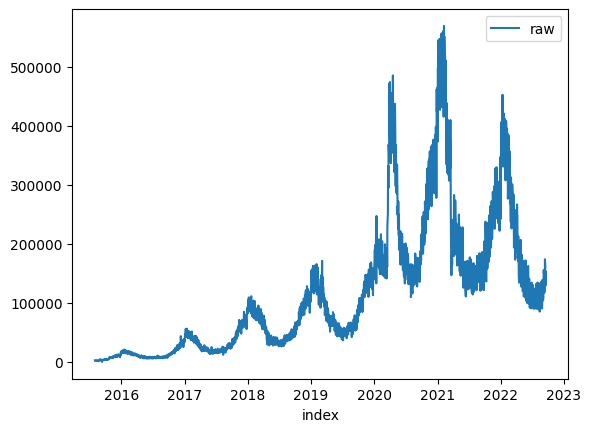

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:15<00:00,  9.91s/trial, best loss: 0.15479611932700488]
Prediction...
153601.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 153601.0, 'Prediction': 158392.2896329729, 'StdErr': 22161.62858495203, 'CILower': 121939.65447586315, 'CIUpper': 194844.92479008267, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.17116623077464, 'DownAnomalyProbability': 0.58558311538732, 'UpAnomalyProbability': 0.41441688461268, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_log_out'),
 'param_days_range': 4,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


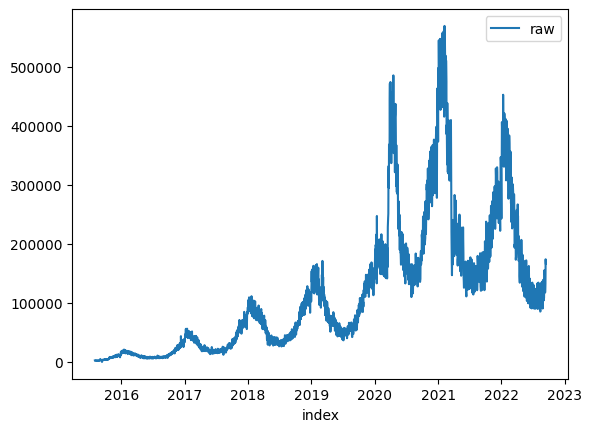

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:25<00:00, 11.30s/trial, best loss: 0.18370384141534896]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 163847.0, 'Prediction': 165698.3187172173, 'StdErr': 21877.213276728304, 'CILower': 129713.50511139986, 'CIUpper': 201683.13232303475, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.06743900655843937, 'DownAnomalyProbability': 0.5337195032792197, 'UpAnomalyProbability': 0.4662804967207803, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129154.0, 'Prediction': 150139.10343162852, 'StdErr': 23347.15387961859, 'CILower': 111736.45269374375, 'CIUpper': 188541.7541695133, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnom

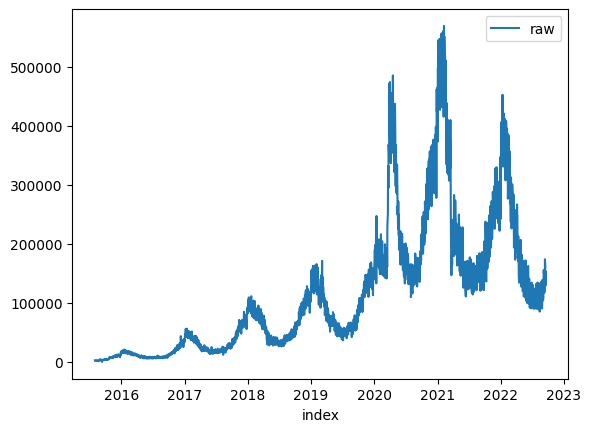

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:47<00:00, 10.55s/trial, best loss: 0.11261225374498834]
Prediction...
153601.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 153601.0, 'Prediction': 154682.43219876918, 'StdErr': 21404.769903264336, 'CILower': 119474.71878932312, 'CIUpper': 189890.14560821524, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.04029434164723211, 'DownAnomalyProbability': 0.5201471708236161, 'UpAnomalyProbability': 0.47985282917638394, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_log_out'),
 'param_days_range': 4,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


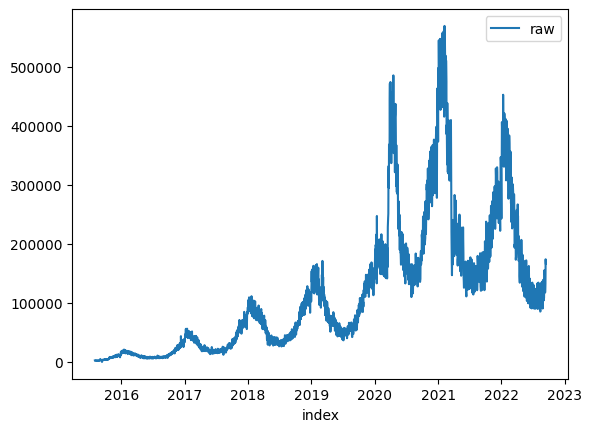

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:31<00:00, 11.44s/trial, best loss: 0.1644195813768088]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 12.006694447766225, 'LogTransformedPrediction': 11.983226888085735, 'LogTransformedStdErr': 0.07941104558114967, 'LogTransformedCILower': 11.852607341741573, 'LogTransformedCIUpper': 12.113846434429897, 'AdjustedActual': 163846.9999999999, 'Prediction': 160552.08991855555, 'StdErr': 12769.815422070511, 'CILower': 139547.61270606203, 'CIUpper': 181556.56713104906, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.20361108490213264, 'DownAnomalyProbability': 0.3981944575489337, 'UpAnomalyProbability': 0.6018055424510663, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso

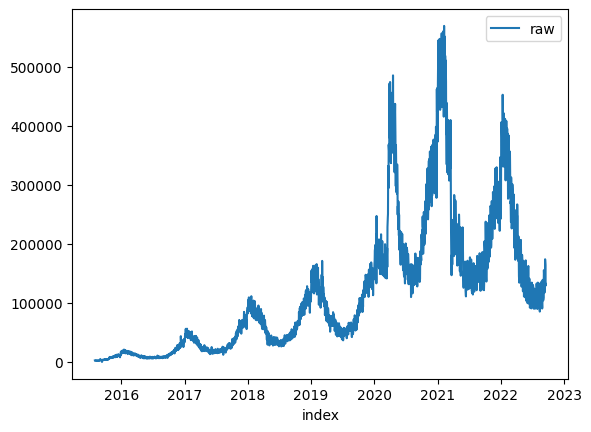

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:47<00:00, 11.76s/trial, best loss: 0.1450694202429955]
Prediction...
152190.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.932891589941208, 'LogTransformedPrediction': 11.881474017355663, 'LogTransformedStdErr': 0.10347966614409038, 'LogTransformedCILower': 11.711265113182828, 'LogTransformedCIUpper': 12.051682921528498, 'AdjustedActual': 152189.99999999988, 'Prediction': 145338.5543646519, 'StdErr': 15080.03992603053, 'CILower': 120534.09599774759, 'CIUpper': 170143.01273155623, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.35041492947032404, 'DownAnomalyProbability': 0.324792535264838, 'UpAnomalyProbability': 0.675207464735162, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath(

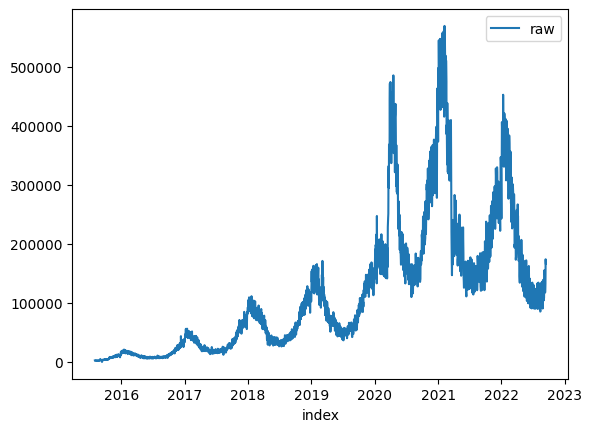

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:26<00:00, 10.12s/trial, best loss: 0.17829026789792662]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 12.006694447766225, 'LogTransformedPrediction': 11.983226888085735, 'LogTransformedStdErr': 0.07941104558114967, 'LogTransformedCILower': 11.852607341741573, 'LogTransformedCIUpper': 12.113846434429897, 'AdjustedActual': 163846.9999999999, 'Prediction': 160552.08991855555, 'StdErr': 12769.815422070511, 'CILower': 139547.61270606203, 'CIUpper': 181556.56713104906, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.20361108490213264, 'DownAnomalyProbability': 0.3981944575489337, 'UpAnomalyProbability': 0.6018055424510663, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso

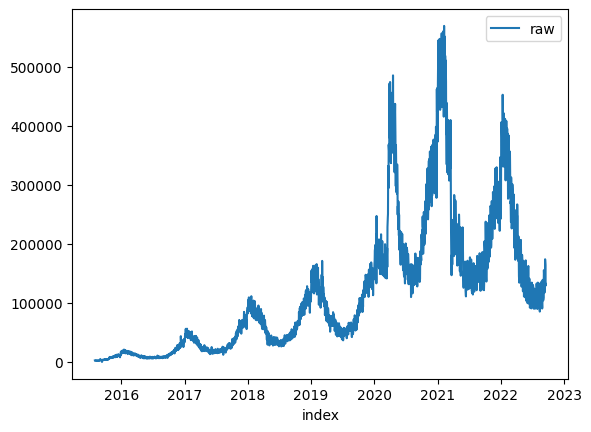

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:51<00:00,  9.43s/trial, best loss: 0.13045296129508072]
Prediction...
152190.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.932891589941208, 'LogTransformedPrediction': 11.871005331423564, 'LogTransformedStdErr': 0.10213732800282899, 'LogTransformedCILower': 11.703004377010979, 'LogTransformedCIUpper': 12.03900628583615, 'AdjustedActual': 152189.99999999988, 'Prediction': 143805.1294676198, 'StdErr': 14726.363557149596, 'CILower': 119582.41695883629, 'CIUpper': 168027.8419764033, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.43090049945697695, 'DownAnomalyProbability': 0.2845497502715115, 'UpAnomalyProbability': 0.7154502497284885, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath

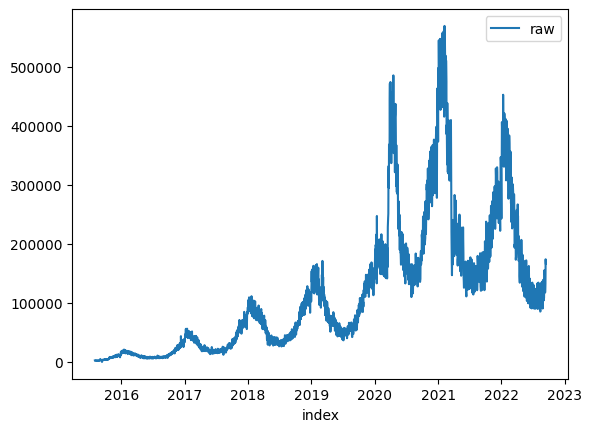

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:19<00:00,  4.00s/trial, best loss: 0.1410138669244466]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 12.006694447766225, 'LogTransformedPrediction': 11.918705255591544, 'LogTransformedStdErr': 0.08434632987806388, 'LogTransformedCILower': 11.779967888971566, 'LogTransformedCIUpper': 12.057442622211521, 'AdjustedActual': 163846.9999999999, 'Prediction': 150580.90091424962, 'StdErr': 12723.653951588212, 'CILower': 129652.35256390432, 'CIUpper': 171509.44926459494, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7028816130542794, 'DownAnomalyProbability': 0.14855919347286028, 'UpAnomalyProbability': 0.8514408065271397, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso

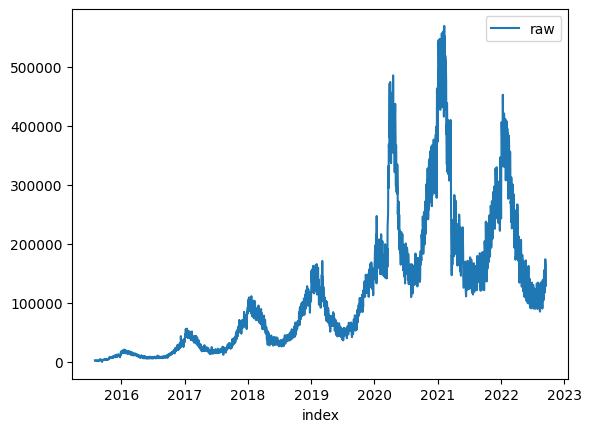

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:45<00:00,  5.72s/trial, best loss: 1e+100]
Prediction...
132148.0 2022-09-17
caso1
{'Success': True, 'AdjustedActual': -28791.0, 'ConfLevel': 90.0, 'Prediction': 160641.37702600064, 'PredStdErr': 18265.454656530568, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3625866741717796, 'DownAnomalyProbability': 0.6812933370858898, 'UpAnomalyProbability': 0.3187066629141102, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_log_out'),
 'param_days_range': 6,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


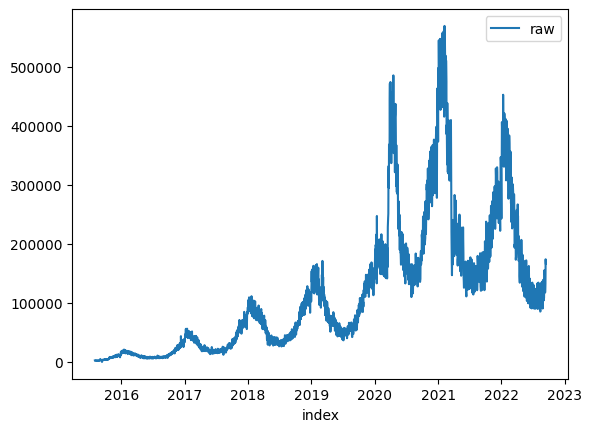

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:34<00:00,  5.48s/trial, best loss: 0.14200362525924584]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 12.006694447766225, 'LogTransformedPrediction': 11.968927409692578, 'LogTransformedStdErr': 0.07243682816010631, 'LogTransformedCILower': 11.849779430168565, 'LogTransformedCIUpper': 12.08807538921659, 'AdjustedActual': 163846.9999999999, 'Prediction': 158188.81579368966, 'StdErr': 11473.816256737618, 'CILower': 139316.06750882004, 'CIUpper': 177061.56407855928, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.378085496820449, 'DownAnomalyProbability': 0.3109572515897755, 'UpAnomalyProbability': 0.6890427484102245, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso2
{

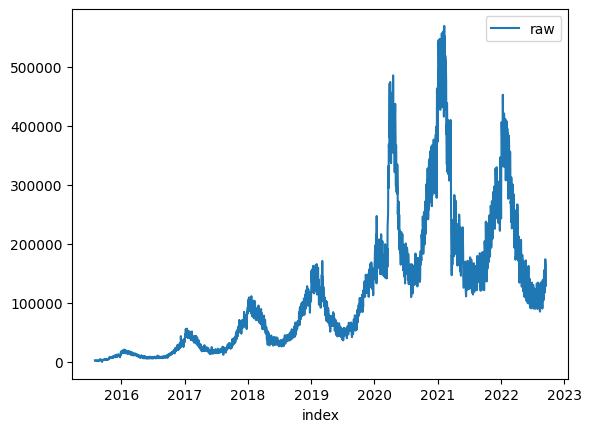

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:57<00:00,  5.95s/trial, best loss: 1e+100]
Prediction...
132148.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.791685352845272, 'LogTransformedPrediction': 11.680859668738039, 'LogTransformedStdErr': 0.05998291322307394, 'LogTransformedCILower': 11.58219655636795, 'LogTransformedCIUpper': 11.779522781108128, 'AdjustedActual': 132148.0, 'Prediction': 118497.86289368526, 'StdErr': 7114.305278237616, 'CILower': 106795.87205353612, 'CIUpper': 130199.8537338344, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9449762568571098, 'DownAnomalyProbability': 0.02751187157144508, 'UpAnomalyProbability': 0.9724881284285549, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_d

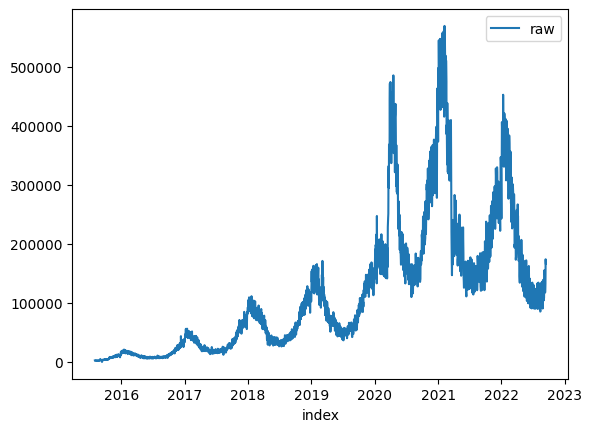

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:46<00:00,  9.33s/trial, best loss: 0.14027781860603653]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 163847.0, 'Prediction': 167351.02545743156, 'StdErr': 19946.379846177624, 'CILower': 134542.15022289456, 'CIUpper': 200159.90069196856, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1394485636794922, 'DownAnomalyProbability': 0.5697242818397461, 'UpAnomalyProbability': 0.4302757181602539, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129154.0, 'Prediction': 146360.88375646377, 'StdErr': 20075.24734700301, 'CILower': 113340.04034579796, 'CIUpper': 179381.72716712957, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAno

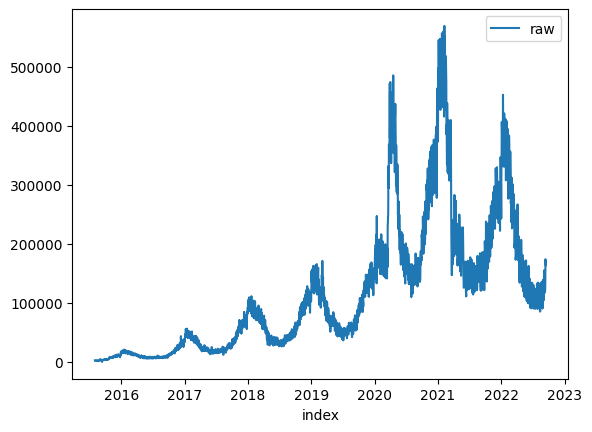

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:30<00:00,  9.02s/trial, best loss: 0.15164512676413983]
Prediction...
129154.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129154.0, 'Prediction': 148714.44868975802, 'StdErr': 21426.929927464866, 'CILower': 113470.28528413239, 'CIUpper': 183958.61209538364, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6387000598877814, 'DownAnomalyProbability': 0.8193500299438907, 'UpAnomalyProbability': 0.18064997005610928, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_log_out'),
 'param_days_range': 7,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


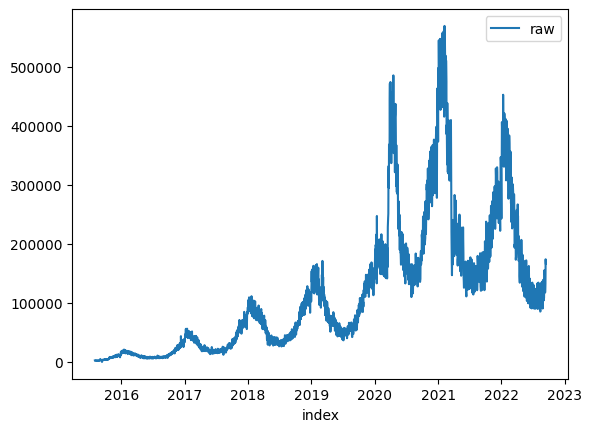

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:59<00:00,  9.59s/trial, best loss: 0.15936398875500202]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 163847.0, 'Prediction': 171573.80145223238, 'StdErr': 21421.895816486984, 'CILower': 136337.91842230718, 'CIUpper': 206809.68448215758, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2816736099864534, 'DownAnomalyProbability': 0.6408368049932267, 'UpAnomalyProbability': 0.3591631950067733, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129154.0, 'Prediction': 155854.5524980607, 'StdErr': 23072.71726219112, 'CILower': 117903.30982571977, 'CIUpper': 193805.7951704016, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnoma

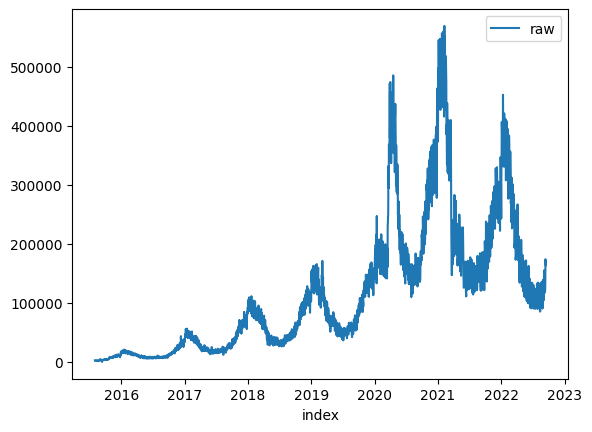

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:45<00:00,  9.31s/trial, best loss: 0.13956574001205102]
Prediction...
129154.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129154.0, 'Prediction': 146684.22291048992, 'StdErr': 18208.438664079044, 'CILower': 116734.00653275609, 'CIUpper': 176634.43928822374, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6643283412773546, 'DownAnomalyProbability': 0.8321641706386773, 'UpAnomalyProbability': 0.16783582936132269, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_log_out'),
 'param_days_range': 7,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


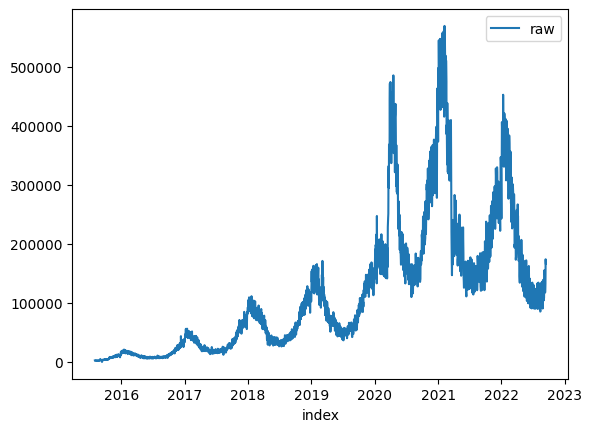

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:57<00:00,  9.55s/trial, best loss: 0.16600944746028382]
Prediction...
163847.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 163847.0, 'Prediction': 170863.49291456086, 'StdErr': 19554.307777625472, 'CILower': 138699.5188440082, 'CIUpper': 203027.4669851135, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.28027086987738725, 'DownAnomalyProbability': 0.6401354349386936, 'UpAnomalyProbability': 0.3598645650613064, 'ModelFreshness': 0.1}
129154.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 129154.0, 'Prediction': 150480.79246623718, 'StdErr': 19700.774074413373, 'CILower': 118075.9027761868, 'CIUpper': 182885.68215628754, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnom

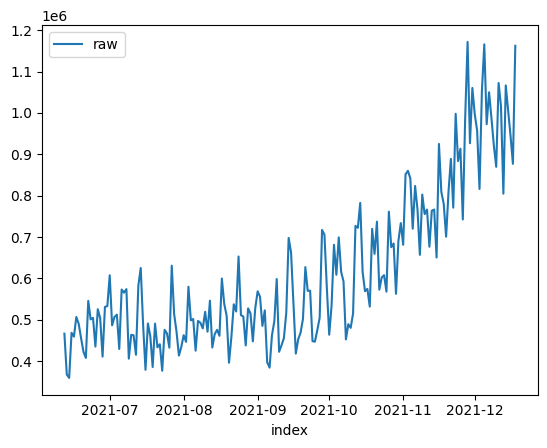

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:17<00:00,  1.55s/trial, best loss: 0.12728629815544645]
Prediction...
1093386.0 2021-12-19
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.904790775853423, 'LogTransformedPrediction': 13.841655424459484, 'LogTransformedStdErr': 0.1154454652360352, 'LogTransformedCILower': 13.65176453225089, 'LogTransformedCIUpper': 14.031546316668077, 'AdjustedActual': 1093385.9999999993, 'Prediction': 1033351.8339578026, 'StdErr': 119694.48818824175, 'CILower': 836471.920935273, 'CIUpper': 1230231.7469803323, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3840241047239037, 'DownAnomalyProbability': 0.30798794763804815, 'UpAnomalyProbability': 0.6920120523619518, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath

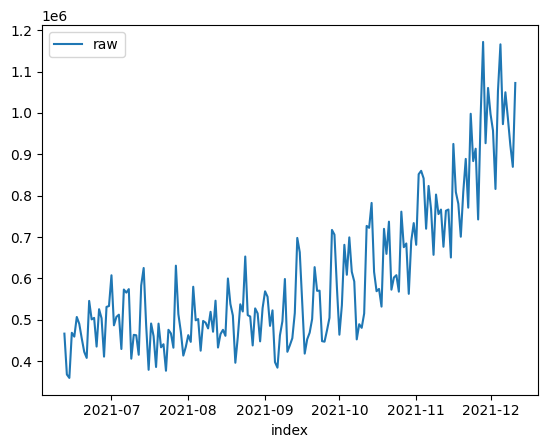

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:10<00:00,  1.41s/trial, best loss: 0.17651783674252872]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1016642.0, 'Prediction': 824459.8499900928, 'StdErr': 78644.86660421366, 'CILower': 695100.5559150373, 'CIUpper': 953819.1440651483, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.985461306824845, 'DownAnomalyProbability': 0.0072693465875774965, 'UpAnomalyProbability': 0.9927306534124225, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 804777.0, 'Prediction': 854981.8989365282, 'StdErr': 78910.67786416855, 'CILower': 725185.3842464513, 'CIUpper': 984778.4136266052, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly

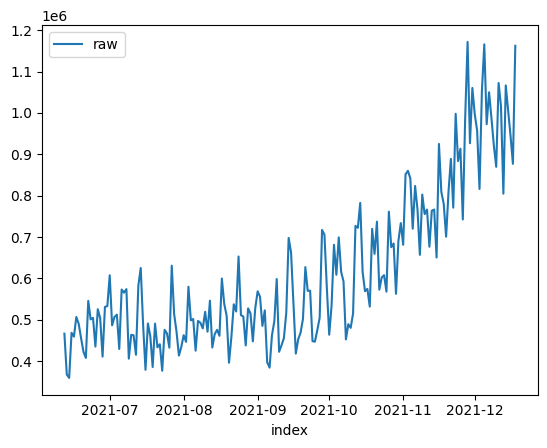

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:22<00:00,  1.65s/trial, best loss: 0.14067509744874496]
Prediction...
1093386.0 2021-12-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1093386.0, 'Prediction': 858681.2535550512, 'StdErr': 78740.34834284437, 'CILower': 729164.9059959012, 'CIUpper': 988197.6011142011, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9971245005103868, 'DownAnomalyProbability': 0.0014377497448065935, 'UpAnomalyProbability': 0.9985622502551934, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_result'),
 'param_days_range': 1,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


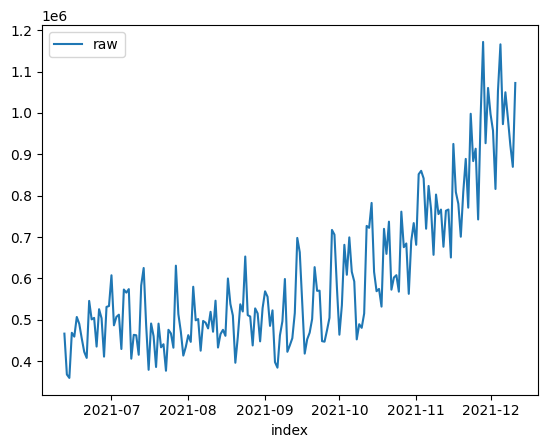

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:27<00:00,  1.75s/trial, best loss: 0.14585467579147723]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.832016580956008, 'LogTransformedPrediction': 13.842580587695025, 'LogTransformedStdErr': 0.09580182567376247, 'LogTransformedCILower': 13.685000607266964, 'LogTransformedCIUpper': 14.000160568123086, 'AdjustedActual': 1016642.0000000008, 'Prediction': 1032164.5022843325, 'StdErr': 99110.66151205398, 'CILower': 869141.9712266709, 'CIUpper': 1195187.0333419943, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.12445399446611427, 'DownAnomalyProbability': 0.5622269972330571, 'UpAnomalyProbability': 0.4377730027669428, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso

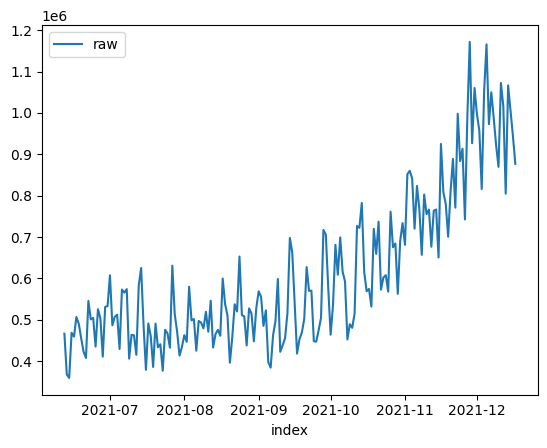

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:28<00:00,  1.76s/trial, best loss: 0.10318849031215199]
Prediction...
1162347.0 2021-12-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.965952655206598, 'LogTransformedPrediction': 13.81719296800278, 'LogTransformedStdErr': 0.1162604556721379, 'LogTransformedCILower': 13.625961535819433, 'LogTransformedCIUpper': 14.008424400186128, 'AdjustedActual': 1162346.9999999995, 'Prediction': 1008475.379595964, 'StdErr': 117643.22977509568, 'CILower': 814969.4864141124, 'CIUpper': 1201981.2727778156, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8091101867631783, 'DownAnomalyProbability': 0.09544490661841087, 'UpAnomalyProbability': 0.9045550933815891, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath

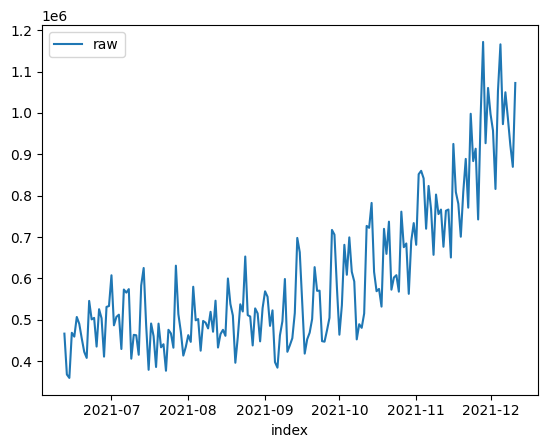

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:15<00:00,  1.50s/trial, best loss: 0.14492181557555678]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.832016580956008, 'LogTransformedPrediction': 13.778008824364202, 'LogTransformedStdErr': 0.12260597177649322, 'LogTransformedCILower': 13.576339947001728, 'LogTransformedCIUpper': 13.979677701726676, 'AdjustedActual': 1016642.0000000008, 'Prediction': 970458.4872557853, 'StdErr': 119432.68103747701, 'CILower': 774009.2086747529, 'CIUpper': 1166907.7658368177, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.30101483348391334, 'DownAnomalyProbability': 0.34949258325804333, 'UpAnomalyProbability': 0.6505074167419567, 'ModelFreshness': 0.2}
804777.0 2021-12-13
cas

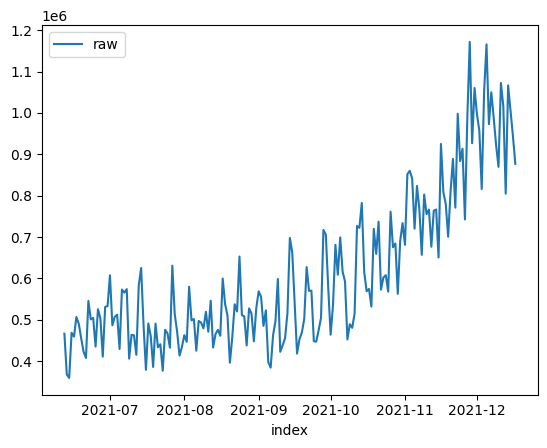

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:18<00:00,  1.57s/trial, best loss: 0.13883772019769935]
Prediction...
1162347.0 2021-12-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.965952655206598, 'LogTransformedPrediction': 13.726510821945826, 'LogTransformedStdErr': 0.13287331055885726, 'LogTransformedCILower': 13.507953675148041, 'LogTransformedCIUpper': 13.945067968743611, 'AdjustedActual': 1162346.9999999995, 'Prediction': 922956.5123253511, 'StdErr': 123179.71264962053, 'CILower': 720343.9152067826, 'CIUpper': 1125569.1094439195, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9480351264393625, 'DownAnomalyProbability': 0.02598243678031875, 'UpAnomalyProbability': 0.9740175632196812, 'ModelFreshness': 0.2}
{'dataset_path': PosixPat

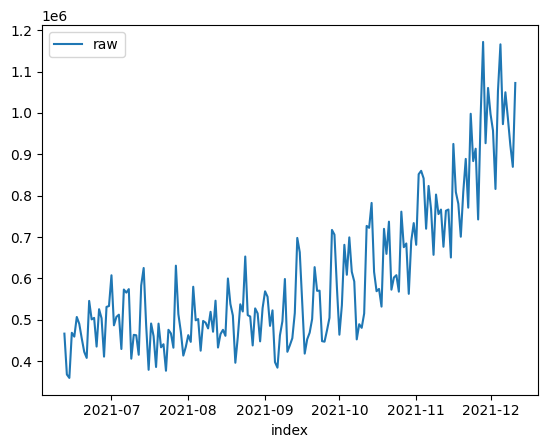

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:09<00:00,  1.39s/trial, best loss: 0.18688711081896012]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1016642.0, 'Prediction': 872121.4081193741, 'StdErr': 73129.69617674094, 'CILower': 751833.7621252026, 'CIUpper': 992409.0541135456, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.951870480634291, 'DownAnomalyProbability': 0.024064759682854486, 'UpAnomalyProbability': 0.9759352403171455, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 804777.0, 'Prediction': 885472.0170392307, 'StdErr': 73694.93183343233, 'CILower': 764254.641125068, 'CIUpper': 1006689.3929533934, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly'

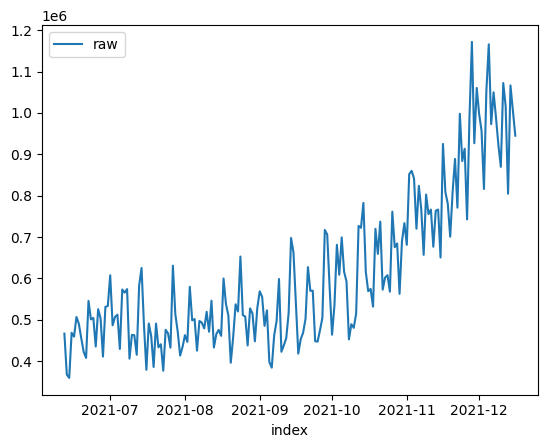

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:10<00:00,  1.41s/trial, best loss: 1e+100]
Prediction...
876969.0 2021-12-17
caso1
{'Success': True, 'AdjustedActual': -7570.0, 'ConfLevel': 90.0, 'Prediction': 936664.94780482, 'PredStdErr': 56200.41981048338, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.0038302944809940342, 'DownAnomalyProbability': 0.498084852759503, 'UpAnomalyProbability': 0.501915147240497, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_result'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


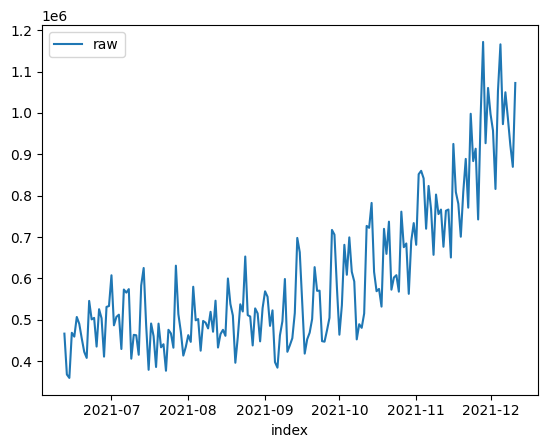

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:13<00:00,  1.48s/trial, best loss: 0.15626297113786758]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.832016580956008, 'LogTransformedPrediction': 13.784376955975368, 'LogTransformedStdErr': 0.13685988131100346, 'LogTransformedCILower': 13.559262483816816, 'LogTransformedCIUpper': 14.00949142813392, 'AdjustedActual': 1016642.0000000008, 'Prediction': 978465.9308923038, 'StdErr': 134542.38987042586, 'CILower': 757163.3929352148, 'CIUpper': 1199768.4688493928, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.22339612295569, 'DownAnomalyProbability': 0.388301938522155, 'UpAnomalyProbability': 0.611698061477845, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso2
{'Su

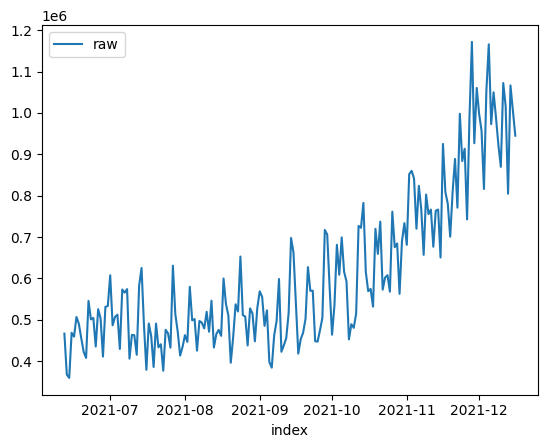

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:11<00:00,  1.43s/trial, best loss: 1e+100]
Prediction...
876969.0 2021-12-17
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 876969.0, 'Prediction': 839892.3731910747, 'StdErr': 65346.95954962023, 'CILower': 732406.1897656308, 'CIUpper': 947378.5566165186, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.42954468117516376, 'DownAnomalyProbability': 0.2852276594124181, 'UpAnomalyProbability': 0.7147723405875819, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_result'),
 'param_days_range': 3,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


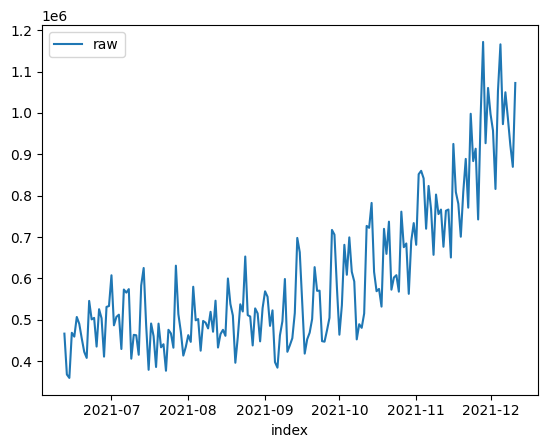

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:09<00:00,  1.38s/trial, best loss: 0.13883008732780805]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.832016580956008, 'LogTransformedPrediction': 13.904982740247373, 'LogTransformedStdErr': 0.0969141132065048, 'LogTransformedCILower': 13.745573209636868, 'LogTransformedCIUpper': 14.064392270857878, 'AdjustedActual': 1016642.0000000008, 'Prediction': 1098743.7094602347, 'StdErr': 106734.39241554662, 'CILower': 923181.2569750611, 'CIUpper': 1274306.1619454082, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5582343895687774, 'DownAnomalyProbability': 0.7791171947843887, 'UpAnomalyProbability': 0.22088280521561127, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso

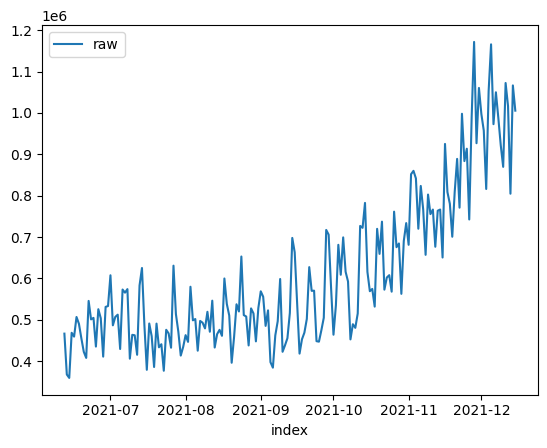

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:13<00:00,  1.47s/trial, best loss: 1e+100]
Prediction...
945045.0 2021-12-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.758988882539859, 'LogTransformedPrediction': 13.770545597855945, 'LogTransformedStdErr': 0.11190847342433227, 'LogTransformedCILower': 13.58647253945733, 'LogTransformedCIUpper': 13.95461865625456, 'AdjustedActual': 945045.0000000002, 'Prediction': 962035.1924870176, 'StdErr': 107997.95295278433, 'CILower': 784394.3678692959, 'CIUpper': 1139676.0171047393, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.12500700939076337, 'DownAnomalyProbability': 0.5625035046953817, 'UpAnomalyProbability': 0.4374964953046183, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('

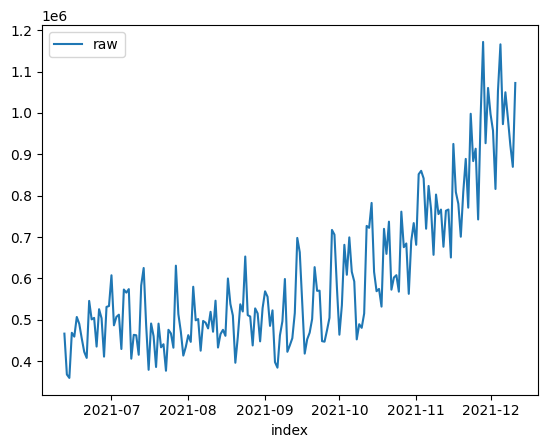

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:12<00:00,  1.44s/trial, best loss: 0.13882194806179501]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.832016580956008, 'LogTransformedPrediction': 13.964998024799858, 'LogTransformedStdErr': 0.08502245866884685, 'LogTransformedCILower': 13.825148525286073, 'LogTransformedCIUpper': 14.104847524313643, 'AdjustedActual': 1016642.0000000008, 'Prediction': 1165442.7037247682, 'StdErr': 99268.23300762582, 'CILower': 1002160.9906211111, 'CIUpper': 1328724.4168284254, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8661201544188004, 'DownAnomalyProbability': 0.9330600772094002, 'UpAnomalyProbability': 0.0669399227905998, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso

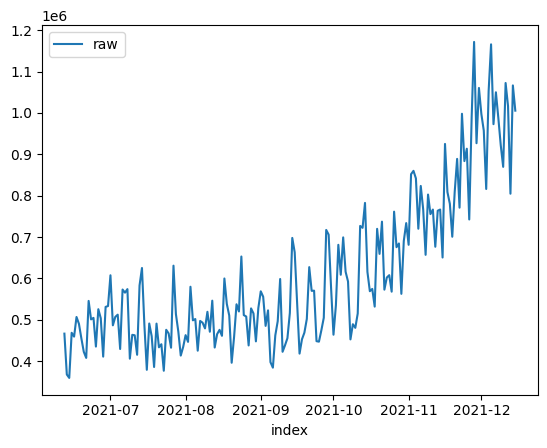

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:11<00:00,  1.42s/trial, best loss: 1e+100]
Prediction...
945045.0 2021-12-16
caso1
{'Success': True, 'AdjustedActual': 528.0, 'ConfLevel': 90.0, 'Prediction': 1010757.8539527552, 'PredStdErr': 56264.36937117866, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.022066507968529603, 'DownAnomalyProbability': 0.5110332539842648, 'UpAnomalyProbability': 0.4889667460157352, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_result'),
 'param_days_range': 4,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


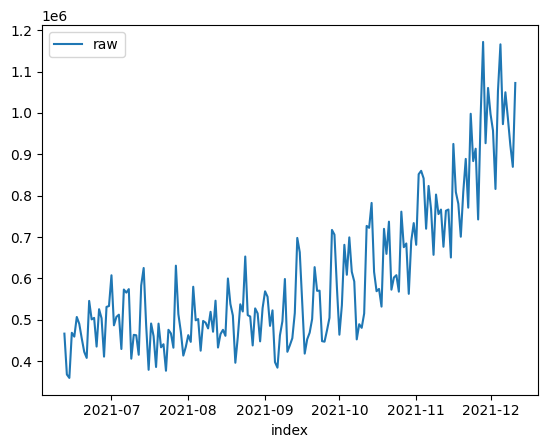

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:15<00:00,  1.52s/trial, best loss: 0.16576839007789998]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.832016580956008, 'LogTransformedPrediction': 13.7800399855776, 'LogTransformedStdErr': 0.12621318050735605, 'LogTransformedCILower': 13.572437777850995, 'LogTransformedCIUpper': 13.987642193304206, 'AdjustedActual': 1016642.0000000008, 'Prediction': 972868.1479631701, 'StdErr': 123279.5357874906, 'CILower': 770091.3563942224, 'CIUpper': 1175644.939532118, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.27746884862076326, 'DownAnomalyProbability': 0.36126557568961837, 'UpAnomalyProbability': 0.6387344243103816, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso2
{

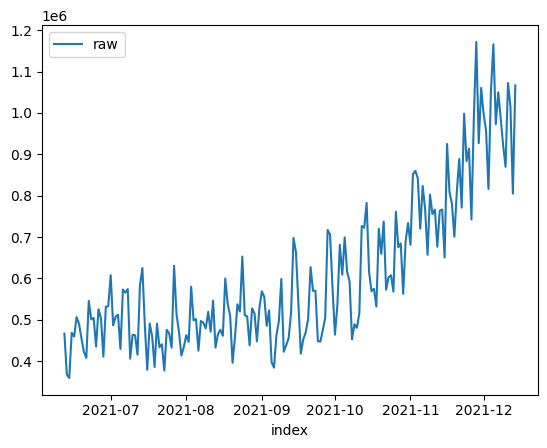

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:56<00:00,  1.14s/trial, best loss: 1e+100]
Prediction...
1005551.0 2021-12-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.821047202422037, 'LogTransformedPrediction': 13.794630858687363, 'LogTransformedStdErr': 0.10325525008948068, 'LogTransformedCILower': 13.624791086075899, 'LogTransformedCIUpper': 13.964470631298827, 'AdjustedActual': 1005551.0000000006, 'Prediction': 984570.3837224683, 'StdErr': 101933.738815739, 'CILower': 816904.3037226759, 'CIUpper': 1152236.4637222607, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1630731886074439, 'DownAnomalyProbability': 0.41846340569627805, 'UpAnomalyProbability': 0.581536594303722, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath(

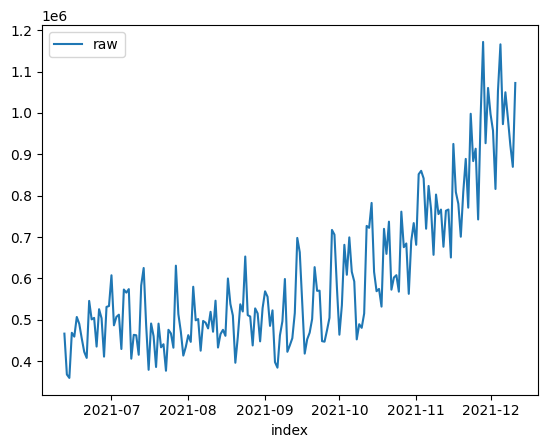

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:15<00:00,  1.50s/trial, best loss: 0.15022894229997885]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1016642.0, 'Prediction': 978807.2395703833, 'StdErr': 69696.67568197093, 'CILower': 864166.409788433, 'CIUpper': 1093448.0693523337, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.41276612585826955, 'DownAnomalyProbability': 0.2936169370708652, 'UpAnomalyProbability': 0.7063830629291348, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 804777.0, 'Prediction': 974591.221796105, 'StdErr': 70756.58872517326, 'CILower': 858206.9902007901, 'CIUpper': 1090975.45339142, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly':

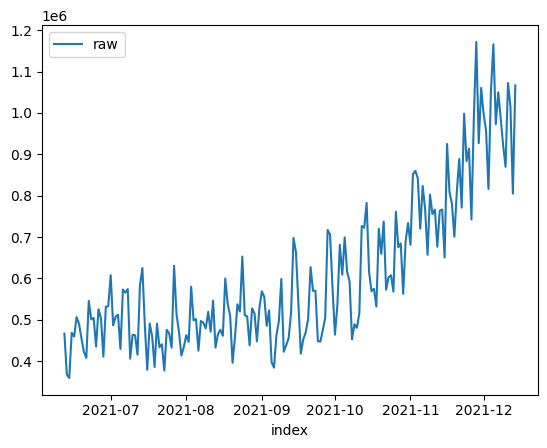

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:58<00:00,  1.17s/trial, best loss: 1e+100]
Prediction...
1005551.0 2021-12-15
caso1
{'Success': True, 'AdjustedActual': 412639.0, 'ConfLevel': 90.0, 'Prediction': 866540.457576807, 'PredStdErr': 55933.81753032941, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9678861332933368, 'DownAnomalyProbability': 0.01605693335333158, 'UpAnomalyProbability': 0.9839430666466684, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_result'),
 'param_days_range': 5,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


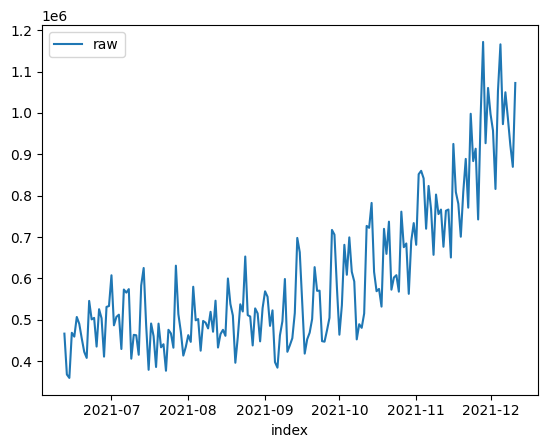

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:13<00:00,  1.46s/trial, best loss: 0.14495754411555295]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.832016580956008, 'LogTransformedPrediction': 13.790819860048794, 'LogTransformedStdErr': 0.1278193789576746, 'LogTransformedCILower': 13.580575690975579, 'LogTransformedCIUpper': 14.00106402912201, 'AdjustedActual': 1016642.0000000008, 'Prediction': 983612.9352941874, 'StdErr': 126240.19145488113, 'CILower': 775966.2985125779, 'CIUpper': 1191259.5720757968, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.206398438575651, 'DownAnomalyProbability': 0.3968007807121745, 'UpAnomalyProbability': 0.6031992192878255, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso2
{'

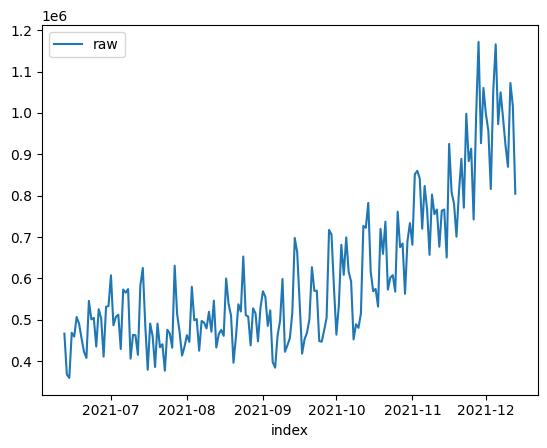

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:02<00:00,  1.25s/trial, best loss: 1e+100]
Prediction...
1066585.0 2021-12-14
caso1
{'Success': True, 'AdjustedActual': 0.10671031610738768, 'ConfLevel': 90.0, 'Prediction': 1088528.1538204195, 'PredStdErr': 167691.24119955176, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3130568666399087, 'DownAnomalyProbability': 0.34347156668004564, 'UpAnomalyProbability': 0.6565284333199544, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_result'),
 'param_days_range': 6,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


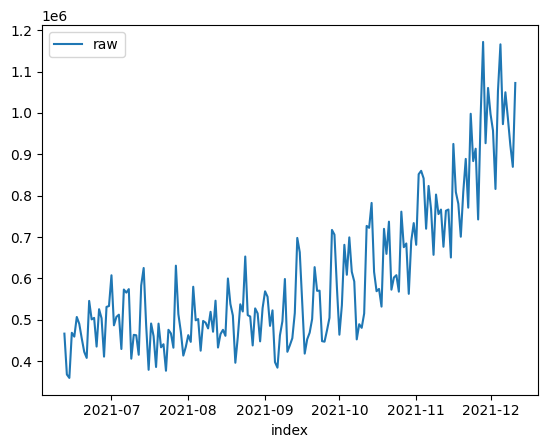

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:11<00:00,  1.42s/trial, best loss: 0.16348914091325228]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.832016580956008, 'LogTransformedPrediction': 13.916911143304596, 'LogTransformedStdErr': 0.09727015250967773, 'LogTransformedCILower': 13.756915980154929, 'LogTransformedCIUpper': 14.076906306454262, 'AdjustedActual': 1016642.0000000008, 'Prediction': 1111966.8979091572, 'StdErr': 108417.63356493073, 'CILower': 933635.7601143853, 'CIUpper': 1290298.0357039291, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6207277284039261, 'DownAnomalyProbability': 0.810363864201963, 'UpAnomalyProbability': 0.1896361357980369, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso2

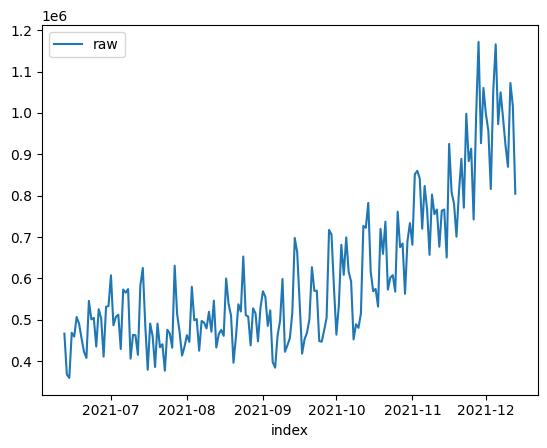

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:02<00:00,  1.26s/trial, best loss: 1e+100]
Prediction...
1066585.0 2021-12-14
caso1
{'Success': True, 'AdjustedActual': 105745.0, 'ConfLevel': 90.0, 'Prediction': 1046206.8623329671, 'PredStdErr': 55153.36632875512, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3577750840269436, 'DownAnomalyProbability': 0.3211124579865282, 'UpAnomalyProbability': 0.6788875420134718, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.segment_result'),
 'param_days_range': 6,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


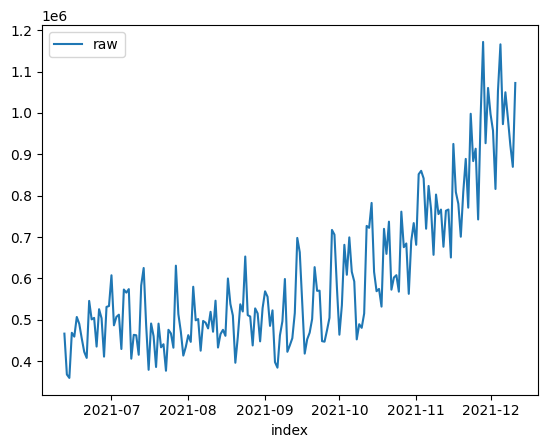

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:07<00:00,  1.35s/trial, best loss: 0.1541367289667888]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.832016580956008, 'LogTransformedPrediction': 13.937931752742845, 'LogTransformedStdErr': 0.08609727652048492, 'LogTransformedCILower': 13.796314335187482, 'LogTransformedCIUpper': 14.079549170298208, 'AdjustedActual': 1016642.0000000008, 'Prediction': 1134425.8725469736, 'StdErr': 97852.34655109853, 'CILower': 973473.0854166868, 'CIUpper': 1295378.6596772606, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7712905082161856, 'DownAnomalyProbability': 0.8856452541080928, 'UpAnomalyProbability': 0.1143547458919072, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso2

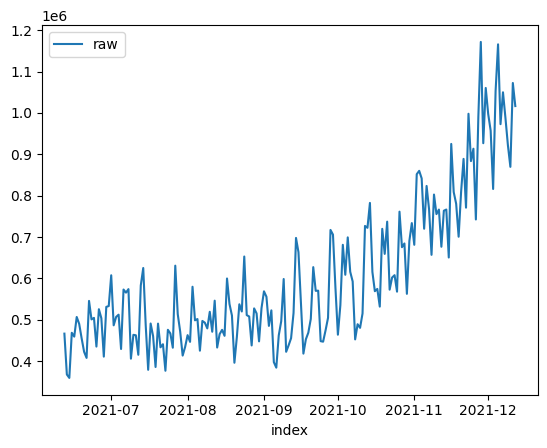

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:13<00:00,  1.47s/trial, best loss: 0.1304053108474082]
Prediction...
804777.0 2021-12-13
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.598321741969881, 'LogTransformedPrediction': 13.715992345579595, 'LogTransformedStdErr': 0.1061741268286176, 'LogTransformedCILower': 13.541351447977139, 'LogTransformedCIUpper': 13.890633243182052, 'AdjustedActual': 804776.9999999999, 'Prediction': 910389.4188454121, 'StdErr': 96932.95910249226, 'CILower': 750948.889494539, 'CIUpper': 1069829.9481962852, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7240845499159532, 'DownAnomalyProbability': 0.8620422749579766, 'UpAnomalyProbability': 0.13795772504202347, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('d

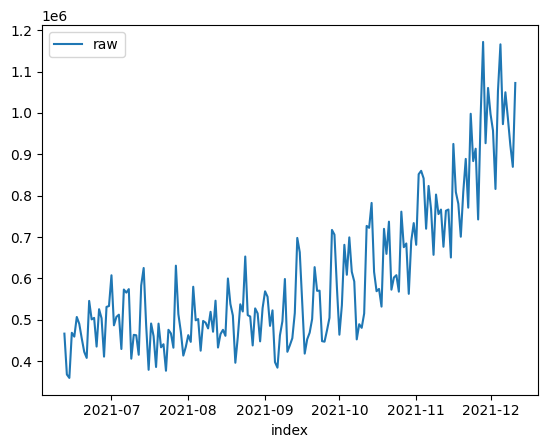

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:06<00:00,  1.32s/trial, best loss: 0.17113293176043723]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1016642.0, 'Prediction': 872121.4081193741, 'StdErr': 73129.69617674094, 'CILower': 751833.7621252026, 'CIUpper': 992409.0541135456, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.951870480634291, 'DownAnomalyProbability': 0.024064759682854486, 'UpAnomalyProbability': 0.9759352403171455, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 804777.0, 'Prediction': 885472.0170392307, 'StdErr': 73694.93183343233, 'CILower': 764254.641125068, 'CIUpper': 1006689.3929533934, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly'

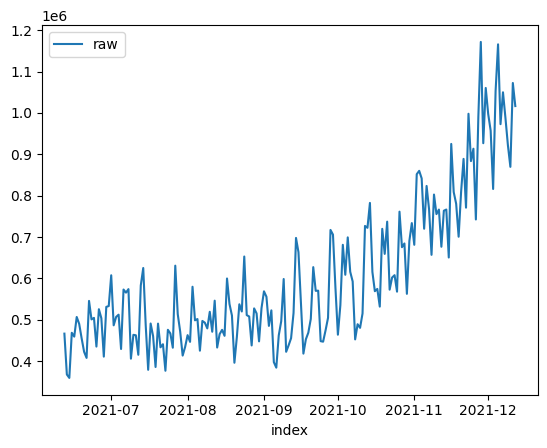

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:06<00:00,  1.32s/trial, best loss: 0.1953798311341122]
Prediction...
804777.0 2021-12-13
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 13.598321741969881, 'LogTransformedPrediction': 13.704617703332772, 'LogTransformedStdErr': 0.10590674366847432, 'LogTransformedCILower': 13.530416611891063, 'LogTransformedCIUpper': 13.878818794774482, 'AdjustedActual': 804776.9999999999, 'Prediction': 900067.2047674523, 'StdErr': 95591.21047736412, 'CILower': 742833.6555090784, 'CIUpper': 1057300.7540258262, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6811632170121527, 'DownAnomalyProbability': 0.8405816085060763, 'UpAnomalyProbability': 0.15941839149392367, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath(

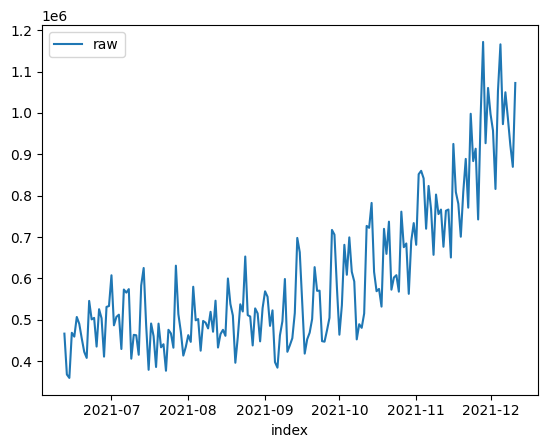

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:06<00:00,  1.34s/trial, best loss: 0.1692611678379537]
Prediction...
1016642.0 2021-12-12
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 1016642.0, 'Prediction': 821091.3631618072, 'StdErr': 77580.21564450844, 'CILower': 693483.2640792602, 'CIUpper': 948699.4622443542, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9882853402727405, 'DownAnomalyProbability': 0.0058573298636297455, 'UpAnomalyProbability': 0.9941426701363703, 'ModelFreshness': 0.2}
804777.0 2021-12-13
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 804777.0, 'Prediction': 847268.9655128812, 'StdErr': 77717.15426498657, 'CILower': 719435.622443771, 'CIUpper': 975102.3085819914, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly

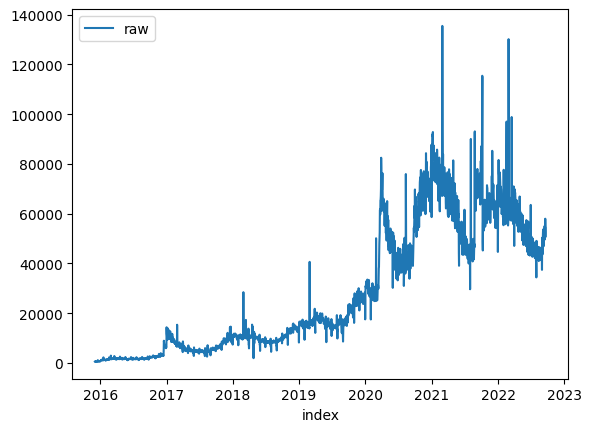

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:56<00:00,  9.52s/trial, best loss: 0.08453005175647058]
Prediction...
7777.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 8.959054514715692, 'LogTransformedPrediction': 10.885776515106018, 'LogTransformedStdErr': 0.11107377193839091, 'LogTransformedCILower': 10.703076418473975, 'LogTransformedCIUpper': 11.068476611738062, 'AdjustedActual': 7776.999999999998, 'Prediction': 53740.73713826035, 'StdErr': 5987.756241659562, 'CILower': 43891.754566865304, 'CIUpper': 63589.7197096554, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 0.9999999999999836, 'DownAnomalyProbability': 0.9999999999999918, 'UpAnomalyProbability': 8.188281388276548e-15, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('dat

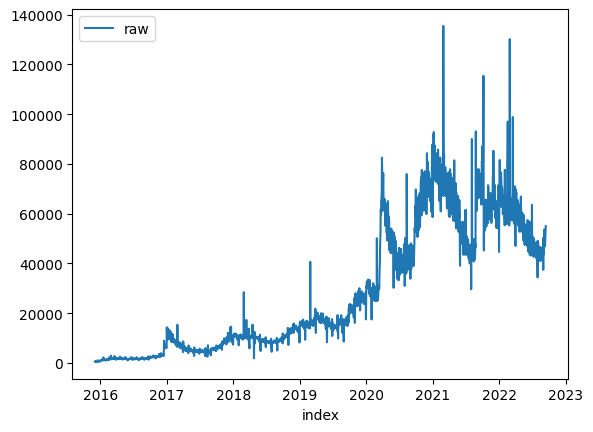

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:22<00:00,  5.26s/trial, best loss: 0.060362617297968886]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 50355.99234444175, 'StdErr': 6546.2058889448135, 'CILower': 39588.44184523979, 'CIUpper': 61123.542843643714, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4670889837786718, 'DownAnomalyProbability': 0.2664555081106641, 'UpAnomalyProbability': 0.7335444918893359, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 48039.96417290403, 'StdErr': 7380.213110787435, 'CILower': 35900.59386995051, 'CIUpper': 60179.33447585755, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': Fa

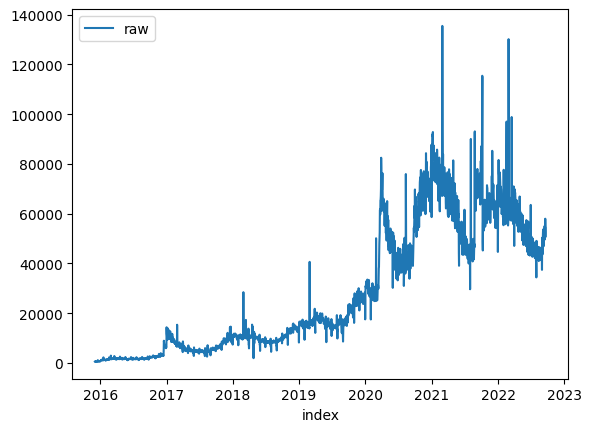

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:22<00:00, 10.05s/trial, best loss: 0.08946645415662992]
Prediction...
7777.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 8.959054514715692, 'LogTransformedPrediction': 10.898931053044995, 'LogTransformedStdErr': 0.1077007178689631, 'LogTransformedCILower': 10.721779136632954, 'LogTransformedCIUpper': 11.076082969457037, 'AdjustedActual': 7776.999999999998, 'Prediction': 54432.26720064536, 'StdErr': 5879.543549167296, 'CILower': 44761.2786689784, 'CIUpper': 64103.25573231232, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': True, 'IsAnomalyExtreme': True, 'AnomalyProbability': 0.999999999999998, 'DownAnomalyProbability': 0.999999999999999, 'UpAnomalyProbability': 1.0509069016406446e-15, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v

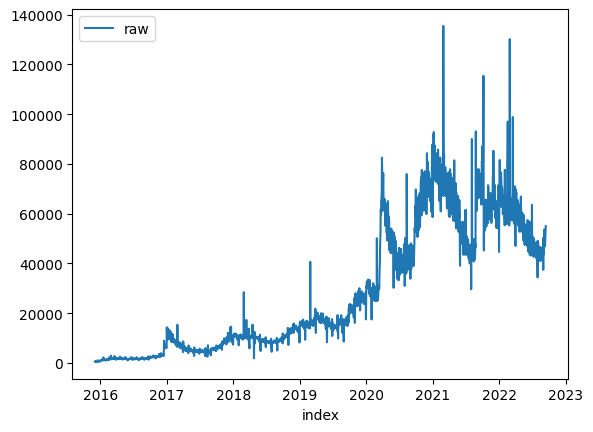

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:12<00:00,  8.65s/trial, best loss: 0.06293999478290738]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 51000.8562920268, 'StdErr': 6489.655079087361, 'CILower': 40326.323597525916, 'CIUpper': 61675.38898652769, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4036344686742528, 'DownAnomalyProbability': 0.2981827656628736, 'UpAnomalyProbability': 0.7018172343371264, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 48236.79559396464, 'StdErr': 7317.3700322244185, 'CILower': 36200.7929567143, 'CIUpper': 60272.79823121498, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': Fals

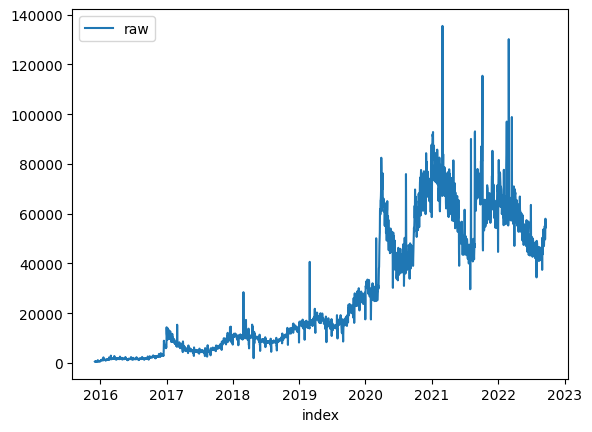

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:09<00:00,  4.99s/trial, best loss: 0.07531842970712539]
Prediction...
50871.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 50871.0, 'Prediction': 54762.433447860094, 'StdErr': 4564.6336747136, 'CILower': 47254.2791923026, 'CIUpper': 62270.58770341759, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6060734779633494, 'DownAnomalyProbability': 0.8030367389816747, 'UpAnomalyProbability': 0.1969632610183253, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.subscription'),
 'param_days_range': 2,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


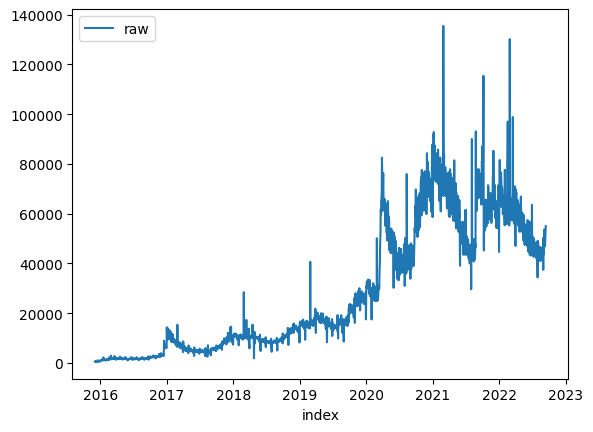

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:14<00:00,  5.09s/trial, best loss: 0.06767067036880431]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 53030.96296267264, 'StdErr': 6501.535525216209, 'CILower': 42336.88867326691, 'CIUpper': 63725.037252078364, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.17133659134876345, 'DownAnomalyProbability': 0.4143317043256183, 'UpAnomalyProbability': 0.5856682956743817, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 52387.89891267945, 'StdErr': 7341.418391879442, 'CILower': 40312.3402438283, 'CIUpper': 64463.457581530594, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': Fa

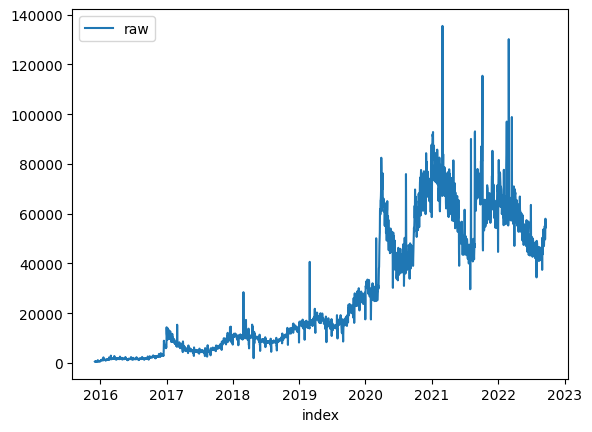

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:51<00:00, 10.62s/trial, best loss: 0.07555794100031583]
Prediction...
50871.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.837067952947244, 'LogTransformedPrediction': 10.91276459066314, 'LogTransformedStdErr': 0.09787082156152763, 'LogTransformedCILower': 10.751781414844942, 'LogTransformedCIUpper': 11.07374776648134, 'AdjustedActual': 50871.000000000015, 'Prediction': 55134.768439875035, 'StdErr': 5409.130879912821, 'CILower': 46237.539893395224, 'CIUpper': 64031.99698635485, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5694517851821255, 'DownAnomalyProbability': 0.7847258925910627, 'UpAnomalyProbability': 0.21527410740893727, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('

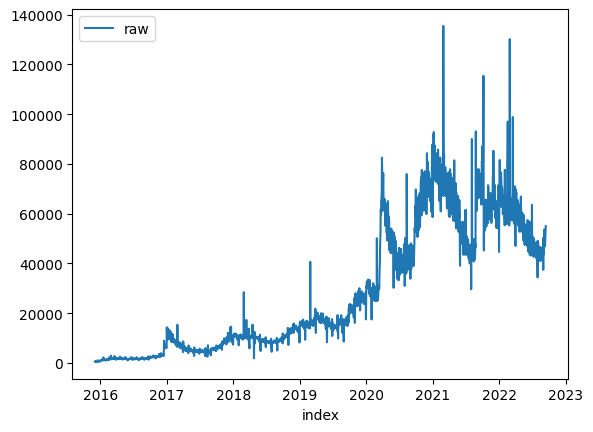

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:23<00:00,  5.27s/trial, best loss: 0.06113255191047568]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 53588.271979916826, 'StdErr': 6516.0592771338415, 'CILower': 42870.30824449244, 'CIUpper': 64306.235715341216, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1037541481121016, 'DownAnomalyProbability': 0.4481229259439492, 'UpAnomalyProbability': 0.5518770740560508, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 52656.79739482878, 'StdErr': 7374.798714633628, 'CILower': 40526.33298102661, 'CIUpper': 64787.26180863096, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': F

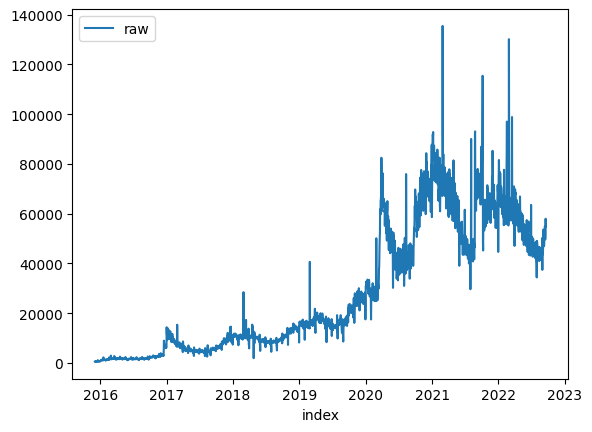

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:23<00:00,  4.07s/trial, best loss: 0.05251166601739067]
Prediction...
54463.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54463.0, 'Prediction': 55467.69161850512, 'StdErr': 3534.8599864045323, 'CILower': 49653.364349102, 'CIUpper': 61282.01888790825, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.22376118336242845, 'DownAnomalyProbability': 0.6118805916812142, 'UpAnomalyProbability': 0.3881194083187858, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.subscription'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


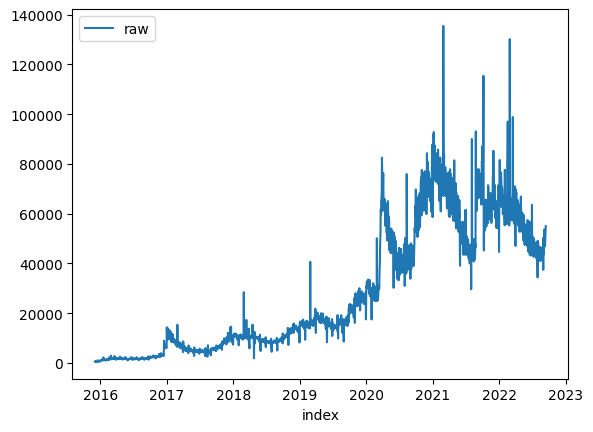

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:28<00:00,  5.37s/trial, best loss: 0.06566878775450351]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 52306.0627155261, 'StdErr': 6386.19919358874, 'CILower': 41801.6998095171, 'CIUpper': 62810.425621535105, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.26149598546379926, 'DownAnomalyProbability': 0.36925200726810037, 'UpAnomalyProbability': 0.6307479927318996, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 51526.77233827491, 'StdErr': 7399.629374178448, 'CILower': 39355.46512406084, 'CIUpper': 63698.07955248898, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': Fals

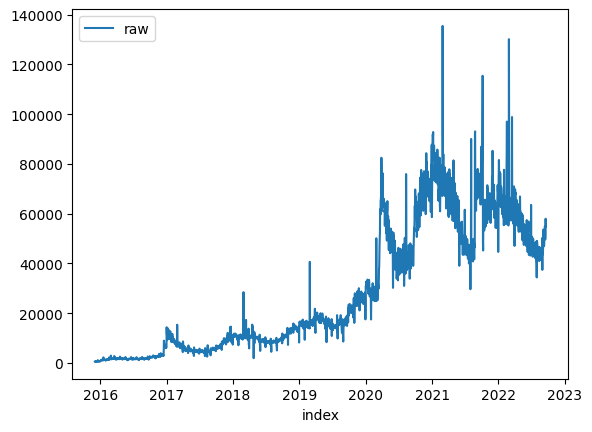

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:15<00:00,  8.70s/trial, best loss: 0.08996623316828795]
Prediction...
54463.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.905295211933046, 'LogTransformedPrediction': 10.95283984812735, 'LogTransformedStdErr': 0.09937043887092364, 'LogTransformedCILower': 10.789390021338752, 'LogTransformedCIUpper': 11.116289674915949, 'AdjustedActual': 54463.0, 'Prediction': 57397.70896685366, 'StdErr': 5717.8442694318765, 'CILower': 47992.69208193495, 'CIUpper': 66802.72585177237, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3922266519165267, 'DownAnomalyProbability': 0.6961133259582634, 'UpAnomalyProbability': 0.30388667404173664, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_dis

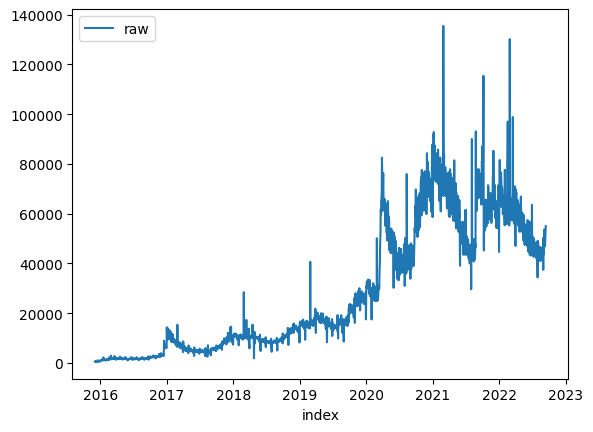

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:57<00:00,  4.74s/trial, best loss: 0.057090507454841496]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 52719.879276081796, 'StdErr': 6391.329498689017, 'CILower': 42207.07776912123, 'CIUpper': 63232.680783042364, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.21193222290822544, 'DownAnomalyProbability': 0.3940338885458873, 'UpAnomalyProbability': 0.6059661114541127, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 51957.94843623147, 'StdErr': 7309.008005844051, 'CILower': 39935.700108401536, 'CIUpper': 63980.1967640614, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': F

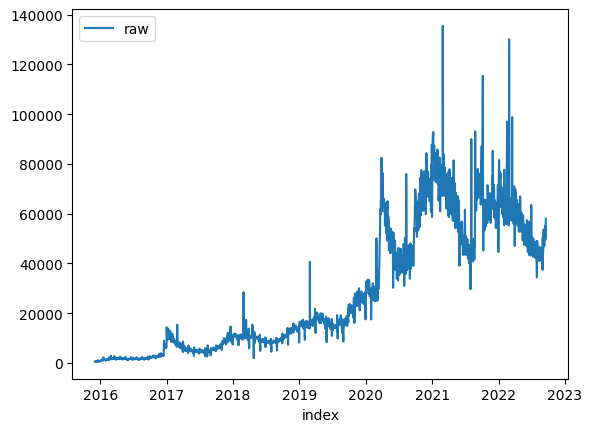

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:40<00:00,  4.40s/trial, best loss: 0.06817792416930081]
Prediction...
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.subscription'),
 'param_days_range': 4,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


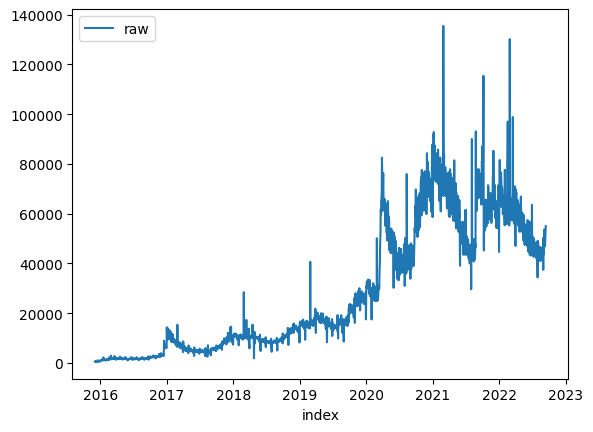

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:55<00:00,  4.71s/trial, best loss: 0.060344065706615845]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 52719.879276081796, 'StdErr': 6391.329498689017, 'CILower': 42207.07776912123, 'CIUpper': 63232.680783042364, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.21193222290822544, 'DownAnomalyProbability': 0.3940338885458873, 'UpAnomalyProbability': 0.6059661114541127, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 51957.94843623147, 'StdErr': 7309.008005844051, 'CILower': 39935.700108401536, 'CIUpper': 63980.1967640614, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': F

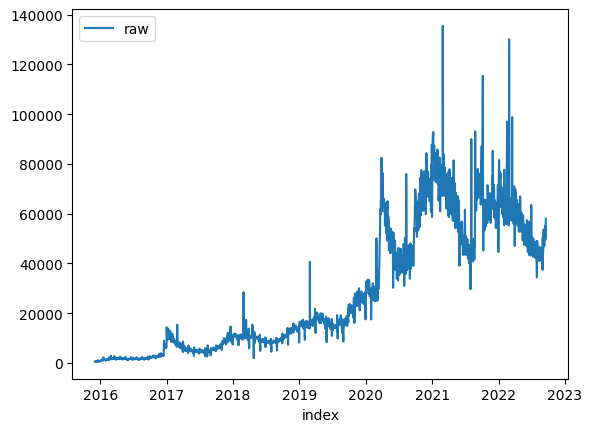

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:01<00:00,  9.62s/trial, best loss: 0.08190049901693267]
Prediction...
54782.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.911135205830144, 'LogTransformedPrediction': 10.961153312779874, 'LogTransformedStdErr': 0.09976088348572576, 'LogTransformedCILower': 10.797061261750494, 'LogTransformedCIUpper': 11.125245363809254, 'AdjustedActual': 54782.0, 'Prediction': 57879.13017060991, 'StdErr': 5788.569233643508, 'CILower': 48357.78107179169, 'CIUpper': 67400.47926942814, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.40737948496568266, 'DownAnomalyProbability': 0.7036897424828413, 'UpAnomalyProbability': 0.29631025751715867, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_di

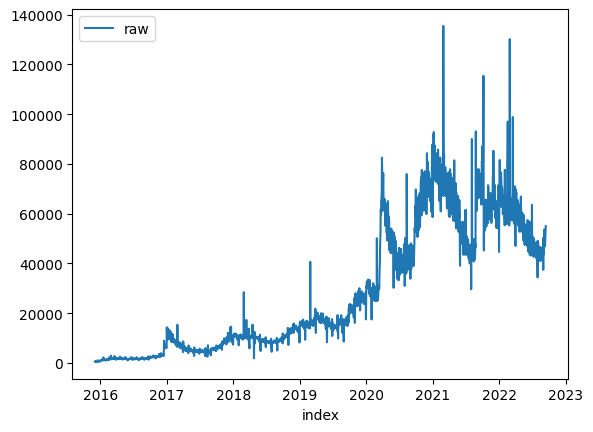

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:00<00:00,  4.81s/trial, best loss: 0.058936002092988424]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 50367.82401494408, 'StdErr': 6548.143825000981, 'CILower': 39597.085894591335, 'CIUpper': 61138.56213529683, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4657799906901703, 'DownAnomalyProbability': 0.26711000465491486, 'UpAnomalyProbability': 0.7328899953450851, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 48151.642244301984, 'StdErr': 7405.023021535132, 'CILower': 35971.46326967077, 'CIUpper': 60331.8212189332, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': Fa

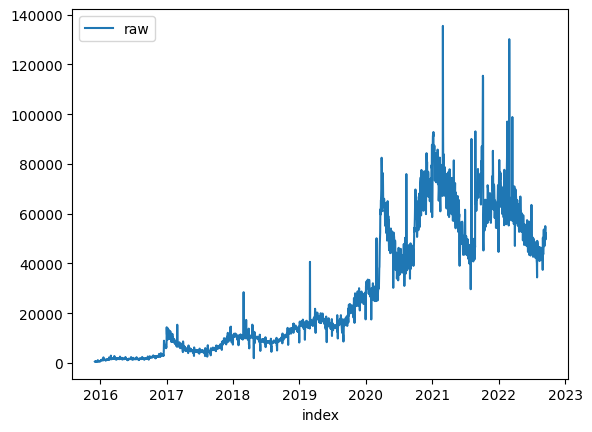

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:09<00:00,  8.59s/trial, best loss: 0.05785482096645567]
Prediction...
57949.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.967335848767897, 'LogTransformedPrediction': 10.88308407427295, 'LogTransformedStdErr': 0.09790675435269258, 'LogTransformedCILower': 10.722041794272878, 'LogTransformedCIUpper': 11.044126354273024, 'AdjustedActual': 57948.99999999996, 'Prediction': 53522.54558969947, 'StdErr': 5252.899813463717, 'CILower': 44882.29427951096, 'CIUpper': 62162.79689988797, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6005862591946773, 'DownAnomalyProbability': 0.19970687040266133, 'UpAnomalyProbability': 0.8002931295973387, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('da

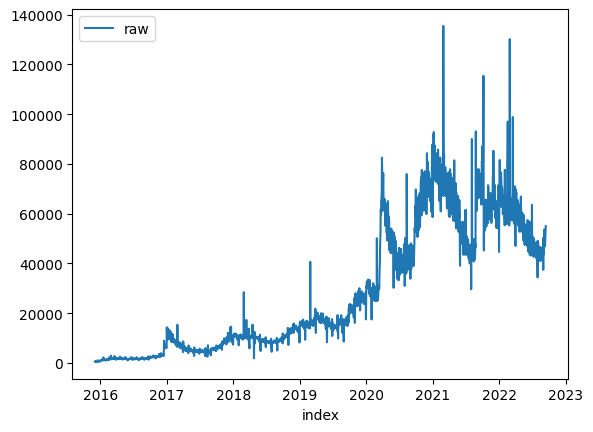

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:32<00:00,  4.25s/trial, best loss: 0.055665933096131805]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 51098.07047808939, 'StdErr': 6551.009778927981, 'CILower': 40322.618283025135, 'CIUpper': 61873.52267315364, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.3898324505265556, 'DownAnomalyProbability': 0.3050837747367222, 'UpAnomalyProbability': 0.6949162252632778, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 49527.214728688385, 'StdErr': 7446.711019292366, 'CILower': 37278.465099745845, 'CIUpper': 61775.964357630924, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': 

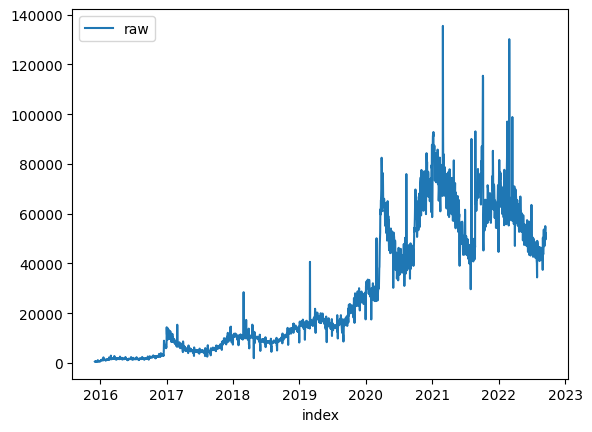

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:07<00:00,  3.75s/trial, best loss: 0.060843009038073534]
Prediction...
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.subscription'),
 'param_days_range': 5,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


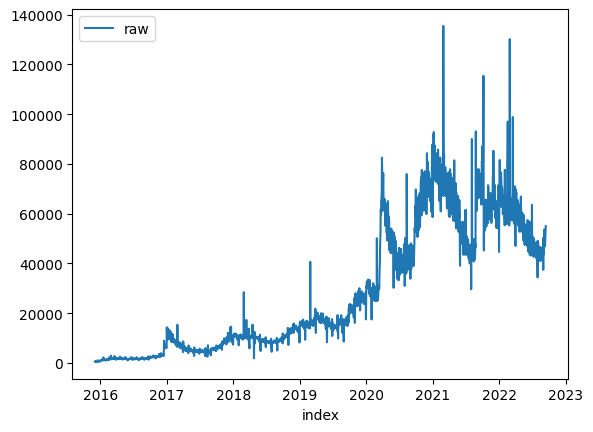

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:01<00:00,  4.83s/trial, best loss: 0.05948756163357704]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 48828.917817397385, 'StdErr': 6541.348081495494, 'CILower': 38069.357700397464, 'CIUpper': 59588.477934397306, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.608820930340543, 'DownAnomalyProbability': 0.19558953482972852, 'UpAnomalyProbability': 0.8044104651702715, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 46813.10108823452, 'StdErr': 7469.747849837904, 'CILower': 34526.459245015685, 'CIUpper': 59099.74293145336, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': 

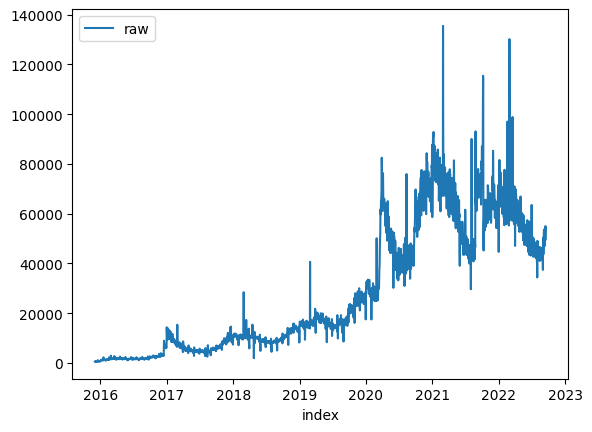

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:12<00:00,  8.65s/trial, best loss: 0.055397211206390504]
Prediction...
52212.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.863086785010477, 'LogTransformedPrediction': 10.840954388053863, 'LogTransformedStdErr': 0.10928569575173842, 'LogTransformedCILower': 10.6611954150227, 'LogTransformedCIUpper': 11.020713361085026, 'AdjustedActual': 52212.00000000003, 'Prediction': 51374.98219167061, 'StdErr': 5631.466227883954, 'CILower': 42112.04454168097, 'CIUpper': 60637.91984166026, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.11815621989527525, 'DownAnomalyProbability': 0.4409218900523624, 'UpAnomalyProbability': 0.5590781099476376, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('dat

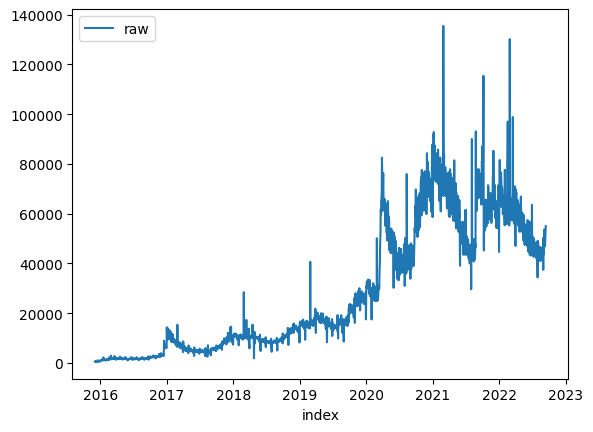

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:41<00:00,  4.44s/trial, best loss: 0.0663995749066357]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 52719.879276081796, 'StdErr': 6391.329498689017, 'CILower': 42207.07776912123, 'CIUpper': 63232.680783042364, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.21193222290822544, 'DownAnomalyProbability': 0.3940338885458873, 'UpAnomalyProbability': 0.6059661114541127, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 51957.94843623147, 'StdErr': 7309.008005844051, 'CILower': 39935.700108401536, 'CIUpper': 63980.1967640614, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': F

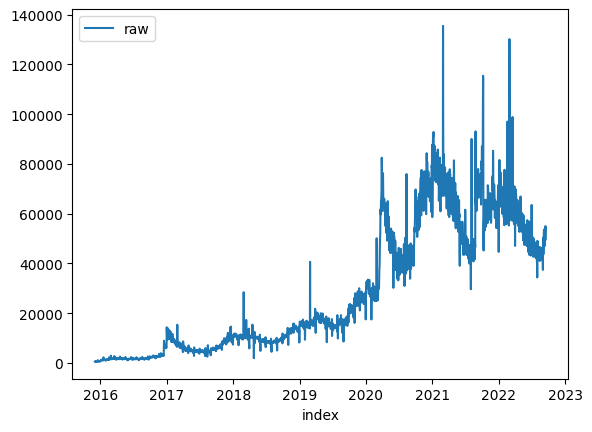

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [06:54<00:00,  8.29s/trial, best loss: 0.06935402483711264]
Prediction...
52212.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.863086785010477, 'LogTransformedPrediction': 10.85060515089143, 'LogTransformedStdErr': 0.11126251135997546, 'LogTransformedCILower': 10.667594605537246, 'LogTransformedCIUpper': 11.033615696245615, 'AdjustedActual': 52212.00000000003, 'Prediction': 51884.50920547483, 'StdErr': 5790.82444016841, 'CILower': 42359.4506220246, 'CIUpper': 61409.567788925066, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.04509904124088604, 'DownAnomalyProbability': 0.477450479379557, 'UpAnomalyProbability': 0.522549520620443, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/

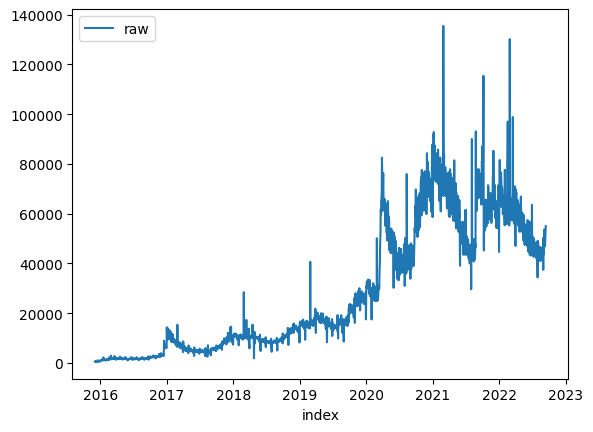

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:40<00:00,  4.41s/trial, best loss: 0.05686402109648343]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 50713.577291618625, 'StdErr': 6491.967085338267, 'CILower': 40035.241685250396, 'CIUpper': 61391.912897986855, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4338272108137766, 'DownAnomalyProbability': 0.2830863945931117, 'UpAnomalyProbability': 0.7169136054068883, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 48053.57099458448, 'StdErr': 7304.740396931485, 'CILower': 36038.34225875279, 'CIUpper': 60068.79973041617, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': F

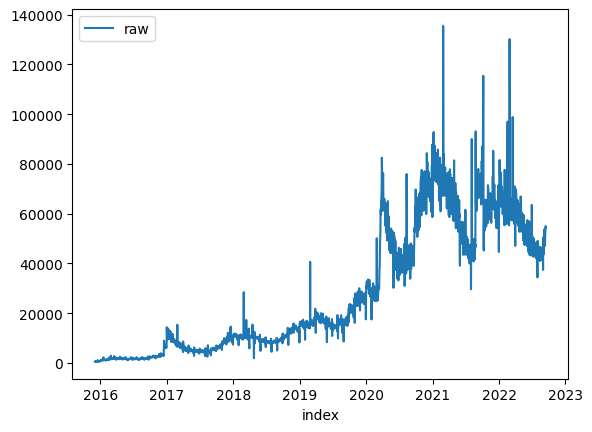

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:38<00:00,  5.57s/trial, best loss: 1e+100]
Prediction...
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.81247165589451, 'LogTransformedPrediction': 10.832214024537292, 'LogTransformedStdErr': 0.09974473813219399, 'LogTransformedCILower': 10.668148530251228, 'LogTransformedCIUpper': 10.996279518823355, 'AdjustedActual': 49635.00000000002, 'Prediction': 50877.134412959866, 'StdErr': 5087.474772973332, 'CILower': 42508.98308061056, 'CIUpper': 59245.28574530917, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.19288952864380438, 'DownAnomalyProbability': 0.5964447643219022, 'UpAnomalyProbability': 0.4035552356780978, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('d

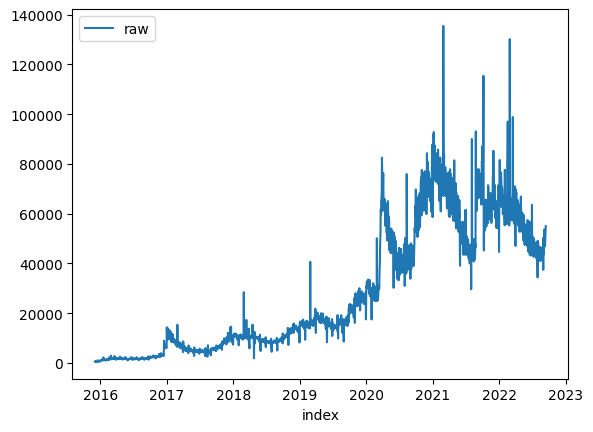

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:28<00:00,  4.18s/trial, best loss: 0.05673337373734805]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 51083.4313808703, 'StdErr': 6491.752243183068, 'CILower': 40405.449158400275, 'CIUpper': 61761.41360334033, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.39466454245780414, 'DownAnomalyProbability': 0.30266772877109793, 'UpAnomalyProbability': 0.6973322712289021, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 49000.41962269973, 'StdErr': 7291.805503606029, 'CILower': 37006.466893068646, 'CIUpper': 60994.372352330814, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': 

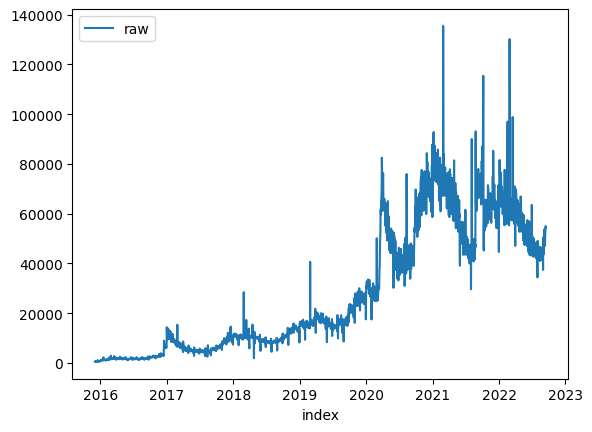

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [03:42<00:00,  4.45s/trial, best loss: 1e+100]
Prediction...
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 53372.25358603843, 'StdErr': 6418.308230426063, 'CILower': 42815.076014329636, 'CIUpper': 63929.431157747225, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.43962201747689233, 'DownAnomalyProbability': 0.7198110087384462, 'UpAnomalyProbability': 0.2801889912615539, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.subscription'),
 'param_days_range': 7,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


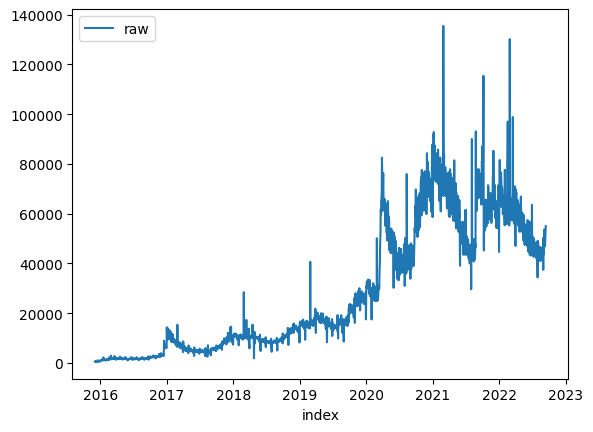

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [04:12<00:00,  5.05s/trial, best loss: 0.06364209415193826]
Prediction...
54438.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 54438.0, 'Prediction': 49927.74535770429, 'StdErr': 6582.404240570417, 'CILower': 39100.65386854129, 'CIUpper': 60754.83684686729, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5067814380572018, 'DownAnomalyProbability': 0.24660928097139911, 'UpAnomalyProbability': 0.7533907190286009, 'ModelFreshness': 0.1}
49635.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 49635.0, 'Prediction': 48309.38958679326, 'StdErr': 7470.653293341151, 'CILower': 36021.2584215441, 'CIUpper': 60597.520752042416, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': Fal

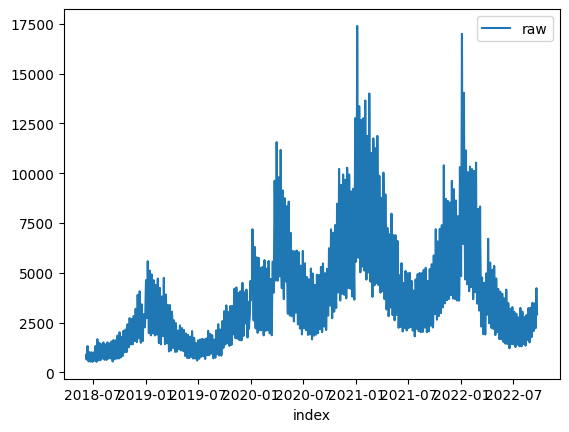

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:14<00:00, 11.08s/trial, best loss: 0.2795409984546502]
Prediction...
2327.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2327.0, 'Prediction': 2796.413509616192, 'StdErr': 517.4442454969306, 'CILower': 1945.293465665398, 'CIUpper': 3647.5335535669865, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6356867867137357, 'DownAnomalyProbability': 0.8178433933568678, 'UpAnomalyProbability': 0.1821566066431321, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 1,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


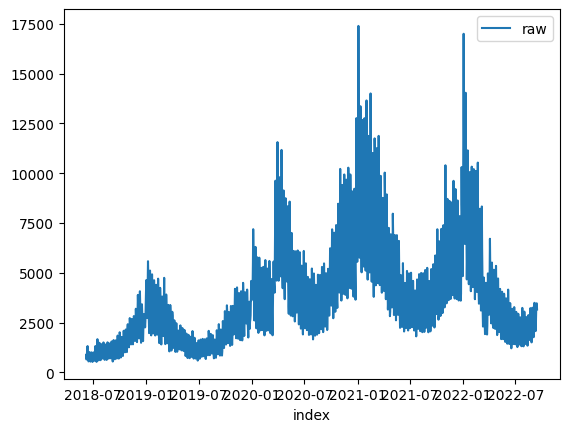

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:59<00:00, 10.79s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2822.0, 'Prediction': 2827.0052436807828, 'StdErr': 598.6665758450628, 'CILower': 1842.2863550674126, 'CIUpper': 3811.7241322941527, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.0066707584684133625, 'DownAnomalyProbability': 0.5033353792342067, 'UpAnomalyProbability': 0.4966646207657933, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2217.0, 'Prediction': 2302.205190635484, 'StdErr': 615.6729965920673, 'CILower': 1289.5132291749408, 'CIUpper': 3314.8971520960276, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': 

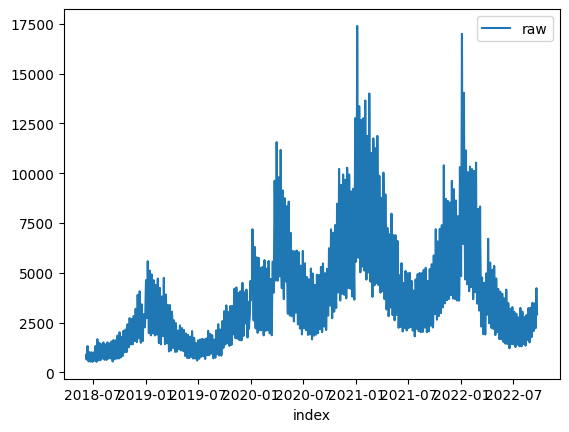

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:38<00:00, 10.37s/trial, best loss: 0.24195702376320313]
Prediction...
2327.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2327.0, 'Prediction': 2561.788393091033, 'StdErr': 540.4447276004913, 'CILower': 1672.8359227305646, 'CIUpper': 3450.7408634515014, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.33602780033932556, 'DownAnomalyProbability': 0.6680139001696628, 'UpAnomalyProbability': 0.3319860998303372, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 1,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


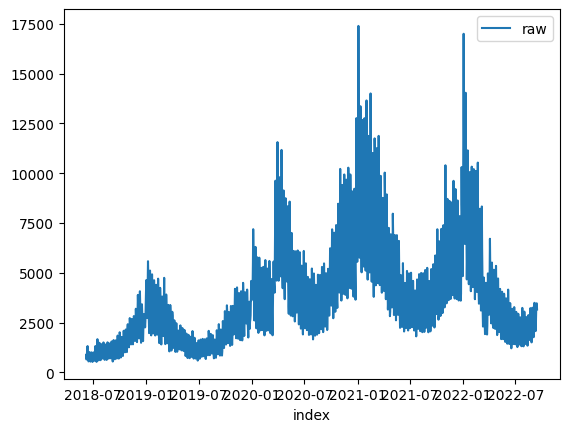

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [06:25<00:00,  7.70s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': -28.0, 'ConfLevel': 90.0, 'Prediction': 3095.723093186546, 'PredStdErr': 1230.8994176267206, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.04755848536281704, 'DownAnomalyProbability': 0.4762207573185915, 'UpAnomalyProbability': 0.5237792426814085, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -633.0, 'ConfLevel': 90.0, 'Prediction': 2744.2414277820585, 'PredStdErr': 1230.8994176267206, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.29714936197829034, 'DownAnomalyProbability': 0.6485746809891452, 'UpAnomalyProbability': 0.35142531901085483, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
2761.0 2022-09-17
caso1
{'Success': Tr

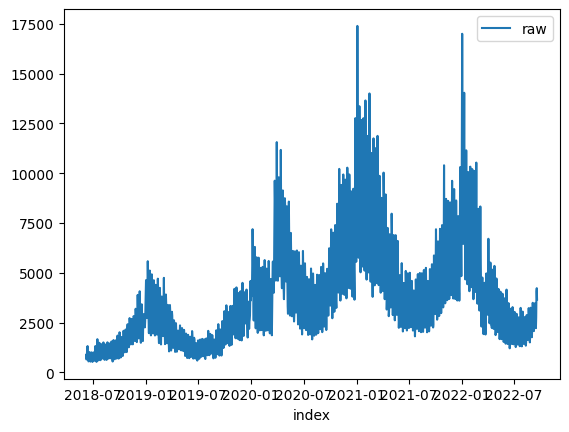

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:39<00:00, 11.59s/trial, best loss: 0.27774842644939896]
Prediction...
2904.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2904.0, 'Prediction': 2973.107167302368, 'StdErr': 552.8283382896375, 'CILower': 2063.7854699851023, 'CIUpper': 3882.4288646196337, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.09948164084644318, 'DownAnomalyProbability': 0.5497408204232216, 'UpAnomalyProbability': 0.4502591795767784, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 2,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


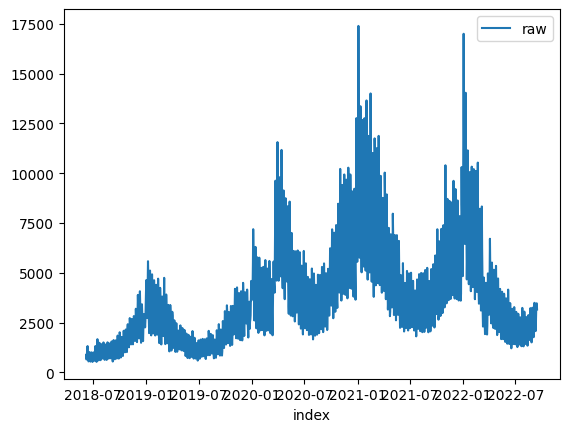

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:16<00:00,  9.94s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2822.0, 'Prediction': 2665.914065687466, 'StdErr': 554.4617277629299, 'CILower': 1753.905681770831, 'CIUpper': 3577.922449604101, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2216799293678493, 'DownAnomalyProbability': 0.38916003531607535, 'UpAnomalyProbability': 0.6108399646839247, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2217.0, 'Prediction': 2117.5675417841608, 'StdErr': 555.4580053486653, 'CILower': 1203.9204270671785, 'CIUpper': 3031.214656501143, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.14207003820840614, 'DownAno

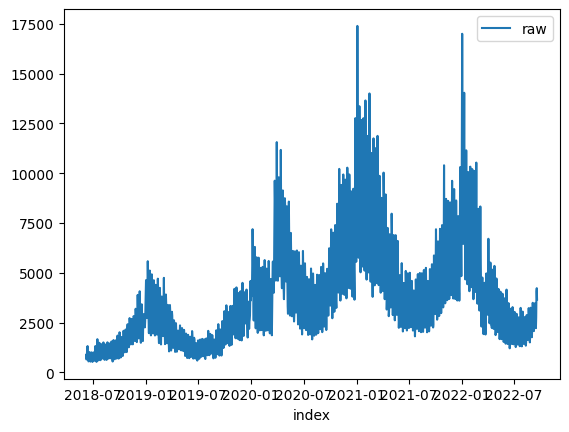

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:20<00:00, 11.22s/trial, best loss: 0.2664726835576817]
Prediction...
2904.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2904.0, 'Prediction': 2827.5298792969134, 'StdErr': 628.4076650718125, 'CILower': 1793.8912521994366, 'CIUpper': 3861.16850639439, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.09685444836101298, 'DownAnomalyProbability': 0.4515727758194935, 'UpAnomalyProbability': 0.5484272241805065, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 2,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


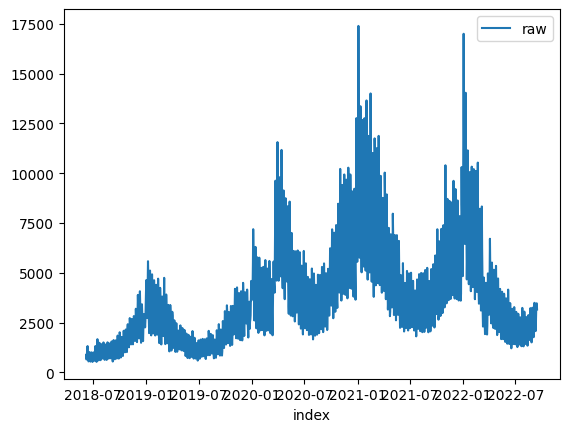

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:44<00:00, 11.69s/trial, best loss: 1e+100]
Prediction...
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': False}
Loading...


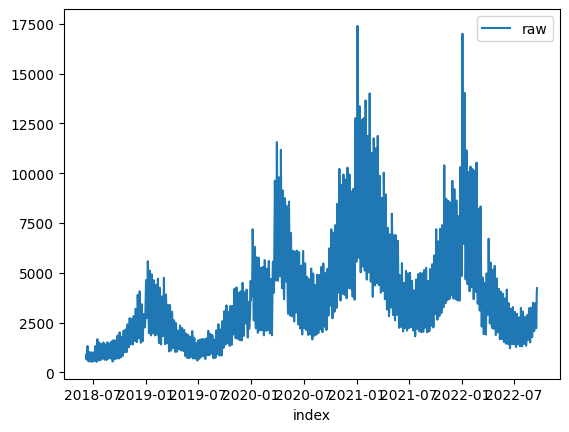

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:23<00:00, 11.27s/trial, best loss: 0.2582530781284367]
Prediction...
3659.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 3659.0, 'Prediction': 3592.175897966956, 'StdErr': 465.155566160587, 'CILower': 2827.0630778710492, 'CIUpper': 4357.288718062863, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.11423079226868804, 'DownAnomalyProbability': 0.442884603865656, 'UpAnomalyProbability': 0.557115396134344, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 3,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


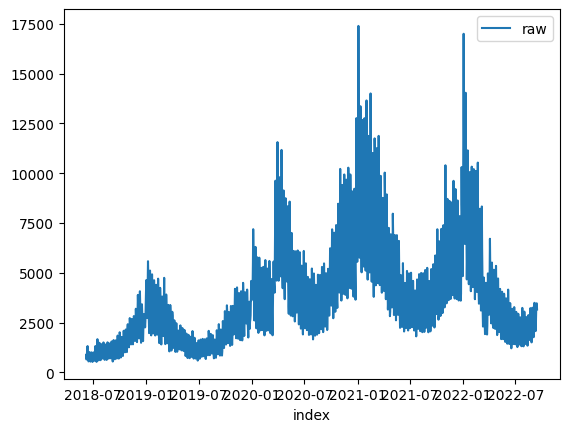

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:46<00:00,  9.33s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2822.0, 'Prediction': 2711.3231835961265, 'StdErr': 504.6295865938983, 'CILower': 1881.2813778201307, 'CIUpper': 3541.364989372122, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1736014632114833, 'DownAnomalyProbability': 0.41319926839425836, 'UpAnomalyProbability': 0.5868007316057416, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2217.0, 'Prediction': 2098.4675688516727, 'StdErr': 505.79694695490195, 'CILower': 1266.5056261519208, 'CIUpper': 2930.4295115514246, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1852850652380642, 'Down

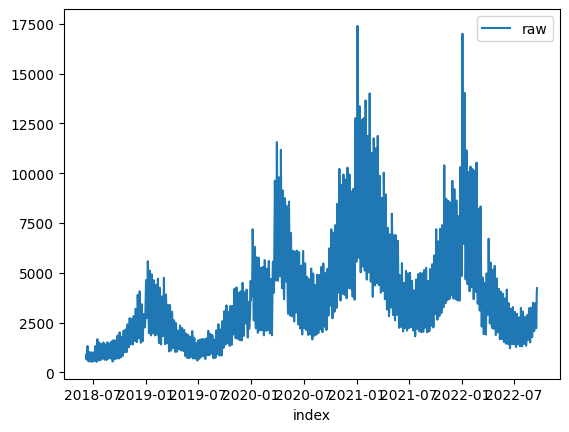

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:32<00:00, 11.46s/trial, best loss: 0.26749970711585436]
Prediction...
3659.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 3659.0, 'Prediction': 3495.8752522608443, 'StdErr': 541.0439644347023, 'CILower': 2605.937125020221, 'CIUpper': 4385.813379501467, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.23696673937489288, 'DownAnomalyProbability': 0.38151663031255356, 'UpAnomalyProbability': 0.6184833696874464, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 3,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


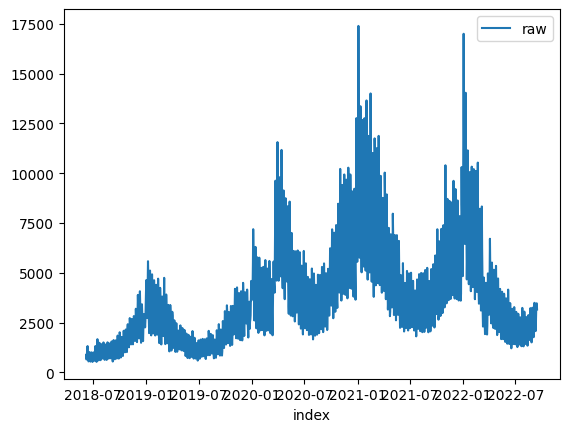

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:25<00:00, 10.11s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.945555428253489, 'LogTransformedPrediction': 7.808419845823203, 'LogTransformedStdErr': 0.08669773325109624, 'LogTransformedCILower': 7.665814764836666, 'LogTransformedCIUpper': 7.95102492680974, 'AdjustedActual': 2822.0, 'Prediction': 2469.5055734860016, 'StdErr': 214.5903486031495, 'CILower': 2116.5358602773304, 'CIUpper': 2822.475286694673, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8995423060061021, 'DownAnomalyProbability': 0.05022884699694896, 'UpAnomalyProbability': 0.949771153003051, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.704361167910313, 'LogTrans

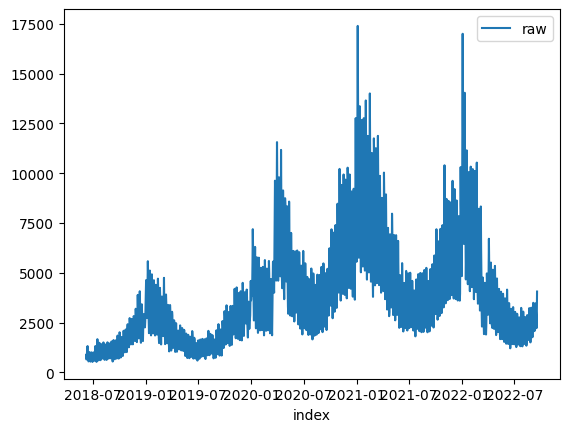

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:59<00:00, 10.80s/trial, best loss: 0.27362243790116453]
Prediction...
4226.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 4226.0, 'Prediction': 4435.9579141782715, 'StdErr': 614.4978344709758, 'CILower': 3425.1989223948613, 'CIUpper': 5446.716905961682, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2674037360451469, 'DownAnomalyProbability': 0.6337018680225734, 'UpAnomalyProbability': 0.36629813197742656, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 4,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


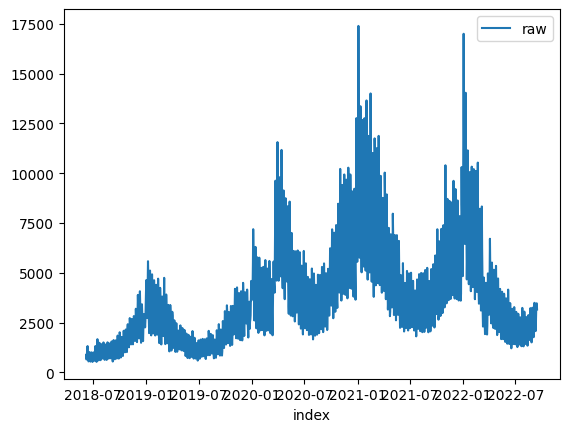

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [06:45<00:00,  8.11s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': -28.0, 'ConfLevel': 90.0, 'Prediction': 3095.723093186546, 'PredStdErr': 1230.8994176267206, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.04755848536281704, 'DownAnomalyProbability': 0.4762207573185915, 'UpAnomalyProbability': 0.5237792426814085, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -633.0, 'ConfLevel': 90.0, 'Prediction': 2744.2414277820585, 'PredStdErr': 1230.8994176267206, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.29714936197829034, 'DownAnomalyProbability': 0.6485746809891452, 'UpAnomalyProbability': 0.35142531901085483, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
2761.0 2022-09-17
caso1
{'Success': Tr

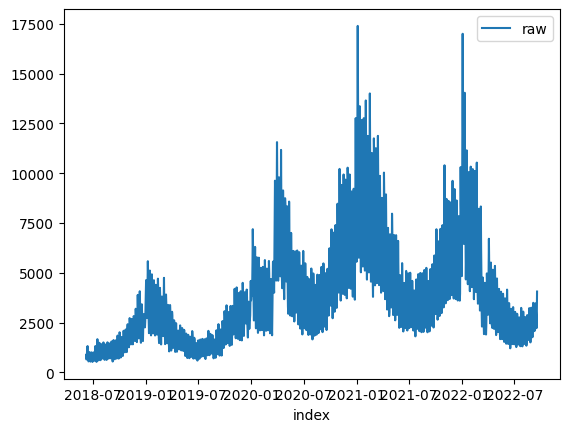

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:48<00:00, 10.56s/trial, best loss: 0.2794076450808512]
Prediction...
4226.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 4226.0, 'Prediction': 4022.5020791100524, 'StdErr': 532.4910721227892, 'CILower': 3146.6322078096046, 'CIUpper': 4898.3719504105, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2976588883223479, 'DownAnomalyProbability': 0.35117055583882606, 'UpAnomalyProbability': 0.6488294441611739, 'ModelFreshness': 0.2}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 4,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


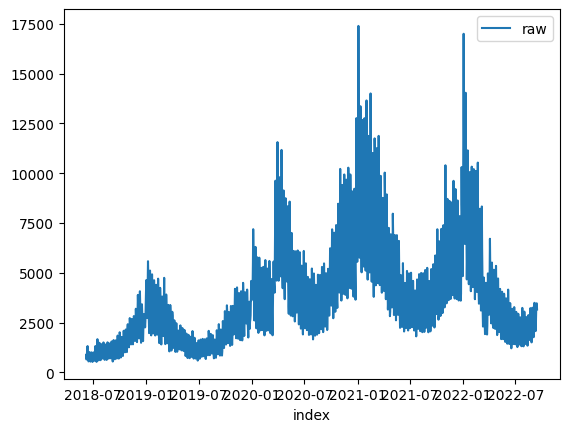

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:07<00:00, 10.95s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.945555428253489, 'LogTransformedPrediction': 7.8398415019899925, 'LogTransformedStdErr': 0.08315428367261238, 'LogTransformedCILower': 7.703064876894545, 'LogTransformedCIUpper': 7.97661812708544, 'AdjustedActual': 2822.0, 'Prediction': 2547.5983476370484, 'StdErr': 212.2937474912121, 'CILower': 2198.406207097008, 'CIUpper': 2896.7904881770887, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8038354894716908, 'DownAnomalyProbability': 0.0980822552641546, 'UpAnomalyProbability': 0.9019177447358454, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 7.704361167910313, 'LogTran

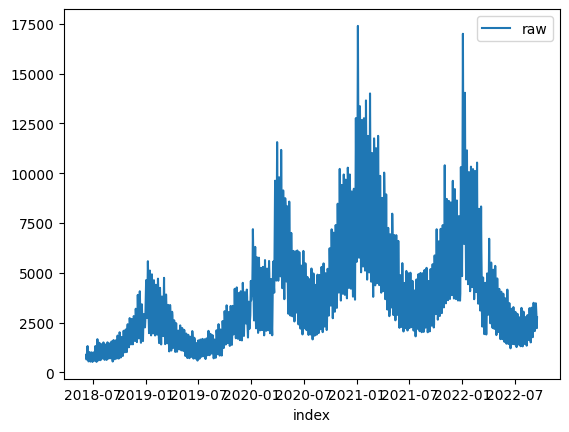

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:04<00:00, 10.89s/trial, best loss: 0.2354911059485848]
Prediction...
4057.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 4057.0, 'Prediction': 3727.640539000686, 'StdErr': 600.6254621889777, 'CILower': 2739.699569079742, 'CIUpper': 4715.58150892163, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4165558151718798, 'DownAnomalyProbability': 0.2917220924140601, 'UpAnomalyProbability': 0.7082779075859399, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 5,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


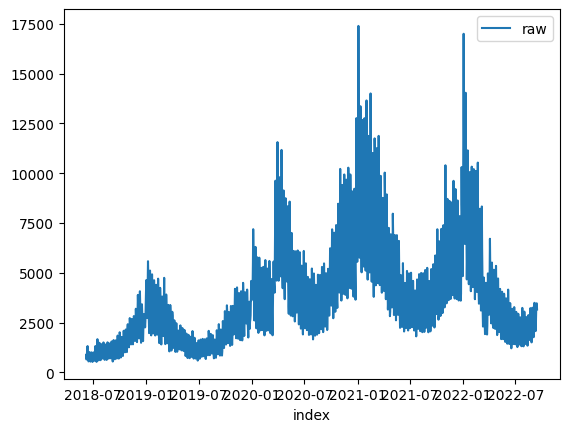

Training...

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [06:15<00:00,  7.50s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': -28.0, 'ConfLevel': 90.0, 'Prediction': 3095.723093186546, 'PredStdErr': 1230.8994176267206, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.04755848536281704, 'DownAnomalyProbability': 0.4762207573185915, 'UpAnomalyProbability': 0.5237792426814085, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -633.0, 'ConfLevel': 90.0, 'Prediction': 2744.2414277820585, 'PredStdErr': 1230.8994176267206, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.29714936197829034, 'DownAnomalyProbability': 0.6485746809891452, 'UpAnomalyProbability': 0.35142531901085483, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
2761.0 2022-09-17
caso1
{'Success': Tr

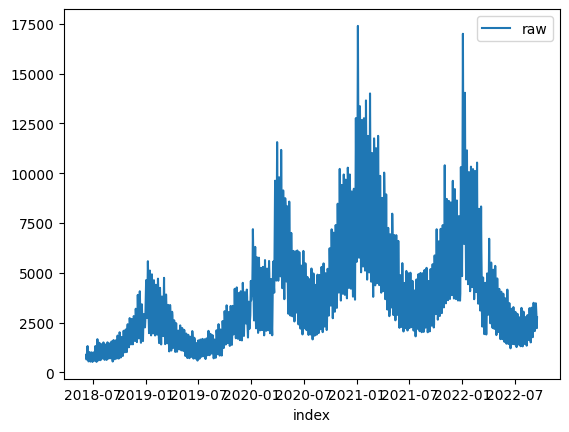

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:56<00:00, 10.73s/trial, best loss: 0.23320651729571157]
Prediction...
4057.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 4057.0, 'Prediction': 3723.771840096042, 'StdErr': 620.5068784011951, 'CILower': 2703.1288506095, 'CIUpper': 4744.4148295825835, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.40875015947099347, 'DownAnomalyProbability': 0.29562492026450327, 'UpAnomalyProbability': 0.7043750797354967, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 5,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


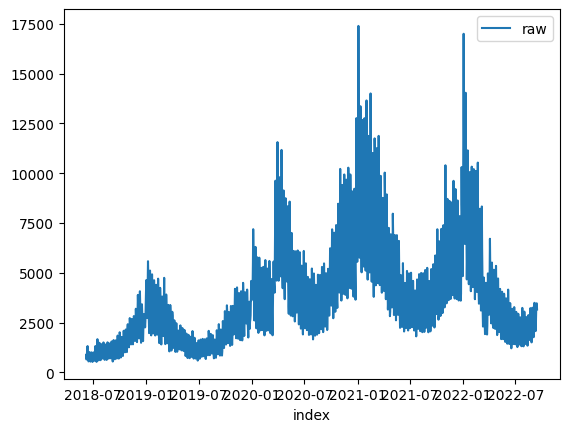

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [06:43<00:00,  8.06s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': -28.0, 'ConfLevel': 90.0, 'Prediction': 3095.723093186546, 'PredStdErr': 1230.8994176267206, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.04755848536281704, 'DownAnomalyProbability': 0.4762207573185915, 'UpAnomalyProbability': 0.5237792426814085, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -633.0, 'ConfLevel': 90.0, 'Prediction': 2744.2414277820585, 'PredStdErr': 1230.8994176267206, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.29714936197829034, 'DownAnomalyProbability': 0.6485746809891452, 'UpAnomalyProbability': 0.35142531901085483, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
2761.0 2022-09-17
caso1
{'Success': 

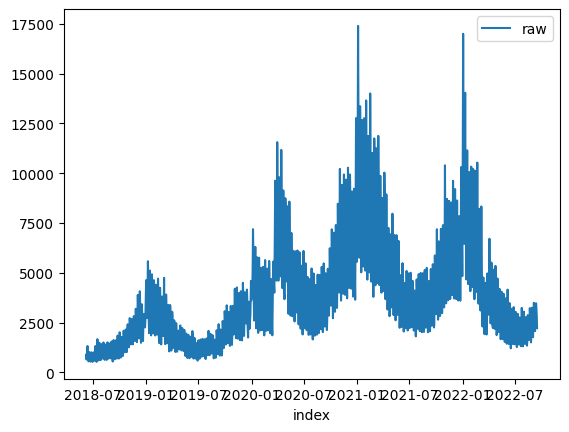

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:56<00:00, 10.72s/trial, best loss: 0.2631551101830195]
Prediction...
2761.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2761.0, 'Prediction': 2485.8974167640363, 'StdErr': 538.055128955143, 'CILower': 1600.8754864023272, 'CIUpper': 3370.9193471257454, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.39085248349013346, 'DownAnomalyProbability': 0.30457375825493327, 'UpAnomalyProbability': 0.6954262417450667, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 6,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


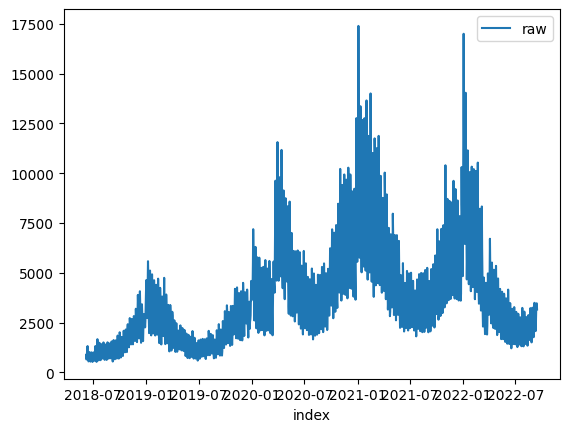

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [06:03<00:00,  7.28s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso1
{'Success': True, 'AdjustedActual': -0.019233850615089088, 'ConfLevel': 90.0, 'Prediction': 3174.022354669322, 'PredStdErr': 853.1414489733197, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1656236128987678, 'DownAnomalyProbability': 0.4171881935506161, 'UpAnomalyProbability': 0.5828118064493839, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso1
{'Success': True, 'AdjustedActual': -0.22942284118464984, 'ConfLevel': 90.0, 'Prediction': 2659.387350349294, 'PredStdErr': 714.8569255171985, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7232210101767658, 'DownAnomalyProbability': 0.8616105050883829, 'UpAnomalyProbability': 0.13838949491161706, 'NonStationarityDiffOrder': 1, 'ModelFreshness': 0.2}
2761.0 2022

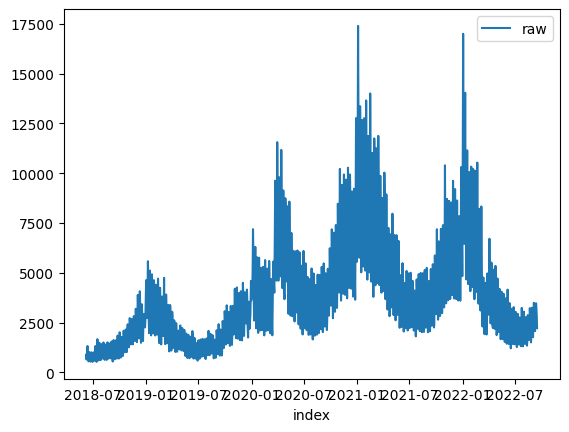

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:56<00:00, 10.73s/trial, best loss: 0.2540069557641227]
Prediction...
2761.0 2022-09-17
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2761.0, 'Prediction': 2243.9211638802267, 'StdErr': 569.7057264573133, 'CILower': 1306.8386334218917, 'CIUpper': 3181.0036943385617, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6359233182765665, 'DownAnomalyProbability': 0.18203834086171677, 'UpAnomalyProbability': 0.8179616591382832, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 6,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


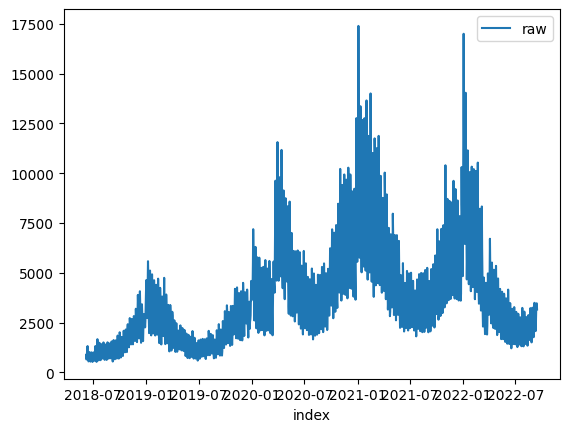

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:25<00:00, 10.11s/trial, best loss: 1e+100]
Prediction...
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 7,
 'param_is_log': False,
 'param_weekly_model': False}
Loading...


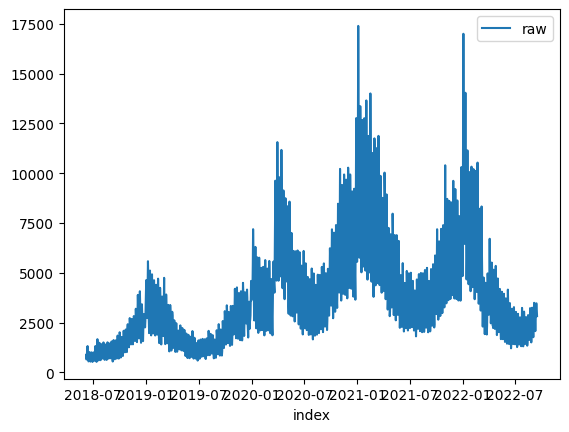

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:38<00:00, 10.37s/trial, best loss: 0.5099596529100136]
Prediction...
2217.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2217.0, 'Prediction': 2691.454464706236, 'StdErr': 625.4500201769085, 'CILower': 1662.6807305413768, 'CIUpper': 3720.2281988710956, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.5518967225446976, 'DownAnomalyProbability': 0.7759483612723488, 'UpAnomalyProbability': 0.22405163872765116, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 7,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


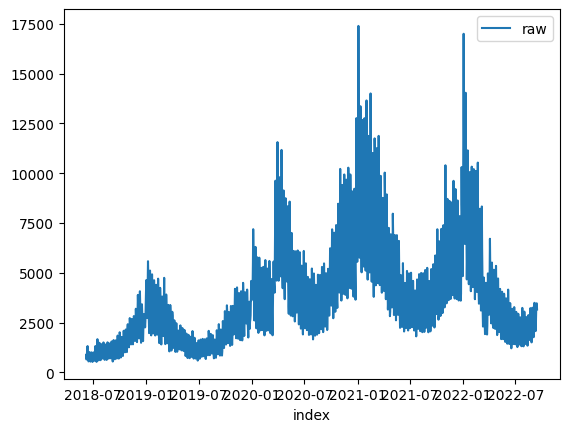

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:17<00:00,  8.75s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2822.0, 'Prediction': 2701.2759776769503, 'StdErr': 569.0136416778963, 'CILower': 1765.3318253781972, 'CIUpper': 3637.2201299757035, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.1680206511018283, 'DownAnomalyProbability': 0.41598967444908586, 'UpAnomalyProbability': 0.5840103255509141, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2217.0, 'Prediction': 2149.5801855970644, 'StdErr': 584.233146805422, 'CILower': 1188.602175088894, 'CIUpper': 3110.558196105235, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.09187098395899573, 'Down

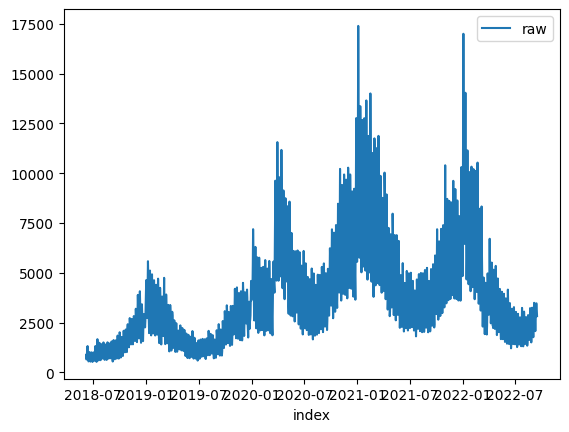

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [08:47<00:00, 10.56s/trial, best loss: 0.3614740867699817]
Prediction...
2217.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2217.0, 'Prediction': 2172.94029982508, 'StdErr': 512.7562103311113, 'CILower': 1329.5313875200595, 'CIUpper': 3016.3492121301, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.06847570284392246, 'DownAnomalyProbability': 0.46576214857803877, 'UpAnomalyProbability': 0.5342378514219612, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.training_plans'),
 'param_days_range': 7,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


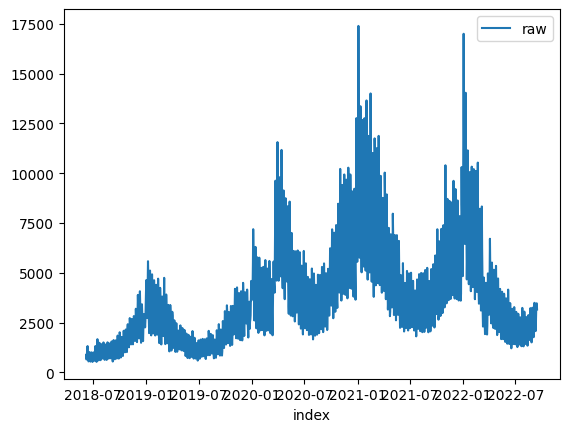

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [09:00<00:00, 10.82s/trial, best loss: 1e+100]
Prediction...
2822.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2822.0, 'Prediction': 2788.6317236558198, 'StdErr': 533.8224191584702, 'CILower': 1910.5719813550008, 'CIUpper': 3666.6914659566387, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.04984186466661411, 'DownAnomalyProbability': 0.47507906766669294, 'UpAnomalyProbability': 0.524920932333307, 'ModelFreshness': 0.1}
2217.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 2217.0, 'Prediction': 2189.505631588129, 'StdErr': 544.9074361813565, 'CILower': 1293.2126588323968, 'CIUpper': 3085.798604343861, 'ConfLevel': 90.0, 'ExogenousHolidays': 1, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.040241747078895385, 'Do

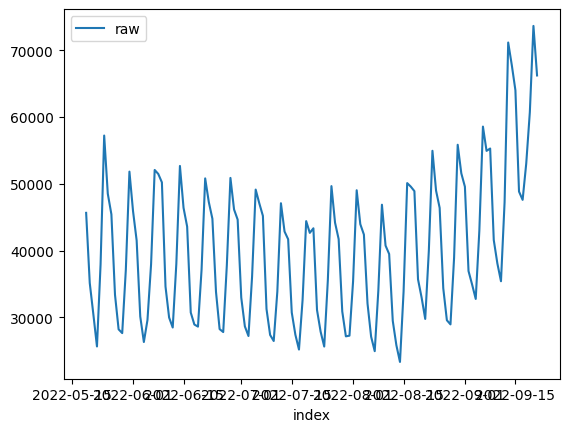

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:53<00:00,  1.08s/trial, best loss: 0.2645190863880193]
Prediction...
59016.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.98558081697799, 'LogTransformedPrediction': 11.211073094208077, 'LogTransformedStdErr': 0.10798275654388972, 'LogTransformedCILower': 11.033457265458642, 'LogTransformedCIUpper': 11.388688922957511, 'AdjustedActual': 59016.00000000005, 'Prediction': 74376.0891647482, 'StdErr': 8054.91229508686, 'CILower': 61126.93746139858, 'CIUpper': 87625.24086809784, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.943469306370327, 'DownAnomalyProbability': 0.9717346531851635, 'UpAnomalyProbability': 0.028265346814836476, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_range'

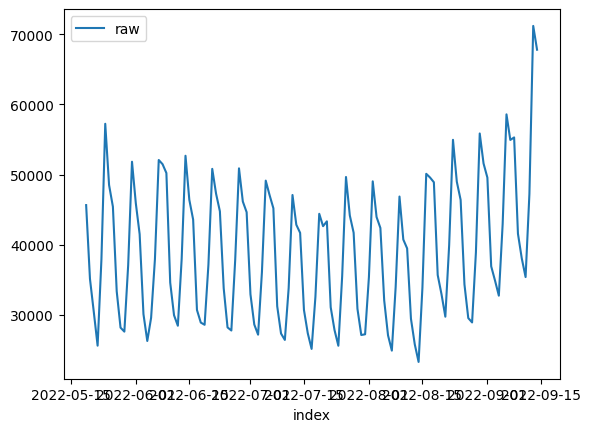

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:52<00:00,  1.04s/trial, best loss: 0.18507537051771897]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.965214295754995, 'LogTransformedStdErr': 0.09716211864452452, 'LogTransformedCILower': 10.805396832500259, 'LogTransformedCIUpper': 11.125031759009731, 'AdjustedActual': 64019.00000000005, 'Prediction': 58099.78967527776, 'StdErr': 5658.545396547015, 'CILower': 48792.31075649784, 'CIUpper': 67407.26859405768, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7044693059691309, 'DownAnomalyProbability': 0.14776534701543453, 'UpAnomalyProbability': 0.8522346529845655, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.796202

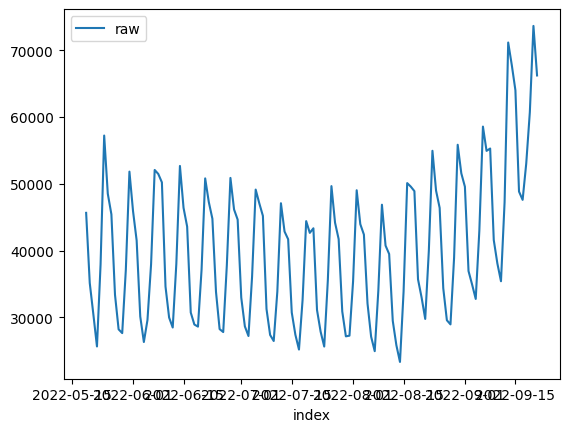

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:54<00:00,  1.09s/trial, best loss: 0.31147648999355737]
Prediction...
59016.0 2022-09-22
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.98558081697799, 'LogTransformedPrediction': 11.203442916735167, 'LogTransformedStdErr': 0.10239059001636328, 'LogTransformedCILower': 11.03502538338105, 'LogTransformedCIUpper': 11.371860450089283, 'AdjustedActual': 59016.00000000005, 'Prediction': 73767.33350426926, 'StdErr': 7573.02307609293, 'CILower': 61310.81903057061, 'CIUpper': 86223.84797796792, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9485705709278023, 'DownAnomalyProbability': 0.9742852854639011, 'UpAnomalyProbability': 0.02571471453609888, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_range'

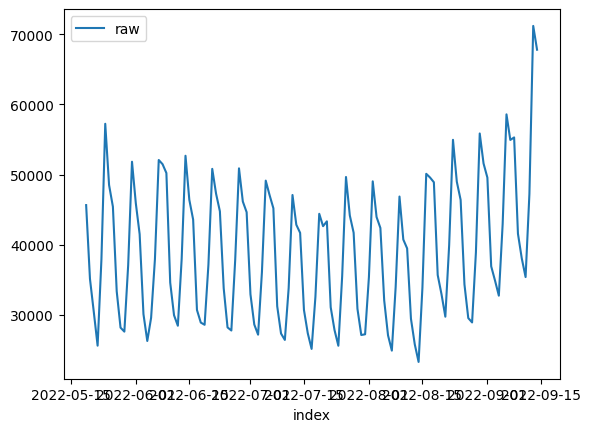

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:51<00:00,  1.02s/trial, best loss: 0.18305171001840306]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.92528931308402, 'LogTransformedStdErr': 0.10151681936354132, 'LogTransformedCILower': 10.758309004557322, 'LogTransformedCIUpper': 11.092269621610718, 'AdjustedActual': 64019.00000000005, 'Prediction': 55849.968497300266, 'StdErr': 5684.451888869774, 'CILower': 46499.877190661675, 'CIUpper': 65200.05980393886, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8493057053562143, 'DownAnomalyProbability': 0.07534714732189285, 'UpAnomalyProbability': 0.9246528526781072, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.79620

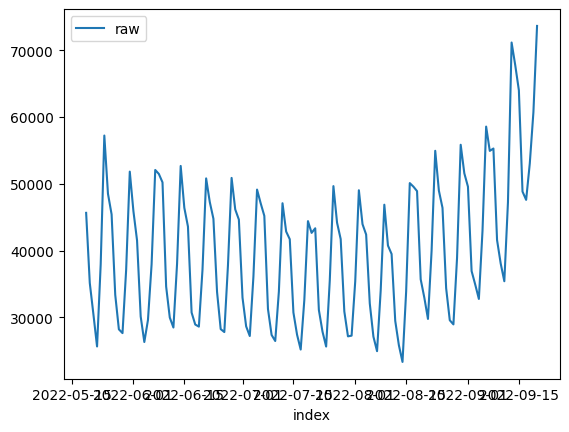

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:54<00:00,  1.08s/trial, best loss: 0.3262540925457742]
Prediction...
66234.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.100964303118362, 'LogTransformedPrediction': 11.370331677921827, 'LogTransformedStdErr': 0.10034778395306444, 'LogTransformedCILower': 11.205274261530086, 'LogTransformedCIUpper': 11.535389094313569, 'AdjustedActual': 66233.99999999999, 'Prediction': 87147.29761508934, 'StdErr': 8767.199977065786, 'CILower': 72726.53693460382, 'CIUpper': 101568.05829557485, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9829395394421816, 'DownAnomalyProbability': 0.9914697697210908, 'UpAnomalyProbability': 0.0085302302789092, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_ran

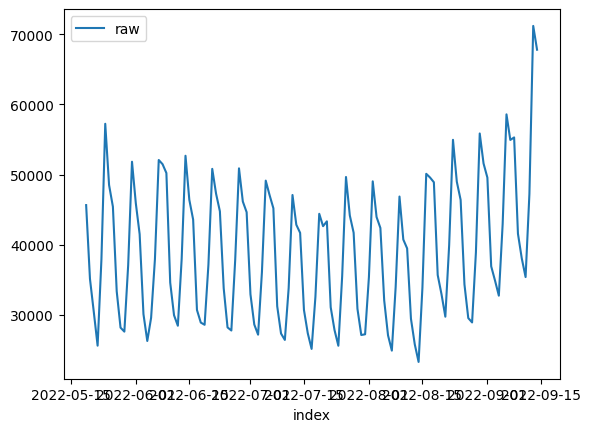

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:52<00:00,  1.05s/trial, best loss: 0.1944758887076768]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.965214295754995, 'LogTransformedStdErr': 0.09716211864452452, 'LogTransformedCILower': 10.805396832500259, 'LogTransformedCIUpper': 11.125031759009731, 'AdjustedActual': 64019.00000000005, 'Prediction': 58099.78967527776, 'StdErr': 5658.545396547015, 'CILower': 48792.31075649784, 'CIUpper': 67407.26859405768, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7044693059691309, 'DownAnomalyProbability': 0.14776534701543453, 'UpAnomalyProbability': 0.8522346529845655, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.796202

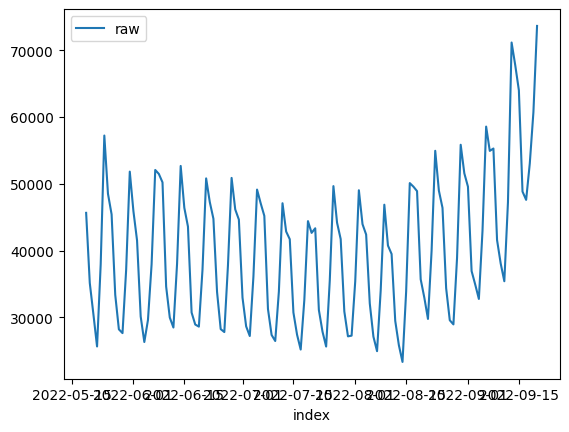

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:54<00:00,  1.08s/trial, best loss: 0.25231438259837474]
Prediction...
66234.0 2022-09-21
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 66234.0, 'Prediction': 71776.9782118936, 'StdErr': 1753.4881242208805, 'CILower': 68892.74691095256, 'CIUpper': 74661.20951283464, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9984283375034968, 'DownAnomalyProbability': 0.9992141687517484, 'UpAnomalyProbability': 0.000785831248251631, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_range': 2,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


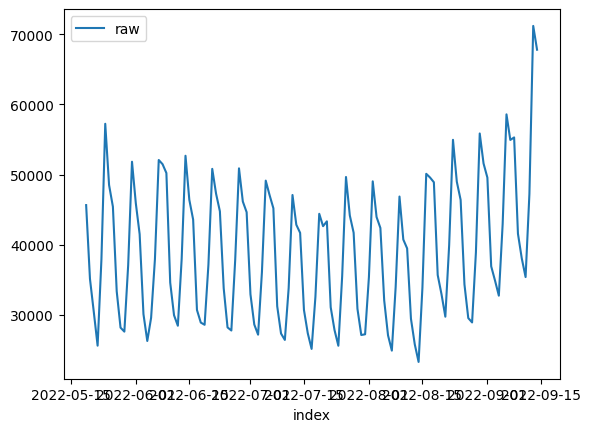

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:52<00:00,  1.05s/trial, best loss: 0.1928669974342921]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.92528931308402, 'LogTransformedStdErr': 0.10151681936354132, 'LogTransformedCILower': 10.758309004557322, 'LogTransformedCIUpper': 11.092269621610718, 'AdjustedActual': 64019.00000000005, 'Prediction': 55849.968497300266, 'StdErr': 5684.451888869774, 'CILower': 46499.877190661675, 'CIUpper': 65200.05980393886, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8493057053562143, 'DownAnomalyProbability': 0.07534714732189285, 'UpAnomalyProbability': 0.9246528526781072, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.79620

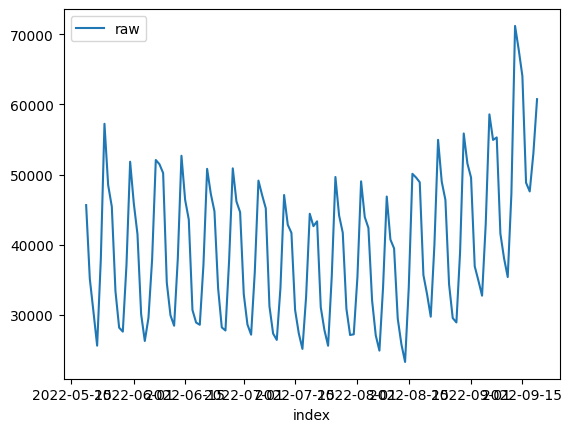

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:54<00:00,  1.10s/trial, best loss: 0.24568700993668022]
Prediction...
73660.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.207228765796126, 'LogTransformedPrediction': 11.092720661316616, 'LogTransformedStdErr': 0.11673573718665665, 'LogTransformedCILower': 10.90070746061029, 'LogTransformedCIUpper': 11.284733862022941, 'AdjustedActual': 73660.00000000003, 'Prediction': 66139.34994429839, 'StdErr': 7747.321107338412, 'CILower': 53396.14072173511, 'CIUpper': 78882.55916686167, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6683232330648172, 'DownAnomalyProbability': 0.1658383834675914, 'UpAnomalyProbability': 0.8341616165324086, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_rang

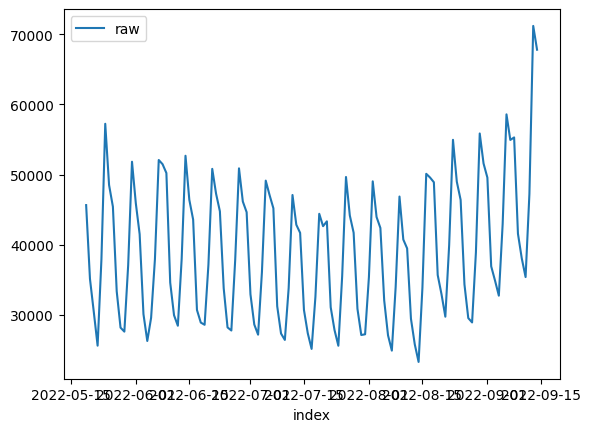

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:52<00:00,  1.05s/trial, best loss: 0.17823836748041236]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.970098203492997, 'LogTransformedStdErr': 0.1037522600467161, 'LogTransformedCILower': 10.799440922250744, 'LogTransformedCIUpper': 11.14075548473525, 'AdjustedActual': 64019.00000000005, 'Prediction': 58422.90803634097, 'StdErr': 6077.9617461129565, 'CILower': 48425.550613774765, 'CIUpper': 68420.26545890716, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6428025972619704, 'DownAnomalyProbability': 0.1785987013690148, 'UpAnomalyProbability': 0.8214012986309852, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.7962025

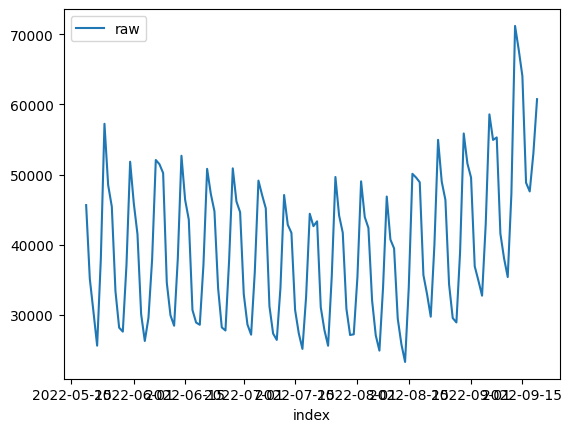

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:55<00:00,  1.11s/trial, best loss: 0.2705229456526319]
Prediction...
73660.0 2022-09-20
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.207228765796126, 'LogTransformedPrediction': 11.20218920119383, 'LogTransformedStdErr': 0.09096173006651902, 'LogTransformedCILower': 11.052570469580136, 'LogTransformedCIUpper': 11.351807932807525, 'AdjustedActual': 73660.00000000003, 'Prediction': 73593.54751986437, 'StdErr': 6708.158458954883, 'CILower': 62559.60874848723, 'CIUpper': 84627.48629124151, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.007903889133131559, 'DownAnomalyProbability': 0.4960480554334342, 'UpAnomalyProbability': 0.5039519445665658, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_ra

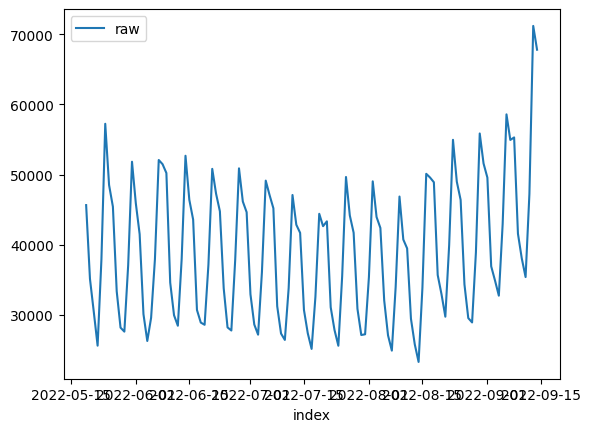

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:53<00:00,  1.07s/trial, best loss: 0.16155549917337267]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 11.036398376999442, 'LogTransformedStdErr': 0.054129292501971266, 'LogTransformedCILower': 10.947363613903256, 'LogTransformedCIUpper': 11.125433140095627, 'AdjustedActual': 64019.00000000005, 'Prediction': 62183.64399593496, 'StdErr': 3368.4778760008357, 'CILower': 56642.990944289195, 'CIUpper': 67724.29704758072, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.4141516508933474, 'DownAnomalyProbability': 0.2929241745533263, 'UpAnomalyProbability': 0.7070758254466737, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.7962

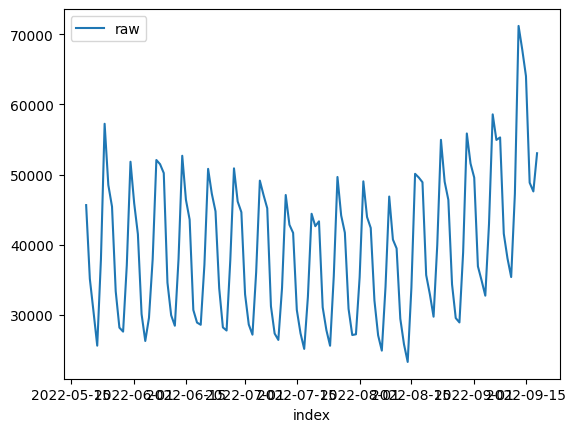

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:53<00:00,  1.07s/trial, best loss: 0.33563541775990424]
Prediction...
60740.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 60740.0, 'Prediction': 62168.12830626851, 'StdErr': 1649.869182479494, 'CILower': 59454.334997471655, 'CIUpper': 64881.92161506537, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6132909570775635, 'DownAnomalyProbability': 0.8066454785387818, 'UpAnomalyProbability': 0.1933545214612183, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_range': 4,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


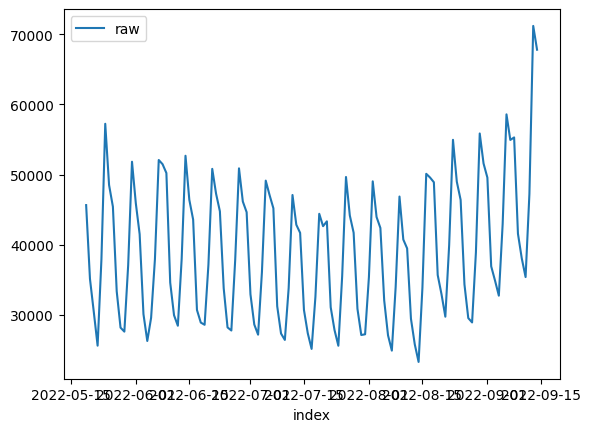

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:53<00:00,  1.07s/trial, best loss: 0.1595815732627692]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 11.006260822298483, 'LogTransformedStdErr': 0.056923617029851444, 'LogTransformedCILower': 10.912629804367736, 'LogTransformedCIUpper': 11.09989184022923, 'AdjustedActual': 64019.00000000005, 'Prediction': 60346.87238984721, 'StdErr': 3438.003839558899, 'CILower': 54691.85930487567, 'CIUpper': 66001.88547481876, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7145240311958361, 'DownAnomalyProbability': 0.14273798440208196, 'UpAnomalyProbability': 0.857262015597918, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.7962025

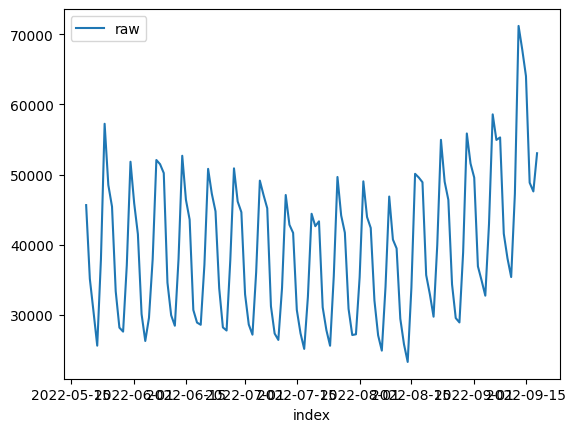

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:53<00:00,  1.07s/trial, best loss: 0.3175656121050917]
Prediction...
60740.0 2022-09-19
caso2
{'Success': True, 'IsLogTransformed': 0, 'AdjustedActual': 60740.0, 'Prediction': 59834.693252642195, 'StdErr': 2059.285445857528, 'CILower': 56447.47011809506, 'CIUpper': 63221.91638718933, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.339788941547678, 'DownAnomalyProbability': 0.330105529226161, 'UpAnomalyProbability': 0.669894470773839, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_range': 4,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


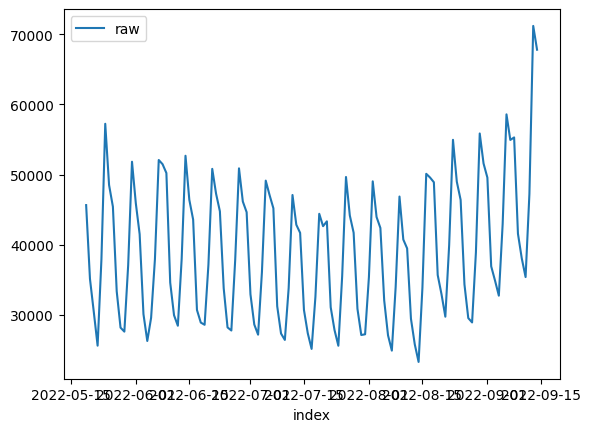

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:54<00:00,  1.09s/trial, best loss: 0.19835735796036866]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.909095833186727, 'LogTransformedStdErr': 0.10148393097671105, 'LogTransformedCILower': 10.742169621242391, 'LogTransformedCIUpper': 11.076022045131063, 'AdjustedActual': 64019.00000000005, 'Prediction': 54952.64701394748, 'StdErr': 5591.3021155171655, 'CILower': 45755.77344985763, 'CIUpper': 64149.52057803732, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8950917194546755, 'DownAnomalyProbability': 0.052454140272662264, 'UpAnomalyProbability': 0.9475458597273377, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.7962

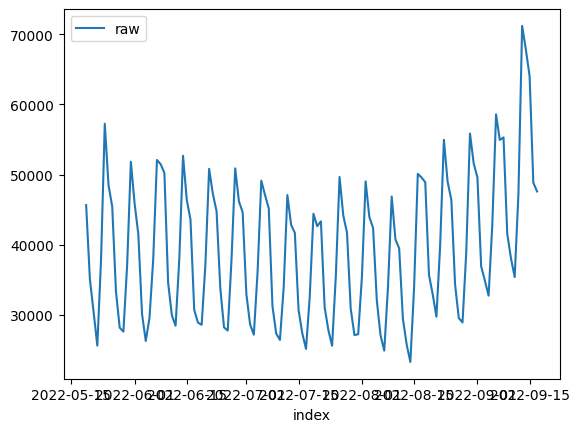

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:55<00:00,  1.10s/trial, best loss: 0.415570044096202]
Prediction...
53033.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.878688496289003, 'LogTransformedPrediction': 10.726584805221993, 'LogTransformedStdErr': 0.05170811787534654, 'LogTransformedCILower': 10.641532519991895, 'LogTransformedCIUpper': 10.811637090452091, 'AdjustedActual': 53033.00000000001, 'Prediction': 45610.797080501805, 'StdErr': 2360.0775562988533, 'CILower': 41728.81495213687, 'CIUpper': 49492.77920886674, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9983385518941097, 'DownAnomalyProbability': 0.0008307240529451532, 'UpAnomalyProbability': 0.9991692759470548, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days

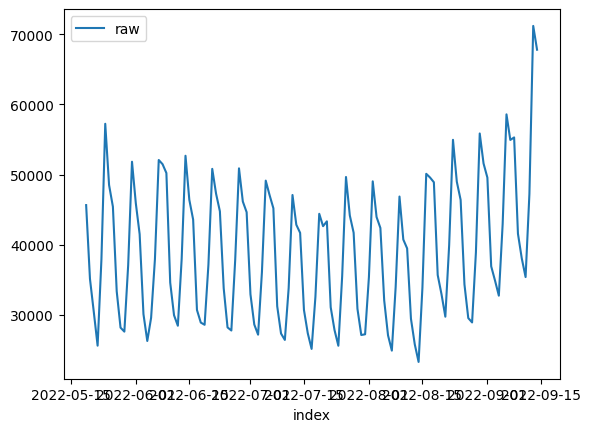

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:53<00:00,  1.07s/trial, best loss: 0.20439038723064143]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 11.054499554959504, 'LogTransformedStdErr': 0.043248621676790305, 'LogTransformedCILower': 10.983361902733783, 'LogTransformedCIUpper': 11.125637207185225, 'AdjustedActual': 64019.00000000005, 'Prediction': 63285.97220469084, 'StdErr': 2738.3547023946035, 'CILower': 58781.77954057746, 'CIUpper': 67790.16486880422, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.2110613845149376, 'DownAnomalyProbability': 0.3944693077425312, 'UpAnomalyProbability': 0.6055306922574688, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.79620

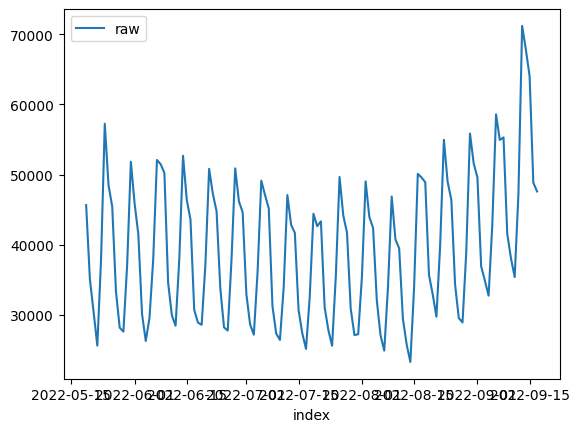

Training...

100%|█████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:52<00:00,  1.05s/trial, best loss: 0.380866286394288]
Prediction...
53033.0 2022-09-18
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.878688496289003, 'LogTransformedPrediction': 10.706043772765693, 'LogTransformedStdErr': 0.10798860680249452, 'LogTransformedCILower': 10.528418321197172, 'LogTransformedCIUpper': 10.883669224334213, 'AdjustedActual': 53033.00000000001, 'Prediction': 44884.70021929306, 'StdErr': 4861.309914575026, 'CILower': 36888.556974569176, 'CIUpper': 52880.84346401694, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9062917959017753, 'DownAnomalyProbability': 0.046854102049112334, 'UpAnomalyProbability': 0.9531458979508877, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_r

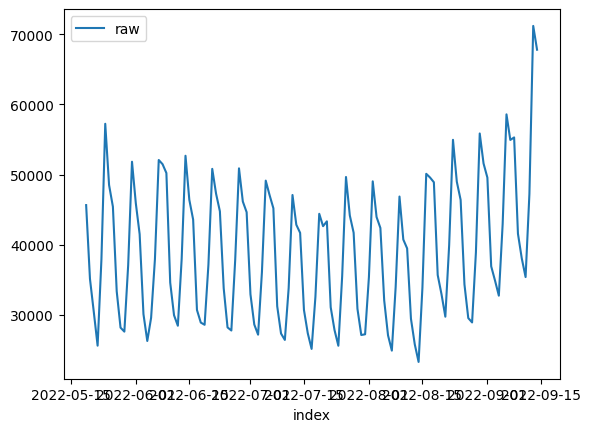

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:51<00:00,  1.04s/trial, best loss: 0.17978868680206567]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.92528931308402, 'LogTransformedStdErr': 0.10151681936354132, 'LogTransformedCILower': 10.758309004557322, 'LogTransformedCIUpper': 11.092269621610718, 'AdjustedActual': 64019.00000000005, 'Prediction': 55849.968497300266, 'StdErr': 5684.451888869774, 'CILower': 46499.877190661675, 'CIUpper': 65200.05980393886, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8493057053562143, 'DownAnomalyProbability': 0.07534714732189285, 'UpAnomalyProbability': 0.9246528526781072, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.79620

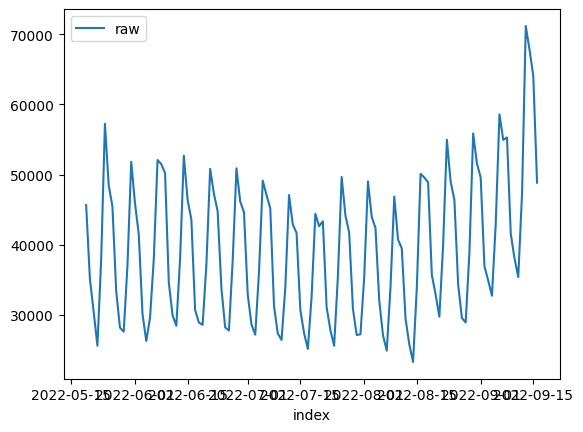

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:46<00:00,  1.08trial/s, best loss: 1e+100]
Prediction...
47590.0 2022-09-17
caso1
{'Success': True, 'AdjustedActual': 13941.0, 'ConfLevel': 90.0, 'Prediction': 33860.364248966056, 'PredStdErr': 6080.656806118507, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6153367539927923, 'DownAnomalyProbability': 0.19233162300360385, 'UpAnomalyProbability': 0.8076683769963962, 'NonStationarityDiffOrder': 2, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_range': 6,
 'param_is_log': False,
 'param_weekly_model': True}
Loading...


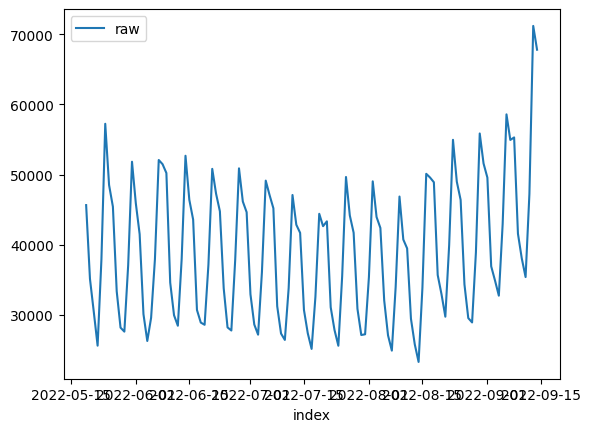

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:53<00:00,  1.06s/trial, best loss: 0.20300995303229244]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.904605375911007, 'LogTransformedStdErr': 0.09058980607045049, 'LogTransformedCILower': 10.755598404831197, 'LogTransformedCIUpper': 11.053612346990818, 'AdjustedActual': 64019.00000000005, 'Prediction': 54649.22618524664, 'StdErr': 4960.927884199968, 'CILower': 46489.22596187563, 'CIUpper': 62809.22640861765, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9410698347371729, 'DownAnomalyProbability': 0.029465082631413564, 'UpAnomalyProbability': 0.9705349173685864, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.796202

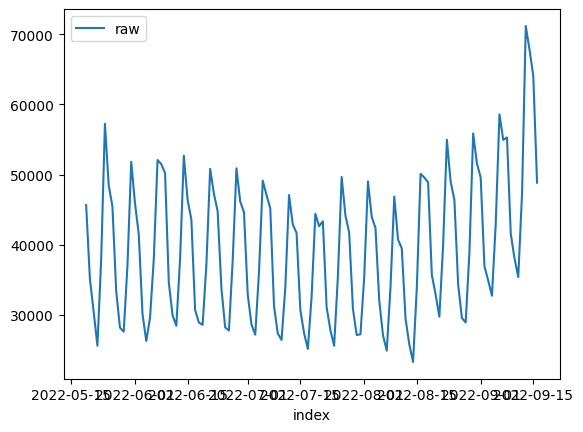

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:43<00:00,  1.16trial/s, best loss: 1e+100]
Prediction...
47590.0 2022-09-17
caso1
{'Success': True, 'AdjustedActual': 0.27755061731211295, 'ConfLevel': 90.0, 'Prediction': 40142.45166822486, 'PredStdErr': 9208.720106525068, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.7791658627049938, 'DownAnomalyProbability': 0.11041706864750311, 'UpAnomalyProbability': 0.8895829313524969, 'NonStationarityDiffOrder': 2, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_range': 6,
 'param_is_log': True,
 'param_weekly_model': True}
Loading...


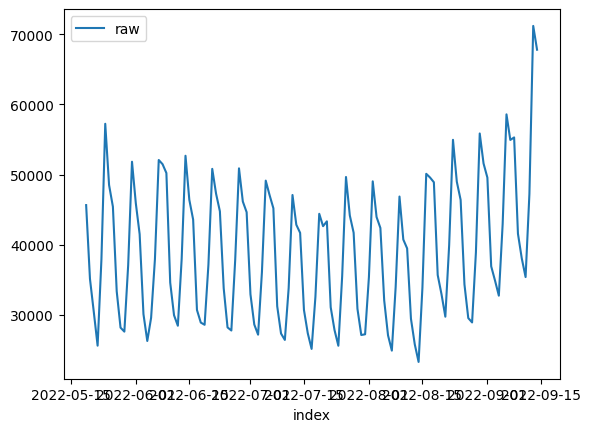

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:53<00:00,  1.07s/trial, best loss: 0.1878655786854575]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.972649078421677, 'LogTransformedStdErr': 0.09326180409693935, 'LogTransformedCILower': 10.819247061696789, 'LogTransformedCIUpper': 11.126051095146565, 'AdjustedActual': 64019.00000000005, 'Prediction': 58511.63310819318, 'StdErr': 5468.881166683755, 'CILower': 49516.124085806805, 'CIUpper': 67507.14213057955, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.6860831121498854, 'DownAnomalyProbability': 0.1569584439250573, 'UpAnomalyProbability': 0.8430415560749427, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.796202

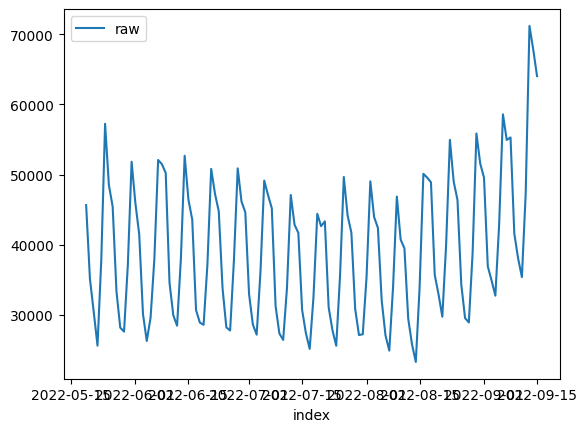

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:51<00:00,  1.04s/trial, best loss: 0.2841554138054914]
Prediction...
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.796202547881578, 'LogTransformedPrediction': 10.712466275111677, 'LogTransformedStdErr': 0.10430382406595498, 'LogTransformedCILower': 10.540901751791882, 'LogTransformedCIUpper': 10.884030798431471, 'AdjustedActual': 48834.00000000001, 'Prediction': 45156.24084015123, 'StdErr': 4722.912546271432, 'CILower': 37387.74100864205, 'CIUpper': 52924.74067166041, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.563846932227946, 'DownAnomalyProbability': 0.218076533886027, 'UpAnomalyProbability': 0.781923466113973, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_range'

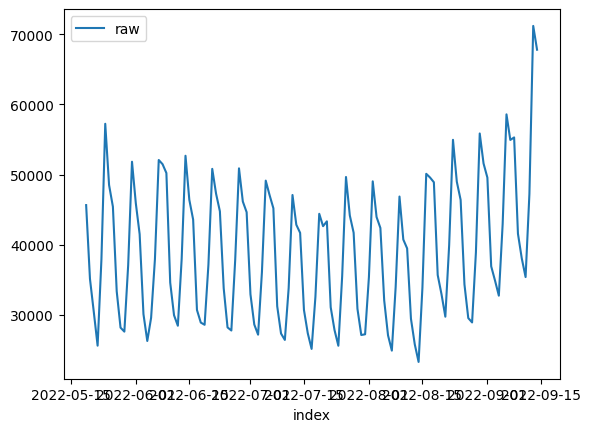

Training...

100%|███████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:51<00:00,  1.03s/trial, best loss: 0.19529536279840193]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.92528931308402, 'LogTransformedStdErr': 0.10151681936354132, 'LogTransformedCILower': 10.758309004557322, 'LogTransformedCIUpper': 11.092269621610718, 'AdjustedActual': 64019.00000000005, 'Prediction': 55849.968497300266, 'StdErr': 5684.451888869774, 'CILower': 46499.877190661675, 'CIUpper': 65200.05980393886, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.8493057053562143, 'DownAnomalyProbability': 0.07534714732189285, 'UpAnomalyProbability': 0.9246528526781072, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.79620

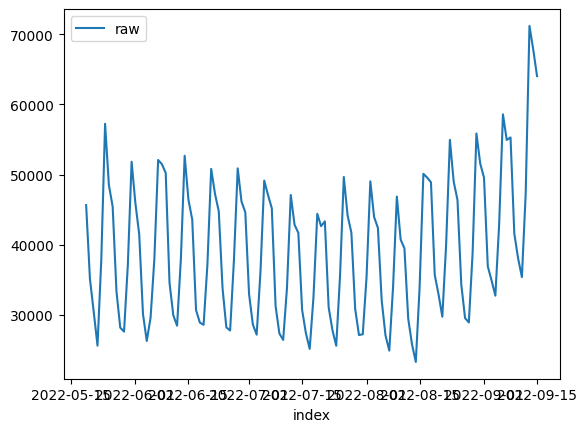

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:53<00:00,  1.06s/trial, best loss: 0.3246535204403287]
Prediction...
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.796202547881578, 'LogTransformedPrediction': 10.762371939454098, 'LogTransformedStdErr': 0.08130540961635352, 'LogTransformedCILower': 10.628636441555864, 'LogTransformedCIUpper': 10.896107437352333, 'AdjustedActual': 48834.00000000001, 'Prediction': 47365.81818593446, 'StdErr': 3857.5519498987924, 'CILower': 41020.70986998971, 'CIUpper': 53710.926501879214, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': False, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.29649944580969256, 'DownAnomalyProbability': 0.3517502770951537, 'UpAnomalyProbability': 0.6482497229048463, 'ModelFreshness': 0.1}
{'dataset_path': PosixPath('data/v2_distincts/ts_data/full_name=silver.workout_analytics'),
 'param_days_

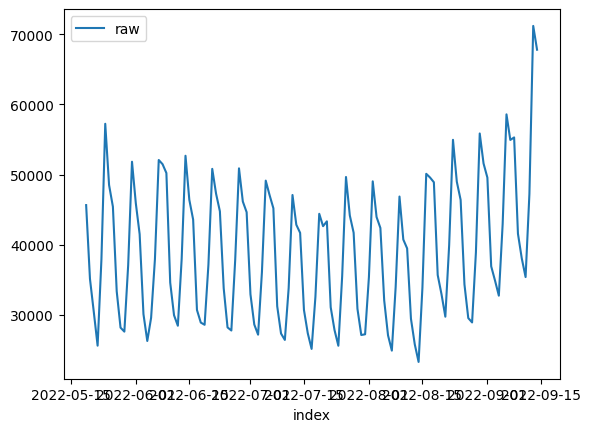

Training...

100%|████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:50<00:00,  1.01s/trial, best loss: 0.1975426830159242]
Prediction...
64019.0 2022-09-15
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 11.066950813523855, 'LogTransformedPrediction': 10.90011426357699, 'LogTransformedStdErr': 0.09879489015462689, 'LogTransformedCILower': 10.737611130181879, 'LogTransformedCIUpper': 11.062617396972101, 'AdjustedActual': 64019.00000000005, 'Prediction': 54446.62332985569, 'StdErr': 5392.299392552748, 'CILower': 45577.08011640709, 'CIUpper': 63316.166543304294, 'ConfLevel': 90.0, 'ExogenousHolidays': 0, 'IsAnomaly': True, 'IsAnomalyExtreme': False, 'AnomalyProbability': 0.9241341136483552, 'DownAnomalyProbability': 0.03793294317582241, 'UpAnomalyProbability': 0.9620670568241776, 'ModelFreshness': 0.1}
48834.0 2022-09-16
caso2
{'Success': True, 'IsLogTransformed': 1, 'LogTransformedAdjustedActual': 10.7962025

In [8]:
for param in tqdm(PARAM_LIST):
    run(**param)

In [9]:
# for param in all_results:
#     dump_results(param)

---

In [10]:
from operator import itemgetter

In [11]:
def load_result(path):
    prediction_ds = pd.read_csv(path / "prediction.csv.gz")
    if 'Unnamed: 0' in prediction_ds.columns:
        prediction_ds = prediction_ds.drop(columns=["Unnamed: 0"]).loc[:, "0"]
    
    return {
        "params": loads((path / "params.json").read_text()),
        "past": pd.read_parquet(path / "past_df.parquet"),
        "today": pd.read_parquet(path / "today_df.parquet"),
        "model_obj": load((path / "model.pkl").open("rb")),
        "prediction": prediction_ds,
    }

In [12]:
all_results = list(map(load_result, OUTPUT_PATH.iterdir()))

In [13]:
filtered_results_df = pd.DataFrame.from_dict(list(map(itemgetter('params'), all_results)))
filtered_results_df['prediction'] = list(map(itemgetter('prediction'), all_results))
filtered_results_df['dataset'] = filtered_results_df['dataset_path'].str.split("=").str[-1]
filtered_results_df['prediction_OK_counts'] = filtered_results_df['prediction'].apply(lambda x: x.value_counts().to_dict().get("DATA OK", 0))
filtered_results_df

,dataset_path,param_days_range,param_is_log,param_weekly_model,prediction,dataset,prediction_OK_counts
0,data/v2_distincts/ts_data/full_name=silver.act...,6,True,False,"0 DATA OK Name: 0, dtype: object",silver.activity_powercurve,1
1,data/v2_distincts/ts_data/full_name=silver.gro...,6,True,False,"0 DATA OK Name: 0, dtype: object",silver.groupride_signup,1
2,data/v2_distincts/ts_data/full_name=silver.act...,6,True,False,"0 DATA OK Name: 0, dtype: object",silver.activity_saved,1
3,data/v2_distincts/ts_data/full_name=silver.tra...,3,True,True,0 DATA OK 1 DATA OK 2 ...,silver.training_plans,7
4,data/v2_distincts/ts_data/full_name=silver.seg...,6,True,False,"0 DATA OK Name: 0, dtype: object",silver.segment_result,1
...,...,...,...,...,...,...,...
303,data/v2_distincts/ts_data/full_name=silver.sub...,7,False,False,"0 DATA OK Name: 0, dtype: object",silver.subscription,1
304,data/v2_distincts/ts_data/full_name=silver.new...,5,True,True,0 DATA OK 1 DATA OK 2 DATA OK 3 DA...,silver.new_user_sport_select,8
305,data/v2_distincts/ts_data/full_name=silver.new...,4,False,False,"0 DATA OK Name: 0, dtype: object",silver.new_user_sport_select,1
306,data/v2_distincts/ts_data/full_name=silver.act...,7,False,True,0 DATA OK 1 DATA OK 2 ...,silver.activity_powercurve,7


In [14]:
filtered_results_df.pivot_table(index=["dataset", 'param_weekly_model', 'param_is_log', 'param_is_log'], columns=['prediction_OK_counts'], aggfunc=len)['prediction'].fillna("")

prediction_OK_counts                                                         0  \
dataset                      param_weekly_model param_is_log param_is_log        
silver.activity_powercurve   False              False        False         1.0   
                                                True         True          2.0   
                             True               False        False               
                                                True         True                
silver.activity_saved        False              False        False         2.0   
                                                True         True                
                             True               False        False               
                                                True         True                
silver.campaign_progress     False              False        False               
                                                True         True                
                             True               False        False         3.0   
                                                True         True          1.0   
silver.groupride_signup      False              False        False               
                                                True         True                
                             True               False        False               
                                                True         True                
silver.meetup                False              False        False               
                                                True         True          2.0   
                             True               False        False               
                                                True         True                
silver.new_user_sport_select False              False        False         1.0   
                                                True         True          1.0   
                             True               False        False               
                                                True         True                
silver.segment_log_out       False              False        False               
                                                True         True          1.0   
                             True               False        False               
                                                True         True                
silver.segment_result        False              False        False               
                                                True         True          3.0   
                             True               False        False               
                                                True         True                
silver.subscription          False              False        False         2.0   
                                                True         True          2.0   
                             True               False        False               
                                                True         True                
silver.training_plans        False              False        False               
                                                True         True                
                             True               False        False               
                                                True         True          2.0   
silver.workout_analytics     False              False        False         3.0   
                                                True         True          3.0   
                             True               False        False               
                                                True         True                

prediction_OK_counts                                                         1  \
dataset                      param_weekly_model param_is_log param_is_log        
silver.activity_powercurve   False              False        Fa

In [15]:
filtered_results_df.pivot_table(index=["dataset", 'param_is_log', 'param_weekly_model'], columns=['prediction_OK_counts'], aggfunc=len)['prediction'].fillna("")

prediction_OK_counts                                            0    1    2  \
dataset                      param_is_log param_weekly_model                  
silver.activity_powercurve   False        False               1.0  6.0        
                                          True                                
                             True         False               2.0  5.0        
                                          True                                
silver.activity_saved        False        False               2.0  5.0        
                                          True                                
                             True         False                    7.0        
                                          True                                
silver.campaign_progress     False        False                    7.0        
                                          True                3.0       1.0   
                             True         False                    7.0        
                                          True                1.0             
silver.groupride_signup      False        False                    7.0        
                                          True                                
                             True         False                    7.0        
                                          True                                
silver.meetup                False        False                    7.0        
                                          True                                
                             True         False               2.0  5.0        
                                          True                                
silver.new_user_sport_select False        False               1.0  6.0        
                                          True                                
                             True         False               1.0  6.0        
                                          True                                
silver.segment_log_out       False        False                    7.0        
                                          True                                
                             True         False               1.0  6.0        
                                          True                          1.0   
silver.segment_result        False        False                    7.0        
                                          True                                
                             True         False               3.0  4.0        
                                          True                                
silver.subscription          False        False               2.0  5.0        
                                          True                                
                             True         False               2.0  5.0        
                                          True                                
silver.training_plans        False        False                    7.0        
                                          True                                
                             True         False                    7.0        
                                          True                2.0             
silver.workout_analytics     False        False               3.0  4.0        
                                          True                                
                             True         False               3.0  4.0        
                                          True                                

prediction_OK_counts                                            3    4    5  \
dataset                      param_is_log param_weekly_model                  
silver.activity_powercurve   False        False                               
                                          True                                
                             True         False  

### Insights

- sparse tables work better with daily models, while perennial ones work better with weekly models
- log transformations usually helps